# Matplotlib

In [1]:
from matplotlib import pyplot as plt

In [2]:
x = [10, 20, 30, 40]
y = [0, 15, 10, 25]

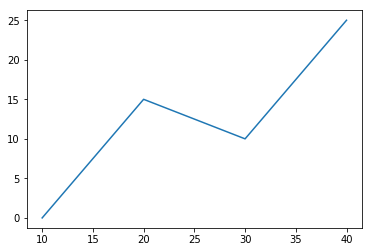

In [3]:
plt.plot(x, y);

# Seaborn

\#1. Seaborn updates `matplotlib`'s rc parameters to improve aesthetics

In [4]:
import seaborn as sns

In [5]:
sns.set() 

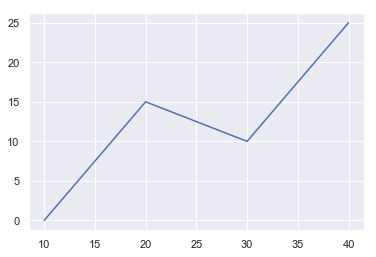

In [6]:
plt.plot(x, y);

In [7]:
# Revert back to matplotlib style
sns.set_style("white")

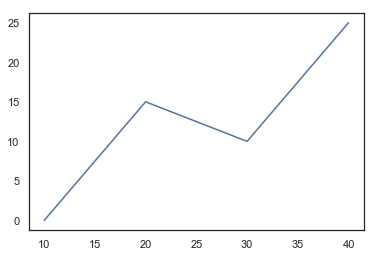

In [8]:
plt.plot(x, y);

#### Versions

In [9]:
import matplotlib
matplotlib.__version__

'3.0.3'

In [10]:
sns.__version__

'0.9.0'

## Seaborn with `pandas`

\#2. Let Seaborn group, aggregate, and plot your `pandas` dataframes

In [11]:
cars = sns.load_dataset('mpg')

In [12]:
type(cars)

pandas.core.frame.DataFrame

In [13]:
cars.dropna(inplace=True)

cars.shape

(392, 9)

In [14]:
cars.head()

,mpg,cylinders,displacement,horsepower,weight,acceleration,model_year,origin,name
0,18.0,8,307.0,130.0,3504,12.0,70,usa,chevrolet chevelle malibu
1,15.0,8,350.0,165.0,3693,11.5,70,usa,buick skylark 320
2,18.0,8,318.0,150.0,3436,11.0,70,usa,plymouth satellite
3,16.0,8,304.0,150.0,3433,12.0,70,usa,amc rebel sst
4,17.0,8,302.0,140.0,3449,10.5,70,usa,ford torino


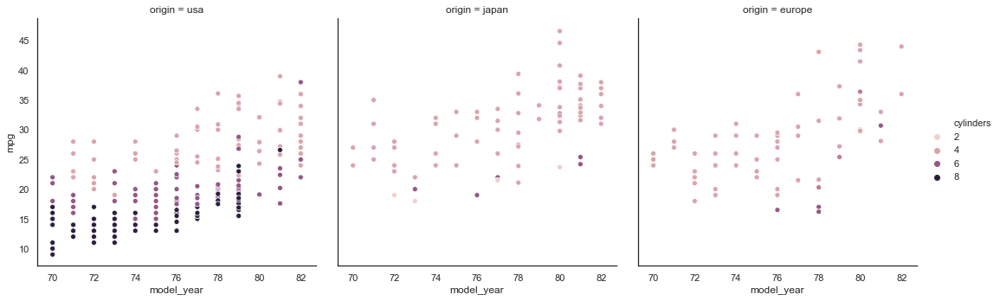

In [15]:
sns.relplot(x='model_year', y='mpg', col='origin', hue='cylinders', 
            data=cars);

## More Examples

\#3. Seaborn allows for additional plot types and easy plotting functionality

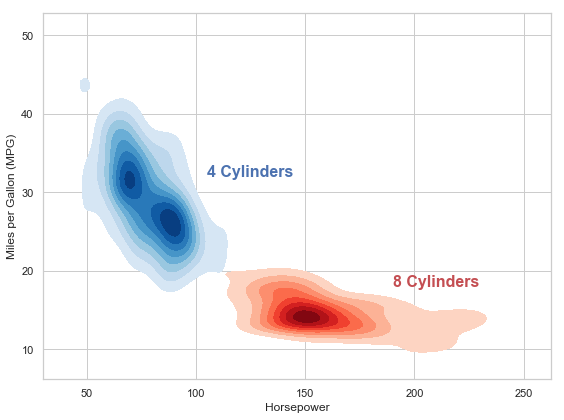

In [16]:
sns.set_style('whitegrid')

cyl_4 = cars[cars.cylinders==4]
cyl_8 = cars[cars.cylinders==8]

plt.figure(figsize=(8,6))

sns.kdeplot(cyl_4.horsepower, cyl_4.mpg,
            cmap="Blues", shade=True, shade_lowest=False)
sns.kdeplot(cyl_8.horsepower, cyl_8.mpg,
            cmap="Reds", shade=True, shade_lowest=False)

plt.xlabel('Horsepower')
plt.ylabel('Miles per Gallon (MPG)')

plt.annotate("4 Cylinders", (105, 32), color='b', fontsize=16, fontweight='bold')
plt.annotate("8 Cylinders", (190, 18), color='r', fontsize=16, fontweight='bold')
plt.tight_layout()

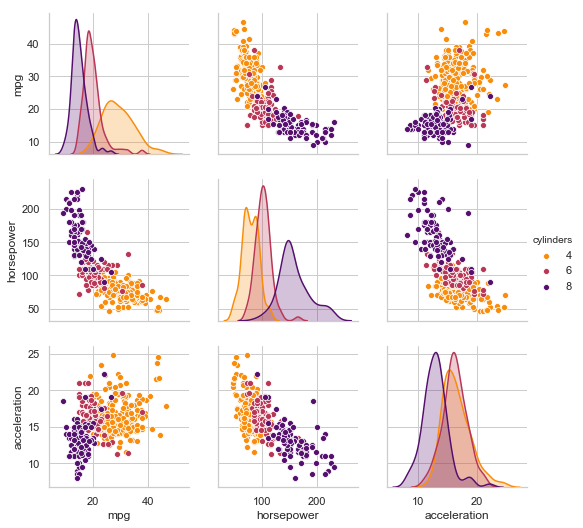

In [17]:
sns.pairplot(cars[cars.cylinders.isin([4,6,8])], 
             hue='cylinders', 
             vars=['mpg', 'horsepower', 'acceleration'], 
             palette='inferno_r'
            );

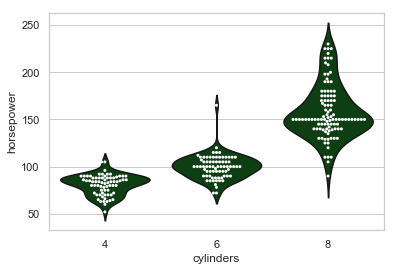

In [18]:
usa = cars[cars.origin == 'usa']

sns.violinplot(x=usa.cylinders, y=usa.horsepower,
               scale='width', inner=None, color='xkcd:forest green'
              )
sns.swarmplot(x=usa.cylinders, y=usa.horsepower,
              color='white', size=3
             );

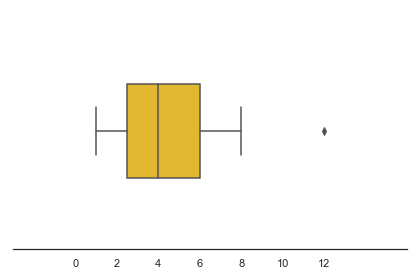

In [19]:
sns.set_style('white')
pts = [1, 1.5, (7/3), 3, 3.75, 4.25, 5, 19/3, 8, 12]

plt.figure(figsize=(6,4))
sns.boxplot(pts, color='xkcd:golden yellow', width=0.4)
sns.despine(left=True)
plt.xlim(-3, 16)
plt.xticks(range(0,13,2))
plt.tight_layout();

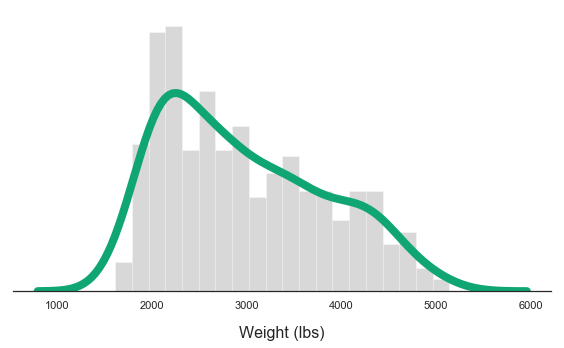

In [20]:
plt.figure(figsize=(8,5))
sns.distplot(cars.weight, 
             bins=20,
             kde_kws={"lw": 8, 'color':'xkcd:bluish green'},
             hist_kws={'alpha': 0.3, 'color':'gray'}
            )

sns.despine(left=True)
plt.xlabel('Weight (lbs)', fontsize=16, labelpad=15)
plt.yticks([])
plt.tight_layout();

<Figure size 576x432 with 0 Axes>

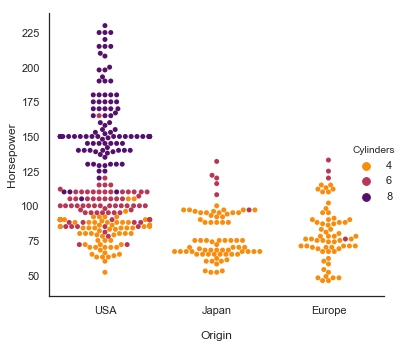

In [21]:
plt.figure(figsize=(8,6))
g = sns.catplot(x='origin', y='horsepower', hue='cylinders', 
                kind='swarm', 
                palette=sns.color_palette('inferno_r', 3,),
                data=cars[cars.cylinders.isin([4, 6, 8])]
               )

plt.xlabel('\nOrigin')
plt.ylabel('Horsepower')
plt.gca().set_xticklabels(['USA', 'Japan', 'Europe'])
g._legend.set_title('Cylinders')
plt.tight_layout();

# Seaborn: KDEplot

In [24]:
from matplotlib import pyplot as plt
import seaborn as sns

In [25]:
cars = sns.load_dataset('mpg').dropna()

cars.shape

(392, 9)

In [26]:
cars.head()

,mpg,cylinders,displacement,horsepower,weight,acceleration,model_year,origin,name
0,18.0,8,307.0,130.0,3504,12.0,70,usa,chevrolet chevelle malibu
1,15.0,8,350.0,165.0,3693,11.5,70,usa,buick skylark 320
2,18.0,8,318.0,150.0,3436,11.0,70,usa,plymouth satellite
3,16.0,8,304.0,150.0,3433,12.0,70,usa,amc rebel sst
4,17.0,8,302.0,140.0,3449,10.5,70,usa,ford torino


## Intro Visuals

In [27]:
hp = cars.horsepower

In [28]:
sns.set_style('white')
plt.rc('xtick', labelsize=14)
plt.rc('ytick', labelsize=14)

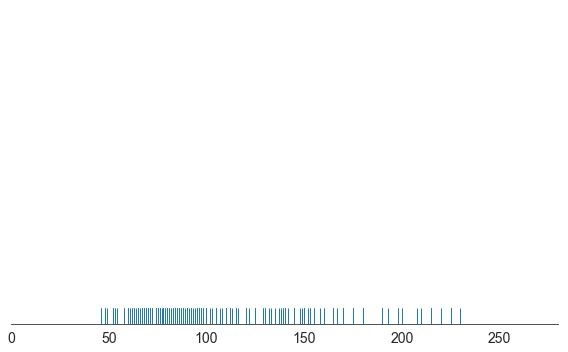

In [29]:
plt.figure(figsize=(8,5))
sns.distplot(hp, rug=True, kde=False, hist=False)

sns.despine(left=True)
plt.xlim(0, 280)
plt.xlabel('')
plt.yticks([])
plt.tight_layout();

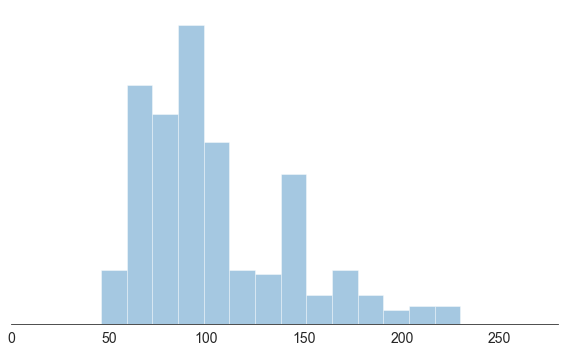

In [30]:
plt.figure(figsize=(8,5))
sns.distplot(hp, kde=False)

sns.despine(left=True)
plt.xlim(0, 280)
plt.xlabel('')
plt.yticks([])
plt.tight_layout();

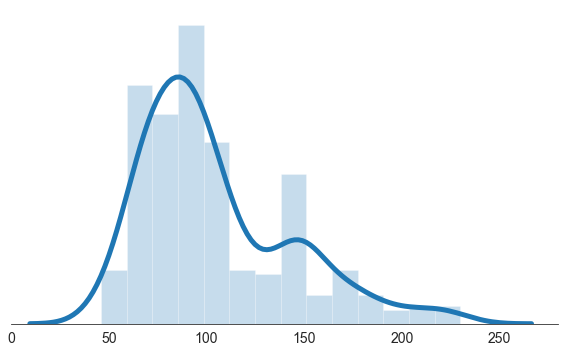

In [31]:
plt.figure(figsize=(8,5))
sns.distplot(hp, kde_kws={"lw": 5}, hist_kws={'alpha': 0.25})

sns.despine(left=True)
plt.xlim(0, 280)
plt.xlabel('')
plt.yticks([])
plt.tight_layout();

## "How It Works" Visuals

In [32]:
import numpy as np
import scipy.stats as stats

In [33]:
blue, orange, green, red = sns.color_palette()[:4]

In [34]:
pts = [1, 3, 3.5, 4, 6, 8]

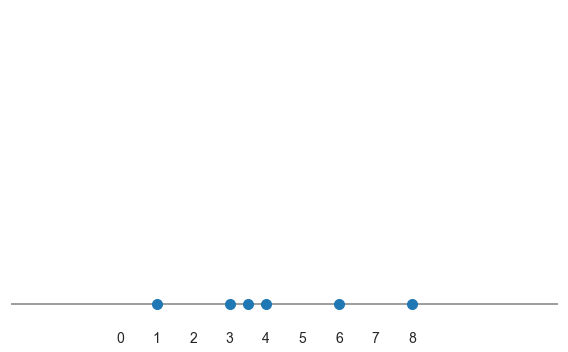

In [35]:
plt.figure(figsize=(8, 5))
plt.scatter(pts, [0]*len(pts), s=100, zorder=1)
plt.axhline(0, color='gray', zorder=0)
plt.ylim(-0.1, 1.5)
plt.xlim(-3, 12)
plt.box(False)
plt.xticks(range(9))
plt.yticks([])
plt.tight_layout();

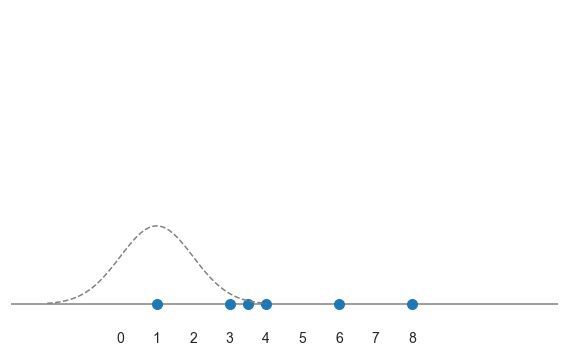

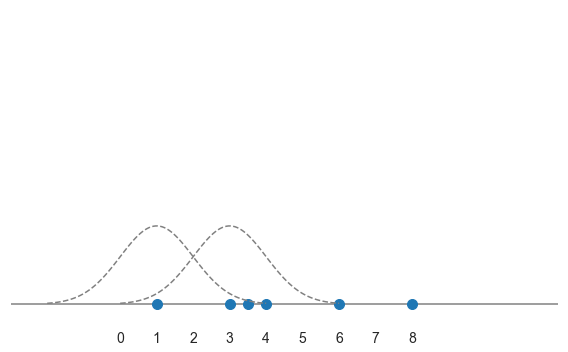

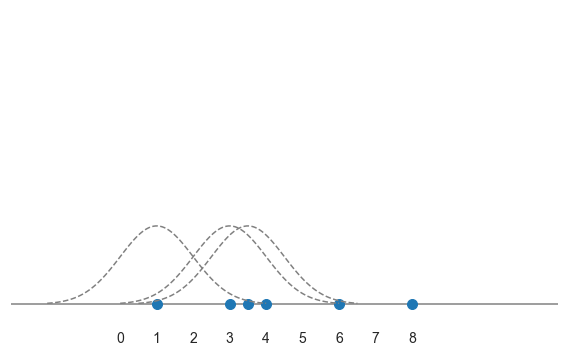

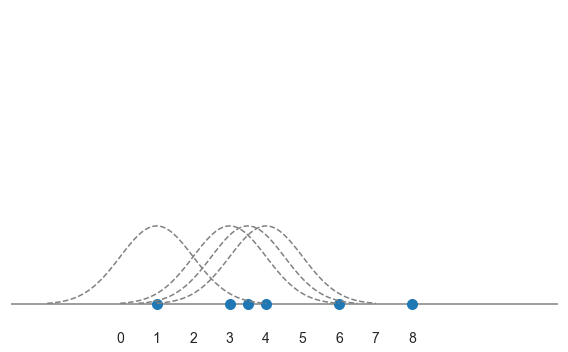

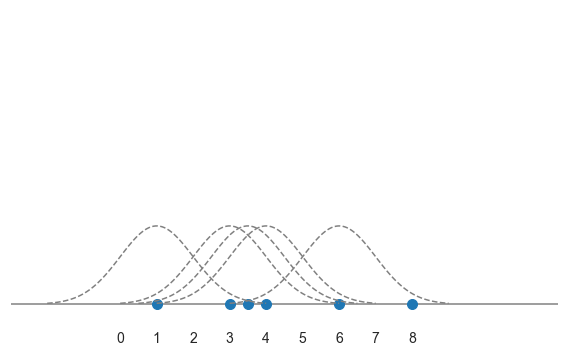

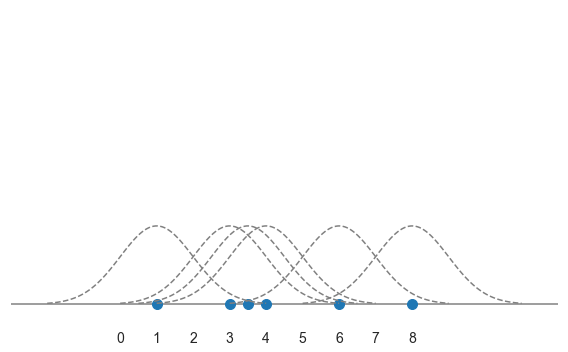

In [36]:
for i in range(len(pts)):
    plt.figure(figsize=(8, 5))
    for point in pts[0:i+1]:
        mu = point
        variance = 1
        sigma = np.sqrt(variance)
        x = np.linspace(mu - 3*sigma, mu + 3*sigma, 100)
        plt.plot(x, stats.norm.pdf(x, mu, sigma), linestyle='--', color='gray', zorder=2)
    plt.scatter(pts, [0]*len(pts), s=100, zorder=1)
    plt.axhline(0, color='gray', zorder=0)
    plt.xlim(-3, 12)
    plt.ylim(-0.1, 1.5)
    plt.box(False)
    plt.xticks(range(9))
    plt.yticks([])
    plt.tight_layout();
    #plt.savefig(f'02KDE_kernel{i}.svg');

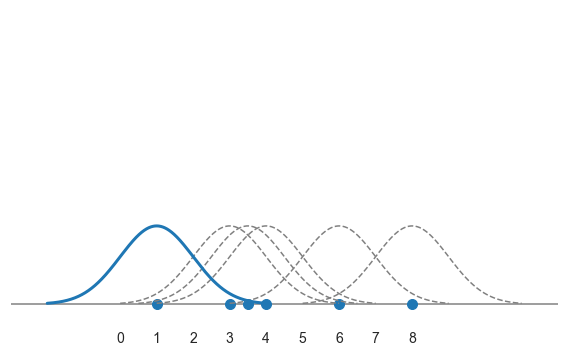

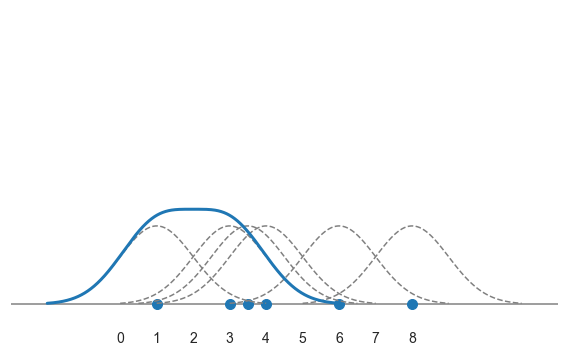

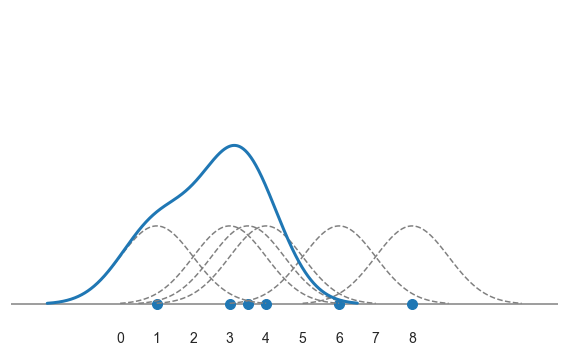

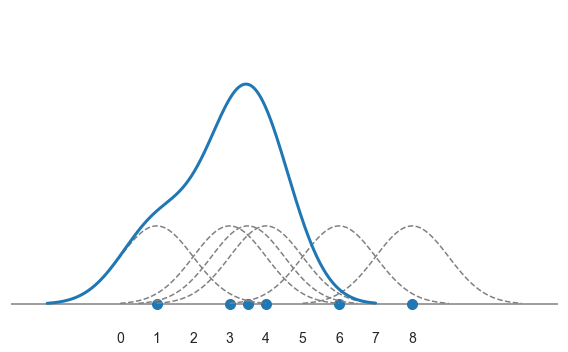

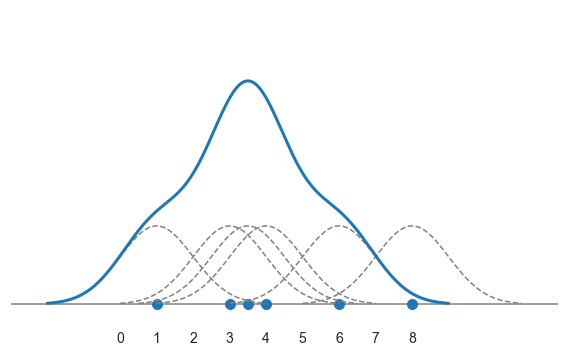

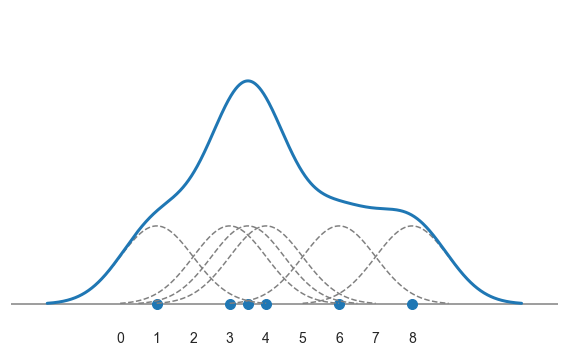

In [37]:
for i in range(1, len(pts)+1):
    plt.figure(figsize=(8, 5))
    for point in pts[0:len(pts)+1]:
        mu = point
        variance = 1
        sigma = np.sqrt(variance)
        x = np.linspace(mu - 3*sigma, mu + 3*sigma, 100)
        plt.plot(x, stats.norm.pdf(x, mu, sigma), linestyle='--', color='gray', zorder=2)
    plt.scatter(pts, [0]*len(pts), s=100, zorder=1)
    plt.axhline(0, color='gray', zorder=0)

    total_x = np.linspace(pts[0] - 3*sigma, pts[i-1] + 3*sigma, 1000)
    total = sum([stats.norm.pdf(total_x, pts[j], sigma) for j in range(i)])
    plt.plot(total_x, total, color=blue, lw=3)
    plt.xlim(-3, 12)
    plt.ylim(-0.1, 1.5)
    plt.box(False)
    plt.xticks(range(9))
    plt.yticks([])
    plt.tight_layout();
    #plt.savefig(f'02KDE_addkernel{i}.svg');

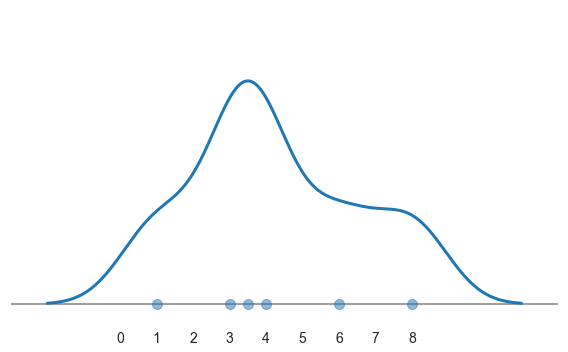

In [38]:
plt.figure(figsize=(8,5))
plt.plot(total_x, total, color=blue, lw=3)
plt.scatter(pts, [0]*len(pts), s=100, zorder=1, alpha=0.5)
plt.axhline(0, color='gray', zorder=0)
plt.xlim(-3, 12)
plt.ylim(-0.1, 1.5)
plt.box(False)
plt.xticks(range(9))
plt.yticks([])
plt.tight_layout();

### Other Kernels

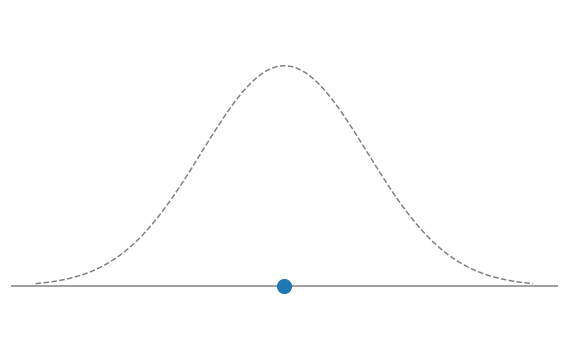

In [39]:
plt.figure(figsize=(8, 5))

mu = pts[3]
variance = 1
sigma = np.sqrt(variance)
x = np.linspace(mu - 3*sigma, mu + 3*sigma, 100)
plt.plot(x, stats.norm.pdf(x, mu, sigma), linestyle='--', color='gray', zorder=2)

plt.scatter(pts[3], [0], s=200, zorder=1)
plt.axhline(0, color='gray', zorder=0)
plt.ylim(-0.1, .5)
plt.box(False)
plt.xticks([])
plt.yticks([])
plt.tight_layout();

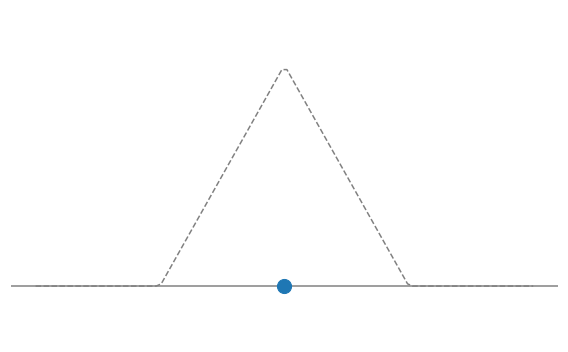

In [41]:
plt.figure(figsize=(8, 5))

def build_tri_kernel(x, center=0, sigma=1):
    m = 0.4/sigma
    if x < (center-sigma):
        return 0
    elif x < center:
        return m*x + m*(sigma-center)
    elif x < (center+sigma):
        return -m*x + m*(sigma + center)
    else:
        return 0  

mu = pts[3]
variance = 1
sigma = np.sqrt(variance)
x = np.linspace(mu - 3*sigma, mu + 3*sigma, 100)
plt.plot(x, [build_tri_kernel(val, center=mu, sigma=1.5) for val in x], 
         linestyle='--', color='gray', zorder=2)
plt.scatter(pts[3], [0], s=200, zorder=1)
plt.axhline(0, color='gray', zorder=0)
plt.ylim(-0.1, .5)
plt.box(False)
plt.xticks([])
plt.yticks([])
plt.tight_layout();

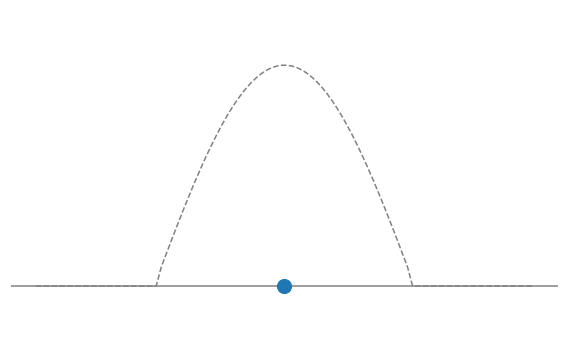

In [42]:
plt.figure(figsize=(8, 5))

def build_cos_kernel(x, center=0, sigma=1):
    if np.abs(x - center) < sigma:
        return 0.4*np.cos(x-center)
    else:
        return 0  

mu = pts[3]
variance = 1
sigma = np.sqrt(variance)
x = np.linspace(mu - 3*sigma, mu + 3*sigma, 100)
plt.plot(x, [build_cos_kernel(val, center=mu, sigma=1.5) for val in x], 
         linestyle='--', color='gray', zorder=2)
plt.scatter(pts[3], [0], s=200, zorder=1)
plt.axhline(0, color='gray', zorder=0)
plt.ylim(-0.1, .5)
plt.box(False)
plt.xticks([])
plt.yticks([])
plt.tight_layout();

## Univariate (1D)

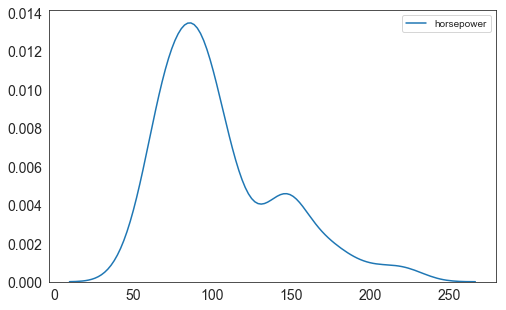

In [43]:
sns.kdeplot(cars.horsepower);

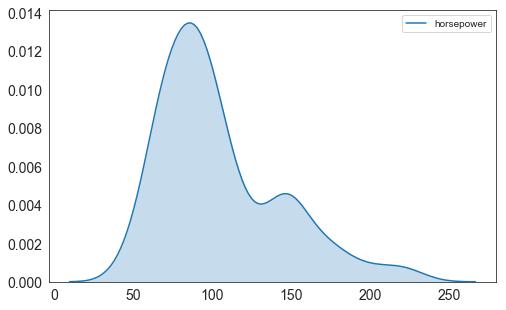

In [44]:
# Shading to the underlying plot
sns.kdeplot(cars.horsepower, shade=True);

###  Bandwidth makes significant changes to KDE Plot:
- Decreasing the BW:
    - More Jagged peaks(pointy)
    - Increasing Variance of the KDE

- Increasing the BW:
    - Smoother Curve
    - Loss out on modes in Data Set

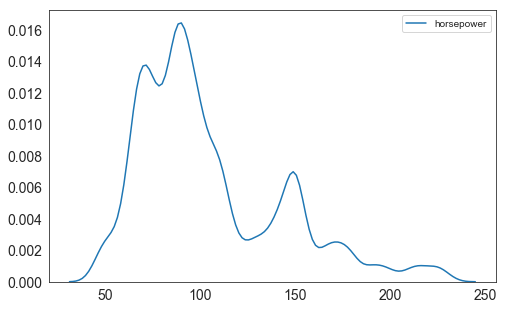

In [45]:

sns.kdeplot(cars.horsepower, bw=5);

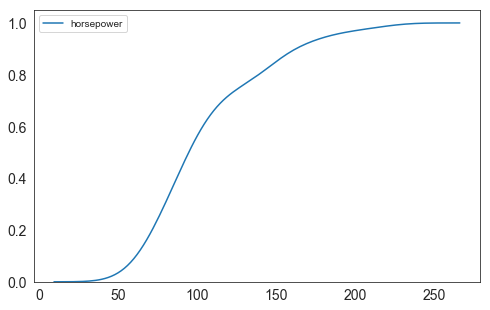

In [46]:
sns.kdeplot(cars.horsepower, cumulative=True);

### Bandwidth Widget

In [47]:
from ipywidgets import interact, interactive, HBox, VBox, interactive_output

from IPython.display import display

In [48]:
def bandwidth_widget(bw=10):
    sns.kdeplot(cars.horsepower, bw=bw, lw=3, shade=True)
    plt.xlim(-30, 300)
    plt.ylim(0, 0.03)

In [49]:
interactive(bandwidth_widget, bw=(1, 30, 1))

interactive(children=(IntSlider(value=10, description='bw', max=30, min=1), Output()), _dom_classes=('widget-i…

## Bivariate (2D)

### Bivariate Intro

In [50]:
sns.set_style('darkgrid')

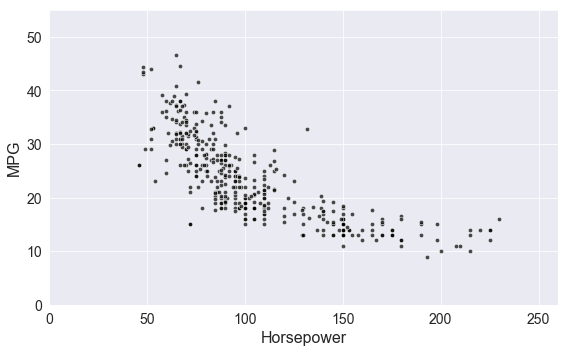

In [53]:
#sns.kdeplot(cars.horsepower, cars.mpg)
sns.scatterplot(cars.horsepower, cars.mpg, color='black', alpha=0.7, s=20)
plt.xlim(0, 260)
plt.ylim(0, 55)
plt.xlabel('Horsepower', fontsize=16)
plt.ylabel('MPG', fontsize=16)
plt.tight_layout();

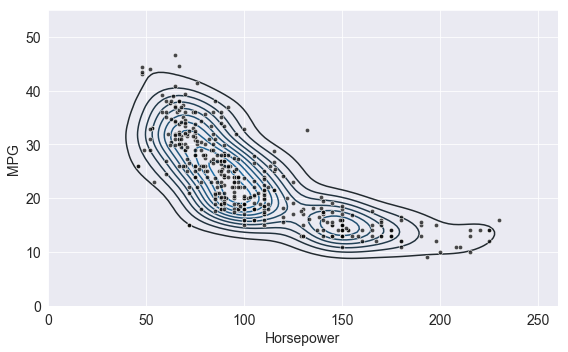

In [54]:
sns.kdeplot(cars.horsepower, cars.mpg)
sns.scatterplot(cars.horsepower, cars.mpg, color='black', alpha=0.7, s=20, zorder=10)
plt.xlim(0, 260)
plt.ylim(0, 55)
plt.xlabel('Horsepower', fontsize=14)
plt.ylabel('MPG', fontsize=14)
plt.tight_layout();

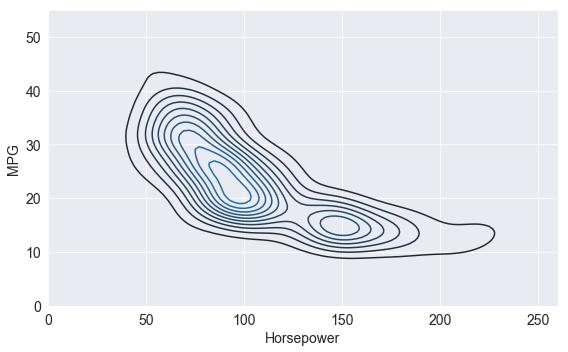

In [55]:
sns.kdeplot(cars.horsepower, cars.mpg)
#sns.scatterplot(cars.horsepower, cars.mpg, color='black', alpha=0.7, s=20, zorder=10)
plt.xlim(0, 260)
plt.ylim(0, 55)
plt.xlabel('Horsepower', fontsize=14)
plt.ylabel('MPG', fontsize=14)
plt.tight_layout();

### Bivariate Demo

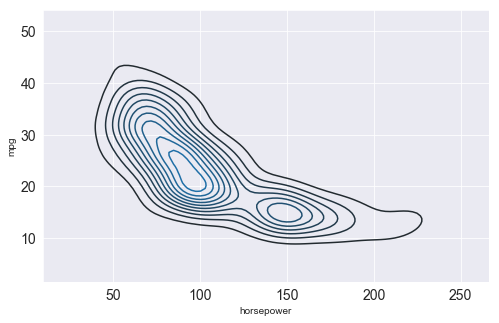

In [56]:
sns.kdeplot(cars.horsepower, cars.mpg);

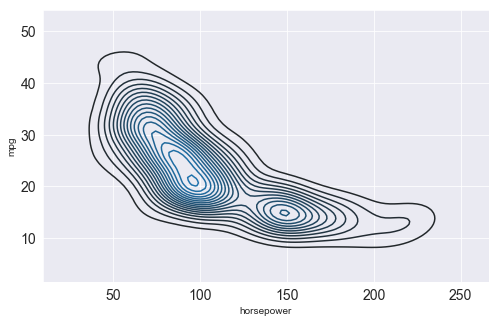

In [57]:
sns.kdeplot(cars.horsepower, cars.mpg, n_levels=20);

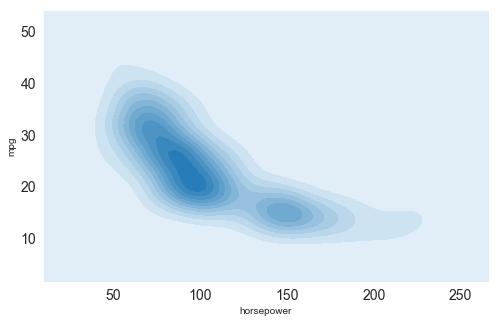

In [58]:
sns.kdeplot(cars.horsepower, cars.mpg, shade=True);

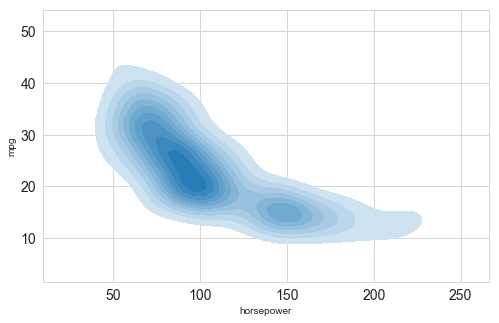

In [59]:
sns.set_style('whitegrid')

sns.kdeplot(cars.horsepower, cars.mpg, 
            shade=True,
            shade_lowest=False
           );

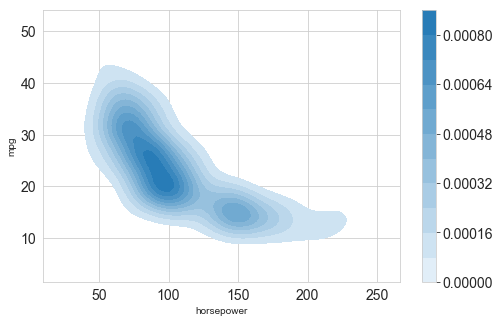

In [60]:
sns.kdeplot(cars.horsepower, cars.mpg, 
            shade=True, 
            shade_lowest=False,
            cbar=True
           );

## Bivariate KDEplot by Category

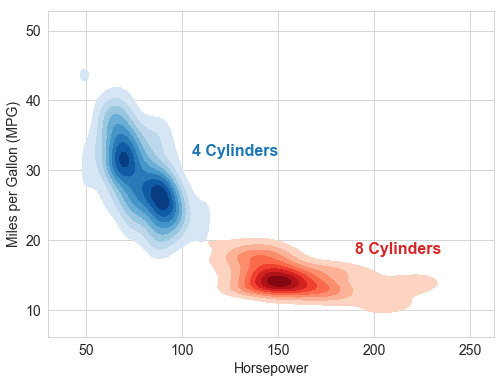

In [61]:
sns.set_style('whitegrid')

cyl_4 = cars[cars.cylinders==4]
cyl_8 = cars[cars.cylinders==8]

plt.figure(figsize=(8,6))

sns.kdeplot(cyl_4.horsepower, cyl_4.mpg,
            cmap="Blues", shade=True, shade_lowest=False)
sns.kdeplot(cyl_8.horsepower, cyl_8.mpg,
            cmap="Reds", shade=True, shade_lowest=False)

plt.xlabel('Horsepower', fontsize=14)
plt.ylabel('Miles per Gallon (MPG)', fontsize=14)

plt.annotate("4 Cylinders", (105, 32), color=blue, fontsize=16, fontweight='bold')
plt.annotate("8 Cylinders", (190, 18), color=red, fontsize=16, fontweight='bold');

## Other Figures that use KDE

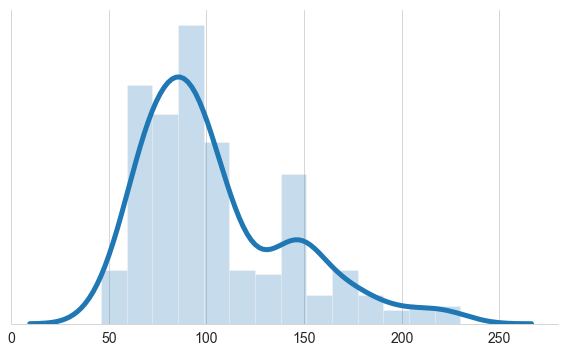

In [63]:
plt.figure(figsize=(8,5))
sns.distplot(hp, kde_kws={"lw": 5}, hist_kws={'alpha': 0.25})

sns.despine(left=True)
plt.xlim(0, 280)
plt.xlabel('')
plt.yticks([])
plt.tight_layout();

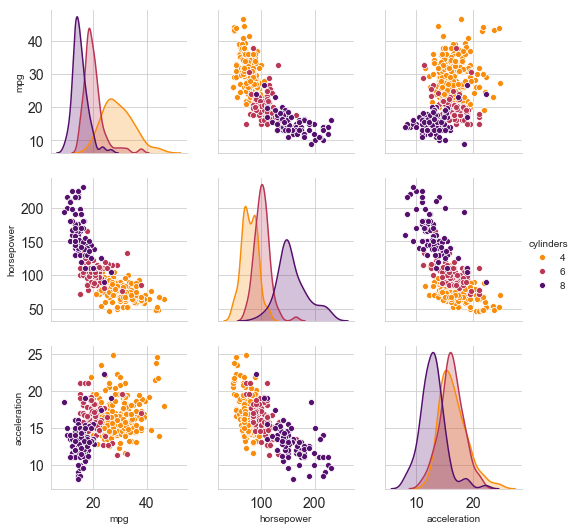

In [62]:
sns.pairplot(cars[cars.cylinders.isin([4,6,8])], 
             hue='cylinders', 
             vars=['mpg', 'horsepower', 'acceleration'], 
             palette='inferno_r'
            );

# Seaborn: distplot

In [1]:
from matplotlib import pyplot as plt
import seaborn as sns

In [2]:
cars = sns.load_dataset('mpg').dropna()

cars.shape

(392, 9)

In [3]:
cars.head()

,mpg,cylinders,displacement,horsepower,weight,acceleration,model_year,origin,name
0,18.0,8,307.0,130.0,3504,12.0,70,usa,chevrolet chevelle malibu
1,15.0,8,350.0,165.0,3693,11.5,70,usa,buick skylark 320
2,18.0,8,318.0,150.0,3436,11.0,70,usa,plymouth satellite
3,16.0,8,304.0,150.0,3433,12.0,70,usa,amc rebel sst
4,17.0,8,302.0,140.0,3449,10.5,70,usa,ford torino


In [4]:
sns.set_style('white')

## Intro Visuals

In [5]:
hp = cars.horsepower.sample(100, random_state=100)

In [6]:
plt.rc('xtick', labelsize=14)
plt.rc('ytick', labelsize=14)

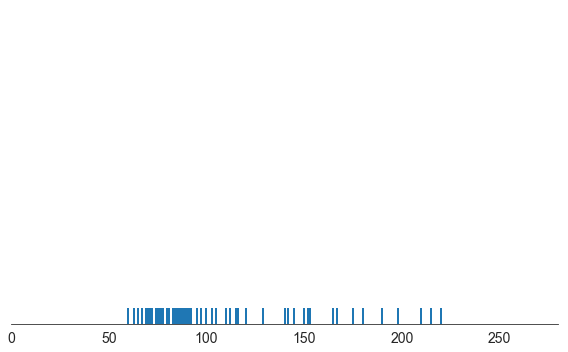

In [8]:
plt.figure(figsize=(8,5))
sns.distplot(hp, rug=True, kde=False, hist=False, rug_kws={'lw': 2})

sns.despine(left=True)
plt.xlim(0, 280)
plt.xlabel('')
plt.yticks([])
plt.tight_layout();

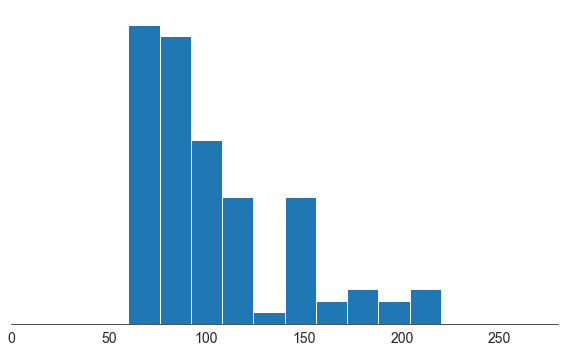

In [9]:
plt.figure(figsize=(8,5))
sns.distplot(hp, kde=False, hist_kws={'alpha': 1})

sns.despine(left=True)
plt.xlim(0, 280)
plt.xlabel('')
plt.yticks([])
plt.tight_layout();

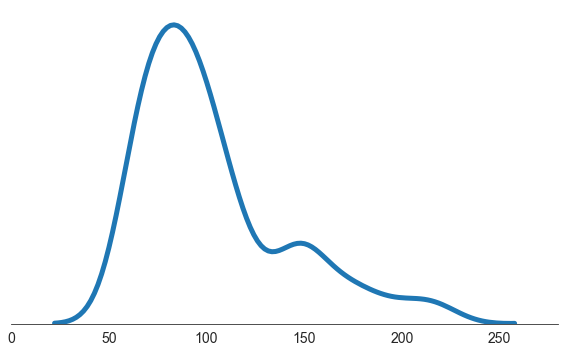

In [10]:
plt.figure(figsize=(8,5))
sns.distplot(hp, hist=False, kde_kws={'lw': 5})

sns.despine(left=True)
plt.xlim(0, 280)
plt.xlabel('')
plt.yticks([])
plt.tight_layout();

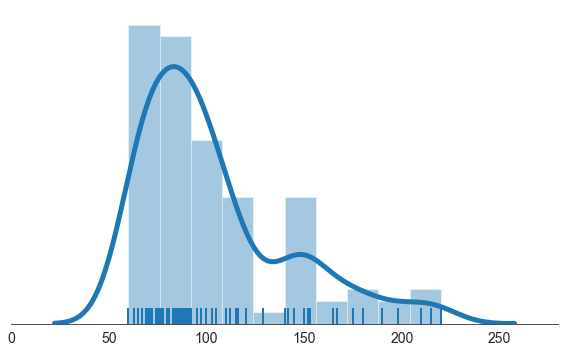

In [11]:
plt.figure(figsize=(8,5))
sns.distplot(hp, rug=True, kde_kws={"lw": 5}, rug_kws={'lw': 2} )

sns.despine(left=True)
plt.xlim(0, 280)
plt.xlabel('')
plt.yticks([])
plt.tight_layout();

## Basics

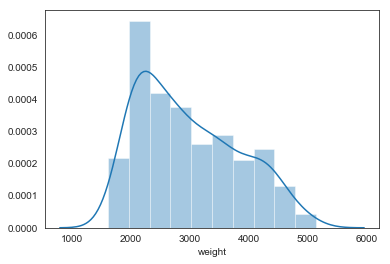

In [5]:
sns.distplot(cars.weight);

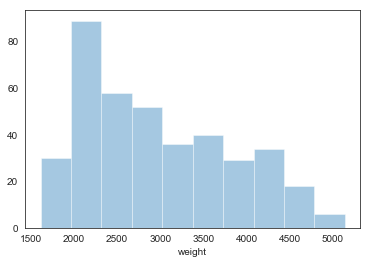

In [6]:
sns.distplot(cars.weight, kde=False);

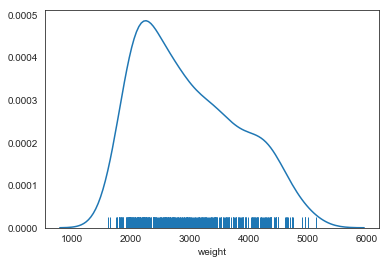

In [8]:
sns.distplot(cars.weight, hist=False, rug=True); 

## Options

### Bins

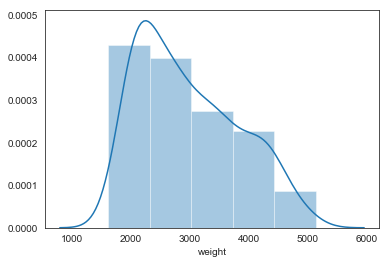

In [10]:
# bins -> number of bards and their weight
sns.distplot(cars.weight, bins=5);  

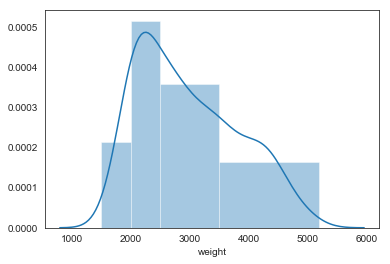

In [11]:
sns.distplot(cars.weight, bins=[1500, 2000, 2500, 3500, 5200]);

### Fit

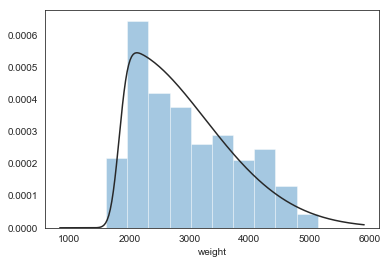

In [14]:
from scipy.stats import skewnorm

sns.distplot(cars.weight, fit=skewnorm, kde=False);

## Kwargs

### hist_kws

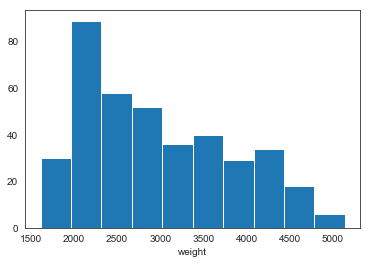

In [16]:
sns.distplot(cars.weight, kde=False, hist_kws={'alpha': 1});

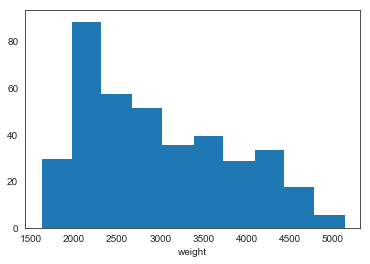

In [18]:
sns.distplot(cars.weight, kde=False, 
             hist_kws={'alpha': 1, 'histtype': 'stepfilled'});

### kde_kws

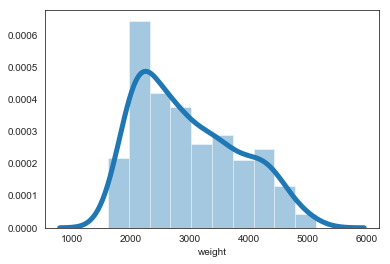

In [20]:
sns.distplot(cars.weight, kde_kws={'lw': 5});

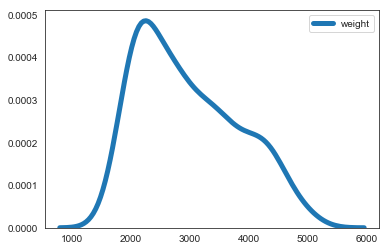

In [21]:
sns.kdeplot(cars.weight, lw=5);  

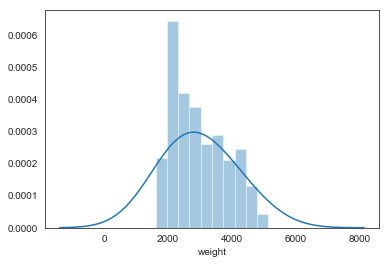

In [23]:
sns.distplot(cars.weight, kde_kws={'bw': 1000});

### rug_kws

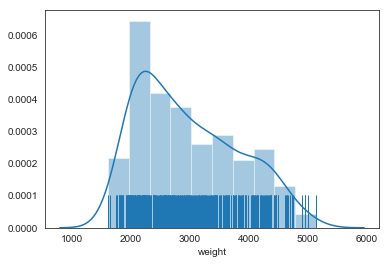

In [35]:
sns.distplot(cars.weight, rug=True, rug_kws={'height': 0.15});

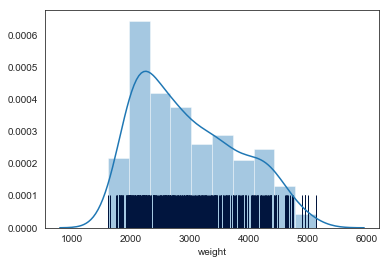

In [37]:
sns.distplot(cars.weight, rug=True, 
             rug_kws={'height': 0.15, 'color': 'xkcd:navy'});

## Styled Distplots

In [ ]:
sns.set_style('white')

plt.figure(figsize=(8,5))
sns.distplot(cars.weight, 
             bins=20,
             kde_kws={"lw": 8, 'color':'xkcd:bluish green'},
             hist_kws={'alpha': 0.3, 'color':'gray'}
            )

sns.despine(left=True)
plt.xlabel('Weight (lbs)', fontsize=16, labelpad=15)
plt.yticks([])
plt.tight_layout()

plt.savefig('03dist_styleWeight_greenKDE.svg');

In [ ]:
sns.set_style('white')

plt.figure(figsize=(8,5))
sns.distplot(cars.acceleration.sample(100, random_state=100), 
             rug=True,
             kde=False,
             hist_kws={'lw': 5, 
                       'linestyle': (0, (5, 1)),
                       'alpha': 1, 
                       'histtype':'step', 
                       'color':'xkcd:dark magenta'},
             rug_kws={'lw': 3,
                      'color':'xkcd:dark magenta'}
            )
sns.distplot(cars.acceleration.sample(100, random_state=100), 
             kde=False,
             hist_kws={'alpha': 0.1,
                       'histtype':'stepfilled', 
                       'color':'xkcd:dark magenta'},
            )

sns.despine(left=True)
plt.xlabel('')
plt.xticks([])
plt.yticks([])
plt.tight_layout()

plt.savefig('03dist_styleAcc_pink.svg');

In [ ]:
import random
random.seed(11)

data = [random.gauss(2, 0.75) for _ in range(50)]
data.extend([random.gauss(-2, 0.75) for _ in range(50)])

sns.set_style('whitegrid')

plt.figure(figsize=(8,5))
sns.distplot(data, 
             rug=True,
             hist=False, 
             color='green',
             kde_kws={'lw':4, 'shade':True, 'bw':.5},
             rug_kws={'lw':2}
            )

sns.despine()
plt.xlabel('')
plt.tight_layout()

#plt.savefig('03dist_styleRand_greenKDErug.svg');

In [ ]:
sns.set_style('darkgrid')

data = [random.gauss(2, 0.75) for _ in range(100)]
data.extend([random.gauss(-2, 0.75) for _ in range(50)])

plt.figure(figsize=(8,5))
sns.distplot(data, 
             hist_kws={'histtype': 'stepfilled', 
                       'alpha':0.7, 'color':'xkcd:carolina blue'},
             kde_kws={'lw':8,'color':'xkcd:navy'}
            )

sns.despine()
plt.xlabel('')
plt.tight_layout()

#plt.savefig('03dist_styleRand_carolina.svg');

# Seaborn: boxplot

In [1]:
from matplotlib import pyplot as plt
import seaborn as sns

In [2]:
cars = sns.load_dataset('mpg').dropna()

cars.shape

(392, 9)

In [3]:
cars.head()

,mpg,cylinders,displacement,horsepower,weight,acceleration,model_year,origin,name
0,18.0,8,307.0,130.0,3504,12.0,70,usa,chevrolet chevelle malibu
1,15.0,8,350.0,165.0,3693,11.5,70,usa,buick skylark 320
2,18.0,8,318.0,150.0,3436,11.0,70,usa,plymouth satellite
3,16.0,8,304.0,150.0,3433,12.0,70,usa,amc rebel sst
4,17.0,8,302.0,140.0,3449,10.5,70,usa,ford torino


## Intro Visuals

In [4]:
import pandas as pd
import numpy as np

In [5]:
sns.set_style('white')
plt.rc('xtick', labelsize=14)
plt.rc('ytick', labelsize=14)

In [6]:
blue, orange, green, red = sns.color_palette()[:4]

In [7]:
pts = [1, 1.5, (7/3), 3, 3.75, 4.25, 5, 19/3, 8, 12]

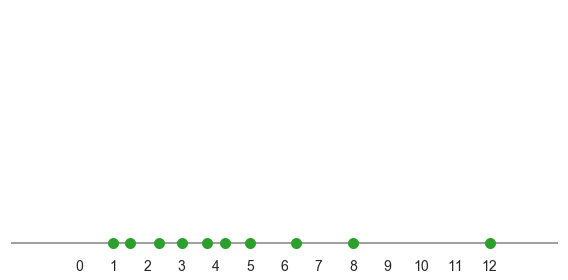

In [8]:
plt.figure(figsize=(8, 4))
plt.scatter(pts, [0]*len(pts), s=100, zorder=1, color=green)
plt.axhline(0, color='gray', zorder=0)
plt.ylim(-0.02, 0.55)
plt.xlim(-2, 14)
plt.box(False)
plt.xticks(range(13))
plt.yticks([])
plt.tight_layout();

In [9]:
pd.Series(pts).describe()

count    10.000000
mean      4.716667
std       3.341010
min       1.000000
25%       2.500000
50%       4.000000
75%       6.000000
max      12.000000
dtype: float64

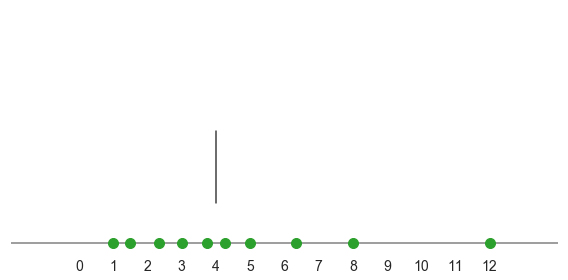

In [10]:
plt.figure(figsize=(8, 4))
plt.scatter(pts, [0]*len(pts), s=100, zorder=1, color=green)
plt.axvline(4, ymin=0.2, ymax=0.5, color='#3E3E3E')  #median at 4
plt.axhline(0, color='gray', zorder=0)
plt.ylim(-0.02, 0.55)
plt.xlim(-2, 14)
plt.box(False)
plt.xticks(range(13))
plt.yticks([])
plt.tight_layout();

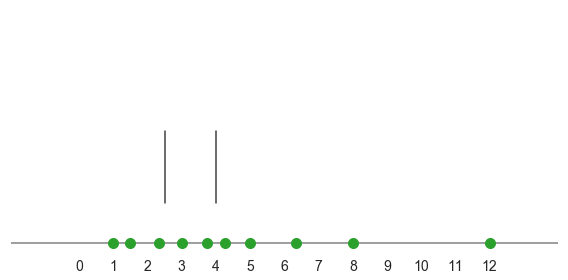

In [11]:
plt.figure(figsize=(8, 4))
plt.scatter(pts, [0]*len(pts), s=100, zorder=1, color=green)
plt.axvline(4, ymin=0.2, ymax=0.5, color='#3E3E3E') 
plt.axvline(2.5, ymin=0.2, ymax=0.5, color='#3E3E3E') #25th percentile
plt.axhline(0, color='gray', zorder=0)
plt.ylim(-0.02, 0.55)
plt.xlim(-2, 14)
plt.box(False)
plt.xticks(range(13))
plt.yticks([])
plt.tight_layout();

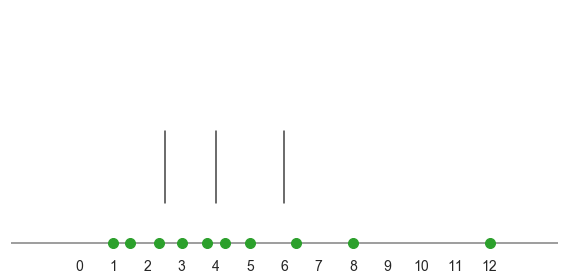

In [12]:
plt.figure(figsize=(8, 4))
plt.scatter(pts, [0]*len(pts), s=100, zorder=1, color=green)
plt.axvline(4, ymin=0.2, ymax=0.5, color='#3E3E3E')  
plt.axvline(2.5, ymin=0.2, ymax=0.5, color='#3E3E3E')  
plt.axvline(6, ymin=0.2, ymax=0.5, color='#3E3E3E')   #75th percentile
plt.axhline(0, color='gray', zorder=0)
plt.ylim(-0.02, 0.55)
plt.xlim(-2, 14)
plt.box(False)
plt.xticks(range(13))
plt.yticks([])
plt.tight_layout();

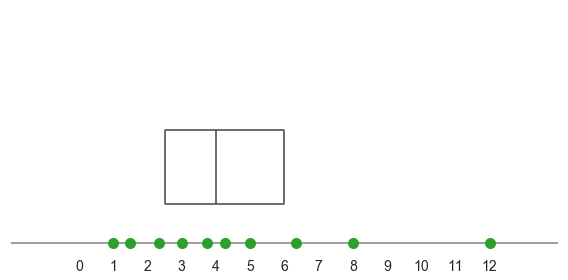

In [13]:
plt.figure(figsize=(8, 4))
plt.scatter(pts, [0]*len(pts), s=100, zorder=1, color=green)
plt.axvline(4, ymin=0.2, ymax=0.5, color='#3E3E3E')
plt.axvline(2.5, ymin=0.2, ymax=0.5, color='#3E3E3E')
plt.axvline(6, ymin=0.2, ymax=0.5, color='#3E3E3E')
plt.axhline(0.092, xmin=(4.5/16), xmax=0.5, color='#3E3E3E')  #connect box
plt.axhline(0.268, xmin=(4.5/16), xmax=0.5, color='#3E3E3E')  #connect box
plt.axhline(0, color='gray', zorder=0)
plt.ylim(-0.02, 0.55)
plt.xlim(-2, 14)
plt.box(False)
plt.xticks(range(13))
plt.yticks([])
plt.tight_layout();

In [14]:
xvals=np.linspace(2.5, 6, 100)

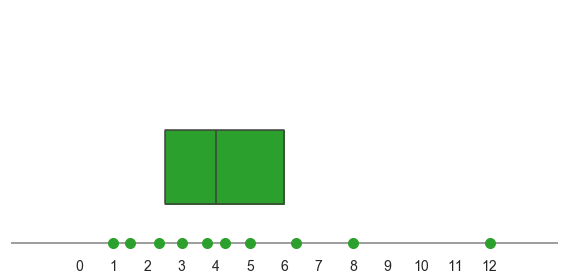

In [15]:
plt.figure(figsize=(8, 4))
plt.scatter(pts, [0]*len(pts), s=100, zorder=1, color=green)
plt.axvline(4, ymin=0.2, ymax=0.5, color='#3E3E3E')
plt.axvline(2.5, ymin=0.2, ymax=0.5, color='#3E3E3E')
plt.axvline(6, ymin=0.2, ymax=0.5, color='#3E3E3E')
plt.axhline(0.092, xmin=(4.5/16), xmax=0.5, color='#3E3E3E')
plt.axhline(0.268, xmin=(4.5/16), xmax=0.5, color='#3E3E3E')
plt.gca().fill_between(xvals, 0.092, 0.268, color=green)  #add color
plt.axhline(0, color='gray', zorder=0)
plt.ylim(-0.02, 0.55)
plt.xlim(-2, 14)
plt.box(False)
plt.xticks(range(13))
plt.yticks([])
plt.tight_layout();

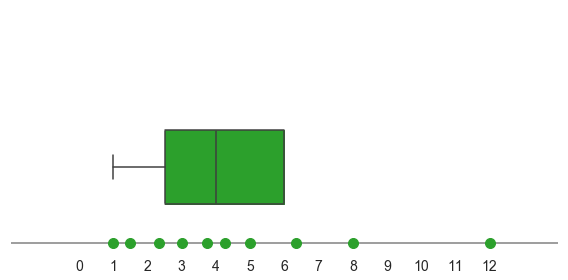

In [16]:
plt.figure(figsize=(8, 4))
plt.scatter(pts, [0]*len(pts), s=100, zorder=1, color=green)
plt.axvline(4, ymin=0.2, ymax=0.5, color='#3E3E3E')
plt.axvline(2.5, ymin=0.2, ymax=0.5, color='#3E3E3E')
plt.axvline(6, ymin=0.2, ymax=0.5, color='#3E3E3E')
plt.axhline(0.092, xmin=(4.5/16), xmax=0.5, color='#3E3E3E')
plt.axhline(0.268, xmin=(4.5/16), xmax=0.5, color='#3E3E3E')
plt.axhline(0.18, xmin=(3/16), xmax=(4.5/16), color='#3E3E3E') #add lower whisker
plt.axvline(1, ymin=0.3, ymax=0.4, color='#3E3E3E')            #add lower whisker
plt.gca().fill_between(xvals, 0.092, 0.268, color=green)
plt.axhline(0, color='gray', zorder=0)    
plt.ylim(-0.02, 0.55)
plt.xlim(-2, 14)
plt.box(False)
plt.xticks(range(13))
plt.yticks([])
plt.tight_layout();

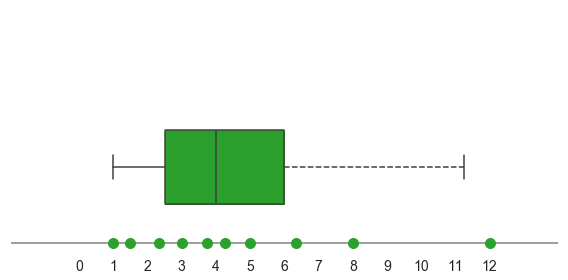

In [17]:
plt.figure(figsize=(8, 4))
plt.scatter(pts, [0]*len(pts), s=100, zorder=1, color=green)
plt.axvline(4, ymin=0.2, ymax=0.5, color='#3E3E3E')
plt.axvline(2.5, ymin=0.2, ymax=0.5, color='#3E3E3E')
plt.axvline(6, ymin=0.2, ymax=0.5, color='#3E3E3E')
plt.axhline(0.092, xmin=(4.5/16), xmax=0.5, color='#3E3E3E')
plt.axhline(0.268, xmin=(4.5/16), xmax=0.5, color='#3E3E3E')
plt.axhline(0.18, xmin=(3/16), xmax=(4.5/16), color='#3E3E3E')
plt.axvline(1, ymin=0.3, ymax=0.4, color='#3E3E3E')
plt.axhline(0.18, xmin=(8/16), xmax=(13.25/16), color='#3E3E3E', linestyle='--')  #add hypothetical upper whisker
plt.axvline(11.25, ymin=0.3, ymax=0.4, color='#3E3E3E')    #add hypothetical upper whisker
plt.gca().fill_between(xvals, 0.092, 0.268, color=green)
plt.axhline(0, color='gray', zorder=0)
plt.ylim(-0.02, 0.55)
plt.xlim(-2, 14)
plt.box(False)
plt.xticks(range(13))
plt.yticks([])
plt.tight_layout();

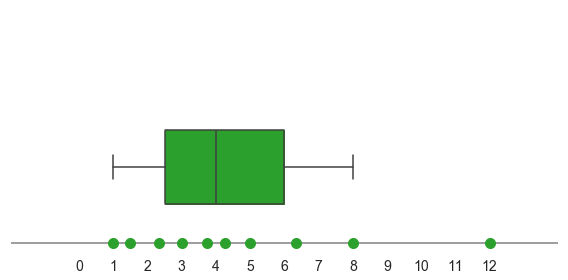

In [18]:
plt.figure(figsize=(8, 4))
plt.scatter(pts, [0]*len(pts), s=100, zorder=1, color=green)
plt.axvline(4, ymin=0.2, ymax=0.5, color='#3E3E3E')
plt.axvline(2.5, ymin=0.2, ymax=0.5, color='#3E3E3E')
plt.axvline(6, ymin=0.2, ymax=0.5, color='#3E3E3E')
plt.axhline(0.092, xmin=(4.5/16), xmax=0.5, color='#3E3E3E')
plt.axhline(0.268, xmin=(4.5/16), xmax=0.5, color='#3E3E3E')
plt.axhline(0.18, xmin=(3/16), xmax=(4.5/16), color='#3E3E3E')
plt.axvline(1, ymin=0.3, ymax=0.4, color='#3E3E3E')
plt.axhline(0.18, xmin=(8/16), xmax=(10/16), color='#3E3E3E') #add upper whisker
plt.axvline(8, ymin=0.3, ymax=0.4, color='#3E3E3E')           #add upper whisker
plt.gca().fill_between(xvals, 0.092, 0.268, color=green)
plt.axhline(0, color='gray', zorder=0)
plt.ylim(-0.02, 0.55)
plt.xlim(-2, 14)
plt.box(False)
plt.xticks(range(13))
plt.yticks([])
plt.tight_layout();

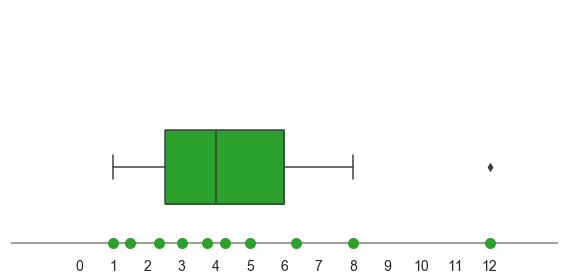

In [19]:
plt.figure(figsize=(8, 4))
plt.scatter(pts, [0]*len(pts), s=100, zorder=1, color=green)
plt.axvline(4, ymin=0.2, ymax=0.5, color='#3E3E3E')
plt.axvline(2.5, ymin=0.2, ymax=0.5, color='#3E3E3E')
plt.axvline(6, ymin=0.2, ymax=0.5, color='#3E3E3E')
plt.axhline(0.092, xmin=(4.5/16), xmax=0.5, color='#3E3E3E')
plt.axhline(0.268, xmin=(4.5/16), xmax=0.5, color='#3E3E3E')
plt.axhline(0.18, xmin=(3/16), xmax=(4.5/16), color='#3E3E3E')
plt.axvline(1, ymin=0.3, ymax=0.4, color='#3E3E3E')
plt.axhline(0.18, xmin=(8/16), xmax=(10/16), color='#3E3E3E')
plt.axvline(8, ymin=0.3, ymax=0.4, color='#3E3E3E')
plt.scatter(12, 0.18, marker="d", s=30, color='#3E3E3E')  #add flier
plt.gca().fill_between(xvals, 0.092, 0.268, color=green)
plt.axhline(0, color='gray', zorder=0)
plt.ylim(-0.02, 0.55)
plt.xlim(-2, 14)
plt.box(False)
plt.xticks(range(13))
plt.yticks([])
plt.tight_layout();

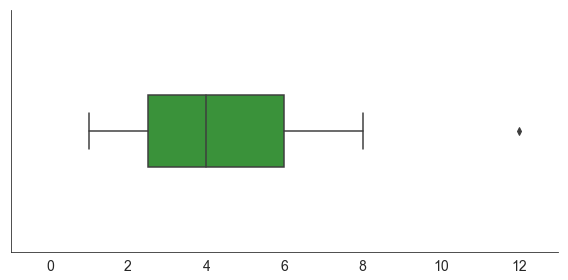

In [20]:
#check manual against seaborn plot

plt.figure(figsize=(8,4))
sns.boxplot(pts, color=green, width=0.3)
sns.despine()
plt.xlim(-1, 13)
plt.tight_layout();

In [21]:
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)

## Basics

In [22]:
sns.set_style('whitegrid')

In [23]:
cars.cylinders.value_counts()

4    199
8    103
6     83
3      4
5      3
Name: cylinders, dtype: int64

Filter down to only cars with even number of cylinders

In [24]:
cars = cars[cars.cylinders.isin([4,6,8])]

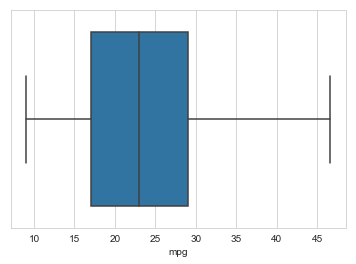

In [25]:
sns.boxplot(cars.mpg);

In [26]:
cars.mpg.describe()

count    385.000000
mean      23.445455
std        7.836911
min        9.000000
25%       17.000000
50%       23.000000
75%       29.000000
max       46.600000
Name: mpg, dtype: float64

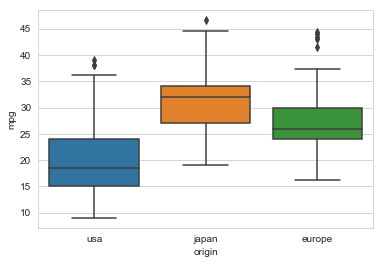

In [27]:
sns.boxplot(x=cars.origin, y=cars.mpg);

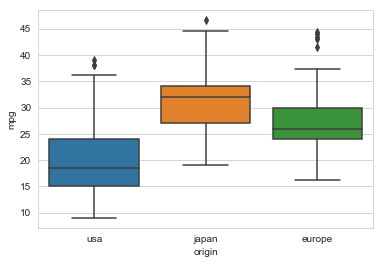

In [28]:
sns.boxplot(x='origin', y='mpg', data=cars);

### Hue

#### By Cylinders

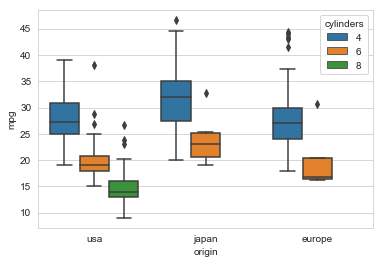

In [29]:
sns.boxplot(x='origin', y='mpg', hue='cylinders', data=cars);

#### By Model Year

In [30]:
cars.model_year.describe()

count    385.000000
mean      75.961039
std        3.692058
min       70.000000
25%       73.000000
50%       76.000000
75%       79.000000
max       82.000000
Name: model_year, dtype: float64

In [31]:
cars['newer_model'] = cars.model_year > 76

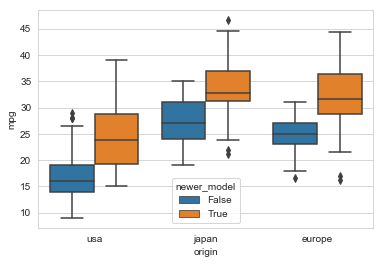

In [32]:
sns.boxplot(x='origin', y='mpg', hue='newer_model', data=cars);

## Styling Options

### order

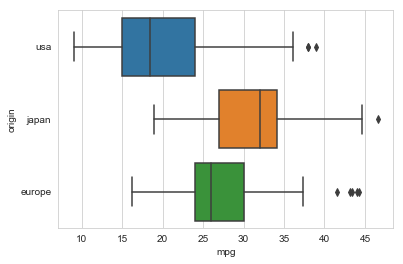

In [33]:
sns.boxplot(x='mpg', y='origin',   
            data=cars
           );

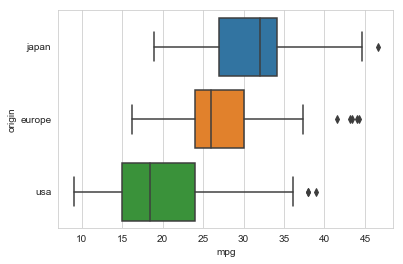

In [34]:
sns.boxplot(x='mpg', y='origin', 
            data=cars,
            order=['japan', 'europe', 'usa']
           );

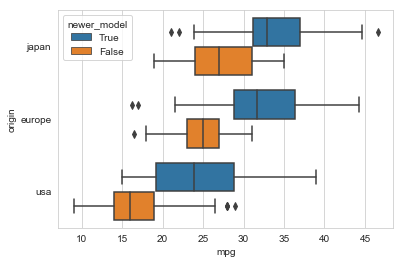

In [35]:
sns.boxplot(x='mpg', y='origin', hue='newer_model',
            data=cars,
            order=['japan', 'europe', 'usa'],
            hue_order=[True, False]
           );

### color

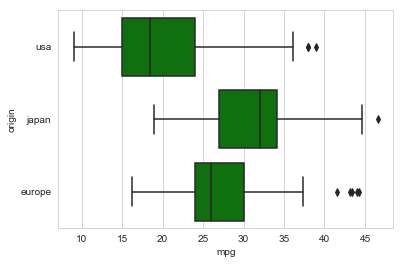

In [36]:
sns.boxplot(x='mpg', y='origin',  
            data=cars, 
            color='g'
           );

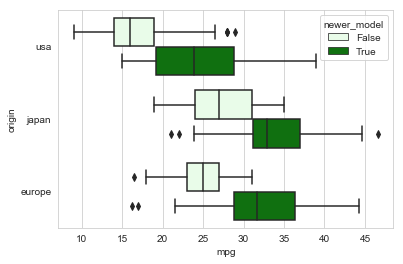

In [37]:
sns.boxplot(x='mpg', y='origin', hue='newer_model',
            data=cars,
            color='g'
           );

### width

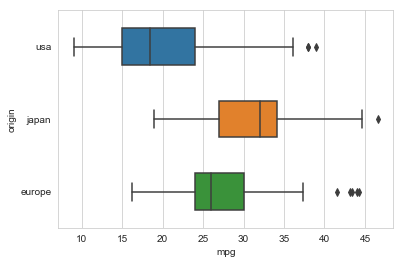

In [38]:
sns.boxplot(x='mpg', y='origin', 
            data=cars,
            width=0.5
           ); 

### linewidth

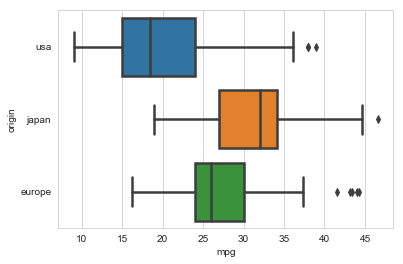

In [39]:
sns.boxplot(x='mpg', y='origin', 
            data=cars,
            linewidth=2.5
           );

### whis

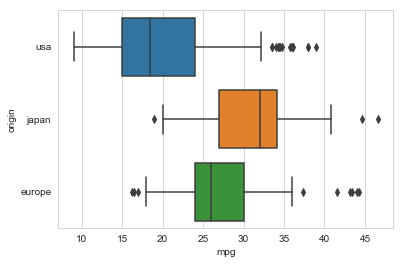

In [40]:
sns.boxplot(x='mpg', y='origin', 
            data=cars,
            whis=1
           );

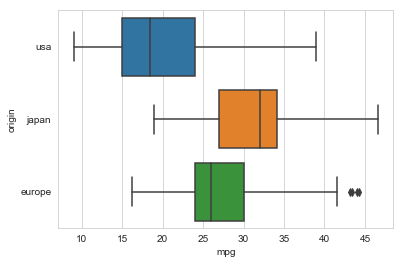

In [41]:
sns.boxplot(x='mpg', y='origin', 
            data=cars,
            whis=2
           );

### fliersize

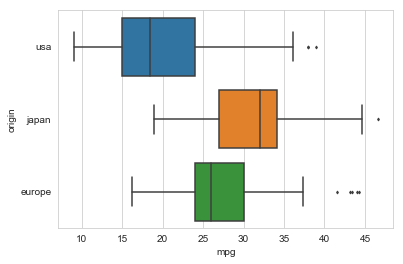

In [42]:
sns.boxplot(x='mpg', y='origin', 
            data=cars,
            fliersize=2
           );

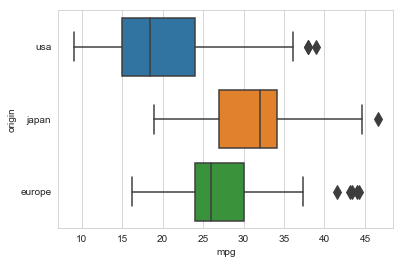

In [43]:
sns.boxplot(x='mpg', y='origin', 
            data=cars,
            fliersize=10
           );

### showcaps

Check the [matplotlib documentation](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.boxplot.html) for even more styling options

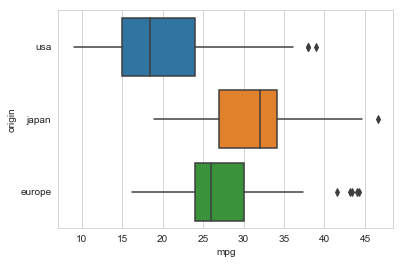

In [44]:
sns.boxplot(x='mpg', y='origin', 
            data=cars,
            showcaps=False
           );

# Seaborn: violinplot

In [1]:
from matplotlib import pyplot as plt
import seaborn as sns

In [2]:
cars = sns.load_dataset('mpg').dropna()

cars.shape

(392, 9)

In [3]:
cars.head()

,mpg,cylinders,displacement,horsepower,weight,acceleration,model_year,origin,name
0,18.0,8,307.0,130.0,3504,12.0,70,usa,chevrolet chevelle malibu
1,15.0,8,350.0,165.0,3693,11.5,70,usa,buick skylark 320
2,18.0,8,318.0,150.0,3436,11.0,70,usa,plymouth satellite
3,16.0,8,304.0,150.0,3433,12.0,70,usa,amc rebel sst
4,17.0,8,302.0,140.0,3449,10.5,70,usa,ford torino


## Intro Visuals

In [4]:
import pandas as pd
import numpy as np

In [5]:
sns.set_style('white')
plt.rc('xtick', labelsize=14)
plt.rc('ytick', labelsize=14)

In [6]:
blue, orange, green, red = sns.color_palette()[:4]

In [7]:
pts = [1, 1.5, (7/3), 3, 3.75, 4.25, 5, 19/3, 8, 12]

In [8]:
pd.Series(pts).describe()

count    10.000000
mean      4.716667
std       3.341010
min       1.000000
25%       2.500000
50%       4.000000
75%       6.000000
max      12.000000
dtype: float64

### Recipe

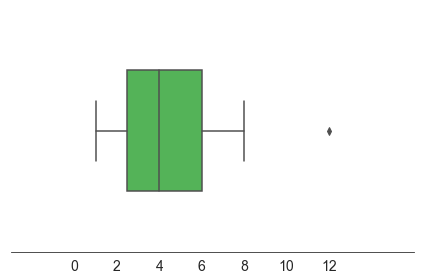

In [9]:
plt.figure(figsize=(6,4))
sns.boxplot(pts, color='#44C34A', width=0.5)
sns.despine(left=True)
plt.xlim(-3, 16)
plt.xticks(range(0,13,2))
plt.tight_layout();

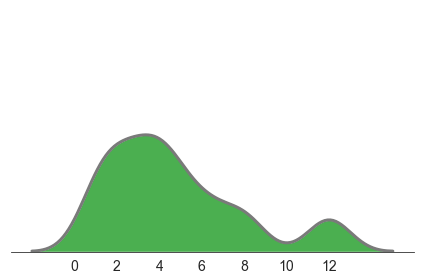

In [10]:
plt.figure(figsize=(6,4))
sns.kdeplot(pts, color='#4BAF50', shade=True, alpha=1, bw=1)
sns.kdeplot(pts, color='#7A7A7A', zorder=2, lw=3, bw=1)
sns.despine(left=True)
plt.xlim(-3, 16)
plt.ylim(None, 0.3)
plt.xticks(range(0,13,2))
plt.yticks([])
plt.tight_layout();

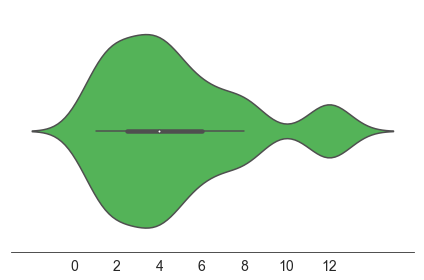

In [11]:
plt.figure(figsize=(6,4))
sns.violinplot(pts, color='#44C34A', bw=0.3, cut=3)
sns.despine(left=True)
plt.xlim(-3, 16)
plt.xticks(range(0,13,2))
plt.tight_layout();

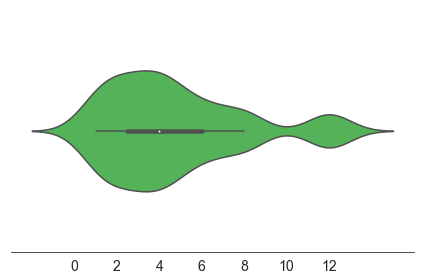

In [12]:
plt.figure(figsize=(6,4))
sns.violinplot(pts, color='#44C34A', bw=0.3, cut=3, width=0.5)
sns.despine(left=True)
plt.xlim(-3, 16)
plt.xticks(range(0,13,2))
plt.tight_layout();

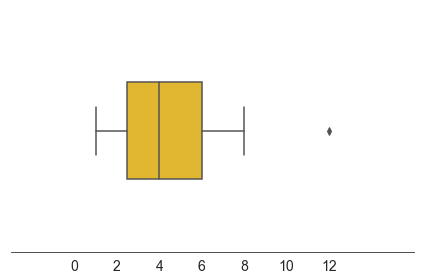

In [13]:
plt.figure(figsize=(6,4))
sns.boxplot(pts, color='xkcd:golden yellow', width=0.4)
sns.despine(left=True)
plt.xlim(-3, 16)
plt.xticks(range(0,13,2))
plt.tight_layout();

In [14]:
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)

## Basics

In [15]:
sns.set_style('whitegrid')

In [16]:
cars.cylinders.value_counts()

4    199
8    103
6     83
3      4
5      3
Name: cylinders, dtype: int64

Filter down to only cars with even number of cylinders

In [17]:
cars = cars[cars.cylinders.isin([4,6,8])]

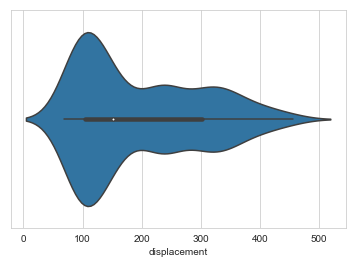

In [18]:
sns.violinplot(cars.displacement);

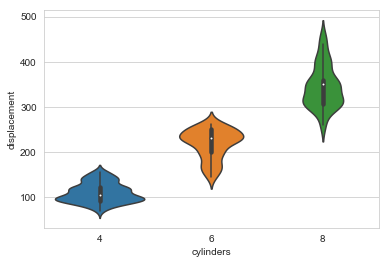

In [19]:
sns.violinplot(x=cars.cylinders, y=cars.displacement);

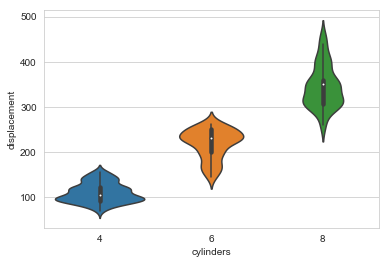

In [20]:
sns.violinplot(x='cylinders', y='displacement',
               data=cars
              );

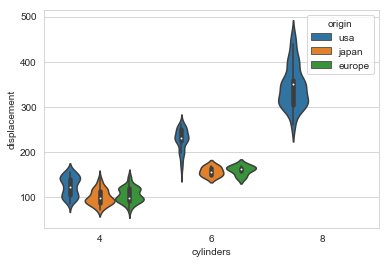

In [21]:
sns.violinplot(x='cylinders', y='displacement', hue='origin',
               data=cars
              );

## Violinplot Options

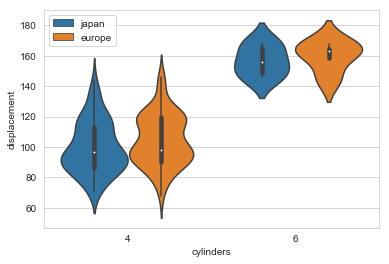

In [22]:
sns.violinplot(x='cylinders', y='displacement', hue='origin',
               data=cars[cars.origin.isin(['japan', 'europe'])]
              )

plt.legend(loc=2);

### split

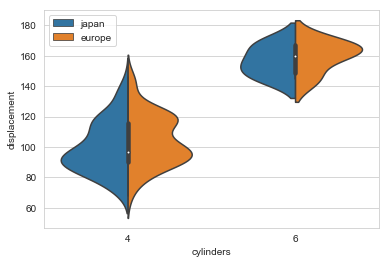

In [23]:
sns.violinplot(x='cylinders', y='displacement', hue='origin',
               data=cars[cars.origin.isin(['japan', 'europe'])],
               split=True
              )

plt.legend(loc=2);

### inner

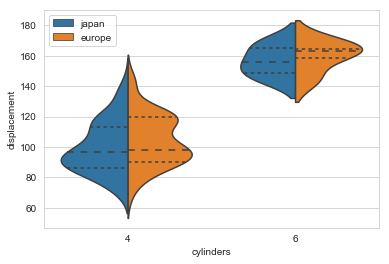

In [24]:
sns.violinplot(x='cylinders', y='displacement', hue='origin',
               data=cars[cars.origin.isin(['japan', 'europe'])],
               split=True,
               inner='quartiles'
              )

plt.legend(loc=2);

### scale

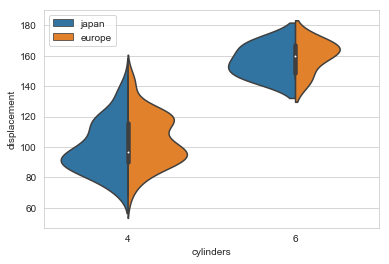

In [25]:
sns.violinplot(x='cylinders', y='displacement', hue='origin',
               data=cars[cars.origin.isin(['japan', 'europe'])],
               split=True,
               scale='count'
              )

plt.legend(loc=2);

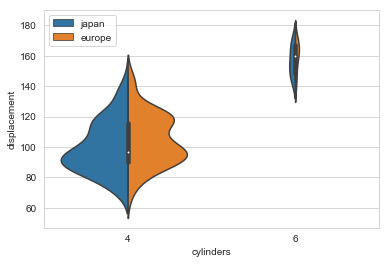

In [26]:
sns.violinplot(x='cylinders', y='displacement', hue='origin',
               data=cars[cars.origin.isin(['japan', 'europe'])],
               split=True,
               scale='count',
               scale_hue=False
              )

plt.legend(loc=2);

In [27]:
(
    cars[cars.origin.isin(['japan', 'europe'])]
    .groupby('cylinders')
    .origin
    .value_counts()
)

cylinders  origin
4          japan     69
           europe    61
6          japan      6
           europe     4
Name: origin, dtype: int64

## Styling

### Box Options

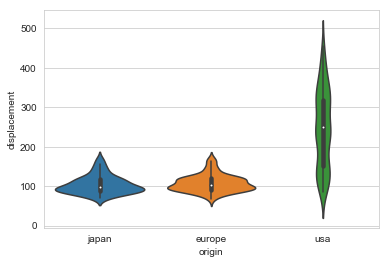

In [28]:
sns.violinplot(x=cars.origin, y=cars.displacement,
               order=['japan', 'europe', 'usa']
              );

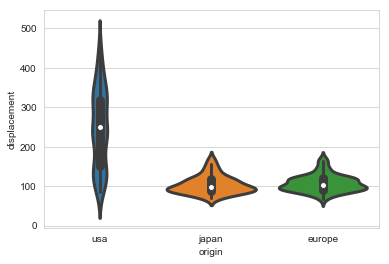

In [29]:
sns.violinplot(x=cars.origin, y=cars.displacement, 
               linewidth=3
              );

### KDE Options

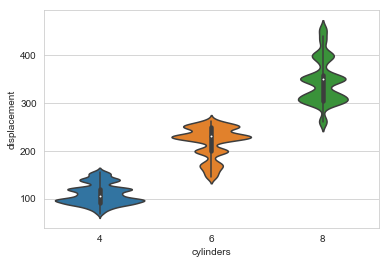

In [30]:
sns.violinplot(x=cars.cylinders, y=cars.displacement,
               bw=0.2
              );

# Seaborn: swarmplot

In [1]:
from matplotlib import pyplot as plt
import seaborn as sns
import numpy as np

In [2]:
cars = sns.load_dataset('mpg').dropna()

cars.shape

(392, 9)

In [3]:
cars.head()

,mpg,cylinders,displacement,horsepower,weight,acceleration,model_year,origin,name
0,18.0,8,307.0,130.0,3504,12.0,70,usa,chevrolet chevelle malibu
1,15.0,8,350.0,165.0,3693,11.5,70,usa,buick skylark 320
2,18.0,8,318.0,150.0,3436,11.0,70,usa,plymouth satellite
3,16.0,8,304.0,150.0,3433,12.0,70,usa,amc rebel sst
4,17.0,8,302.0,140.0,3449,10.5,70,usa,ford torino


## Intro Visuals

In [4]:
import pandas as pd
import numpy as np

In [5]:
sns.set_style('white')
plt.rc('xtick', labelsize=14)
plt.rc('ytick', labelsize=14)

In [6]:
blue, orange, green, red = sns.color_palette()[:4]

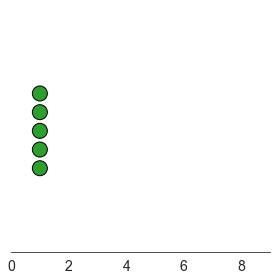

In [7]:
pts = np.array([1, 1, 1, 1, 1]) #, 2, 2, 3, 4, 4, 4, 4, 5, 5, 7])

plt.figure(figsize=(4,4))
sns.swarmplot(pts, color=green, size=15, linewidth=1, edgecolor='black')
sns.despine(left=True)
plt.xlim(0, 9)
plt.tight_layout();

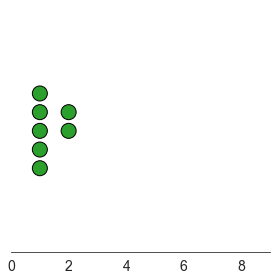

In [8]:
pts = np.array([1, 1, 1, 1, 1, 2, 2]) #, 3, 4, 4, 4, 4, 5, 5, 7])

plt.figure(figsize=(4,4))
sns.swarmplot(pts, color=green, size=15, linewidth=1, edgecolor='black')
sns.despine(left=True)
plt.xlim(0, 9)
plt.tight_layout();

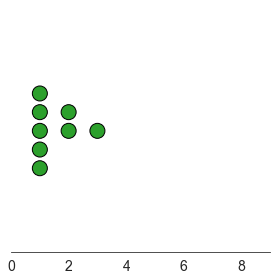

In [9]:
pts = np.array([1, 1, 1, 1, 1, 2, 2, 3]) #, 4, 4, 4, 4, 5, 5, 7])

plt.figure(figsize=(4,4))
sns.swarmplot(pts, color=green, size=15, linewidth=1, edgecolor='black')
sns.despine(left=True)
plt.xlim(0, 9)
plt.tight_layout();

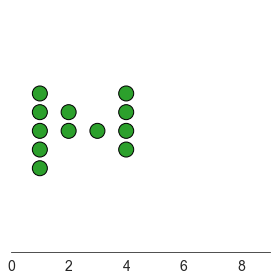

In [10]:
pts = np.array([1, 1, 1, 1, 1, 2, 2, 3, 4, 4, 4, 4]) #, 5, 5, 7])

plt.figure(figsize=(4,4))
sns.swarmplot(pts, color=green, size=15, linewidth=1, edgecolor='black')
sns.despine(left=True)
plt.xlim(0, 9)
plt.tight_layout();

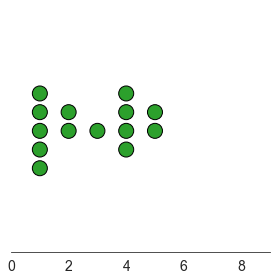

In [11]:
pts = np.array([1, 1, 1, 1, 1, 2, 2, 3, 4, 4, 4, 4, 5, 5]) #, 7])

plt.figure(figsize=(4,4))
sns.swarmplot(pts, color=green, size=15, linewidth=1, edgecolor='black')
sns.despine(left=True)
plt.xlim(0, 9)
plt.tight_layout();

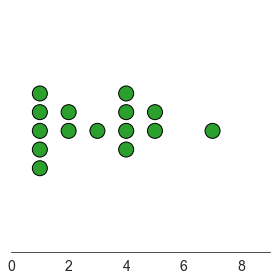

In [12]:
pts = np.array([1, 1, 1, 1, 1, 2, 2, 3, 4, 4, 4, 4, 5, 5, 7])

plt.figure(figsize=(4,4))
sns.swarmplot(pts, color=green, size=15, linewidth=1, edgecolor='black')
sns.despine(left=True)
plt.xlim(0, 9)
plt.tight_layout();

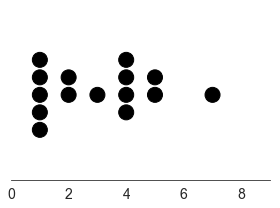

In [13]:
pts = np.array([1, 1, 1, 1, 1, 2, 2, 3, 4, 4, 4, 4, 5, 5, 7])

plt.figure(figsize=(4,3))
sns.swarmplot(pts, color='black', size=15, linewidth=1, edgecolor='black')
sns.despine(left=True)
plt.xlim(0, 9)
plt.tight_layout();

In [14]:
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)

## Basics

In [15]:
sns.set_style('whitegrid')

In [16]:
cars.cylinders.value_counts()

4    199
8    103
6     83
3      4
5      3
Name: cylinders, dtype: int64

Filter down to only cars with even number of cylinders

In [17]:
cars = cars[cars.cylinders.isin([4,6,8])]

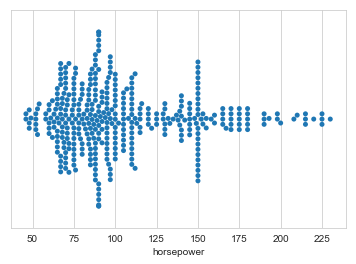

In [18]:
sns.swarmplot(cars.horsepower);

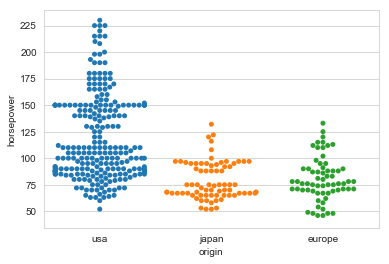

In [19]:
sns.swarmplot(x=cars.origin, y=cars.horsepower);

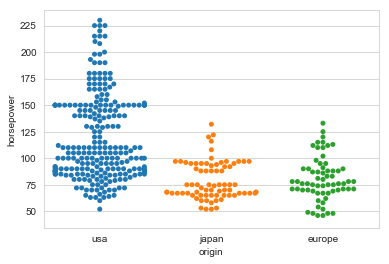

In [20]:
sns.swarmplot(x='origin', y='horsepower',
               data=cars
              );

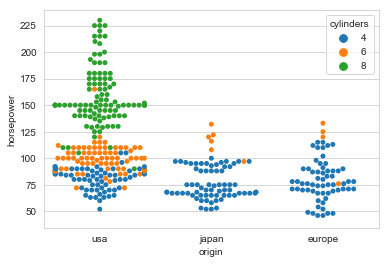

In [21]:
sns.swarmplot(x='origin', y='horsepower', hue='cylinders',
               data=cars
              );

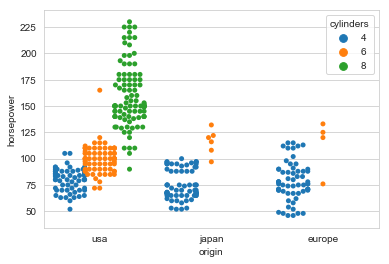

In [22]:
sns.swarmplot(x='origin', y='horsepower', hue='cylinders',
               data=cars, dodge=True
              );

## Swarmplot Overlay

In [23]:
usa = cars[cars.origin=='usa']

### With Boxplot

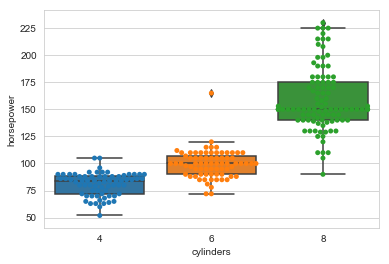

In [24]:
sns.boxplot(x=usa.cylinders, y=usa.horsepower)
sns.swarmplot(x=usa.cylinders, y=usa.horsepower);

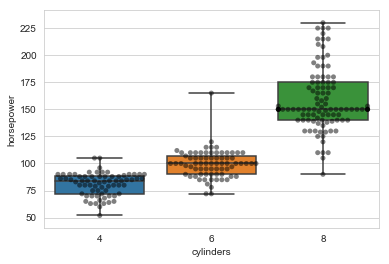

In [25]:
sns.boxplot(x=usa.cylinders, y=usa.horsepower,
            whis=np.inf
           )
sns.swarmplot(x=usa.cylinders, y=usa.horsepower,
              color='black', alpha=0.5
             );

### With Violinplot

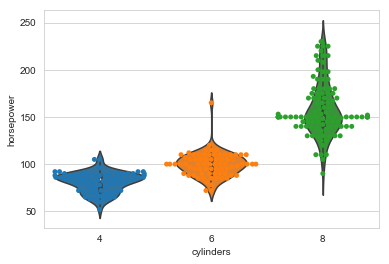

In [26]:
sns.violinplot(x=usa.cylinders, y=usa.horsepower)
sns.swarmplot(x=usa.cylinders, y=usa.horsepower);

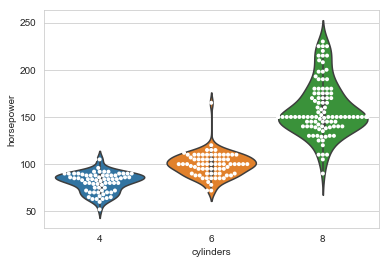

In [27]:
sns.violinplot(x=usa.cylinders, y=usa.horsepower,
               scale='width'
              )
sns.swarmplot(x=usa.cylinders, y=usa.horsepower,
              color='white', size=4
             );

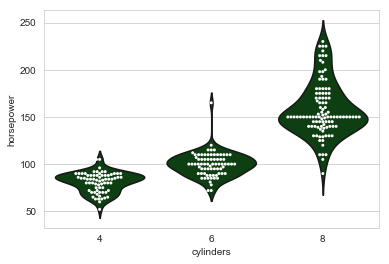

In [28]:
sns.violinplot(x=usa.cylinders, y=usa.horsepower,
               scale='width', inner=None, color='xkcd:forest green'
              )
sns.swarmplot(x=usa.cylinders, y=usa.horsepower,
              color='white', size=3
             );

## Styling

### linewidth, edgecolor

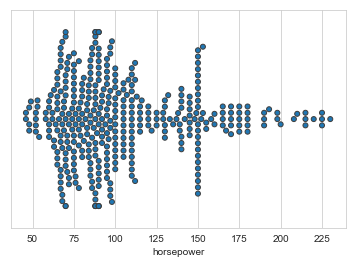

In [29]:
sns.swarmplot(cars.horsepower, linewidth=1);

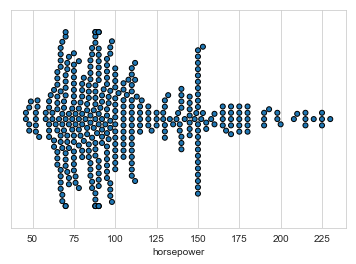

In [30]:
sns.swarmplot(cars.horsepower, linewidth=1, edgecolor='black');

### Matplotlib Scatter Properties: marker

Check the [matplotlib scatter](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.scatter.html) and the [marker style docs](https://matplotlib.org/api/_as_gen/matplotlib.markers.MarkerStyle.html#matplotlib.markers.MarkerStyle) for more styling of the markers themselves

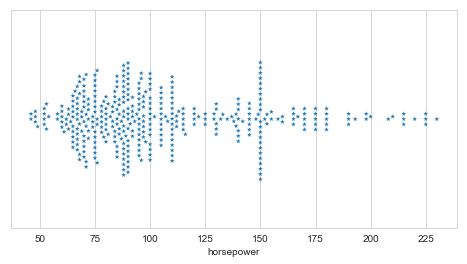

In [31]:
plt.figure(figsize=(8, 4))

sns.swarmplot(cars.horsepower, marker='*');

# Seaborn: stripplot

In [1]:
from matplotlib import pyplot as plt
import seaborn as sns

In [2]:
cars = sns.load_dataset('mpg').dropna()

cars.shape

(392, 9)

In [3]:
cars.head()

,mpg,cylinders,displacement,horsepower,weight,acceleration,model_year,origin,name
0,18.0,8,307.0,130.0,3504,12.0,70,usa,chevrolet chevelle malibu
1,15.0,8,350.0,165.0,3693,11.5,70,usa,buick skylark 320
2,18.0,8,318.0,150.0,3436,11.0,70,usa,plymouth satellite
3,16.0,8,304.0,150.0,3433,12.0,70,usa,amc rebel sst
4,17.0,8,302.0,140.0,3449,10.5,70,usa,ford torino


## Intro Visuals

In [4]:
import pandas as pd
import numpy as np

In [5]:
sns.set_style('white')
plt.rc('xtick', labelsize=14)
plt.rc('ytick', labelsize=14)

In [6]:
blue, orange, green, red = sns.color_palette()[:4]

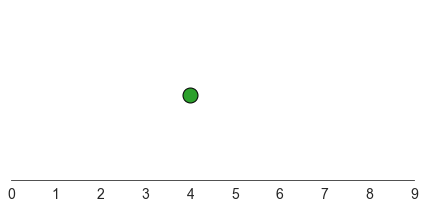

In [7]:
pts = np.array([4]) #, 5, 1, 2, 1, 4, 7, 3])

plt.figure(figsize=(6,3))
sns.stripplot(pts, color=green, size=15, linewidth=1, edgecolor='black', jitter=False)
sns.despine(left=True)
plt.xlim(0, 9)
plt.tight_layout();

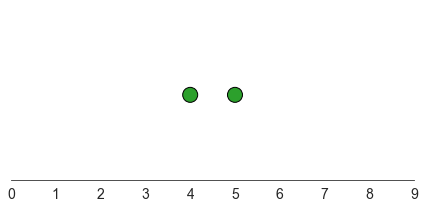

In [8]:
pts = np.array([4, 5]) #, 1, 2, 1, 4, 7, 3])

plt.figure(figsize=(6,3))
sns.stripplot(pts, color=green, size=15, linewidth=1, edgecolor='black', jitter=False)
sns.despine(left=True)
plt.xlim(0, 9)
plt.tight_layout();

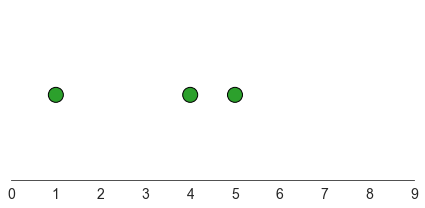

In [9]:
pts = np.array([4, 5, 1]) #, 2, 1, 4, 7, 3])

plt.figure(figsize=(6,3))
sns.stripplot(pts, color=green, size=15, linewidth=1, edgecolor='black', jitter=False)
sns.despine(left=True)
plt.xlim(0, 9)
plt.tight_layout();

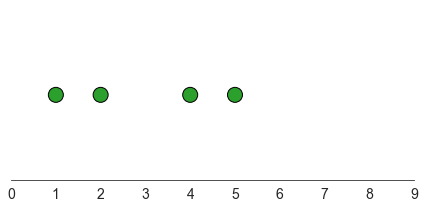

In [10]:
pts = np.array([4, 5, 1, 2]) #, 1, 4, 7, 3])

plt.figure(figsize=(6,3))
sns.stripplot(pts, color=green, size=15, linewidth=1, edgecolor='black', jitter=False)
sns.despine(left=True)
plt.xlim(0, 9)
plt.tight_layout();

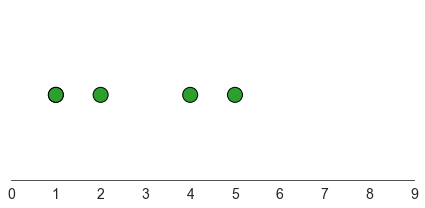

In [11]:
pts = np.array([4, 5, 1, 2, 1]) #, 4, 7, 3])

plt.figure(figsize=(6,3))
sns.stripplot(pts, color=green, size=15, linewidth=1, edgecolor='black', jitter=False)
sns.despine(left=True)
plt.xlim(0, 9)
plt.tight_layout();

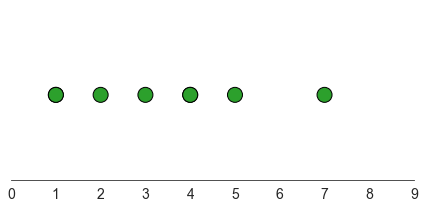

In [12]:
pts = np.array([4, 5, 1, 2, 1, 4, 7, 3])

plt.figure(figsize=(6,3))
sns.stripplot(pts, color=green, size=15, linewidth=1, edgecolor='black', jitter=False)
sns.despine(left=True)
plt.xlim(0, 9)
plt.tight_layout();

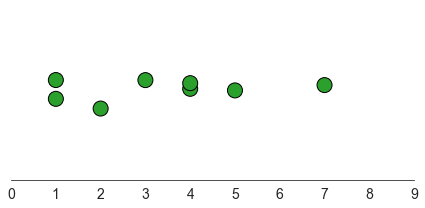

In [13]:
pts = np.array([4, 5, 1, 2, 1, 4, 7, 3])

plt.figure(figsize=(6,3))
sns.stripplot(pts, color=green, size=15, linewidth=1, edgecolor='black')
sns.despine(left=True)
plt.xlim(0, 9)
plt.tight_layout();

### Stripplot vs Swarmplot

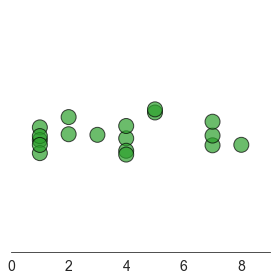

In [14]:
pts = np.array([1, 1, 1, 1, 1, 2, 2, 3, 4, 4, 4, 4, 5, 5, 7, 7, 7, 8])

plt.figure(figsize=(4, 4))
sns.stripplot(pts, color=green, size=15, linewidth=1, edgecolor='black', alpha=0.7)
sns.despine(left=True)
plt.xlim(0, 9)
plt.tight_layout();

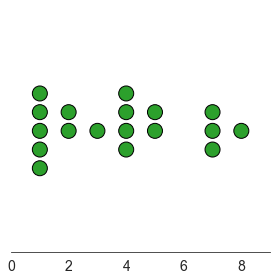

In [15]:
pts = np.array([1, 1, 1, 1, 1, 2, 2, 3, 4, 4, 4, 4, 5, 5, 7, 7, 7, 8])

plt.figure(figsize=(4, 4))
sns.swarmplot(pts, color=green, size=15, linewidth=1, edgecolor='black')
sns.despine(left=True)
plt.xlim(0, 9)
plt.tight_layout();

In [16]:
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)

## Basics

In [17]:
sns.set_style('whitegrid')

In [18]:
cars.cylinders.value_counts()

4    199
8    103
6     83
3      4
5      3
Name: cylinders, dtype: int64

Filter down to only cars with even number of cylinders

In [19]:
cars = cars[cars.cylinders.isin([4,6,8])]

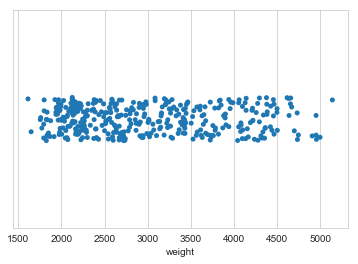

In [20]:
sns.stripplot(cars.weight);

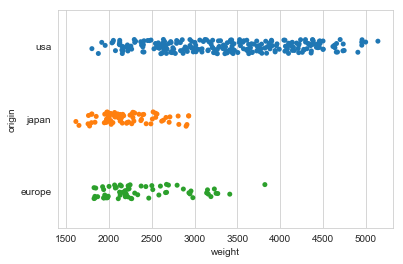

In [21]:
sns.stripplot(cars.weight, cars.origin);

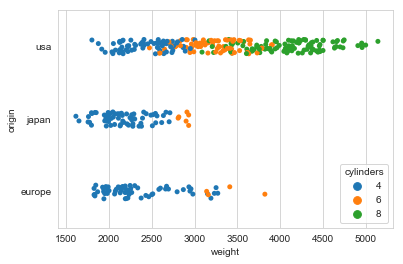

In [22]:
sns.stripplot(x ='weight', y='origin', hue='cylinders',
              data=cars
             );

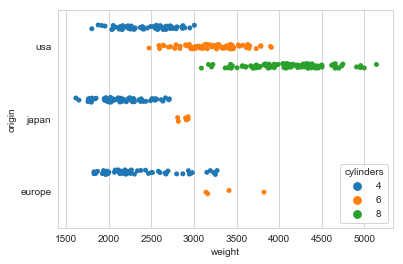

In [23]:
sns.stripplot(x ='weight', y='origin', hue='cylinders', 
              data=cars,
              dodge=True
             );

### Orientation

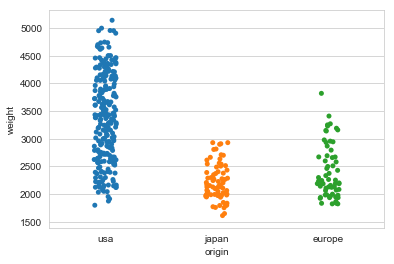

In [24]:
sns.stripplot(x='origin', y='weight', data=cars);

## Styling

In [25]:
sns.set_style('white')

### jitter

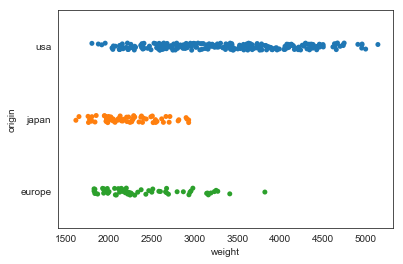

In [26]:
sns.stripplot(cars.weight, cars.origin, jitter=0.05);

In [27]:
from ipywidgets import interactive

def jitter_widget(jitter=0.1):
    sns.stripplot(cars.weight, cars.origin, jitter=jitter)

In [28]:
interactive(jitter_widget, jitter=(0, 0.65, 0.05))

interactive(children=(FloatSlider(value=0.1, description='jitter', max=0.65, step=0.05), Output()), _dom_class…

### alpha

In [29]:
sns.set_style('whitegrid')

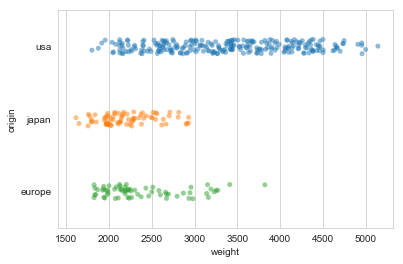

In [30]:
sns.stripplot(cars.weight, cars.origin, alpha=0.5);

### size

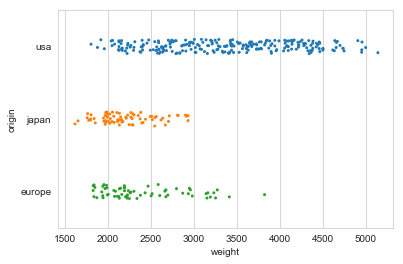

In [31]:
sns.stripplot(cars.weight, cars.origin, 
              alpha=1,
              size=3    #Default size is 5
             );

### linewidth, edgecolor

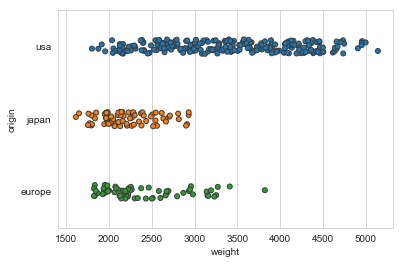

In [32]:
sns.stripplot(cars.weight, cars.origin, linewidth=1);

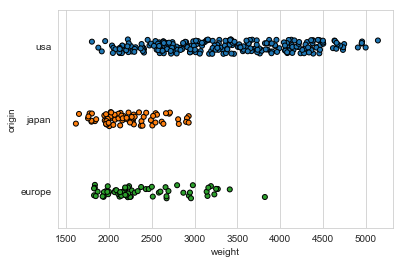

In [33]:
sns.stripplot(cars.weight, cars.origin, linewidth=1, edgecolor='black');

### marker

Check the [matplotlib scatter](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.scatter.html) and the [marker style docs](https://matplotlib.org/api/_as_gen/matplotlib.markers.MarkerStyle.html#matplotlib.markers.MarkerStyle) for more styling of the markers themselves

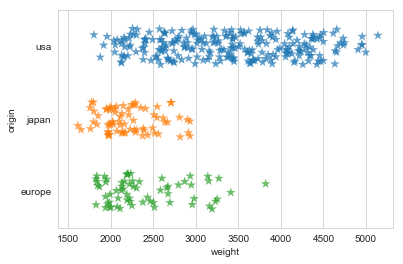

In [34]:
sns.stripplot(cars.weight, cars.origin, 
              alpha=0.7, size=10, jitter=0.25, marker='*'
             );

## Example Gallery

In [35]:
plt.rc('xtick', labelsize=12)
plt.rc('ytick', labelsize=12)
plt.rc('axes', labelsize=14)

#### Cylinders by hue

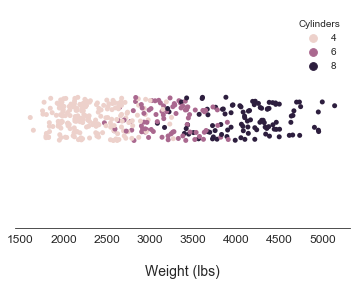

In [36]:
sns.set_style('white')
sns.stripplot(cars.weight, ['']*len(cars), hue=cars.cylinders, 
              palette=sns.cubehelix_palette(3));
sns.despine(left=True)
plt.xlabel('\nWeight (lbs)')
plt.legend(title='Cylinders', frameon=False);

#### Newer models, vertical

In [37]:
sns.set_style('darkgrid')
cars['newer_model'] = [True if mod_year > 76 else False for mod_year in cars.model_year]

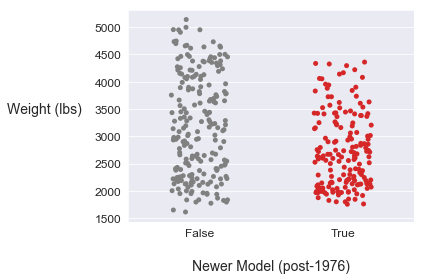

In [38]:
sns.stripplot(cars.newer_model, cars.weight, jitter=0.2, palette=['gray', red]);
plt.xlabel('\nNewer Model (post-1976)')
plt.ylabel('Weight (lbs)', rotation=0, labelpad=50)
plt.tight_layout();

#### Low, medium, high MPG

In [39]:
cars['mpg_range'] = ['Low' if m < 19 else ('Medium' if m < 27 else 'High') for m in cars.mpg]

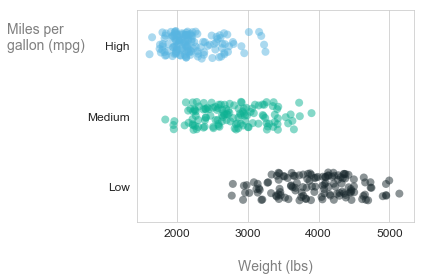

In [40]:
sns.set_style('whitegrid')
sns.stripplot(cars.weight, cars.mpg_range, 
              order=['High', 'Medium', 'Low'],
              jitter=0.2,
              palette=["#58b5e1", "#0db293", "#19282d"],
              alpha=0.5,
              size=8
             )
plt.xlabel('\nWeight (lbs)', color='gray')
plt.ylabel('Miles per\ngallon (mpg)', 
           rotation=0, 
           labelpad=80, 
           ha='left', 
           position=(-.1, .8),
           color='gray'
          )
plt.tight_layout();

#### Company smileys

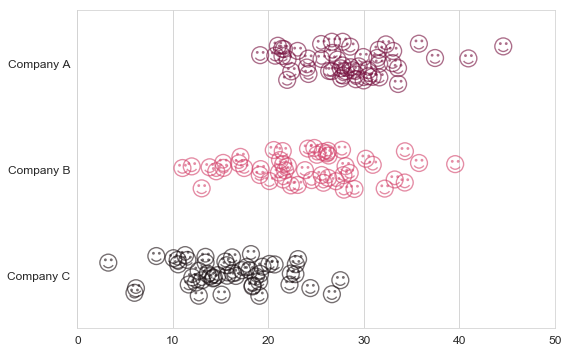

In [41]:
import random
random.seed(11)

points = 50
data = [random.gauss(28, 5) for _ in range(points)]
data.extend([random.gauss(20, 8) for _ in range(points)])
data.extend([random.gauss(15, 5) for _ in range(points)])
company = ['Company A']*points + ['Company B']*points + ['Company C']*points

plt.figure(figsize=(8,5))
sns.stripplot(x=data, y=company, 
              jitter=0.2, 
              alpha=0.6, 
              size=20, 
              marker=r'$☺$',
              palette=["#750e3d", "#d34069", "#190e11"]
             );
for pos in ['left', 'right', 'top', 'bottom']:
    plt.gca().spines[pos].set_edgecolor('lightgray')
plt.xticks([0, 10, 20, 30, 40, 50])
plt.tight_layout();

#### Boxplot overlay

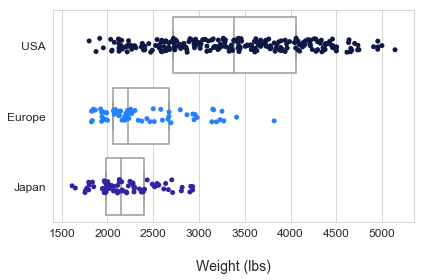

In [42]:
sns.boxplot(cars.weight, cars.origin, whis=0, color='white', fliersize=0, order=['usa', 'europe', 'japan'])
sns.stripplot(cars.weight, cars.origin, palette=["#0f1745", "#2580fe", "#3123a1"], order=['usa', 'europe', 'japan'])
plt.xlabel('\nWeight (lbs)')
plt.ylabel('')
plt.yticks([0, 1, 2], ['USA', 'Europe', 'Japan'])
plt.tight_layout();

# Seaborn: scatterplot

In [1]:
import seaborn as sns
from matplotlib import pyplot as plt

In [2]:
diamonds = sns.load_dataset('diamonds')

diamonds.shape

(53940, 10)

In [3]:
diamonds.head()

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


In [4]:
diamonds = diamonds[
            diamonds.cut.isin(['Premium', 'Good']) & 
            diamonds.color.isin(['D', 'F', 'J'])
            ].sample(n=100, random_state=22)

diamonds.shape

(100, 10)

## Intro Visuals

In [ ]:
import pandas as pd
import numpy as np

In [ ]:
sns.set_style('white')
plt.rc('xtick', labelsize=14)
plt.rc('ytick', labelsize=14)

In [ ]:
blue, orange, green, red = sns.color_palette()[:4]

In [ ]:
pts_x = [1] #, 2, 1.5, 4, 3, 2.5, 2.1, 1.5, 3.5, 1, 2.6, 3.4, 1.3, 0.5]
pts_y = [1] #, 3, 2.5, 3, 3.5, 2, 2.5, 1.8, 4, 1.3, 3.2, 3, 2, 1]

plt.figure(figsize=(5, 5))
sns.scatterplot(pts_x, pts_y, s=150, color='xkcd:crimson', alpha=0.7, edgecolor='black')
sns.despine()
plt.xlim(0, 4.2)
plt.ylim(0, 4.2)
plt.yticks([0, 1, 2, 3, 4])
plt.xticks([1, 2, 3, 4])
plt.tight_layout()
plt.savefig('08scatter_buildBasic1.svg')

In [ ]:
pts_x = [1, 2] #, 1.5, 4, 3, 2.5, 2.1, 1.5, 3.5, 1, 2.6, 3.4, 1.3, 0.5]
pts_y = [1, 3] #, 2.5, 3, 3.5, 2, 2.5, 1.8, 4, 1.3, 3.2, 3, 2, 1]

plt.figure(figsize=(5, 5))
sns.scatterplot(pts_x, pts_y, s=150, color='xkcd:crimson', alpha=0.7, edgecolor='black')
sns.despine()
plt.xlim(0, 4.2)
plt.ylim(0, 4.2)
plt.yticks([0, 1, 2, 3, 4])
plt.xticks([1, 2, 3, 4])
plt.tight_layout()
plt.savefig('08scatter_buildBasic2.svg')

In [ ]:
pts_x = [1, 2, 1.5] #, 4, 3, 2.5, 2.1, 1.5, 3.5, 1, 2.6, 3.4, 1.3, 0.5]
pts_y = [1, 3, 2.5] #, 3, 3.5, 2, 2.5, 1.8, 4, 1.3, 3.2, 3, 2, 1]

plt.figure(figsize=(5, 5))
sns.scatterplot(pts_x, pts_y, s=150, color='xkcd:crimson', alpha=0.7, edgecolor='black')
sns.despine()
plt.xlim(0, 4.2)
plt.ylim(0, 4.2)
plt.yticks([0, 1, 2, 3, 4])
plt.xticks([1, 2, 3, 4])
plt.tight_layout()
plt.savefig('08scatter_buildBasic3.svg')

In [ ]:
pts_x = [1, 2, 1.5, 4, 3, 2.5] #, 2.1, 1.5, 3.5, 1, 2.6, 3.4, 1.3, 0.5]
pts_y = [1, 3, 2.5, 3, 3.5, 2] #, 2.5, 1.8, 4, 1.3, 3.2, 3, 2, 1]

plt.figure(figsize=(5, 5))
sns.scatterplot(pts_x, pts_y, s=150, color='xkcd:crimson', alpha=0.7, edgecolor='black')
sns.despine()
plt.xlim(0, 4.2)
plt.ylim(0, 4.2)
plt.yticks([0, 1, 2, 3, 4])
plt.xticks([1, 2, 3, 4])
plt.tight_layout()
plt.savefig('08scatter_buildBasic4.svg')

In [ ]:
pts_x = [1, 2, 1.5, 4, 3, 2.5, 2.1, 1.5, 3.5] #, 1, 2.6, 3.4, 1.3, 0.5]
pts_y = [1, 3, 2.5, 3, 3.5, 2, 2.5, 1.8, 4] #, 1.3, 3.2, 3, 2, 1]

plt.figure(figsize=(5, 5))
sns.scatterplot(pts_x, pts_y, s=150, color='xkcd:crimson', alpha=0.7, edgecolor='black')
sns.despine()
plt.xlim(0, 4.2)
plt.ylim(0, 4.2)
plt.yticks([0, 1, 2, 3, 4])
plt.xticks([1, 2, 3, 4])
plt.tight_layout()
plt.savefig('08scatter_buildBasic5.svg')

In [ ]:
pts_x = [1, 2, 1.5, 4, 3, 2.5, 2.1, 1.5, 3.5, 1, 2.6, 3.4, 1.3, 0.5]
pts_y = [1, 3, 2.5, 3, 3.5, 2, 2.5, 1.8, 4, 1.3, 3.2, 3, 2, 1]

plt.figure(figsize=(5, 5))
sns.scatterplot(pts_x, pts_y, s=150, color='xkcd:crimson', alpha=0.7, edgecolor='black')
sns.despine()
plt.xlim(0, 4.2)
plt.ylim(0, 4.2)
plt.yticks([0, 1, 2, 3, 4])
plt.xticks([1, 2, 3, 4])
plt.tight_layout()
plt.savefig('08scatter_buildBasicFull.svg')

In [ ]:
for x,y in zip(pts_x, pts_y):
    print((x, y))

In [ ]:
cat = [0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1]

In [ ]:
plt.figure(figsize=(5, 5))
sns.scatterplot(pts_x, pts_y, s=200, hue=cat, alpha=0.7, edgecolor='black', palette={0: 'xkcd:crimson', 1: '#3d9f98'})
sns.despine()
plt.xlim(0, 4.2)
plt.ylim(0, 4.2)
plt.yticks([0, 1, 2, 3, 4])
plt.xticks([1, 2, 3, 4])
plt.gca().get_legend().remove()
plt.tight_layout()
plt.savefig('08scatter_byHue.png')

In [ ]:
plt.figure(figsize=(5, 5))
sns.scatterplot(pts_x, pts_y, s=200, style=cat, alpha=0.7, edgecolor='black', color='xkcd:crimson')
sns.despine()
plt.xlim(0, 4.2)
plt.ylim(0, 4.2)
plt.yticks([0, 1, 2, 3, 4])
plt.xticks([1, 2, 3, 4])
plt.gca().get_legend().remove()
plt.tight_layout()
plt.savefig('08scatter_byStyle.png')

In [ ]:
plt.figure(figsize=(5, 5))
sns.scatterplot(pts_x, pts_y, size=cat, alpha=0.7, edgecolor='black', color='xkcd:crimson', sizes=[50, 300])
sns.despine()
plt.xlim(0, 4.2)
plt.ylim(0, 4.2)
plt.yticks([0, 1, 2, 3, 4])
plt.xticks([1, 2, 3, 4])
plt.gca().get_legend().remove()
plt.tight_layout()
plt.savefig('08scatter_bySize.png')

In [ ]:
plt.figure(figsize=(5, 5))
sns.scatterplot(pts_x, pts_y, size=cat, hue=cat, style=cat,
                alpha=0.7, edgecolor='black',  
                sizes=[100, 300],
                palette={0: 'xkcd:crimson', 1: '#3d9f98'}
               )
sns.despine()
plt.xlim(0, 4.2)
plt.ylim(0, 4.2)
plt.yticks([0, 1, 2, 3, 4])
plt.xticks([1, 2, 3, 4])
plt.gca().get_legend().remove()
plt.tight_layout()
plt.savefig('08scatter_byAll.png')

In [ ]:
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)

## Basics

In [5]:
sns.set_style('dark')

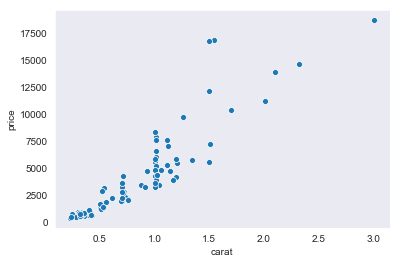

In [6]:
sns.scatterplot(diamonds.carat, diamonds.price);

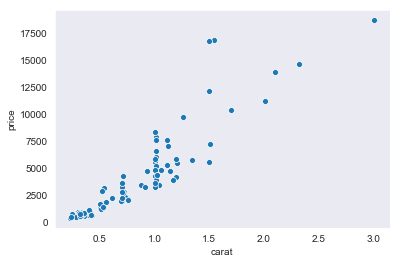

In [7]:
sns.scatterplot(x='carat', y='price', data=diamonds);

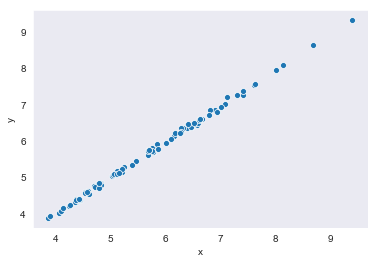

In [8]:
sns.scatterplot(x='x', y='y', data=diamonds);

## Semantic Variables

In [9]:
sns.set_style('darkgrid')

### hue

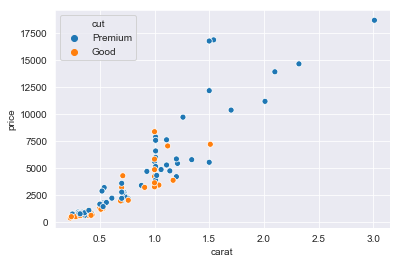

In [10]:
sns.scatterplot(x='carat', y='price', hue='cut',
                data=diamonds
               );

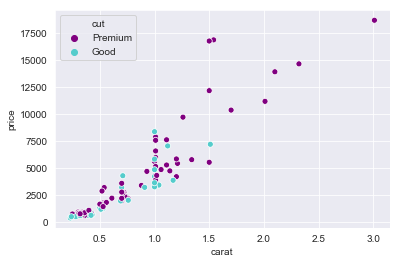

In [11]:
sns.scatterplot(x='carat', y='price', hue='cut',
                data=diamonds,
                palette=['purple', '#55CCCC']
               );

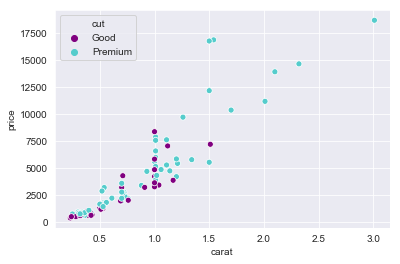

In [12]:
sns.scatterplot(x='carat', y='price', hue='cut',
                data=diamonds,
                palette = ['purple', '#55CCCC'],
                hue_order=['Good', 'Premium']
               );

#### Continuous Variable

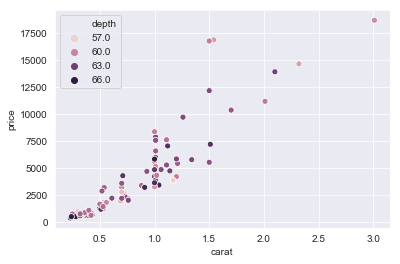

In [13]:
sns.scatterplot(x='carat', y='price', hue='depth',
                data=diamonds
               );

### style

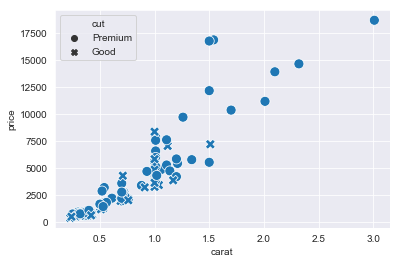

In [14]:
sns.scatterplot(x='carat', y='price', style='cut',
                data=diamonds,
                s=100
               );

### size

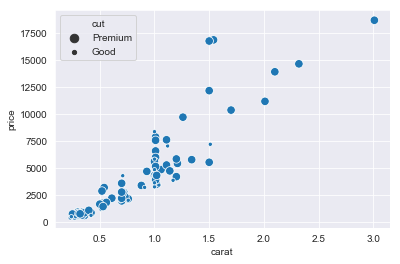

In [15]:
sns.scatterplot(x='carat', y='price', size='cut',
                data=diamonds
               );

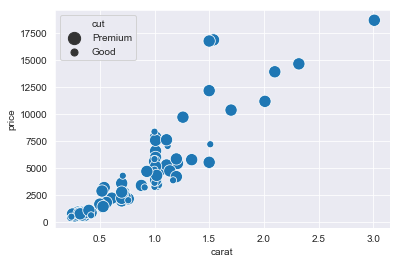

In [16]:
sns.scatterplot(x='carat', y='price', size='cut',
                data=diamonds, 
                sizes=[150, 50]
               );

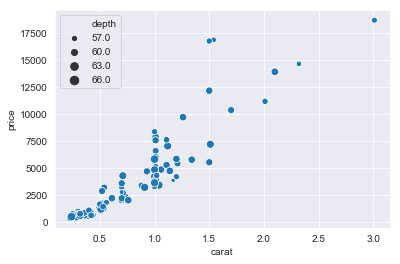

In [17]:
sns.scatterplot(x='carat', y='price', size='depth',
                data=diamonds
               );

### hue + style + size

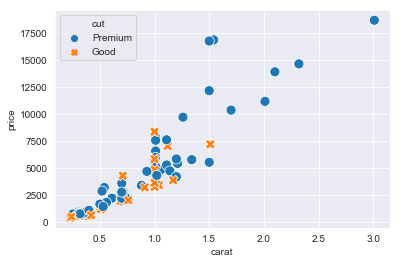

In [18]:
sns.scatterplot(x='carat', y='price', 
                hue='cut', 
                style='cut',
                data=diamonds,
                s=100
               );

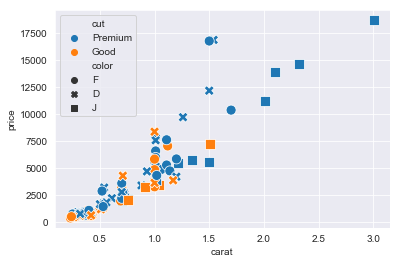

In [19]:
sns.scatterplot(x='carat', y='price', 
                hue='cut', 
                style='color',
                data=diamonds,
                s=100
               );

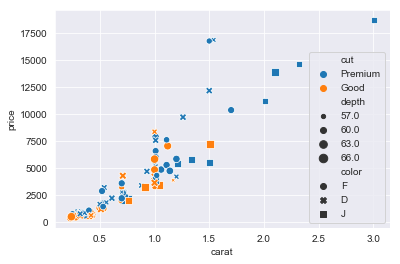

In [20]:
sns.scatterplot(x='carat', y='price', 
                hue='cut', 
                style='color',
                size='depth',
                data=diamonds);

## Additional Styling

### alpha

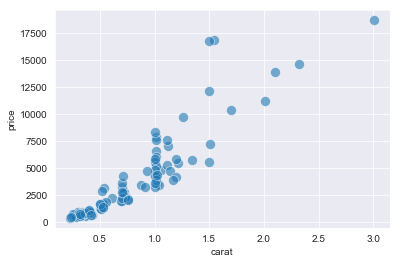

In [21]:
sns.scatterplot(x='carat', y='price', 
                data=diamonds,
                s=100,
                alpha=0.6
               );

### marker styling

Check the [matplotlib scatter](https://matplotlib.org/api/_as_gen/matplotlib.pyplot.scatter.html) and the [marker style docs](https://matplotlib.org/api/_as_gen/matplotlib.markers.MarkerStyle.html#matplotlib.markers.MarkerStyle) for more styling of the markers themselves

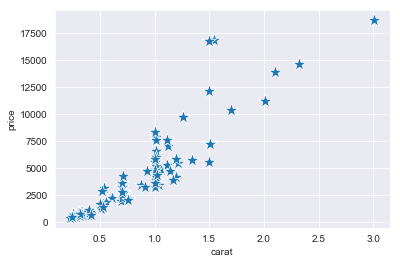

In [22]:
sns.scatterplot(x='carat', y='price', 
                data=diamonds, 
                s=200,
                marker='*'
               );

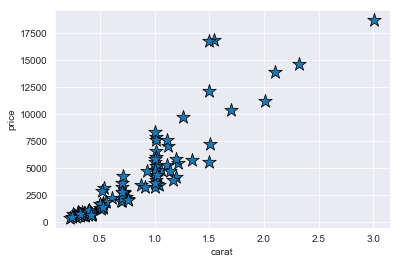

In [23]:
sns.scatterplot(x='carat', y='price', 
                data=diamonds, 
                s=200, 
                marker='*',
                edgecolor='black'
               );

# Seaborn: lineplot

In [1]:
import seaborn as sns
from matplotlib import pyplot as plt

import pandas as pd

Grab parking data from [UCI resource](https://archive.ics.uci.edu/ml/datasets/Parking+Birmingham) with Bash commands and read in as `pandas` DataFrame.

In [2]:
!wget https://archive.ics.uci.edu/ml/machine-learning-databases/00482/dataset.zip

--2020-08-12 14:49:33--  https://archive.ics.uci.edu/ml/machine-learning-databases/00482/dataset.zip
Resolving archive.ics.uci.edu (archive.ics.uci.edu)... 128.195.10.252
Connecting to archive.ics.uci.edu (archive.ics.uci.edu)|128.195.10.252|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 240539 (235K) [application/x-httpd-php]
Saving to: ‘dataset.zip’

dataset.zip         100%[===================>] 234.90K   545KB/s    in 0.4s    

2020-08-12 14:49:34 (545 KB/s) - ‘dataset.zip’ saved [240539/240539]



In [3]:
!unzip dataset.zip

Archive:  dataset.zip
  inflating: dataset.csv             


In [4]:
df = pd.read_csv('dataset.csv', parse_dates=[3])

In [5]:
df.head()

,SystemCodeNumber,Capacity,Occupancy,LastUpdated
0,BHMBCCMKT01,577,61,2016-10-04 07:59:42
1,BHMBCCMKT01,577,64,2016-10-04 08:25:42
2,BHMBCCMKT01,577,80,2016-10-04 08:59:42
3,BHMBCCMKT01,577,107,2016-10-04 09:32:46
4,BHMBCCMKT01,577,150,2016-10-04 09:59:48


Do a bit of data cleaning: 
- Rename some columns 
- Create three new date/time columns for later aggregations
- Filter down to only two garage locations

In [6]:
df.rename(columns={'SystemCodeNumber': 'Location', 'LastUpdated': 'Timestamp'}, inplace=True)
df['Day'] = df.Timestamp.dt.date
df['Month'] = df.Timestamp.dt.month
df['Hour'] = df.Timestamp.dt.hour

In [7]:
park = df[df.Location.isin(['Broad Street', 'NIA South'])]

In [8]:
park.head()

,Location,Capacity,Occupancy,Timestamp,Day,Month,Hour
20171,Broad Street,690,178,2016-10-04 07:59:42,2016-10-04,10,7
20172,Broad Street,690,269,2016-10-04 08:25:42,2016-10-04,10,8
20173,Broad Street,690,415,2016-10-04 08:59:42,2016-10-04,10,8
20174,Broad Street,690,530,2016-10-04 09:32:46,2016-10-04,10,9
20175,Broad Street,690,600,2016-10-04 09:59:48,2016-10-04,10,9


## Intro Visuals

In [9]:
blue, orange, green, red = sns.color_palette()[:4]

In [10]:
sns.set_style('white')
plt.rc('xtick', labelsize=14)
plt.rc('ytick', labelsize=14)
plt.rc('date.autoformatter', day='%b %Y')

In [11]:
months = [pd.datetime(2016, 10, 1), pd.datetime(2016, 11, 1), pd.datetime(2016, 12, 1)];

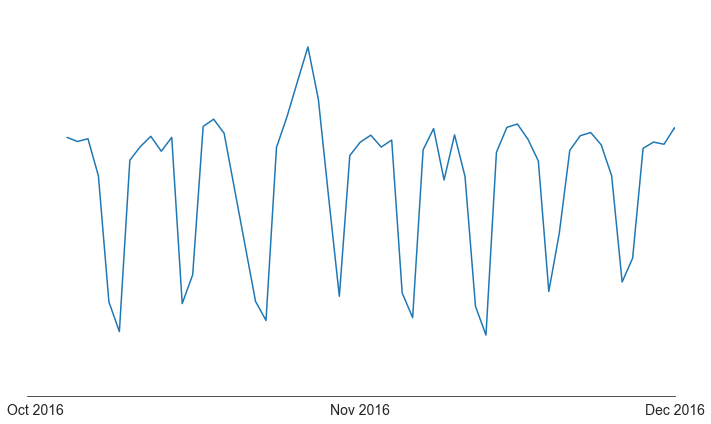

In [16]:
plt.figure(figsize=(10,6))
sns.lineplot(park.Day, park.Occupancy, ci=None)
plt.xticks(months)
plt.yticks([])
plt.xlim(None, pd.datetime(2016, 12, 1))
plt.ylim(0, 570)
sns.despine(left=True)
plt.xlabel('')
plt.ylabel('')
plt.tight_layout();

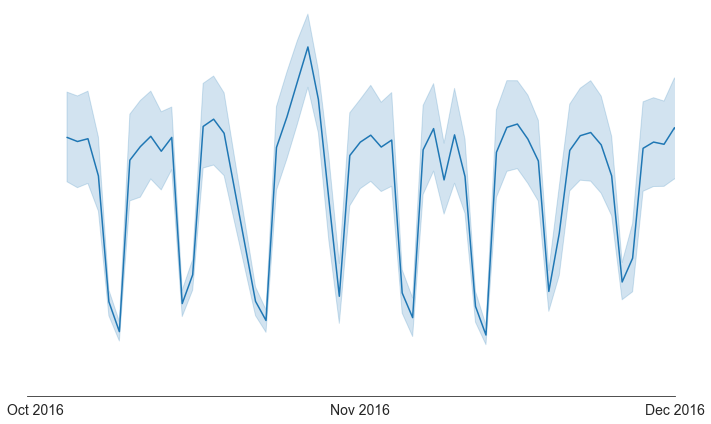

In [17]:
plt.figure(figsize=(10,6))
sns.lineplot(park.Day, park.Occupancy)
plt.xticks(months)
plt.yticks([])
plt.xlim(None, pd.datetime(2016, 12, 1))
plt.ylim(0, 570)
sns.despine(left=True)
plt.xlabel('')
plt.ylabel('')
plt.tight_layout();

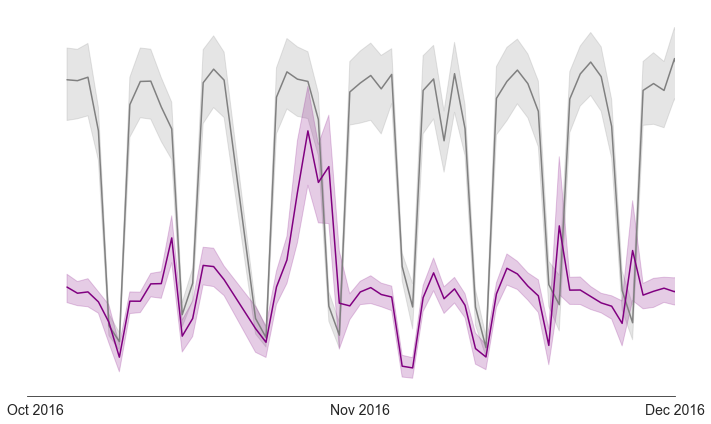

In [18]:
plt.figure(figsize=(10,6))
sns.lineplot(park.Day, park.Occupancy, hue=park.Location, palette=['gray', 'purple'])
plt.xticks(months)
plt.yticks([])
plt.xlim(None, pd.datetime(2016, 12, 1))
sns.despine(left=True)
plt.xlabel('')
plt.ylabel('')
plt.legend([], frameon=False)
plt.tight_layout();

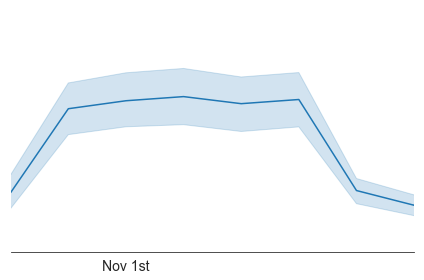

In [19]:
plt.rc('date.autoformatter', day='%b 1st')
plt.figure(figsize=(6,4))
sns.lineplot(park.Day, park.Occupancy)
plt.xticks(months)
plt.yticks([])
plt.xlim(pd.datetime(2016, 10, 30), pd.datetime(2016, 11, 6))
sns.despine(left=True)
plt.ylim(0, 600)
plt.xlabel('')
plt.ylabel('')
plt.tight_layout();

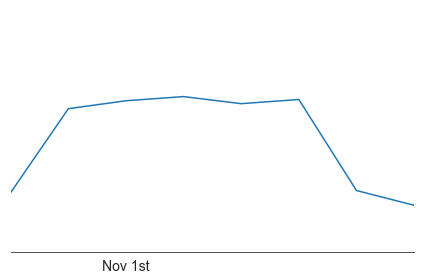

In [20]:
plt.rc('date.autoformatter', day='%b 1st')
plt.figure(figsize=(6,4))
sns.lineplot(park.Day, park.Occupancy, ci=None)
plt.xticks(months)
plt.yticks([])
plt.xlim(pd.datetime(2016, 10, 30), pd.datetime(2016, 11, 6))
plt.ylim(0, 600)
sns.despine(left=True)
plt.xlabel('')
plt.ylabel('')
plt.tight_layout();

In [21]:
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)

## Basics

In [22]:
sns.set_style('dark')

In [23]:
months = [pd.datetime(2016, 10, 1), 
          pd.datetime(2016, 11, 1), 
          pd.datetime(2016, 12, 1)]
plt.rc('date.autoformatter', day='%b %Y');

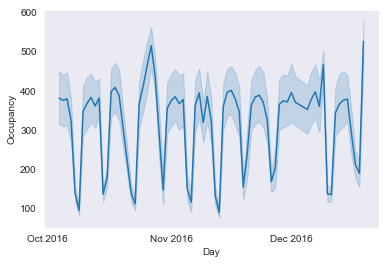

In [24]:
sns.lineplot(park.Day, park.Occupancy)
plt.xticks(months);

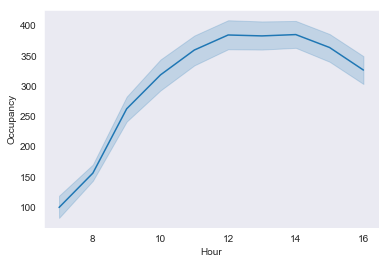

In [25]:
sns.lineplot(park.Hour, park.Occupancy);

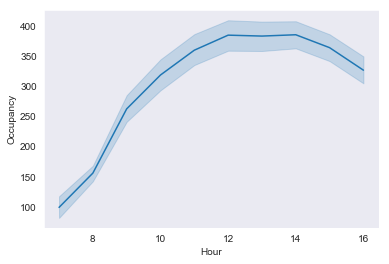

In [26]:
sns.lineplot(x='Hour', y='Occupancy', data=park);

## Bootstrapping

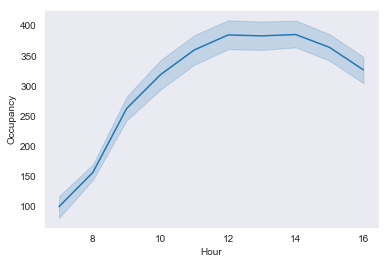

In [27]:
sns.lineplot(x='Hour', y='Occupancy', data=park,
             n_boot=1000 
            );

Decreasing the number of bootstrap samples will increase variance of confidence intervals.

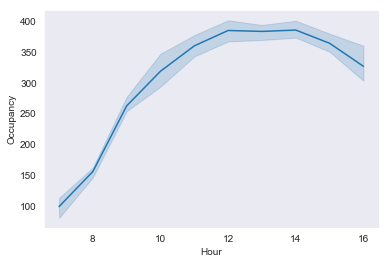

In [28]:
sns.lineplot(x='Hour', y='Occupancy', data=park,
             n_boot=10
            );

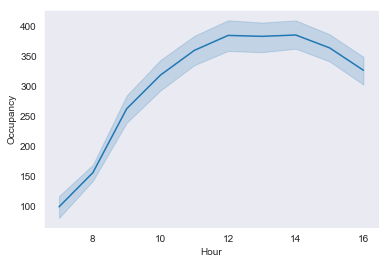

In [29]:
sns.lineplot(x='Hour', y='Occupancy', data=park,
             ci=95
            );

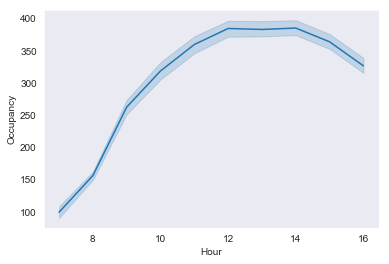

In [30]:
sns.lineplot(x='Hour', y='Occupancy', data=park,
             ci=68
            );

To turn off the bootstrapped confidence intervals, set `ci=None` to trigger early exit within Seaborn code.  (A conditional checks for this case and completely bypasses the bootstrapping procedure if `ci` is set to `None`.  This saves time if confidence intervals are not needed!)

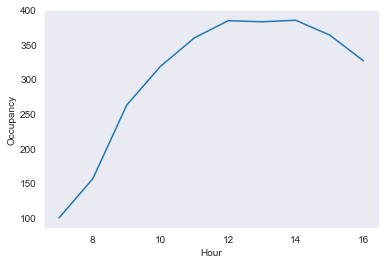

In [31]:
sns.lineplot(x='Hour', y='Occupancy', data=park,
             ci=None
            );

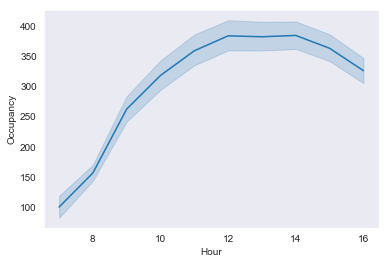

In [32]:
sns.lineplot(x='Hour', y='Occupancy', data=park,
             estimator='mean'
            );

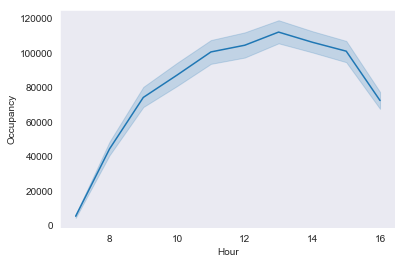

In [33]:
sns.lineplot(x='Hour', y='Occupancy', data=park,
             estimator='sum'
            );

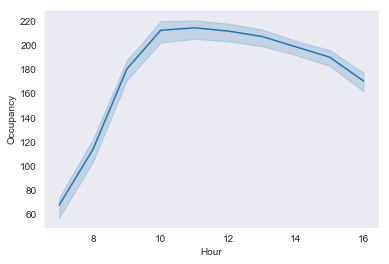

In [34]:
sns.lineplot(x='Hour', y='Occupancy', data=park,
             estimator='std'
            );

## Visual Semantics

### hue

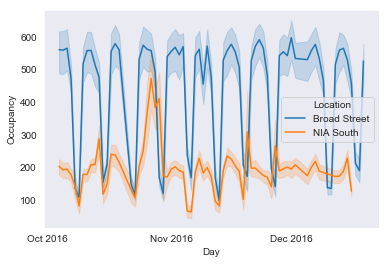

In [35]:
sns.lineplot(x='Day', y='Occupancy', data=park, hue='Location')

plt.xticks(months);

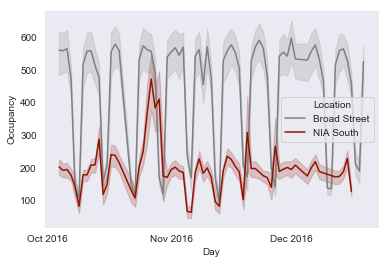

In [36]:
sns.lineplot(x='Day', y='Occupancy', data=park, 
             hue='Location',
             palette = ['gray', 'xkcd:brick red']
            )

plt.xticks(months);

### style

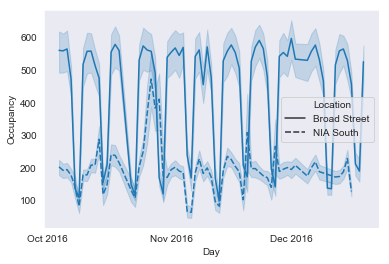

In [37]:
sns.lineplot(x='Day', y='Occupancy', data=park, style='Location')

plt.xticks(months);

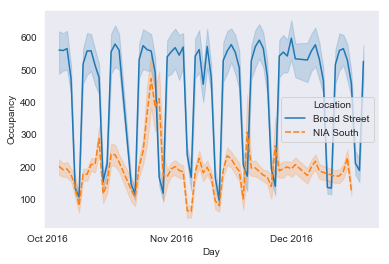

In [38]:
sns.lineplot(x='Day', y='Occupancy', data=park,
             hue="Location",
             style='Location'
            )

plt.xticks(months);

### size

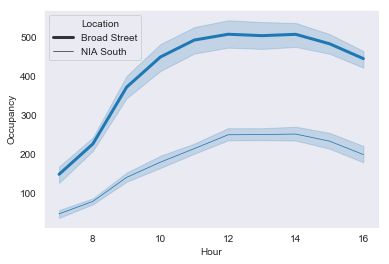

In [39]:
sns.lineplot(x='Hour', y='Occupancy', data=park, size='Location',
            );

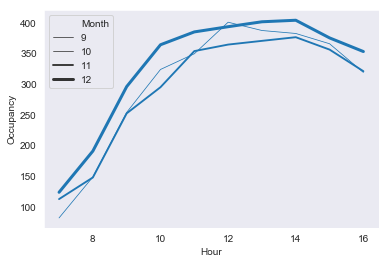

In [40]:
sns.lineplot(x='Hour', y='Occupancy', data=park, ci=None,
             size='Month'
            );

## Style

Most of matplotlib's line styling works within the Seaborn lineplot.  (The main exception is that `linestyle` does not work.)

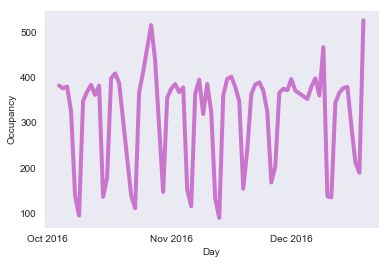

In [41]:
sns.lineplot(x='Day', y='Occupancy', data=park, ci=None, 
             lw=4,
             color='#aa00aa',
             alpha=0.5
            )

plt.xticks(months);

# Seaborn: regplot

In [1]:
import seaborn as sns
from matplotlib import pyplot as plt

In [2]:
diamonds = sns.load_dataset('diamonds')

diamonds.shape

(53940, 10)

In [3]:
diamonds.head()

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


In [4]:
diamonds = diamonds.sample(n=200, random_state=44)

diamonds.shape

(200, 10)

## Intro Visuals

In [ ]:
import numpy as np

In [ ]:
sns.set_style('white')
plt.rc('xtick', labelsize=14)
plt.rc('ytick', labelsize=14)

In [ ]:
blue, orange, green, red = sns.color_palette()[:4]

In [ ]:
x_vals = np.random.rand(100)*5
y_vals_posTwo = x_vals*2 + np.random.rand(100)*4
y_vals_posHalf = x_vals*0.5 + np.random.rand(100)*3 + 2
y_vals_negOne = x_vals*(-1) + np.random.rand(100)*3 + 6

In [ ]:
plt.figure(figsize=(3, 5))
sns.regplot(x_vals, y_vals_posTwo, scatter_kws={'alpha': 0.4}, line_kws={'lw': 4})
sns.despine()
plt.xlim(0, 5)
plt.ylim(0, 12)
plt.tight_layout();

In [ ]:
plt.figure(figsize=(3, 5))
sns.regplot(x_vals, y_vals_posHalf, scatter_kws={'alpha': 0.4}, line_kws={'lw': 4})
sns.despine()
plt.xlim(0, 5)
plt.ylim(0, 12)
plt.tight_layout();

In [ ]:
plt.figure(figsize=(3, 5))
sns.regplot(x_vals, y_vals_negOne, scatter_kws={'alpha': 0.4}, line_kws={'lw': 4})
sns.despine()
plt.xlim(0, 5)
plt.ylim(0, 12)
plt.tight_layout();

In [ ]:
plt.figure(figsize=(3, 5))
plt.gca().set(xlim=(0, 5))
sns.regplot(x_vals, y_vals_posTwo, scatter=False, ci=None, line_kws={'lw': 4})
sns.despine()
plt.xlim(0, 5)
plt.ylim(0, 12)
plt.tight_layout();

In [ ]:
plt.figure(figsize=(3, 5))
plt.gca().set(xlim=(0, 5))
sns.regplot(x_vals, y_vals_posHalf, scatter=False, ci=None, line_kws={'lw': 4})
sns.despine()
plt.xlim(0, 5)
plt.ylim(0, 12)
plt.tight_layout();

In [ ]:
plt.figure(figsize=(3, 5))
plt.gca().set(xlim=(0, 5))
sns.regplot(x_vals, y_vals_negOne, scatter=False, ci=None, line_kws={'lw': 4})
sns.despine()
plt.xlim(0, 5)
plt.ylim(0, 12)
plt.tight_layout();

In [ ]:
plt.figure(figsize=(3, 5))
plt.gca().set(xlim=(0, 5))
sns.regplot(x_vals, y_vals_posHalf, fit_reg=False)
sns.despine()
plt.xlim(0, 5)
plt.ylim(0, 12)
plt.tight_layout();

In [ ]:
plt.figure(figsize=(3, 5))
plt.gca().set(xlim=(0, 5))
sns.regplot(x_vals, y_vals_posTwo, fit_reg=False)
sns.despine()
plt.xlim(0, 5)
plt.ylim(0, 12)
plt.tight_layout();

In [ ]:
plt.figure(figsize=(3, 5))
plt.gca().set(xlim=(0, 5))
sns.regplot(x_vals, y_vals_negOne, fit_reg=False)
sns.despine()
plt.xlim(0, 5)
plt.ylim(0, 12)
plt.tight_layout();

In [ ]:
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)

## Basics

In [5]:
sns.set_style('dark')

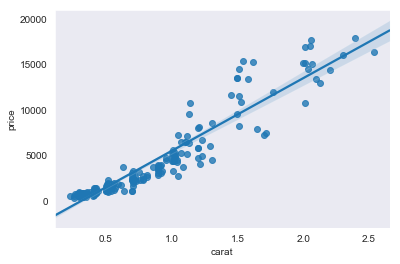

In [6]:
sns.regplot(diamonds.carat, diamonds.price);

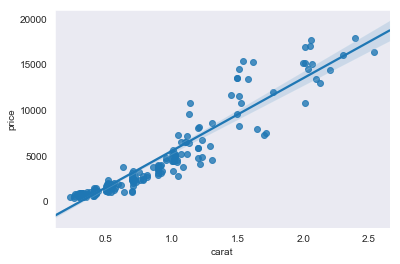

In [7]:
sns.regplot(x='carat', y='price', data=diamonds);

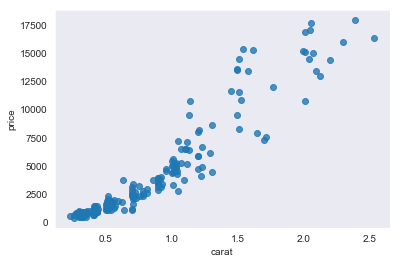

In [8]:
sns.regplot(x='carat', y='price', data=diamonds, fit_reg=False);

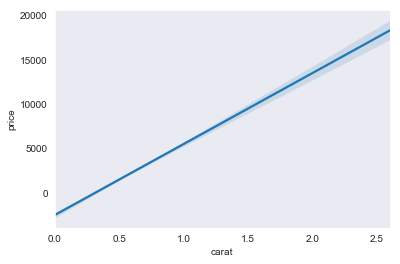

In [9]:
plt.gca().set(xlim=(0,2.6))
sns.regplot(x='carat', y='price', data=diamonds, scatter=False);

## regplot Options

### Confidence Intervals

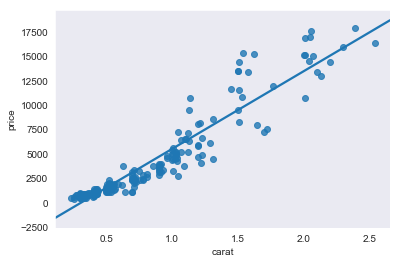

In [10]:
sns.regplot(x='carat', y='price', data=diamonds,
            ci=None
            );

### Discrete Variables

In [11]:
cut_map = {
    'Fair': 1,
    'Good': 2,
    'Very Good': 3,
    'Premium': 4,
    'Ideal': 5
}

diamonds['cut_value'] = diamonds.cut.map(cut_map)

In [12]:
diamonds.cut_value.value_counts()

5    80
4    63
3    39
2    11
1     7
Name: cut_value, dtype: int64

#### Jitter

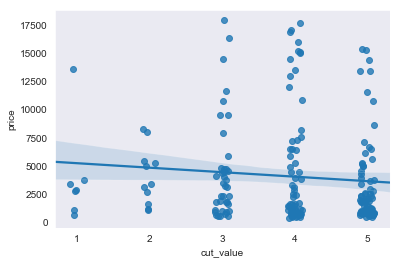

In [13]:
sns.regplot(x='cut_value', y='price', data=diamonds,
            x_jitter=0.1
           );

#### Estimator Aggregate

In [14]:
import numpy as np

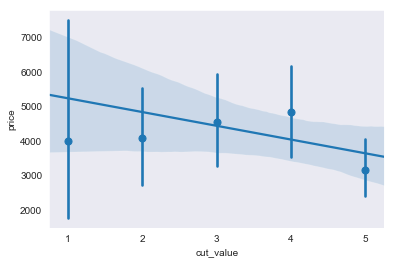

In [15]:
sns.regplot(x='cut_value', y='price', data=diamonds,
            x_estimator=np.mean
           );

### Models

#### Polynomial Regression (order)

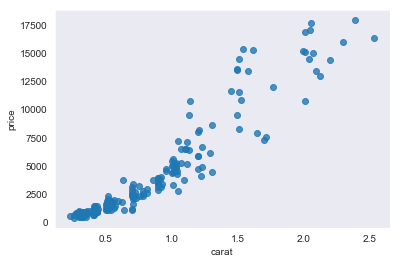

In [16]:
sns.regplot(x='carat', y='price', data=diamonds,
            fit_reg=False
               );

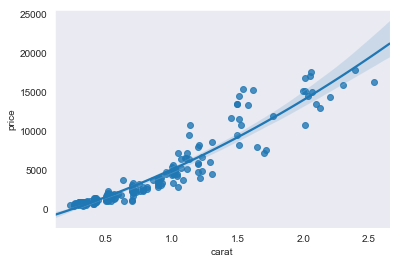

In [17]:
sns.regplot(x='carat', y='price', data=diamonds,
            order=2
            );

#### Robust Regression

In [18]:
x_example=[0, 0.5, 1, 1.5, 2, 2.5, 3, 3.5, 4, 4.5, 5]
y_example=[0.1, 0.8, 2.2, 2.7, 3.8, 4.5, 6.2, 6.8, 7.9, 9.4, 30.4]

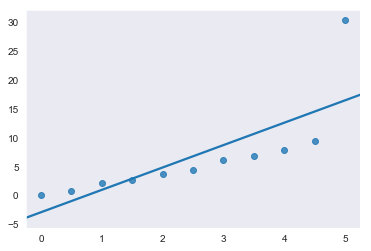

In [19]:
sns.regplot(x=x_example, 
            y=y_example,
            ci=None
            );

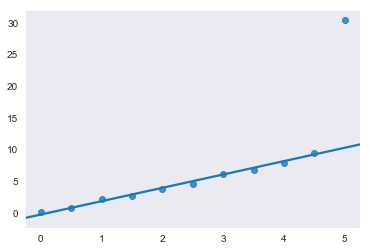

In [20]:
sns.regplot(x=x_example, 
            y=y_example,
            ci=None,
            robust=True
            );

## Styling

In [21]:
sns.set_style('white')

### marker

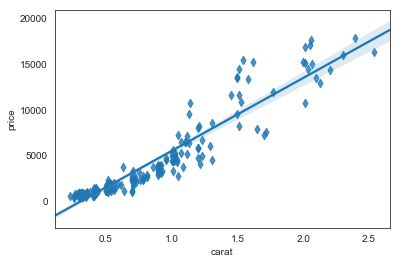

In [22]:
sns.regplot(x='carat', y='price', data=diamonds,  
            marker='d'
            );

### scatter_kws

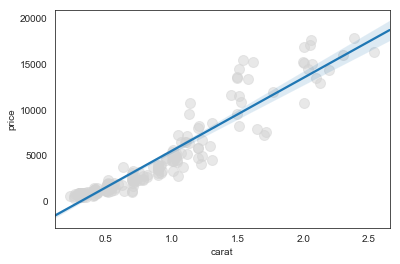

In [23]:
sns.regplot(x='carat', y='price', data=diamonds,
            scatter_kws={'s': 100, 'alpha': 0.5, 'color': 'lightgray'}
            );

### line_kws

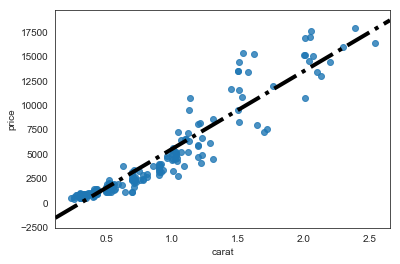

In [24]:
sns.regplot(x='carat', y='price', data=diamonds,
            ci=None,
            line_kws={'lw': 4, 'color': 'black', 'linestyle': '-.'}
            );

## Related Seaborn Plots

In [26]:
blue, orange, green, red = sns.color_palette()[:4]

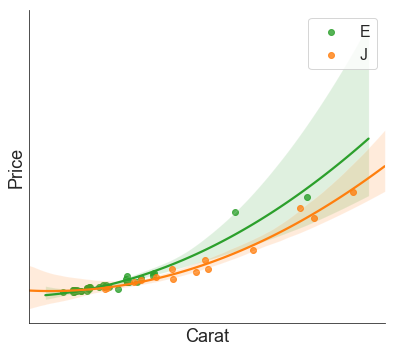

In [27]:
p = sns.lmplot(x='carat', y='price', 
               data=diamonds[diamonds.color.isin(['E', 'J'])], 
               hue='color', 
               order=2,
               palette=[green, orange])
plt.xlabel('Carat', fontsize=18)
plt.ylabel('Price', fontsize=18)
p._legend.remove()
plt.legend(fontsize=16)
plt.xticks([])
plt.yticks([])
plt.tight_layout();

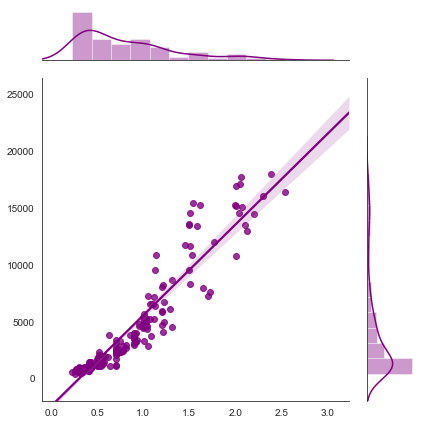

In [28]:
sns.jointplot(x='carat', y='price', data=diamonds, 
              kind='reg', 
              color='purple')
plt.xlabel('')
plt.ylabel('')
plt.xlim(-0.1, None)
plt.ylim(-2000, None)
plt.tight_layout();

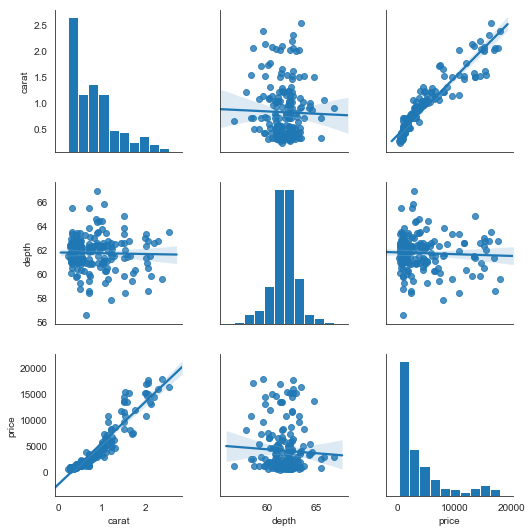

In [29]:
sns.pairplot(diamonds[['carat', 'depth', 'price']], 
             kind='reg', 
             palette='colorblind')
plt.tight_layout();

# Seaborn: heatmap

In [1]:
import seaborn as sns

from matplotlib import pyplot as plt
import numpy as np

In [2]:
cars = sns.load_dataset('mpg')

In [3]:
cars.head()

,mpg,cylinders,displacement,horsepower,weight,acceleration,model_year,origin,name
0,18.0,8,307.0,130.0,3504,12.0,70,usa,chevrolet chevelle malibu
1,15.0,8,350.0,165.0,3693,11.5,70,usa,buick skylark 320
2,18.0,8,318.0,150.0,3436,11.0,70,usa,plymouth satellite
3,16.0,8,304.0,150.0,3433,12.0,70,usa,amc rebel sst
4,17.0,8,302.0,140.0,3449,10.5,70,usa,ford torino


## Intro Visuals

In [4]:
plt.rc('xtick', labelsize=14)
plt.rc('ytick', labelsize=14)

In [5]:
xlabels = ['Mon', 'Tues', 'Wed', 'Thurs', 'Fri']
ylabels = ['Coffee', 'Juice', 'Soda', 'Tea']

orders = np.array([[44, 31, 50, 41, 30], 
                   [21, 12, 28, 38, 35],
                   [15, 18, 20, 14, 12],
                   [38, 29, 39, 26, 11]]
                 )

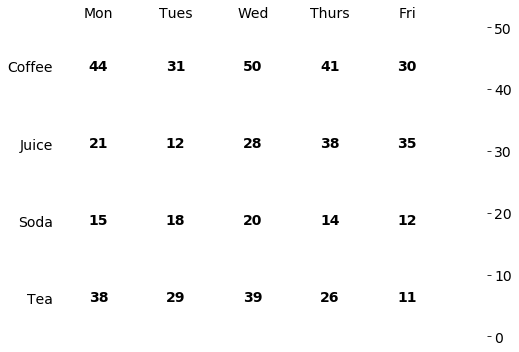

In [6]:
plt.figure(figsize=(8,5))
sns.heatmap(orders, 
            cmap='YlOrBr',
            vmin=0,
            xticklabels=xlabels,
            yticklabels=ylabels,
            annot=True,
            alpha=0,
            square=True,
            annot_kws={'fontsize':14, 'fontweight': 'bold', 'color': 'black'}
           )
plt.yticks(rotation=0)
plt.tick_params(
    which='both',      
    bottom=False,      
    left=False,      
    labelbottom=False,
    labeltop=True) 
plt.tight_layout();

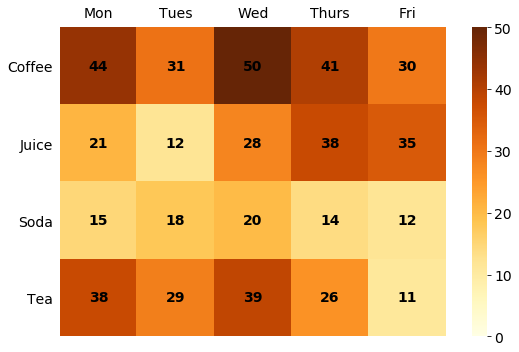

In [7]:
plt.figure(figsize=(8,5))
sns.heatmap(orders, 
            cmap='YlOrBr',
            vmin=0,
            xticklabels=xlabels,
            yticklabels=ylabels,
            annot=True,
            square=True,
            annot_kws={'fontsize':14, 'fontweight': 'bold', 'color': 'black'}
           )
plt.yticks(rotation=0)
plt.tick_params(
    which='both',      
    bottom=False,      
    left=False,      
    labelbottom=False,
    labeltop=True) 
plt.tight_layout();

#### Color Palette Overlay

In [8]:
origin_cyl_arr = np.array([[  0.,  63.,   3.,   4.,   0.],
                           [  4.,  69.,   0.,   6.,   0.],
                           [  0.,  72.,   0.,  74., 103.]])

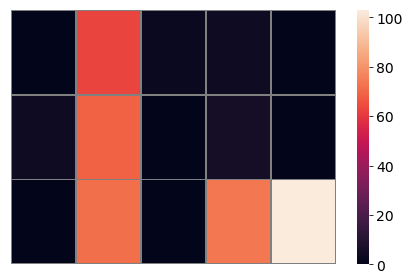

In [9]:
sns.heatmap(origin_cyl_arr, 
            xticklabels=[], 
            yticklabels=[],
            cmap='rocket',
            linewidth=1,
            linecolor='gray'
           )
plt.tight_layout();

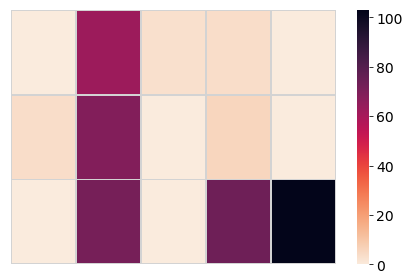

In [10]:
sns.heatmap(origin_cyl_arr, 
            xticklabels=[], 
            yticklabels=[],
            cmap='rocket_r',
            linewidth=1,
            linecolor='lightgray'
           )
plt.tight_layout();

#### Annotation Overlay

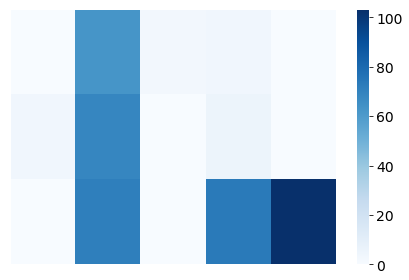

In [11]:
sns.heatmap(origin_cyl_arr, 
            xticklabels=[], 
            yticklabels=[],
            cmap='Blues'
           )
plt.tight_layout();

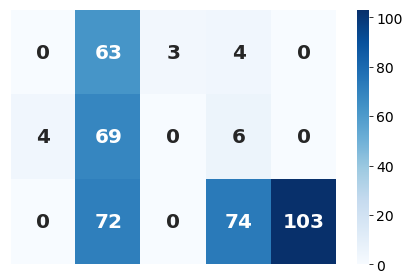

In [12]:
sns.heatmap(origin_cyl_arr, 
            xticklabels=[], 
            yticklabels=[],
            cmap='Blues',
            annot=True,
            fmt='.0f',
            annot_kws={'fontsize':20, 'fontweight': 'bold'}
           )
plt.tight_layout();
plt.savefig('11heatmap_example_withannot.svg')

In [13]:
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)

## Basics

In [14]:
cars.groupby('origin').cylinders.value_counts()

origin  cylinders
europe  4             63
        6              4
        5              3
japan   4             69
        6              6
        3              4
usa     8            103
        6             74
        4             72
Name: cylinders, dtype: int64

In [15]:
(cars
 .groupby('origin')
 .cylinders
 .value_counts()
 .unstack()
 .fillna(0)
)

cylinders,3,4,5,6,8
origin,,,,,
europe,0.0,63.0,3.0,4.0,0.0
japan,4.0,69.0,0.0,6.0,0.0
usa,0.0,72.0,0.0,74.0,103.0


In [16]:
origin_cyl = (
    cars
    .groupby('origin')
    .cylinders
    .value_counts()
    .unstack()
    .fillna(0)
)

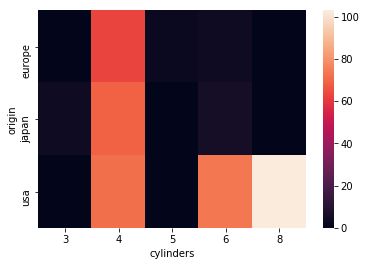

In [17]:
sns.heatmap(origin_cyl);

### Arrays

In [18]:
test_array = np.array([[1, 2], [3, 4]])

test_array

array([[1, 2],
       [3, 4]])

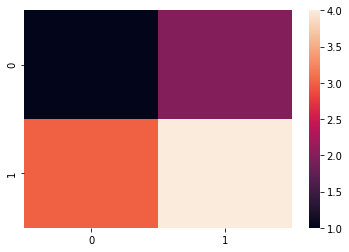

In [19]:
sns.heatmap(test_array);

### Transpose

In [20]:
origin_cyl.T

origin,europe,japan,usa
cylinders,,,
3,0.0,4.0,0.0
4,63.0,69.0,72.0
5,3.0,0.0,0.0
6,4.0,6.0,74.0
8,0.0,0.0,103.0


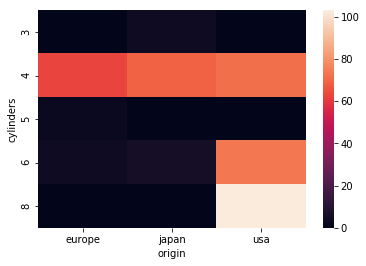

In [22]:
sns.heatmap(origin_cyl.T);

### Correlation

In [23]:
cars.corr()

,mpg,cylinders,displacement,horsepower,weight,acceleration,model_year
mpg,1.000000,-0.775396,-0.804203,-0.778427,-0.831741,0.420289,0.579267
cylinders,-0.775396,1.000000,0.950721,0.842983,0.896017,-0.505419,-0.348746
displacement,-0.804203,0.950721,1.000000,0.897257,0.932824,-0.543684,-0.370164
horsepower,-0.778427,0.842983,0.897257,1.000000,0.864538,-0.689196,-0.416361
weight,-0.831741,0.896017,0.932824,0.864538,1.000000,-0.417457,-0.306564
acceleration,0.420289,-0.505419,-0.543684,-0.689196,-0.417457,1.000000,0.288137
model_year,0.579267,-0.348746,-0.370164,-0.416361,-0.306564,0.288137,1.000000


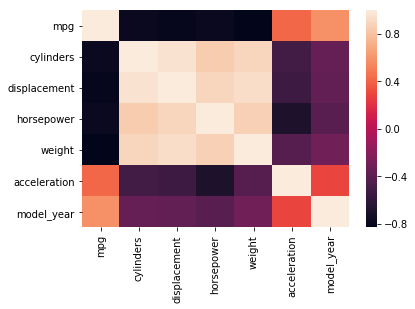

In [24]:
sns.heatmap(cars.corr());

## Color Palette

Seaborn offers 170 different color palette options.  Check out this great [post](https://medium.com/@morganjonesartist/color-guide-to-seaborn-palettes-da849406d44f) to view them all.

We'll start with a SEQUENTIAL palette.

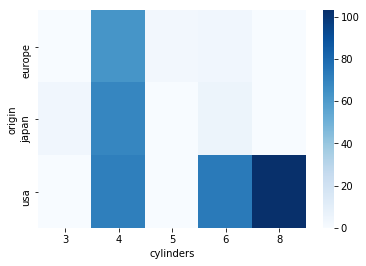

In [25]:
sns.heatmap(origin_cyl, cmap="Blues");

Now let's try a DIVERGING palette.

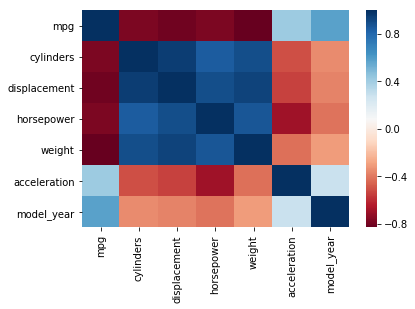

In [26]:
sns.heatmap(cars.corr(), cmap='RdBu');

### Controling the Colorbar Range: center, vmax, vmin

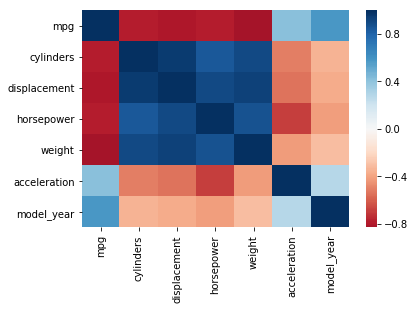

In [27]:
sns.heatmap(cars.corr(), cmap='RdBu', center=0);

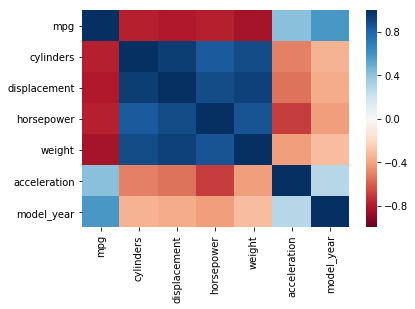

In [28]:
sns.heatmap(cars.corr(), cmap='RdBu', vmin=-1, vmax=1);

## Annotations

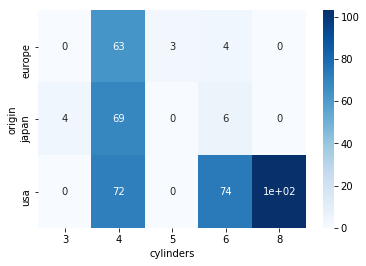

In [29]:
sns.heatmap(origin_cyl, cmap='Blues', annot=True);

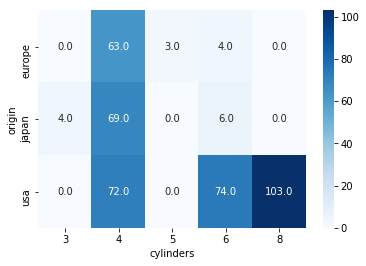

In [30]:
sns.heatmap(origin_cyl, cmap='Blues', annot=True, fmt=".0f");  #fmt=".1f" for one decimal place

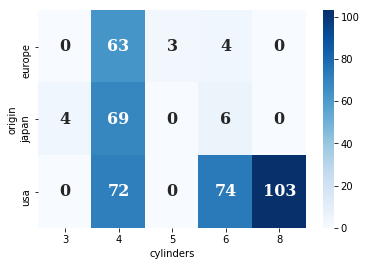

In [31]:
sns.heatmap(origin_cyl, 
            cmap='Blues', 
            annot=True, 
            fmt=".0f",
            annot_kws={
                'fontsize': 16,
                'fontweight': 'bold',
                'fontfamily': 'serif',
               # 'color': 'black'
            }
           );

## Styling

### linewidth

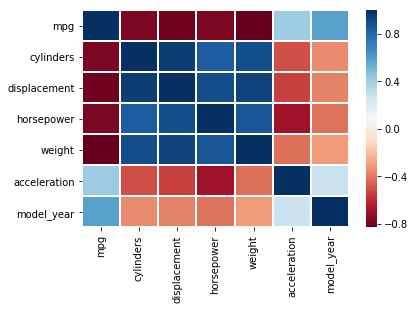

In [32]:
sns.heatmap(cars.corr(), cmap='RdBu', linewidth=1);

### linecolor

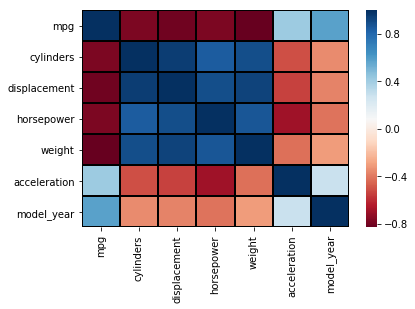

In [33]:
sns.heatmap(cars.corr(), 
            cmap='RdBu', 
            linewidth=1,
            linecolor='black'
           );

### Tick Labels

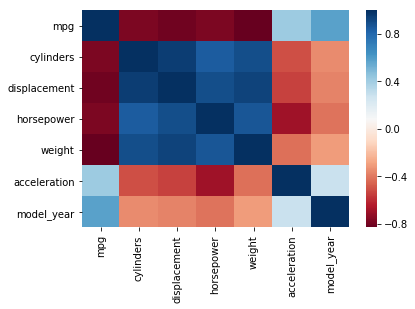

In [34]:
sns.heatmap(cars.corr(), cmap='RdBu');

In [35]:
labels = ['MPG', 'Cylinders', 'Displacement', 'Horsepower',
          'Weight', 'Acceleration', 'Model Year'
         ]

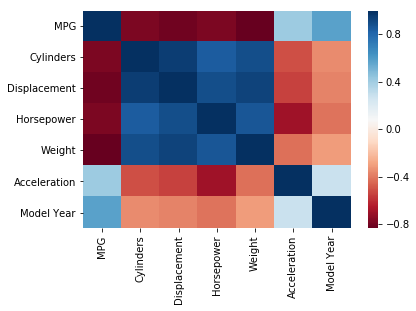

In [36]:
sns.heatmap(cars.corr(), 
            cmap='RdBu',
            xticklabels=labels,
            yticklabels=labels
           );

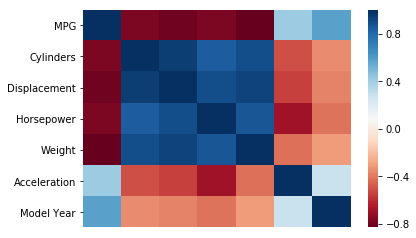

In [37]:
sns.heatmap(cars.corr(), 
            cmap='RdBu', 
            xticklabels=False,
            yticklabels=labels
           );

### square

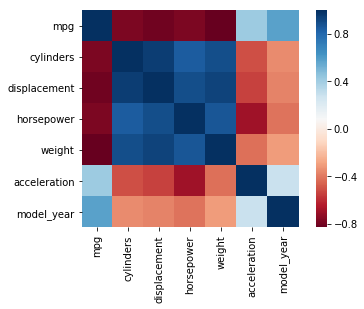

In [38]:
sns.heatmap(cars.corr(), 
            cmap='RdBu',
            square=True
           );

# Seaborn: pairplot

In [1]:
import seaborn as sns

from matplotlib import pyplot as plt
import numpy as np

In [2]:
tips = sns.load_dataset('tips')

In [3]:
tips.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


## Intro Visuals

In [4]:
plt.rc('xtick', labelsize=12)
plt.rc('ytick', labelsize=12)
plt.rc('axes', labelsize=14)    

In [5]:
sns.set_style('darkgrid')

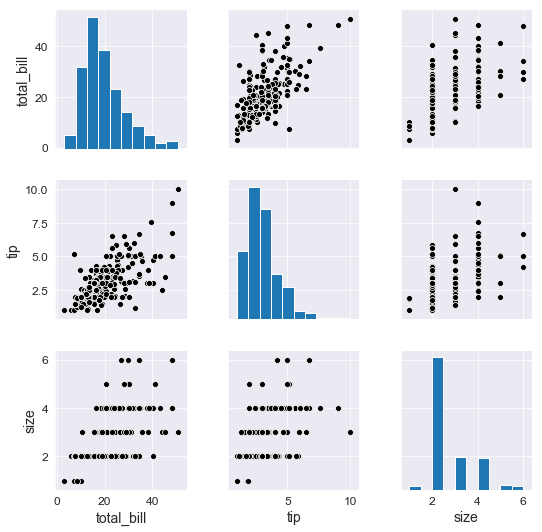

In [6]:
sns.pairplot(tips,  plot_kws={'color':'black'})
plt.tight_layout();

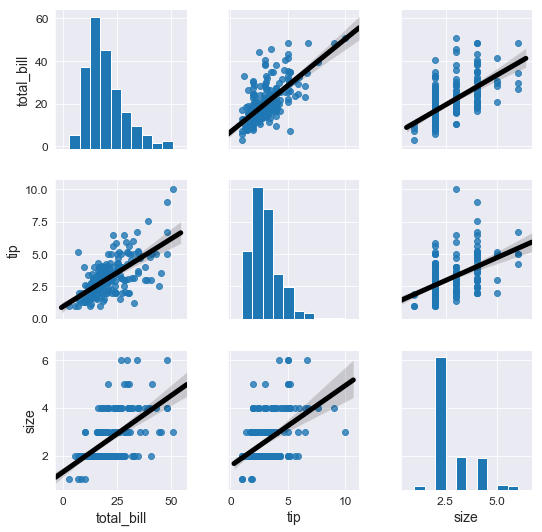

In [7]:
sns.pairplot(tips, kind='reg', plot_kws={'line_kws': {'color':'black', 'lw': 5}})
plt.tight_layout();

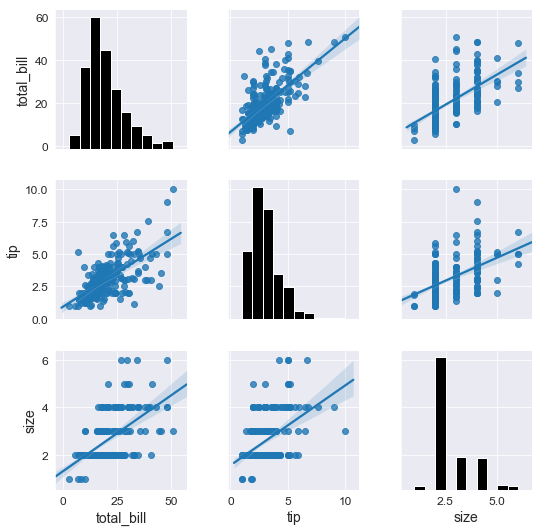

In [8]:
sns.pairplot(tips, kind='reg',
             diag_kws={'color': 'black'}
            )
plt.tight_layout();

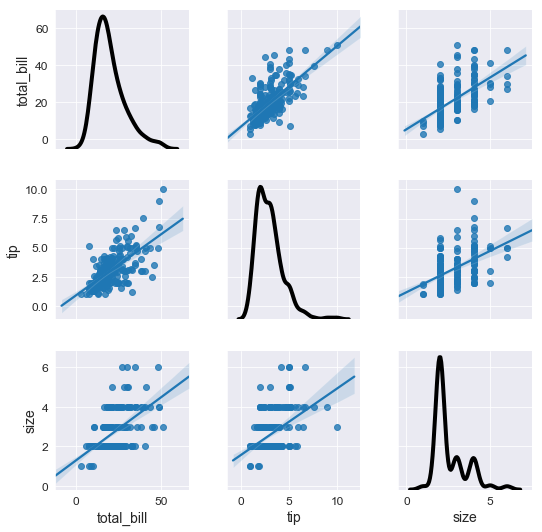

In [9]:
sns.pairplot(tips, diag_kind='kde', kind='reg',
             diag_kws={'color': 'black', 'shade':False, 'lw': 4}
            )
plt.tight_layout();

In [10]:
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)
plt.rc('axes', labelsize=10)

## Basics

In [11]:
sns.set_style('darkgrid')

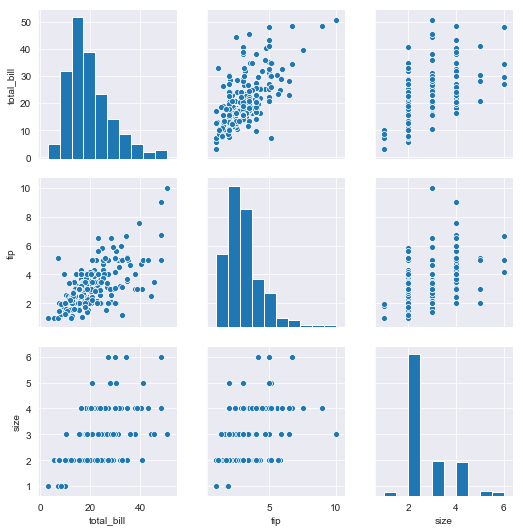

In [12]:
sns.pairplot(tips);

In [13]:
tips.dtypes

total_bill     float64
tip            float64
sex           category
smoker        category
day           category
time          category
size             int64
dtype: object

Note that the axes tick labels correspond to the bivariate, relational plots and NOT the distribution plots.

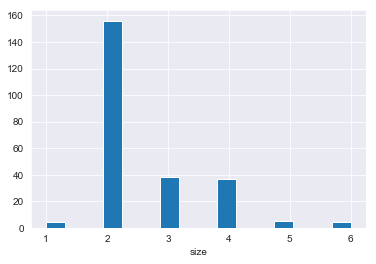

In [14]:
sns.distplot(tips['size'], 
             kde=False, 
             hist_kws={'alpha':1});  

## Plot Kinds

### diag_kind

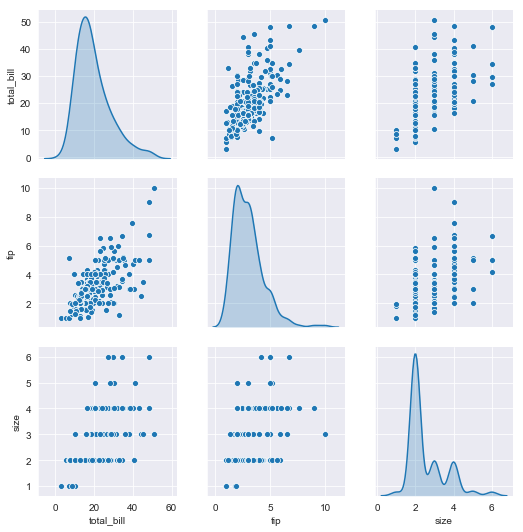

In [15]:
sns.pairplot(tips, diag_kind='kde');

### kind

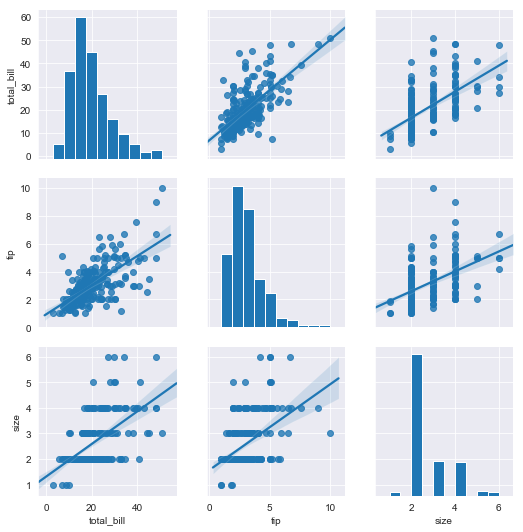

In [16]:
sns.pairplot(tips, kind='reg');

### Returns PairGrid

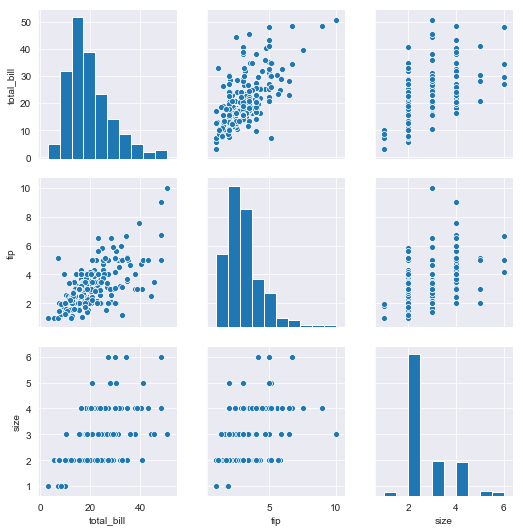

In [17]:
g = sns.pairplot(tips)

In [18]:
type(g)

seaborn.axisgrid.PairGrid

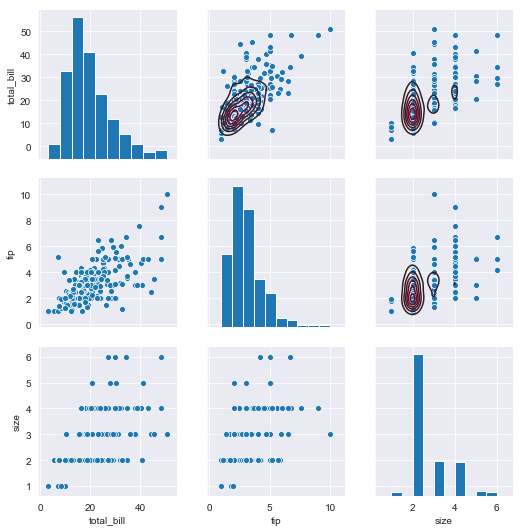

In [19]:
g = sns.pairplot(tips)
g.map_upper(sns.kdeplot, n_levels=6, color='xkcd:wine red');

## Categorical and Specific Variables

In [20]:
tips['weekend'] = tips.day.isin(['Sat', 'Sun'])

In [21]:
tips.head()

,total_bill,tip,sex,smoker,day,time,size,weekend
0,16.99,1.01,Female,No,Sun,Dinner,2,True
1,10.34,1.66,Male,No,Sun,Dinner,3,True
2,21.01,3.50,Male,No,Sun,Dinner,3,True
3,23.68,3.31,Male,No,Sun,Dinner,2,True
4,24.59,3.61,Female,No,Sun,Dinner,4,True


### hue

/usr/local/lib/python3.7/site-packages/statsmodels/nonparametric/kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
/usr/local/lib/python3.7/site-packages/statsmodels/nonparametric/kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


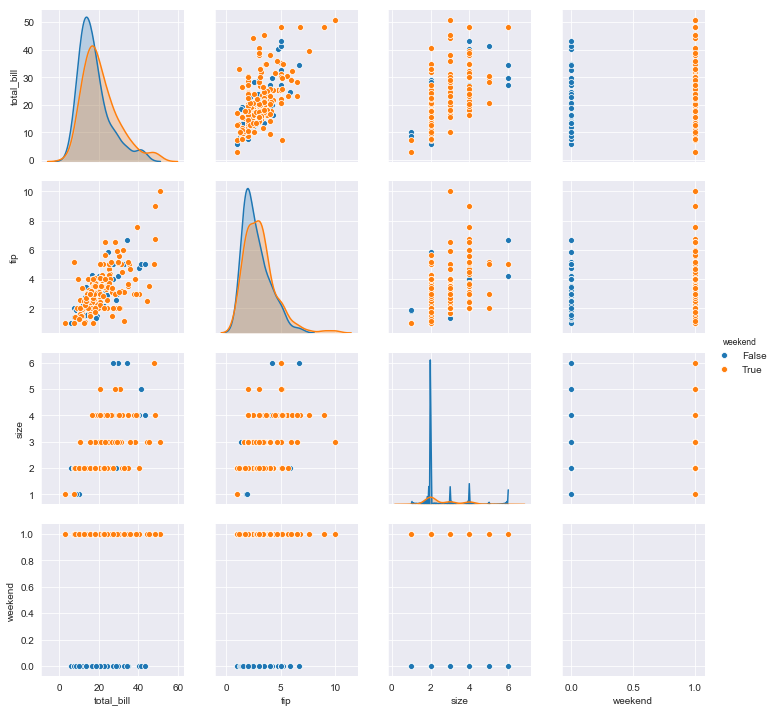

In [22]:
sns.pairplot(tips, hue='weekend');

In [23]:
tips.dtypes

total_bill     float64
tip            float64
sex           category
smoker        category
day           category
time          category
size             int64
weekend           bool
dtype: object

### vars, x_vars, y_vars

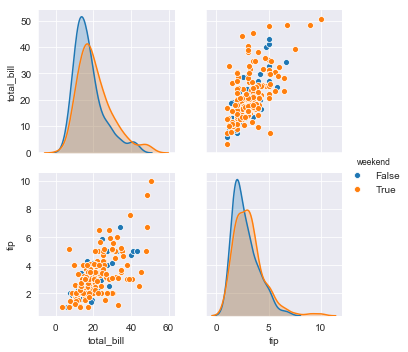

In [24]:
sns.pairplot(tips, hue='weekend', vars=['total_bill', 'tip']);

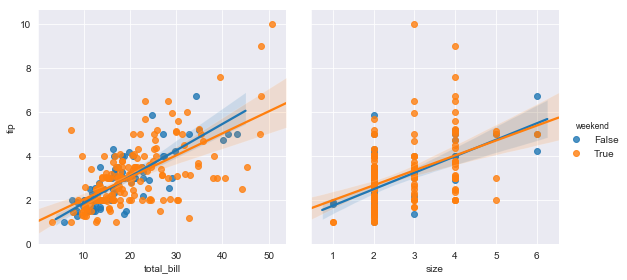

In [25]:
sns.pairplot(tips, 
             hue='weekend', 
             y_vars=['tip'],
             x_vars=['total_bill', 'size'],
             kind='reg', 
             height=4);

## Styling

In [26]:
del tips['weekend']

### height, aspect

In [27]:
from ipywidgets import interactive

def size_widget(height=2.5, aspect=1):
    sns.pairplot(tips, height=height, aspect=aspect)

In [28]:
interactive(size_widget, height=(1, 3.5, 0.5), aspect=(0.5, 2, 0.25))

interactive(children=(FloatSlider(value=2.5, description='height', max=3.5, min=1.0, step=0.5), FloatSlider(va…

### palette

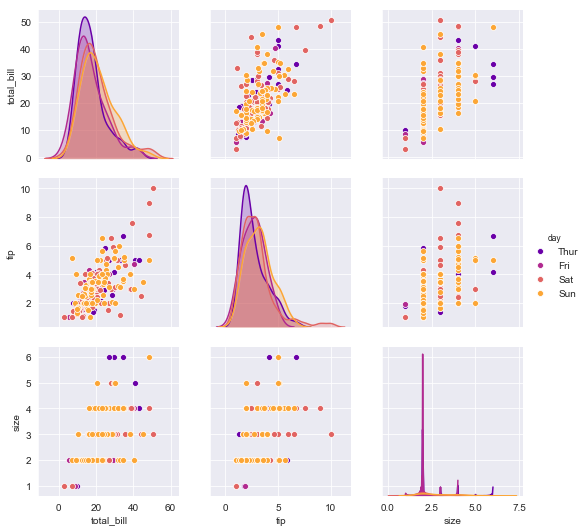

In [29]:
sns.pairplot(tips, hue='day', palette='plasma');

### diag_kws, plot_kws

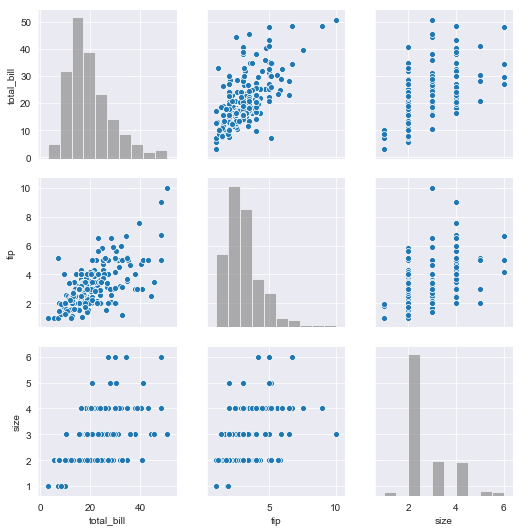

In [30]:
sns.pairplot(tips, diag_kws={'color': 'gray', 'alpha': 0.6});

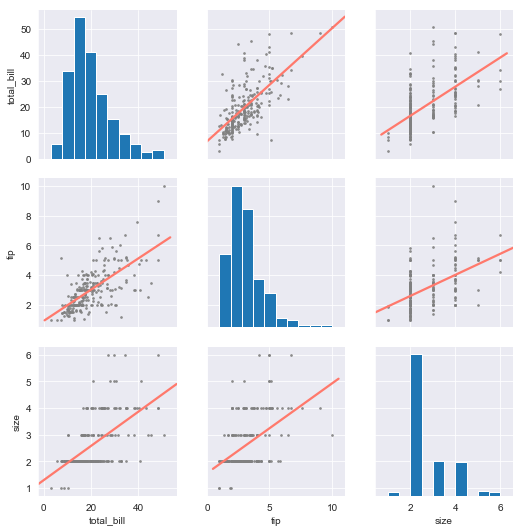

In [31]:
sns.pairplot(tips, 
             kind='reg',
             plot_kws={'ci':None, 'color': 'xkcd:salmon',
                       'scatter_kws': {'color': 'gray', 's': 3}
                      }
            );

# Seaborn: jointplot

In [1]:
import seaborn as sns

from matplotlib import pyplot as plt
import matplotlib

In [2]:
sns.__version__

'0.11.0'

In [3]:
matplotlib.__version__

'3.3.2'

In [4]:
geyser = sns.load_dataset('geyser')

In [5]:
geyser.head()

,duration,waiting,kind
0,3.600,79,long
1,1.800,54,short
2,3.333,74,long
3,2.283,62,short
4,4.533,85,long


In [6]:
geyser.shape

(272, 3)

## Intro Visuals

In [7]:
plt.rc('xtick', labelsize=12)
plt.rc('ytick', labelsize=12)
plt.rc('axes', labelsize=14)    

In [8]:
sns.set_style('white')

import numpy as np

my_color = '#643db8'

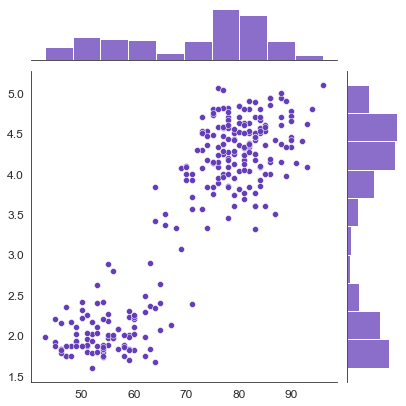

In [9]:
j = sns.jointplot(x='waiting', y='duration', data=geyser, color=my_color)
j.ax_joint.set_xlabel('')
j.ax_joint.set_ylabel('');

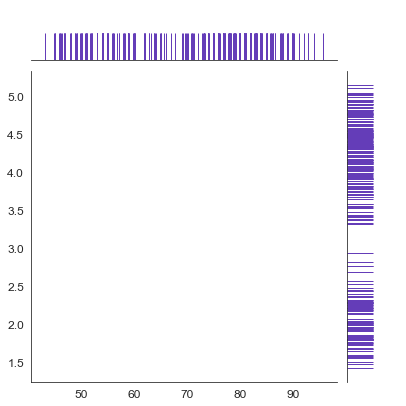

In [11]:
j = sns.jointplot(x='waiting', y='duration', 
                  data=geyser.iloc[:, :-1]+np.random.normal(0, 0.15, size=geyser.iloc[:, :-1].shape), #adding "jitter"
                  color='white')
j.plot_marginals(sns.rugplot, height=.5, color=my_color)
j.ax_joint.set_xlabel('')
j.ax_joint.set_ylabel('');

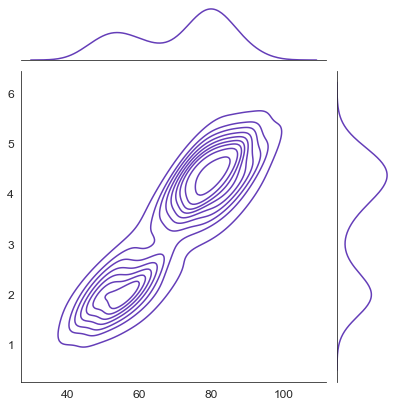

In [14]:
j = sns.jointplot(x='waiting', y='duration', data=geyser, color=my_color, kind='kde')
j.ax_joint.set_xlabel('')
j.ax_joint.set_ylabel('');

### Thumbnail Figure

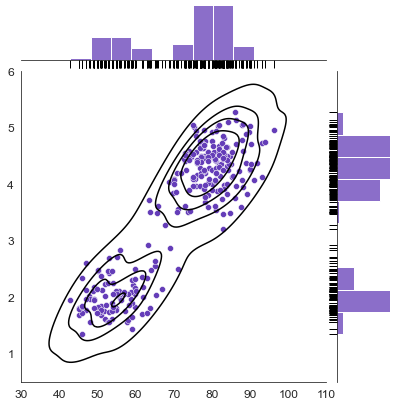

In [12]:
j = sns.jointplot(x='waiting', y='duration', 
                  data=geyser.iloc[:, :-1]+np.random.normal(0, 0.15, size=geyser.iloc[:, :-1].shape), #adding "jitter"
                  color= my_color)
j.plot_marginals(sns.rugplot, height=-.15, color='black', clip_on=False)
j.plot_joint(sns.kdeplot, color='black', levels=5)
j.ax_joint.set_xlabel('')
j.ax_joint.set_ylabel('')
j.ax_joint.set_ylim(0.5, 6)
j.ax_joint.set_xlim(30, 110);

In [15]:
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)
plt.rc('axes', labelsize=10)

## Basics

In [16]:
sns.set_style('darkgrid')

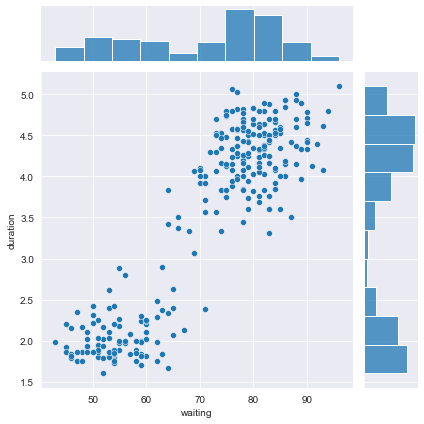

In [17]:
sns.jointplot(x=geyser.waiting, y=geyser.duration);

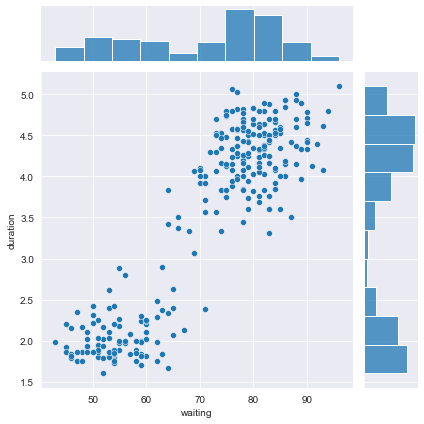

In [18]:
sns.jointplot(x='waiting', y='duration', data=geyser);

## Plot Kinds

There are currently six kinds of jointplots allowed in seaborn:
1. scatter (default)
2. kde
3. reg 
4. hist
5. hex
6. resid

### scatter (Default)

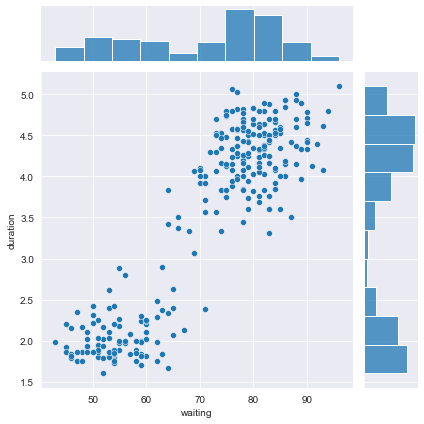

In [19]:
sns.jointplot(x='waiting', y='duration', data=geyser,
              kind='scatter'
             );

### kde

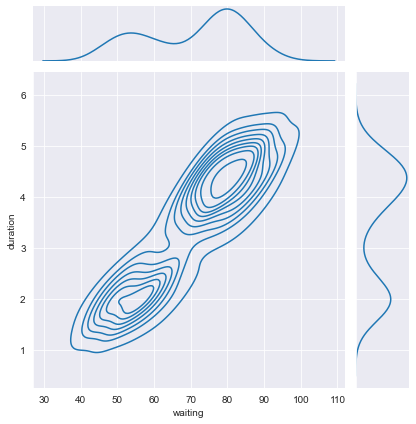

In [20]:
sns.jointplot(x='waiting', y='duration', data=geyser,
              kind='kde'
             );

### reg

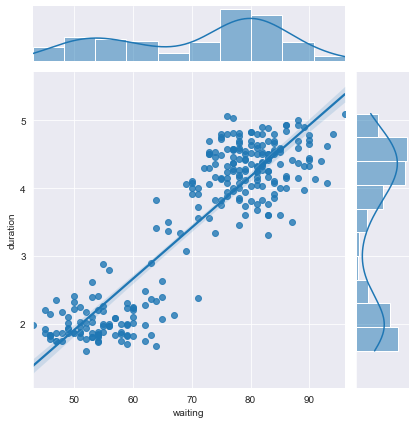

In [21]:
sns.jointplot(x='waiting', y='duration', data=geyser,
              kind='reg'
             );

### hist

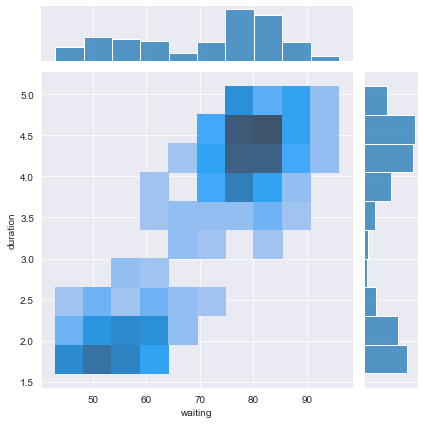

In [22]:
sns.jointplot(x='waiting', y='duration', data=geyser,
              kind='hist'
             );

### Returns JointGrid

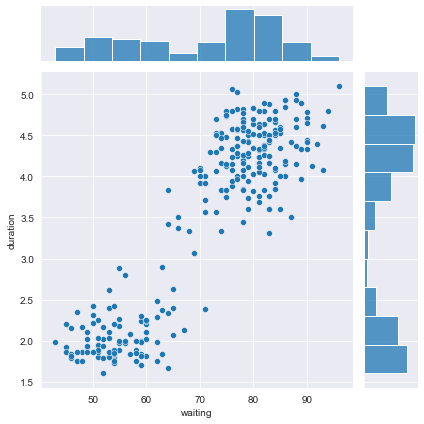

In [23]:
g = sns.jointplot(x='waiting', y='duration', data=geyser);

In [24]:
type(g)

seaborn.axisgrid.JointGrid

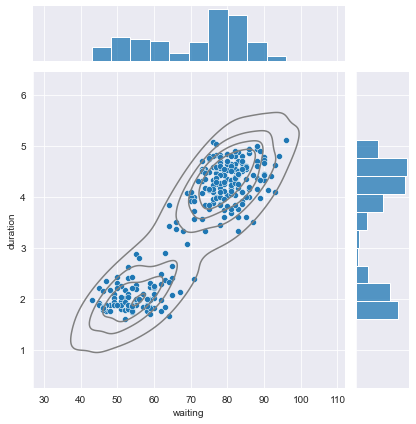

In [25]:
g.plot_joint(sns.kdeplot, color='gray', levels=5);

## Categorical Variables

In [26]:
geyser.head()

,duration,waiting,kind
0,3.600,79,long
1,1.800,54,short
2,3.333,74,long
3,2.283,62,short
4,4.533,85,long


### hue

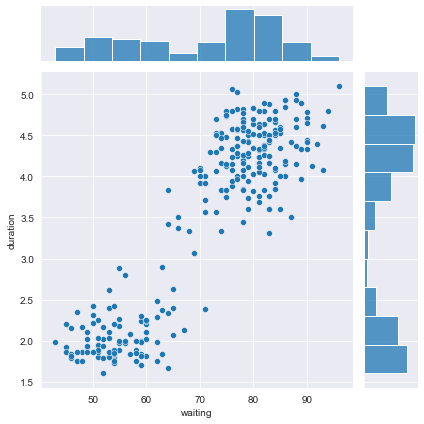

In [27]:
sns.jointplot(x='waiting', y='duration', data=geyser);

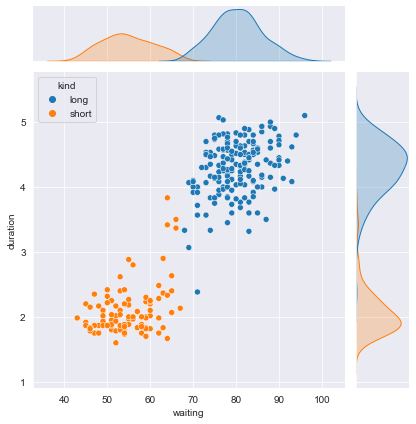

In [28]:
sns.jointplot(x='waiting', y='duration', data=geyser,
              hue='kind'
             );

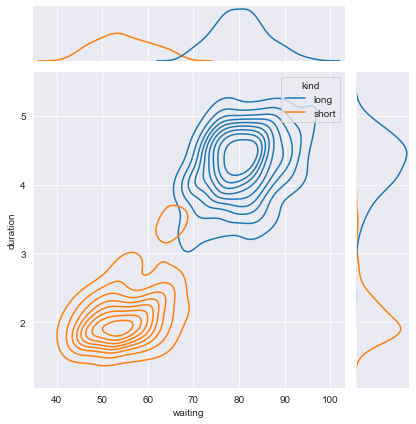

In [29]:
sns.jointplot(x='waiting', y='duration', data=geyser,
              hue='kind',
              kind='kde'
             );

## Styling

### color, palette

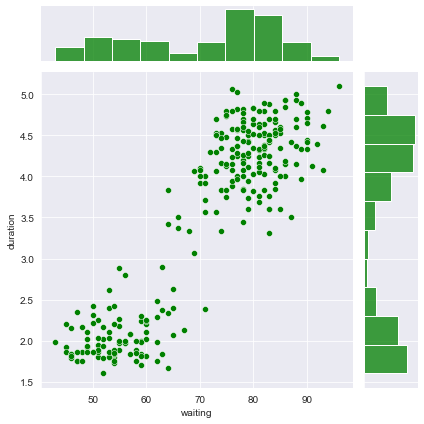

In [30]:
sns.jointplot(x='waiting', y='duration', data=geyser,
              color='green'
             );

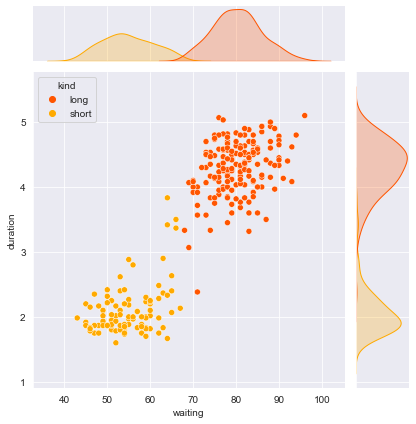

In [31]:
sns.jointplot(x='waiting', y='duration', data=geyser,
              hue='kind',
              palette='autumn'
             );

### height, space, ratio

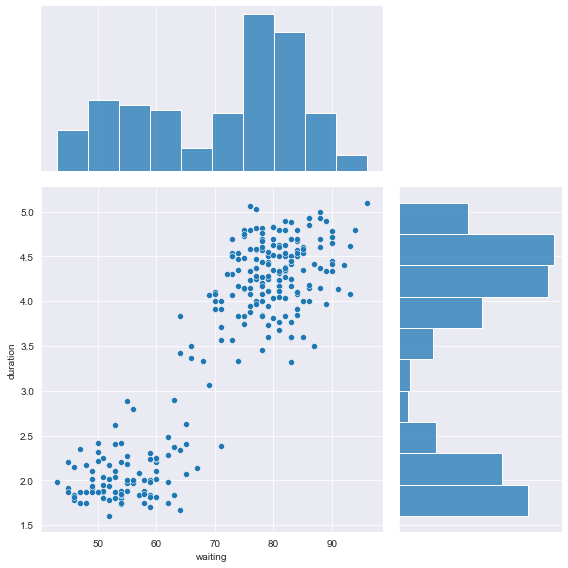

In [32]:
sns.jointplot(x='waiting', y='duration', data=geyser,
              height=8,   #Default: 6
              space=0.1,  #Default: 0.2
              ratio=2     #Default: 5
             );

### joint_kws

Joint keywords should match the figure type in the middle of the jointplot.

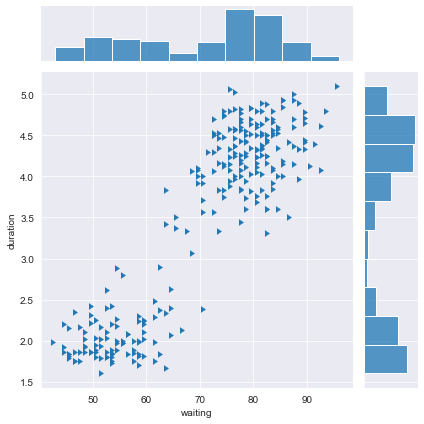

In [33]:
sns.jointplot(x='waiting', y='duration', data=geyser,
              joint_kws={'marker': 5}
             );

In [ ]:
sns.jointplot(x='waiting', y='duration', data=geyser,
              kind='reg',
              joint_kws={'ci': None, 'order': 2}
             );

### marginal_kws

Marginal keywords should match the type of plot for the marginal distribution plots (the outside plots).

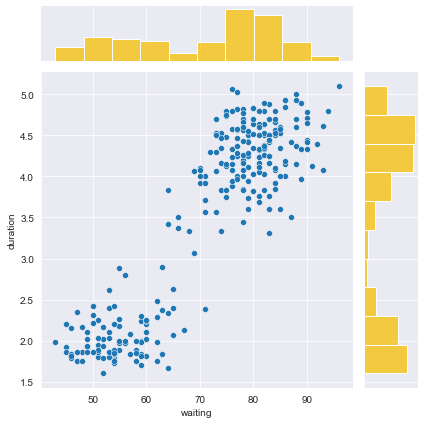

In [34]:
sns.jointplot(x='waiting', y='duration', data=geyser,
              marginal_kws={'color': 'xkcd:golden'}
             );

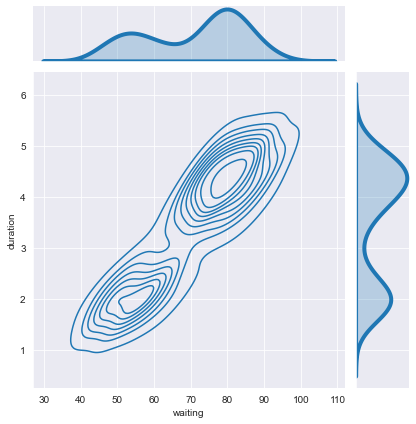

In [35]:
sns.jointplot(x='waiting', y='duration', data=geyser,
              kind='kde',
              marginal_kws={'lw': 4, 'shade': True}
             );

# Seaborn: barplot

In [1]:
import seaborn as sns

import numpy as np
import pandas as pd
from matplotlib import pyplot as plt

In [2]:
penguins = sns.load_dataset('penguins')

In [3]:
penguins.head()

,species,island,culmen_length_mm,culmen_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female


In [4]:
penguins.shape

(344, 7)

## Intro Visuals

In [5]:
plt.rc('xtick', labelsize=12)
plt.rc('ytick', labelsize=12)
plt.rc('axes', labelsize=14)    

In [6]:
sns.set_style('white')

In [7]:
pen_pal = {'Gentoo': '#2F8F8F',
           'Adelie': '#F79021',
           'Chinstrap': '#A200EF'
          }

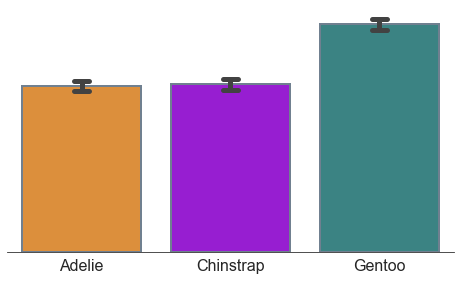

In [8]:
plt.figure(figsize=(8, 4.5))
sns.barplot(x='species', y='body_mass_g', data=penguins, 
            palette=pen_pal, errwidth=5, capsize=0.1, ci=99.5, edgecolor='slategray', linewidth=2)
sns.despine(left=True)
#plt.ylabel('Body Mass (g)')
plt.xlabel('')
plt.ylabel('')
plt.yticks([])
plt.xticks(fontsize=16);

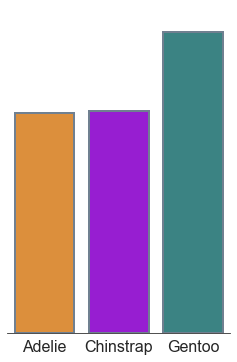

In [9]:
plt.figure(figsize=(4, 6))
sns.barplot(x='species', y='body_mass_g', data=penguins, 
            palette=pen_pal, errwidth=5, capsize=0.1, ci=None, edgecolor='slategray', linewidth=2)
sns.despine(left=True)
#plt.ylabel('Body Mass (g)')
plt.xlabel('')
plt.ylabel('')
plt.ylim(0, 5500)
plt.yticks([])
plt.xticks(fontsize=16);

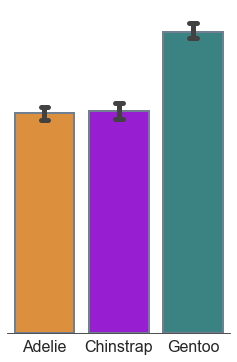

In [10]:
plt.figure(figsize=(4, 6))
sns.barplot(x='species', y='body_mass_g', data=penguins, 
            palette=pen_pal, errwidth=5, capsize=0.1, ci=99.5, edgecolor='slategray', linewidth=2)
sns.despine(left=True)
#plt.ylabel('Body Mass (g)')
plt.xlabel('')
plt.ylabel('')
plt.ylim(0, 5500)
plt.yticks([])
plt.xticks(fontsize=16);

In [11]:
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)
plt.rc('axes', labelsize=10)

## Basics

In [12]:
sns.set_style('darkgrid')

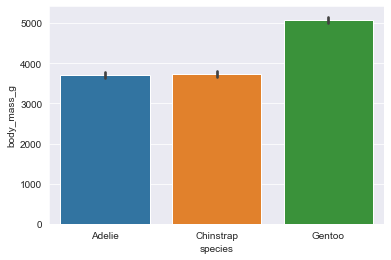

In [13]:
sns.barplot(x='species', y='body_mass_g', data=penguins);

In [14]:
penguins.groupby('species').body_mass_g.mean()

species
Adelie       3700.662252
Chinstrap    3733.088235
Gentoo       5076.016260
Name: body_mass_g, dtype: float64

### Horizontal Barplot

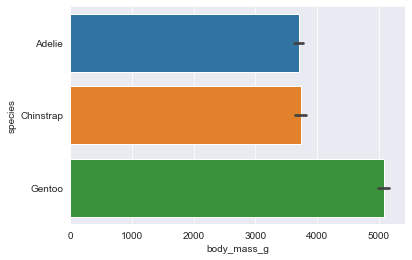

In [15]:
sns.barplot(x='body_mass_g', y='species', data=penguins);

## Interval Estimates


### Confidence Interval (`ci`)

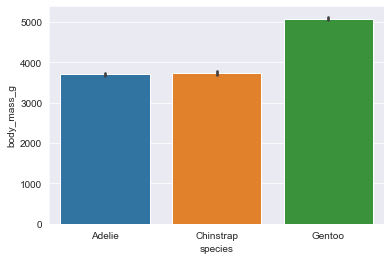

In [16]:
sns.barplot(x='species', y='body_mass_g', 
            data=penguins,
            ci=68
           );

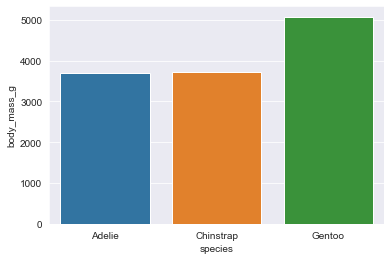

In [17]:
sns.barplot(x='species', y='body_mass_g', 
            data=penguins,
            ci=None
           );

## Estimator

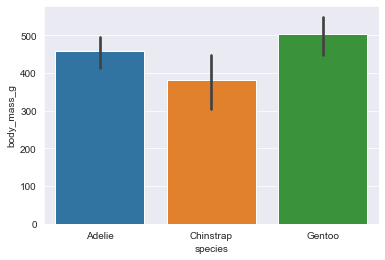

In [18]:
sns.barplot(x='species', y='body_mass_g', 
            data=penguins,
            estimator=np.std
           );

In [19]:
penguins.groupby('species').body_mass_g.describe()

,count,mean,std,min,25%,50%,75%,max
species,,,,,,,,
Adelie,151.0,3700.662252,458.566126,2850.0,3350.0,3700.0,4000.0,4775.0
Chinstrap,68.0,3733.088235,384.335081,2700.0,3487.5,3700.0,3950.0,4800.0
Gentoo,123.0,5076.016260,504.116237,3950.0,4700.0,5000.0,5500.0,6300.0


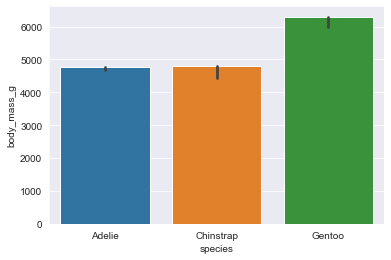

In [20]:
sns.barplot(x='species', y='body_mass_g', 
            data=penguins,
            estimator=np.max
           );

## Categorical Variables

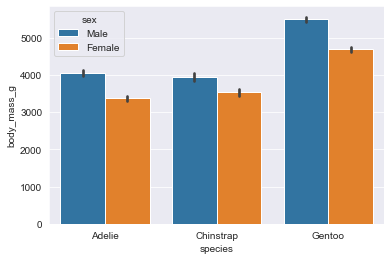

In [21]:
sns.barplot(x='species', y='body_mass_g', 
            data=penguins,
            hue='sex'
           );

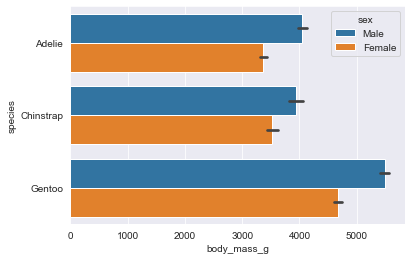

In [22]:
sns.barplot(x='body_mass_g', y='species',  
            data=penguins,
            hue='sex'
           );

### order, hue_order

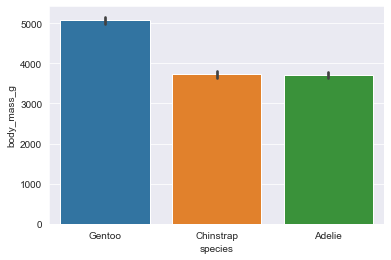

In [23]:
sns.barplot(x='species', y= 'body_mass_g', 
            data=penguins,
            order=['Gentoo', 'Chinstrap', 'Adelie']
           );

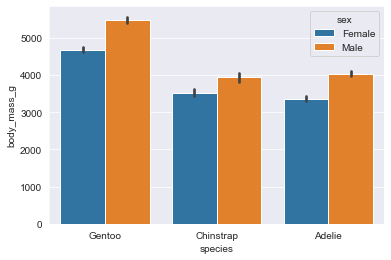

In [24]:
sns.barplot(x='species', y= 'body_mass_g', 
            hue='sex',
            order=['Gentoo', 'Chinstrap', 'Adelie'],
            hue_order=['Female', 'Male'],
            data=penguins
           );

## Styling Colors

In [25]:
sns.set_style('white')


### `color`

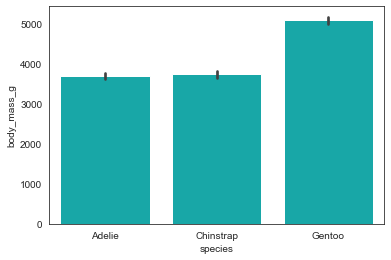

In [26]:
sns.barplot(x='species', y='body_mass_g', 
            data=penguins, 
            color='c'
           );

### `errcolor` and `errwidth`

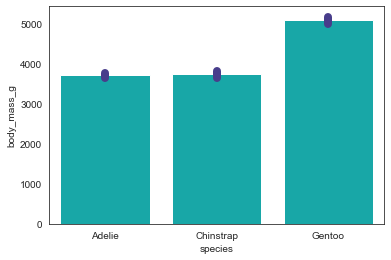

In [27]:
sns.barplot(x='species', y='body_mass_g', data=penguins, 
            color='c',
            errcolor='darkslateblue',
            errwidth=8
           );

### `palette`

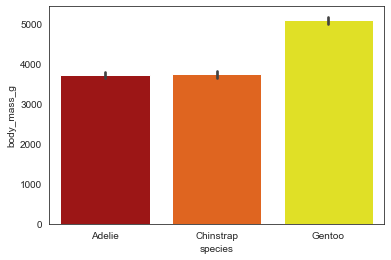

In [28]:
sns.barplot(x='species', y='body_mass_g', 
            data=penguins,
            palette='hot'
           );

### `edgecolor` and `linewidth`

The seaborn barplot inherits from matplotlib's `bar`.  Check [the docs](https://matplotlib.org/api/_as_gen/matplotlib.axes.Axes.bar.html#matplotlib.axes.Axes.bar) for more options.

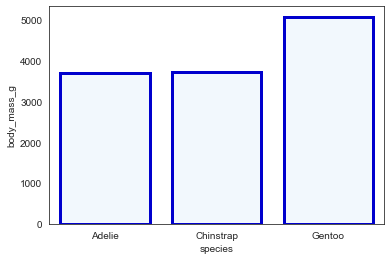

In [29]:
sns.barplot(x='species', y='body_mass_g', data=penguins, ci=None,
            color='aliceblue',
            edgecolor='mediumblue',
            lw=3
           );

## BONUS: Stacked Barplot

In [30]:
penguins_sample = penguins.dropna().groupby(['species', 'sex']).sample(3, random_state=10)

penguins_sample

,species,island,culmen_length_mm,culmen_depth_mm,flipper_length_mm,body_mass_g,sex
82,Adelie,Torgersen,36.7,18.8,187.0,3800.0,Female
6,Adelie,Torgersen,38.9,17.8,181.0,3625.0,Female
58,Adelie,Biscoe,36.5,16.6,181.0,2850.0,Female
14,Adelie,Torgersen,34.6,21.1,198.0,4400.0,Male
127,Adelie,Torgersen,41.5,18.3,195.0,4300.0,Male
109,Adelie,Biscoe,43.2,19.0,197.0,4775.0,Male
176,Chinstrap,Dream,46.7,17.9,195.0,3300.0,Female
182,Chinstrap,Dream,40.9,16.6,187.0,3200.0,Female
193,Chinstrap,Dream,46.2,17.5,187.0,3650.0,Female
171,Chinstrap,Dream,49.2,18.2,195.0,4400.0,Male


Note: I had to update my version of pandas.  

In [31]:
pd.__version__

'1.1.4'

In [32]:
from matplotlib import pyplot as plt

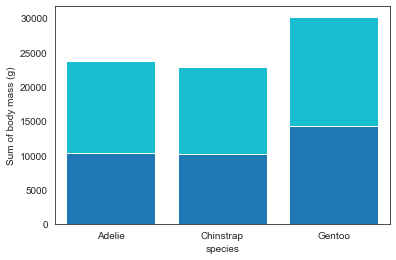

In [33]:
sns.barplot(x='species', y='body_mass_g',
            data=penguins_sample[penguins_sample.sex == 'Female'],
            color='tab:blue',
            order = ['Adelie', 'Chinstrap', 'Gentoo'],
            ci=None,
            estimator=np.sum,
            saturation=1
           )
sns.barplot(x='species', y='body_mass_g',
            data=penguins_sample[penguins_sample.sex == 'Male'],
            color='tab:cyan',
            order = ['Adelie', 'Chinstrap', 'Gentoo'],
            ci = None,
            estimator = np.sum,
            bottom=(
                penguins_sample[penguins_sample.sex == 'Female']
                .groupby('species')
                .body_mass_g
                .sum()),
            saturation=1
           )

plt.ylabel('Sum of body mass (g)');

Much, much easier to accomplish this with pandas plotting method!  ... And comes with legend already built.

In [34]:
sns.set_style('white')

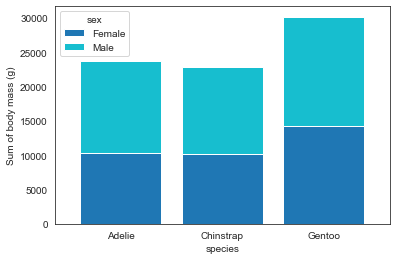

In [35]:
(penguins_sample
    .groupby(['species', 'sex'])
    .body_mass_g
    .sum()
    .unstack()
).plot(kind='bar', stacked=True, color=['tab:blue', 'tab:cyan'], width=0.8)

plt.xticks(rotation=0)
plt.ylabel('Sum of body mass (g)');

# Seaborn: histplot

In [1]:
import seaborn as sns

In [2]:
sns.__version__

'0.11.0'

In [3]:
penguins = sns.load_dataset('penguins')

In [4]:
penguins.head()

,species,island,culmen_length_mm,culmen_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female


In [5]:
penguins.shape

(344, 7)

In [6]:
penguins.dropna(inplace=True)

In [7]:
penguins.shape

(333, 7)

## Intro Visuals

`distplot` has now been deprecated.  Switch to `histplot` for histogram plots.

/usr/local/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


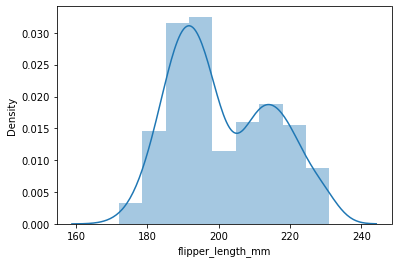

In [8]:
sns.distplot(penguins.flipper_length_mm);

In [9]:
from matplotlib import pyplot as plt

In [10]:
plt.rc('xtick', labelsize=12)
plt.rc('ytick', labelsize=12)
plt.rc('axes', labelsize=14)    

In [11]:
sns.set_style('white')

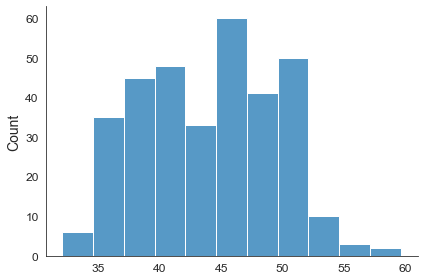

In [12]:
sns.histplot(penguins.culmen_length_mm)
sns.despine()
plt.xlabel('')
plt.tight_layout();

In [13]:
plt.rc('xtick', labelsize=14)
plt.rc('ytick', labelsize=14)  

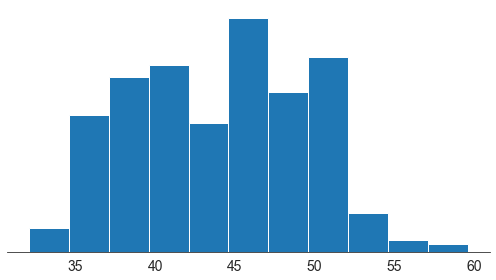

In [14]:
plt.figure(figsize=(7,4))
sns.histplot(penguins.culmen_length_mm, alpha=1)
sns.despine(left=True)
plt.yticks([])
plt.xlabel('')
plt.ylabel('')
plt.tight_layout();

In [15]:
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)
plt.rc('axes', labelsize=10)  

## Basics

In [16]:
sns.set_style('darkgrid')

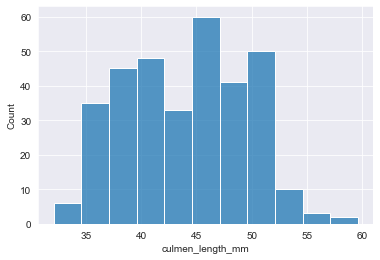

In [17]:
sns.histplot(penguins.culmen_length_mm);

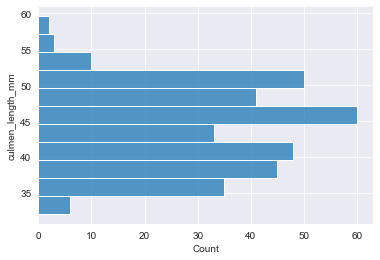

In [18]:
sns.histplot(y = 'culmen_length_mm', data=penguins);

### `kde`

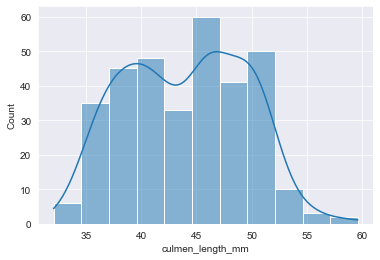

In [19]:
sns.histplot(x='culmen_length_mm', data=penguins,
             kde=True
             );

### `bins`

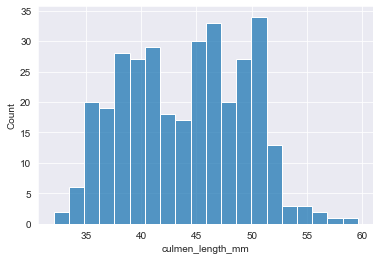

In [20]:
sns.histplot(x='culmen_length_mm', data=penguins, bins=20); 

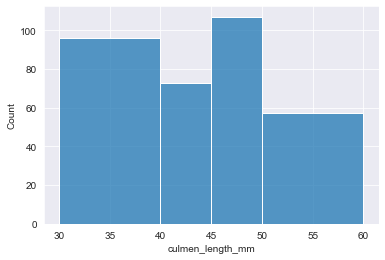

In [21]:
sns.histplot(x='culmen_length_mm', data=penguins,
             bins=[30, 40, 45, 50, 60]
             );

### `binwidth` and `binrange`

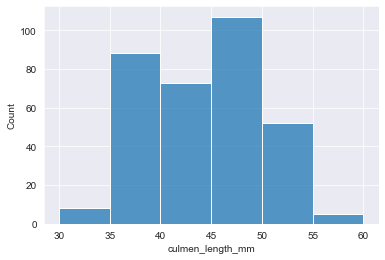

In [22]:
sns.histplot(x='culmen_length_mm', data=penguins, 
             binwidth=5, binrange=(30, 60)
            );  

## Statistics


### `stat`

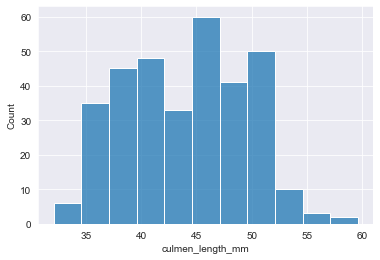

In [23]:
sns.histplot(x='culmen_length_mm', data=penguins,
             stat='count'
            );

**density** - AREA of histogram sums to one

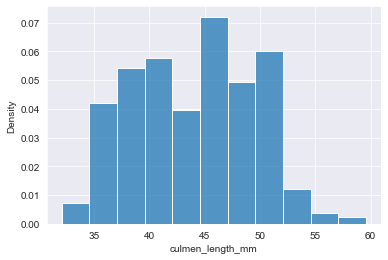

In [24]:
sns.histplot(x='culmen_length_mm', data=penguins,
             stat='density'
            );

**probability** - HEIGHT of histogram bars to one

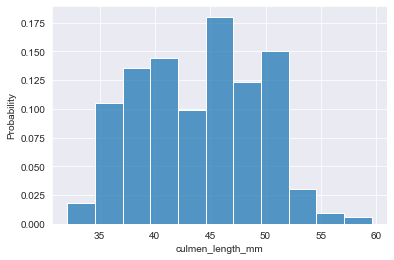

In [25]:
sns.histplot(x='culmen_length_mm', data=penguins,
             stat='probability'
            );

### `cumulative`

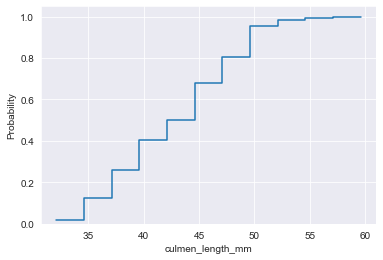

In [26]:
sns.histplot(x='culmen_length_mm', data=penguins,
             stat='probability', fill=False, element='step',
             cumulative=True
            );

## Categorical Variables

### `hue`

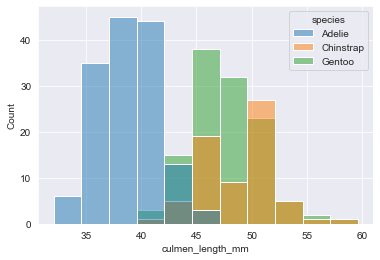

In [27]:
sns.histplot(x='culmen_length_mm', data=penguins, hue='species');

### `element`

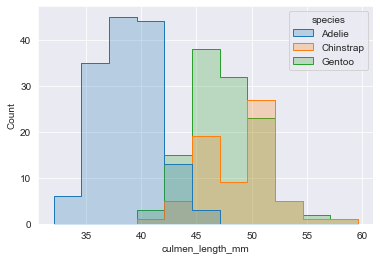

In [28]:
sns.histplot(x='culmen_length_mm', data=penguins, 
             hue='species',
             element='step'
            );

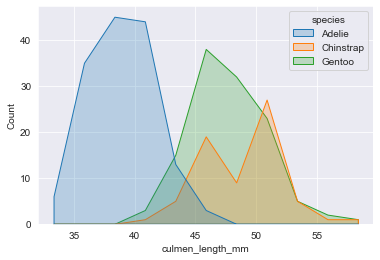

In [29]:
sns.histplot(x='culmen_length_mm', data=penguins, 
             hue='species',
             element='poly'
            );

### `multiple`

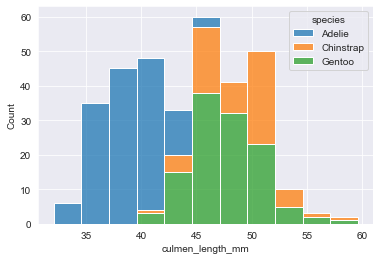

In [30]:
sns.histplot(x='culmen_length_mm', data=penguins, 
             hue='species', 
             multiple='stack'
            ); 

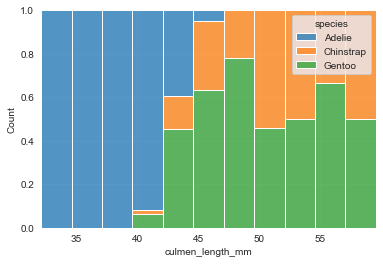

In [31]:
sns.histplot(x='culmen_length_mm', data=penguins, 
             hue='species', 
             multiple='fill'
            ); 

**BONUS Example**: `multiple="dodge"`

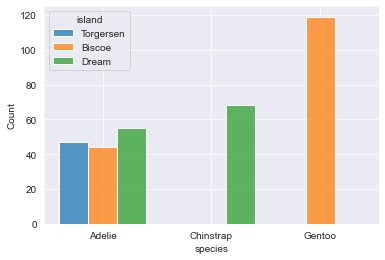

In [32]:
sns.histplot(x='species', data=penguins, 
             hue='island', 
             multiple='dodge',
             shrink=0.8
            ); 

## Bivariate Histplot

In [33]:
sns.set_style('white')

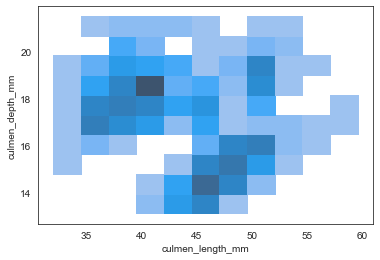

In [34]:
sns.histplot(x='culmen_length_mm', y='culmen_depth_mm', data=penguins);

### `cbar`

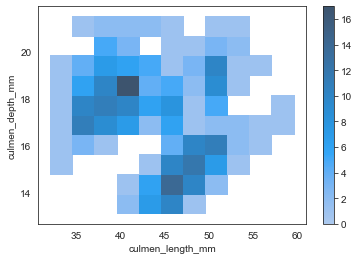

In [35]:
sns.histplot(x='culmen_length_mm', y='culmen_depth_mm', data=penguins,
             cbar=True
            );

### `hue`

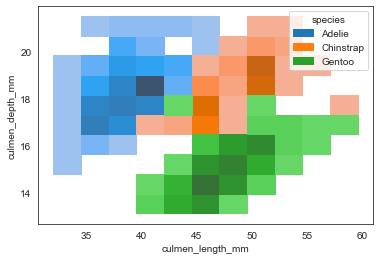

In [36]:
sns.histplot(x='culmen_length_mm', y='culmen_depth_mm', data=penguins,
             hue='species'
            );

### Discrete color map

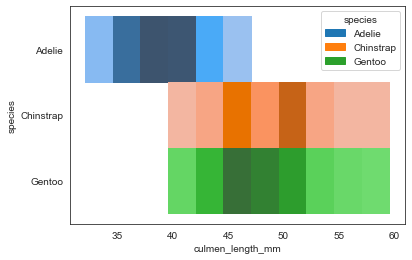

In [37]:
sns.histplot(x='culmen_length_mm', y='species', data=penguins,
             hue='species'
            );

## Styling 

### `shrink`

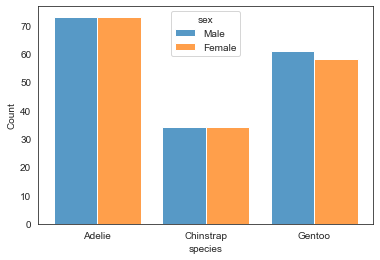

In [38]:
sns.histplot(x='species',  hue='sex', multiple='dodge', data=penguins,
             shrink=0.8
            );

### `color`, `palette`

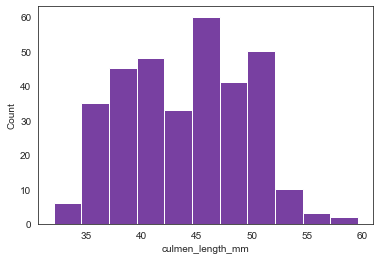

In [39]:
sns.histplot(x='culmen_length_mm', data=penguins,
             color='indigo'
            );

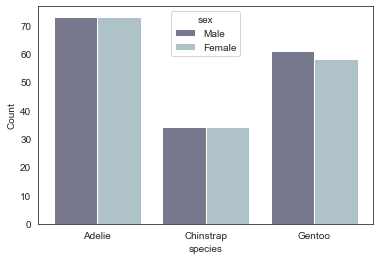

In [40]:
sns.histplot(x='species',  hue='sex', multiple='dodge', data=penguins,
             shrink=0.8, palette='bone'
            );

### `fill`

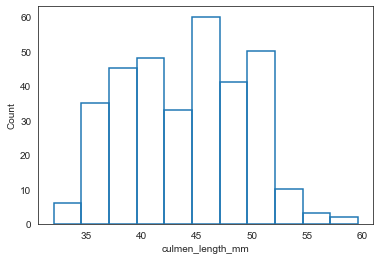

In [41]:
sns.histplot(x='culmen_length_mm', data=penguins,
            fill=False
            );

### Other `kwargs`

Other keyword arguments can also be used, but allowed keywords depend on the type of histplot you are making:

- Univariate, element="bars": [matplotlib.axes.Axes.bar()](https://matplotlib.org/api/_as_gen/matplotlib.axes.Axes.bar.html#matplotlib.axes.Axes.bar)

- Univariate, other element, fill=True: [matplotlib.axes.Axes.fill_between()](https://matplotlib.org/api/_as_gen/matplotlib.axes.Axes.fill_between.html#matplotlib.axes.Axes.fill_between)

- Univariate, other element, fill=False: [matplotlib.axes.Axes.plot()](https://matplotlib.org/api/_as_gen/matplotlib.axes.Axes.plot.html#matplotlib.axes.Axes.plot)

- Bivariate: [matplotlib.axes.Axes.pcolormesh()](https://matplotlib.org/api/_as_gen/matplotlib.axes.Axes.pcolormesh.html#matplotlib.axes.Axes.pcolormesh) 

# Seaborn: FacetGrid

In [1]:
import seaborn as sns

from matplotlib import pyplot as plt

In [2]:
penguins = sns.load_dataset('penguins')

In [3]:
penguins.head()

,species,island,culmen_length_mm,culmen_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female


## Intro Visuals

In [4]:
plt.rc('xtick', labelsize=12)
plt.rc('ytick', labelsize=12)
plt.rc('axes', labelsize=14)    

In [5]:
sns.set_style('white')

In [6]:
pen_ex = penguins[penguins.species.isin(['Adelie', 'Chinstrap'])]

In [7]:
pen_ex.body_mass_g.describe()

count     219.000000
mean     3710.730594
std       436.250355
min      2700.000000
25%      3400.000000
50%      3700.000000
75%      3987.500000
max      4800.000000
Name: body_mass_g, dtype: float64

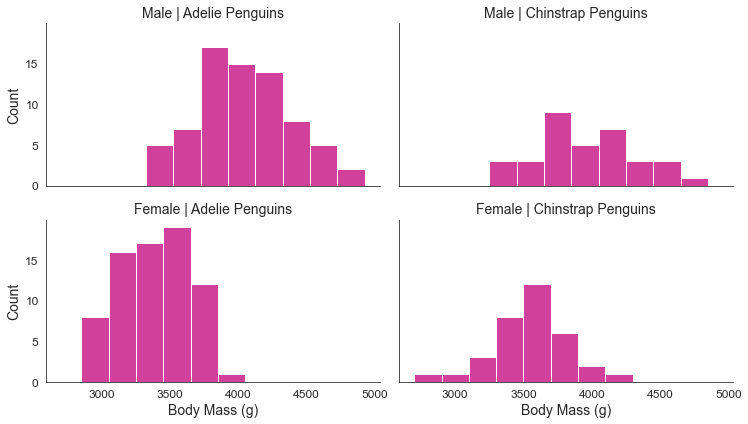

In [8]:
g = sns.FacetGrid(pen_ex, row='sex', col='species', aspect=1.75)
g.map_dataframe(sns.histplot, x='body_mass_g', binwidth=200, color='xkcd:magenta')
g.set_titles(row_template='{row_name}', col_template='{col_name} Penguins')
g.set_axis_labels('Body Mass (g)', "Count")

plt.tight_layout()
#plt.savefig('15facetgrid_thumb.png', dpi=200);

In [9]:
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)
plt.rc('axes', labelsize=10)  

## Basics

In [10]:
sns.set_style('white')

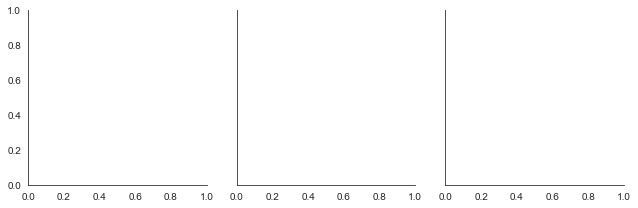

In [11]:
g = sns.FacetGrid(penguins, col='island');

In [12]:
type(g)

seaborn.axisgrid.FacetGrid

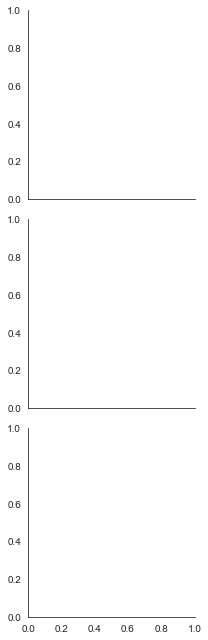

In [13]:
g = sns.FacetGrid(penguins, row='island'); 

### `.map()`

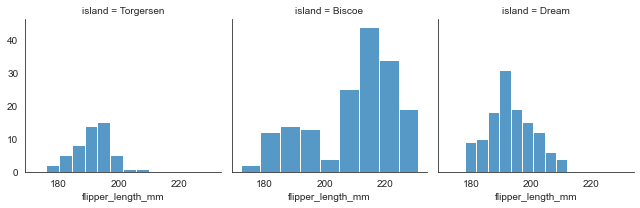

In [14]:
g = sns.FacetGrid(penguins, col='island')
g.map(sns.histplot, "flipper_length_mm");

### `.map_dataframe()`

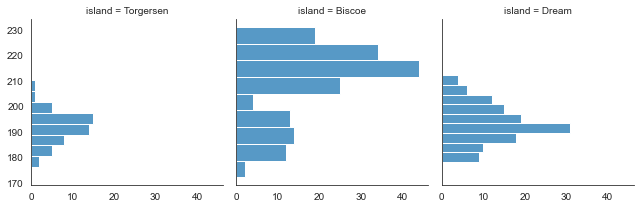

In [15]:
g = sns.FacetGrid(penguins, col='island')
g.map_dataframe(sns.histplot, y='flipper_length_mm'); 

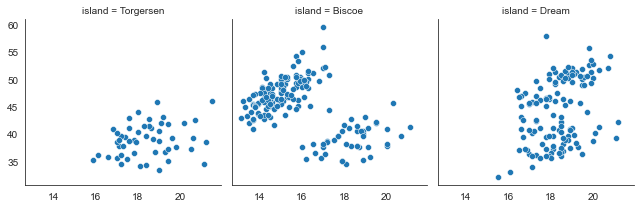

In [16]:
g = sns.FacetGrid(penguins, col='island')
g.map_dataframe(sns.scatterplot, x='culmen_depth_mm', y='culmen_length_mm');

## Methods and Attributes

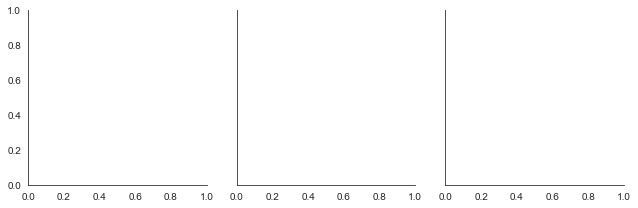

In [17]:
g = sns.FacetGrid(penguins, col='island');

In [18]:
type(g)

seaborn.axisgrid.FacetGrid

In [19]:
#g.  Hit TAB to see properties and methods

### `.set_axis_labels()`

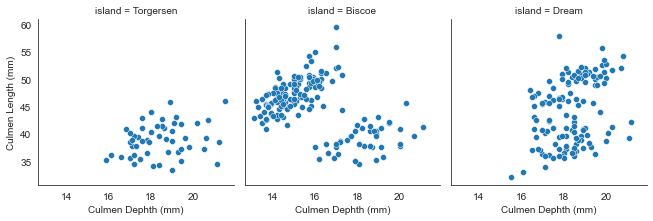

In [20]:
g = sns.FacetGrid(penguins, col='island')
g.map_dataframe(sns.scatterplot, x='culmen_depth_mm', y='culmen_length_mm')
g.set_axis_labels('Culmen Dephth (mm)', 'Culmen Length (mm)');

### `.set_titles()`

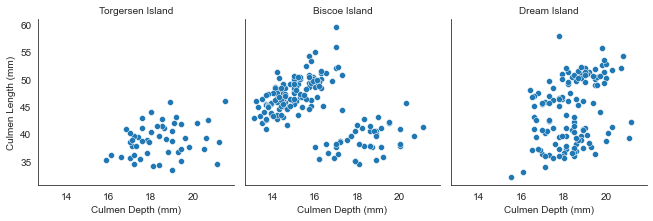

In [21]:
g = sns.FacetGrid(penguins, col='island')
g.map_dataframe(sns.scatterplot, x='culmen_depth_mm', y='culmen_length_mm')
g.set_axis_labels('Culmen Depth (mm)', 'Culmen Length (mm)')
g.set_titles(col_template='{col_name} Island');

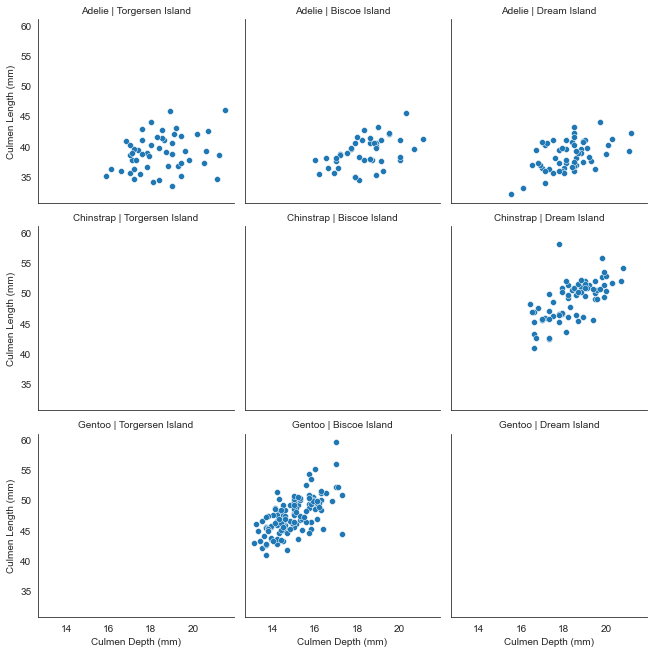

In [22]:
g = sns.FacetGrid(penguins, col='island', row='species')
g.map_dataframe(sns.scatterplot, x='culmen_depth_mm', y='culmen_length_mm')
g.set_axis_labels('Culmen Depth (mm)', 'Culmen Length (mm)')
g.set_titles(col_template='{col_name} Island', row_template='{row_name}');

### `sharey, ylim`

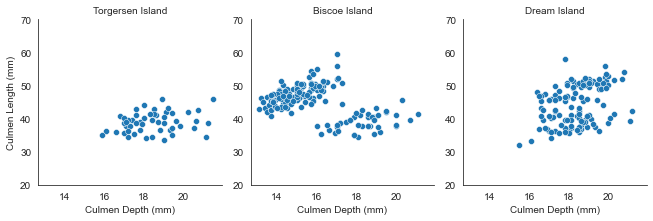

In [23]:
g = sns.FacetGrid(penguins, col='island', sharey=False, ylim=(20, 70))

g.map_dataframe(sns.scatterplot, x='culmen_depth_mm', y='culmen_length_mm')
g.set_axis_labels('Culmen Depth (mm)', 'Culmen Length (mm)')
g.set_titles(col_template='{col_name} Island');

## Hue and Custom Functions

### `hue`

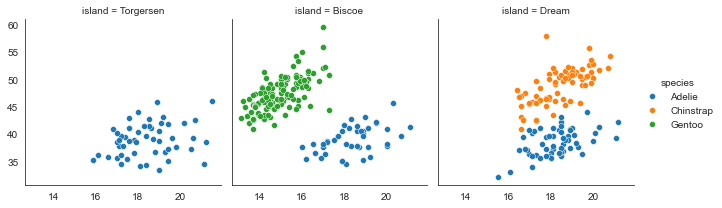

In [24]:
g = sns.FacetGrid(penguins, col='island', hue='species')
g.map_dataframe(sns.scatterplot, x='culmen_depth_mm', y='culmen_length_mm')
g.add_legend();

### `palette`

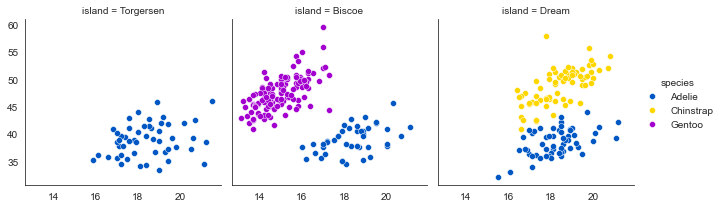

In [25]:
g = sns.FacetGrid(penguins, col='island', hue='species', palette='prism')
g.map_dataframe(sns.scatterplot, x='culmen_depth_mm', y='culmen_length_mm') 
g.add_legend();

### Custom Functions

In [26]:
import matplotlib.pyplot as plt
import numpy as np

def add_mean_line(data, var=None, **kws):
    
    # If no variable provided skip adding mean line
    if not var: return
    
    #Calculate mean for each group
    m = np.mean(data[var])
    
    #Get current axis
    ax = plt.gca()
    
    #add line at group mean
    ax.axvline(m, color='maroon', lw=3, ls='--')
    
    #annotate group mean
    x_pos=0.65
    if m > 5000: x_pos=0.2
    ax.text(x_pos, 0.7, f'mean={m:.0f}', 
            transform=ax.transAxes,   #transforms positions to range from (0,0) to (1,1)
            color='maroon', fontweight='bold', fontsize=12)

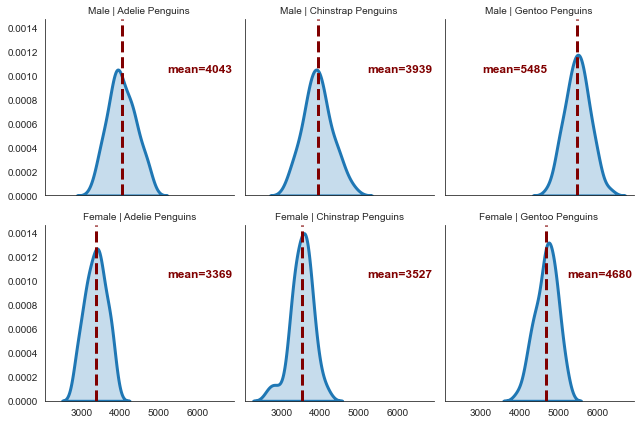

In [28]:
quantity='body_mass_g'

g = sns.FacetGrid(penguins, row='sex', col='species')
g.map_dataframe(sns.kdeplot, x=quantity, lw=3, shade=True)
g.map_dataframe(add_mean_line, var=quantity)
g.set_titles(row_template='{row_name}', col_template='{col_name} Penguins');

# Seaborn: catplot

In [1]:
import seaborn as sns

In [2]:
#load car data and drop rows with missings
cars = sns.load_dataset('mpg').dropna()

#filter to 4-, 6-, 8-cylinder cars
cars = cars[cars.cylinders.isin([4, 6, 8])] 

#add old/new column
cars['type'] = ['old' if x <=76 else 'new' for x in cars.model_year]

In [3]:
cars.head()

,mpg,cylinders,displacement,horsepower,weight,acceleration,model_year,origin,name,type
0,18.0,8,307.0,130.0,3504,12.0,70,usa,chevrolet chevelle malibu,old
1,15.0,8,350.0,165.0,3693,11.5,70,usa,buick skylark 320,old
2,18.0,8,318.0,150.0,3436,11.0,70,usa,plymouth satellite,old
3,16.0,8,304.0,150.0,3433,12.0,70,usa,amc rebel sst,old
4,17.0,8,302.0,140.0,3449,10.5,70,usa,ford torino,old


In [4]:
cars.shape

(385, 10)

## Intro Visuals

In [5]:
from matplotlib import pyplot as plt
import numpy as np

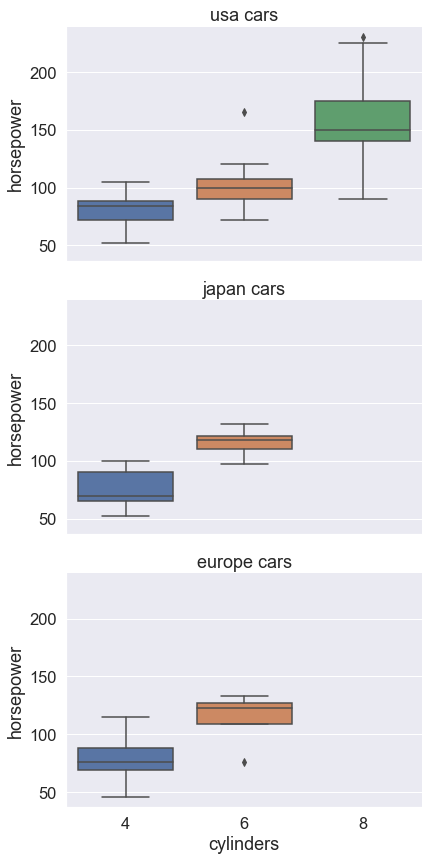

In [6]:
sns.set(style='darkgrid', font_scale=1.5)  

g = sns.catplot(x='cylinders', y='horsepower', 
                data=cars,
                row='origin',
                kind='box',
                aspect=1.5,
                height=4
               )
g.set_titles(row_template="{row_name} cars");

### Thumbnail

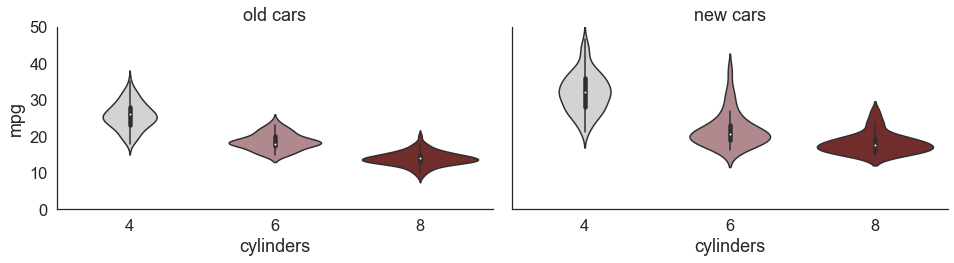

In [7]:
sns.set(style='white', font_scale=1.5)  

g = sns.catplot(x='cylinders', y='mpg', 
                data=cars,
                col='type',
                kind='violin',
                aspect=1.7,
                height=4,
                facet_kws={'ylim':(0, 50)},
                palette=['lightgray', '#B58389', '#7C2021']
               )
g.set_titles(col_template="{col_name} cars")
plt.tight_layout();

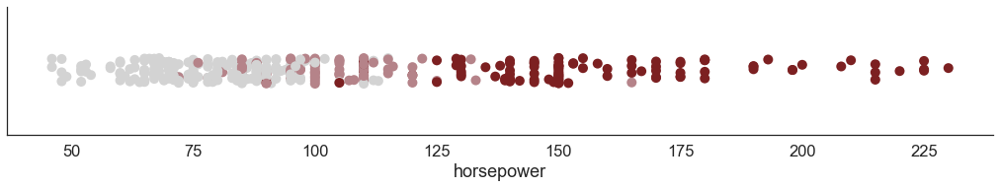

In [8]:

sns.set(style='white', font_scale=1.5)  

g = sns.catplot(x='horsepower', y=['']*len(cars),
                hue='cylinders',
                data=cars,
                kind='strip',
                aspect=4.8,
                height=3,
                s=10,
                legend=False,
                palette=['lightgray', '#B58389', '#7C2021'],
               )
g.set_titles(col_template="{col_name} cars")
plt.tight_layout();

## Basics

In [9]:
sns.set_style('white')

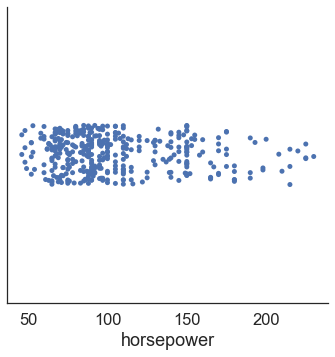

In [10]:
sns.catplot(x='horsepower', data=cars);

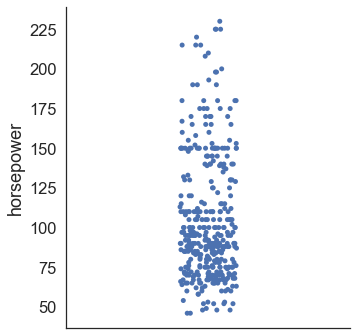

In [11]:
sns.catplot(y='horsepower', data=cars);

### Kind

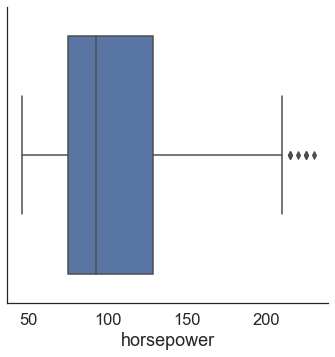

In [12]:
sns.catplot(x='horsepower', data=cars, kind='box');

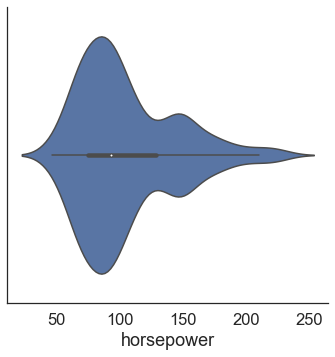

In [13]:
sns.catplot(x='horsepower', data=cars, kind='violin');

### Categorical Variables, Hue

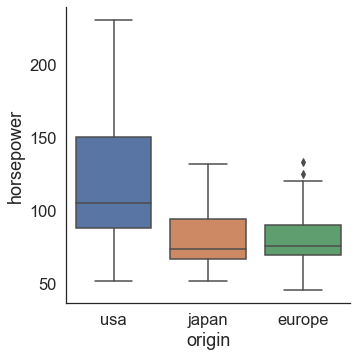

In [14]:
sns.catplot(x='origin', y='horsepower', 
            data=cars, 
            kind='box');

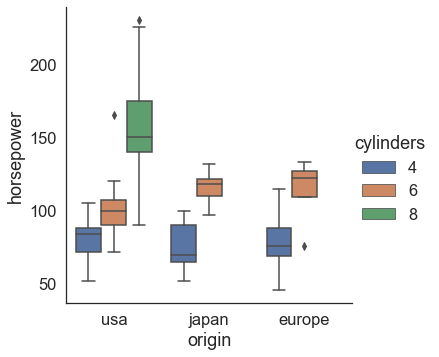

In [15]:
sns.catplot(x='origin', y='horsepower', 
            data=cars, 
            hue='cylinders',
            kind='box');

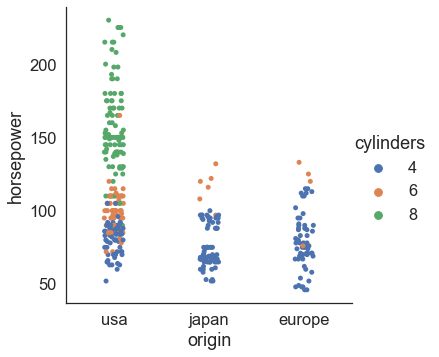

In [16]:
sns.catplot(x='origin', y='horsepower',
            data=cars, 
            hue='cylinders',
            kind='strip'); 

## Small Multiples (FacetGrid)

In [17]:
sns.set_style('darkgrid')

#### `row`, `col`

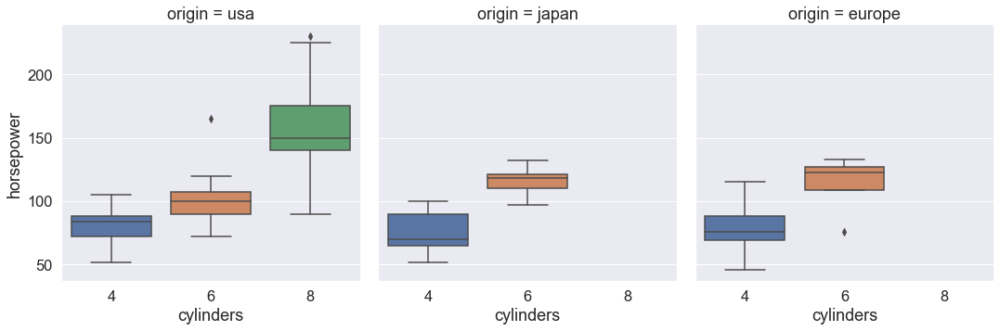

In [18]:
sns.catplot(x='cylinders', y='horsepower', 
            data=cars, 
            kind='box',
            col='origin'
           );

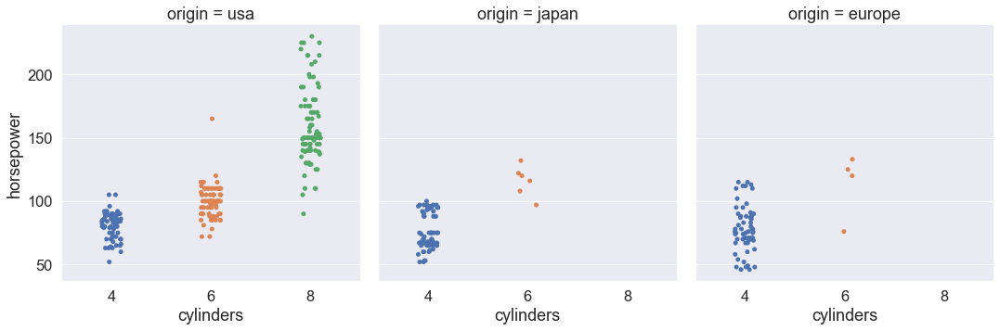

In [19]:
sns.catplot(x='cylinders', y='horsepower', 
            data=cars, 
            kind='strip',
            col='origin'
           );

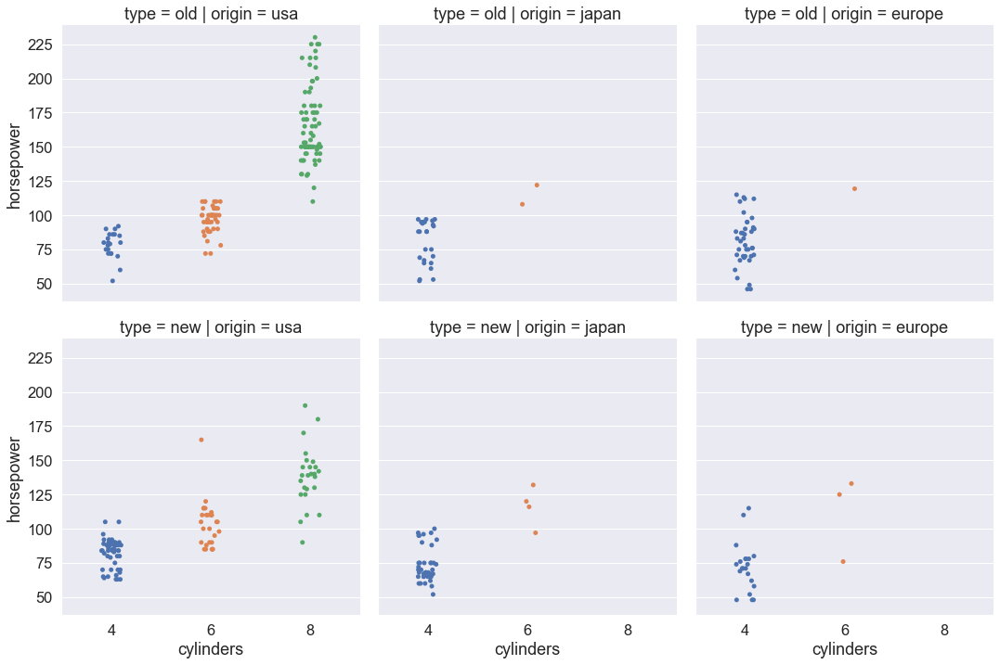

In [20]:
sns.catplot(x='cylinders', y='horsepower', 
            data=cars, 
            kind='strip',
            col='origin',
            row='type'
           );

#### `row_order` (`order`, `hue_order`, `col_order`)

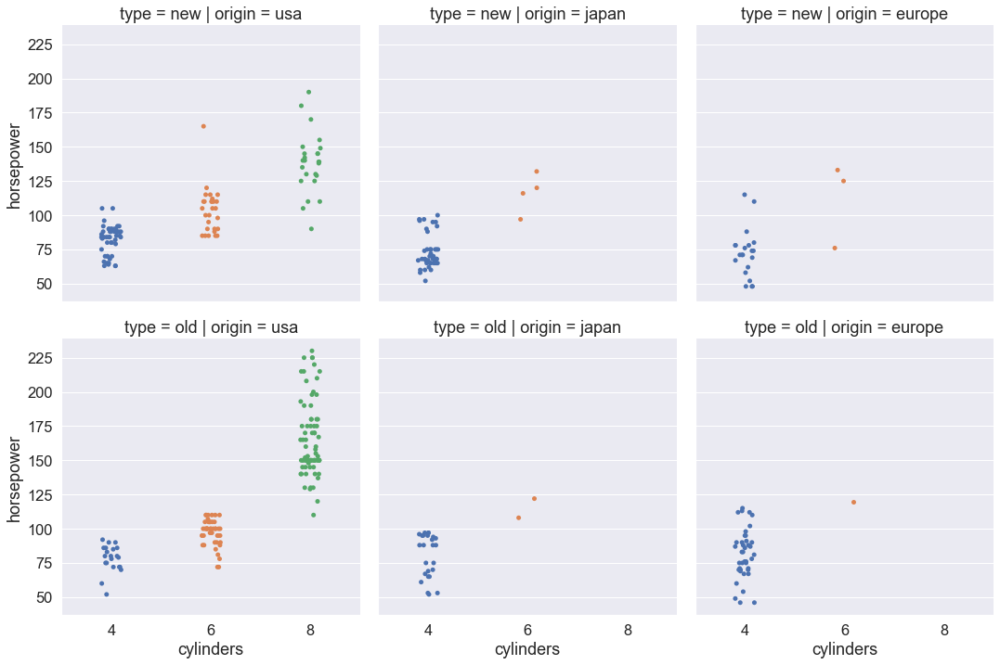

In [21]:
sns.catplot(x='cylinders', y='horsepower', 
            data=cars, 
            kind='strip',
            col='origin',
            row='type',
            row_order=['new', 'old']
           );

## Styling

In general, additional keyword arguments will be passed to the kind of plot selected.  

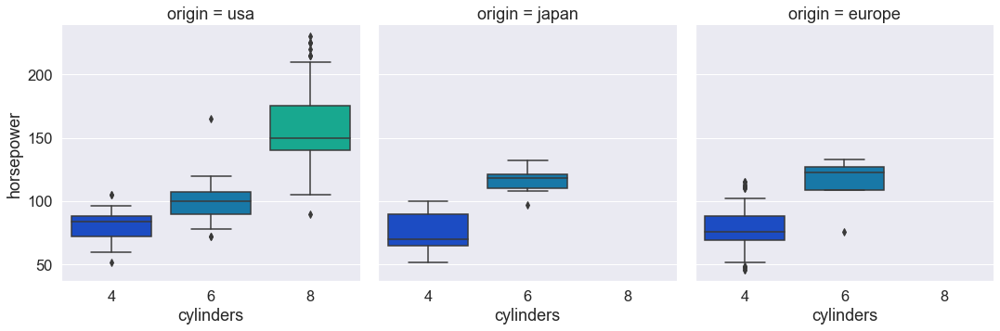

In [22]:
sns.catplot(x='cylinders', y='horsepower', 
            data=cars, 
            kind='box',
            col='origin',
            palette='winter', 
            whis=1
           );

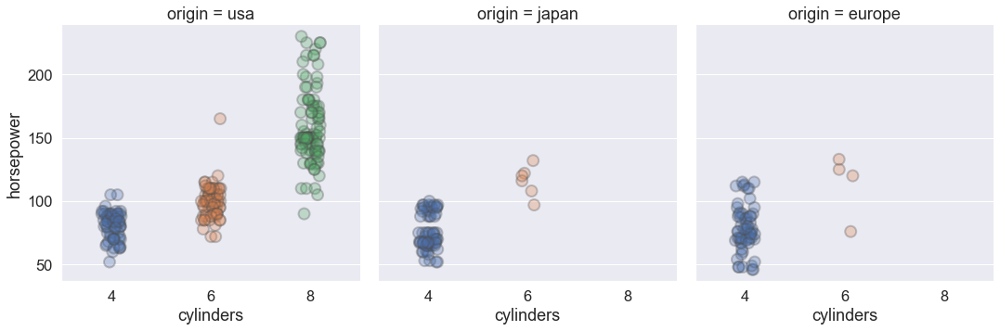

In [23]:
sns.catplot(x='cylinders', y='horsepower', 
            data=cars, 
            kind='strip',
            col='origin',
            s=12,
            alpha=0.3,
            linewidth=2
           );

### FacetGrid Styling

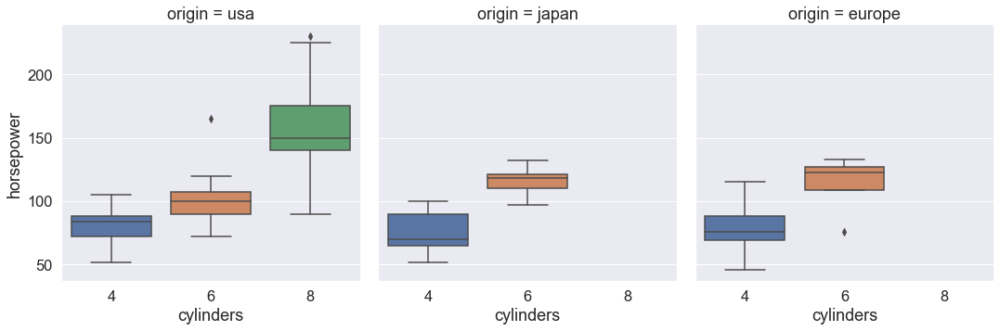

In [24]:
g = sns.catplot(x='cylinders', y='horsepower', 
                data=cars,
                col='origin',
                kind='box'
               );

In [25]:
type(g)

seaborn.axisgrid.FacetGrid

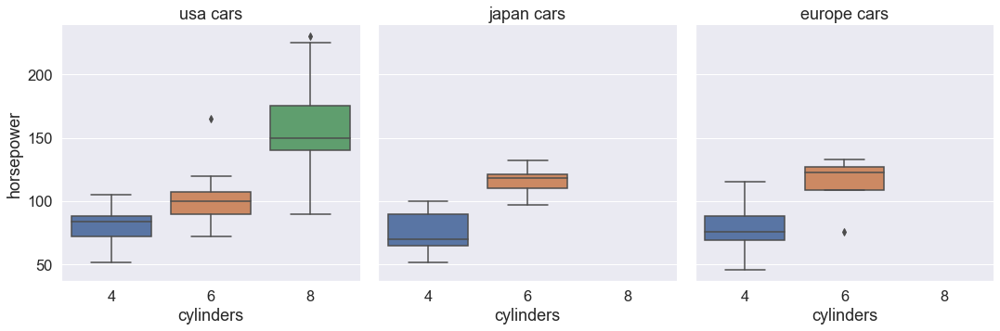

In [26]:
sns.set(style='darkgrid', font_scale=1.5)  

g = sns.catplot(x='cylinders', y='horsepower', 
                data=cars,
                col='origin',
                kind='box'
               )
g.set_titles(col_template="{col_name} cars");

# Seaborn: relplot

In [1]:
import seaborn as sns

In [2]:
df = sns.load_dataset('titanic')

df.head()

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town,alive,alone
0,0,3,male,22.0,1,0,7.2500,S,Third,man,True,NaN,Southampton,no,False
1,1,1,female,38.0,1,0,71.2833,C,First,woman,False,C,Cherbourg,yes,False
2,1,3,female,26.0,0,0,7.9250,S,Third,woman,False,NaN,Southampton,yes,True
3,1,1,female,35.0,1,0,53.1000,S,First,woman,False,C,Southampton,yes,False
4,0,3,male,35.0,0,0,8.0500,S,Third,man,True,NaN,Southampton,no,True


Create new column with age decade bucket for each passenger.

In [3]:
df['decade'] = [age//10*10 for age in df.age]

df.head()

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town,alive,alone,decade
0,0,3,male,22.0,1,0,7.2500,S,Third,man,True,NaN,Southampton,no,False,20.0
1,1,1,female,38.0,1,0,71.2833,C,First,woman,False,C,Cherbourg,yes,False,30.0
2,1,3,female,26.0,0,0,7.9250,S,Third,woman,False,NaN,Southampton,yes,True,20.0
3,1,1,female,35.0,1,0,53.1000,S,First,woman,False,C,Southampton,yes,False,30.0
4,0,3,male,35.0,0,0,8.0500,S,Third,man,True,NaN,Southampton,no,True,30.0


## Intro Visuals

In [4]:
from matplotlib import pyplot as plt

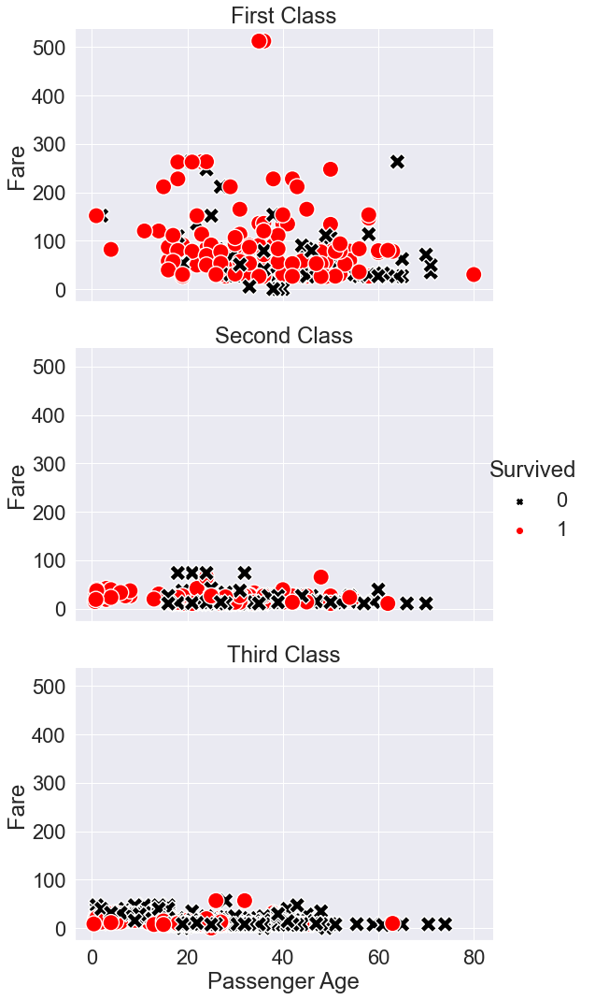

In [5]:
sns.set(style='darkgrid', font_scale=2)  

g = sns.relplot(x='age', y='fare', data=df,
            row='class',
            hue='survived',
            aspect=1.5,
                s=300,
                palette=['black', 'red'],
                style='survived',
                markers=['X', 'o']
           );
g.set_titles(row_template="{row_name} Class")
g.set_xlabels('Passenger Age')
g.set_ylabels('Fare')
leg = g._legend
leg.set_title('Survived');
#plt.savefig('18catplot_figure_facetExample.png', dpi=200, bbox_inches='tight');

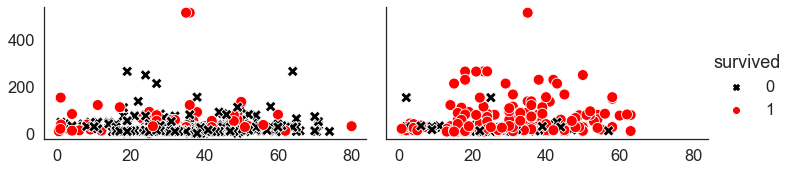

In [6]:
sns.set(style='white', font_scale=1.5)  

g = sns.relplot(x='age', y='fare', 
                data=df,
                col='sex',
                hue='survived',
                aspect=1.7,
                height=3,
                palette=['black', 'red'],
                style='survived',
                markers=['X', 'o'],
                s=120
               )
g.set_titles(col_template="")
g.set_xlabels("")
g.set_ylabels('');
#plt.savefig('18catplot_figure_scatterThumb.png', dpi=200);

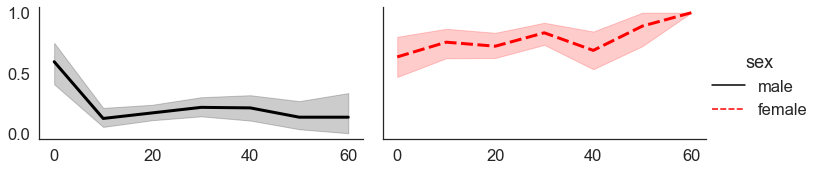

In [7]:
g = sns.relplot(x='decade', y='survived', 
                data=df[df.age < 70],
                hue='sex',
                col='sex',
                aspect=1.7,
                height=3,
                palette=['black', 'red'],
                style='sex',
                lw=3,
                kind='line'
               )
g.set_titles(col_template="")
g.set_xlabels("")
g.set_ylabels('');
#plt.savefig('18catplot_figure_lineThumb.png', dpi=200);

In [8]:
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)
plt.rc('axes', labelsize=10)  

## Basics

In [9]:
sns.set_style('white')

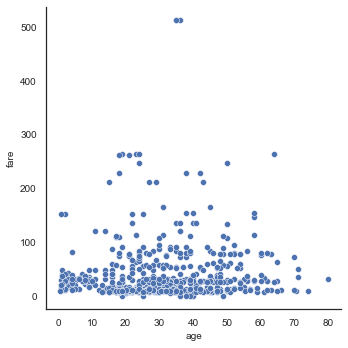

In [10]:
sns.relplot(x='age', y='fare', data=df);

### Categorical Variables: Hue, Style, Size

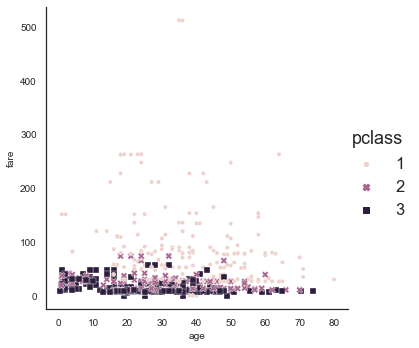

In [11]:
sns.relplot(x='age', y='fare', 
            data=df,
            hue='pclass',
            style='pclass',
            size='pclass'
           );

### Kind

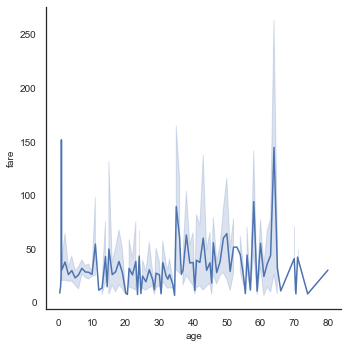

In [12]:
sns.relplot(x='age', y='fare', data=df, kind='line');

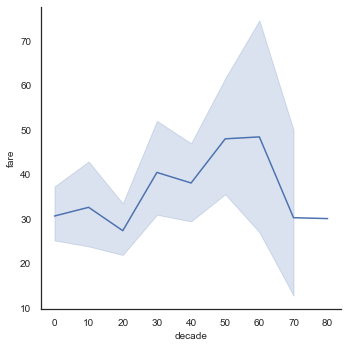

In [13]:
sns.relplot(x='decade', y='fare', data=df, kind='line');

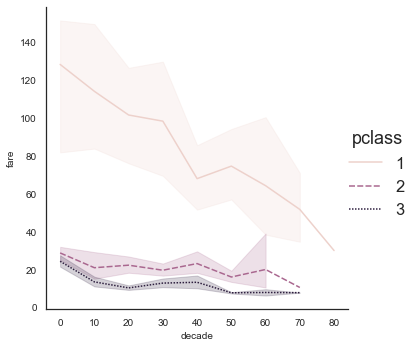

In [14]:
sns.relplot(x='decade', y='fare', 
            data=df, 
            kind='line',
            hue='pclass',
            style='pclass'
           );

## Small Multiples (FacetGrid)

### `row`, `col`

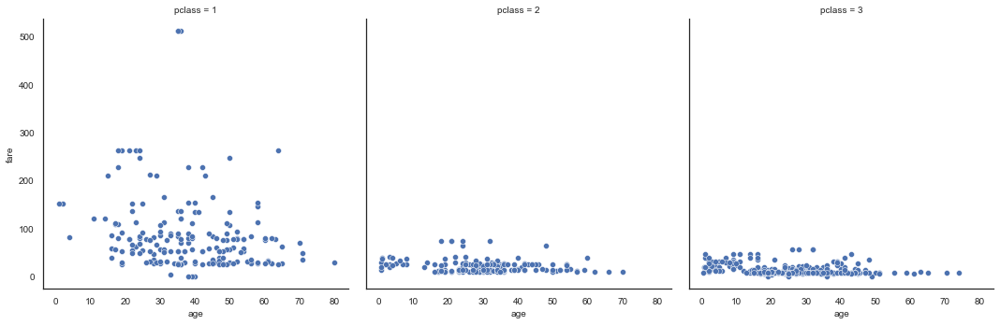

In [15]:
sns.relplot(x='age', y='fare',
            data=df,
            col='pclass'
           );

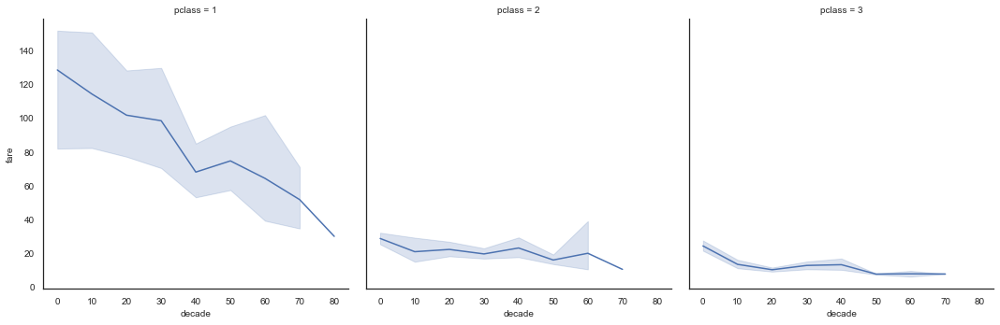

In [16]:
sns.relplot(x='decade', y='fare',
            data=df,
            kind='line',
            col='pclass'
           );

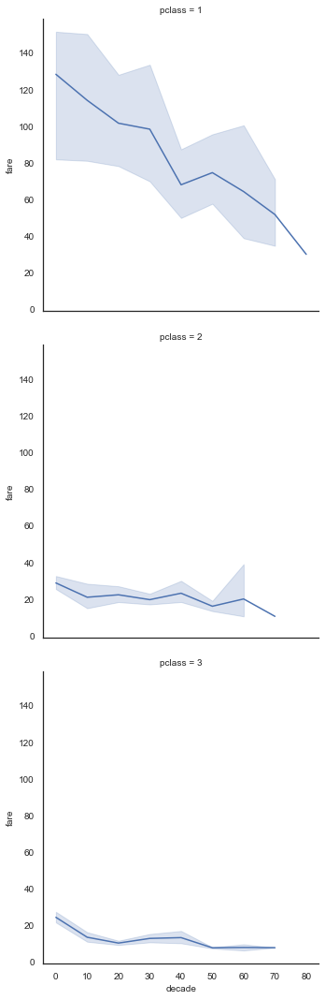

In [17]:
sns.relplot(x='decade', y='fare',
            data=df,
            kind='line',
            row='pclass'
           );

### `col_wrap`

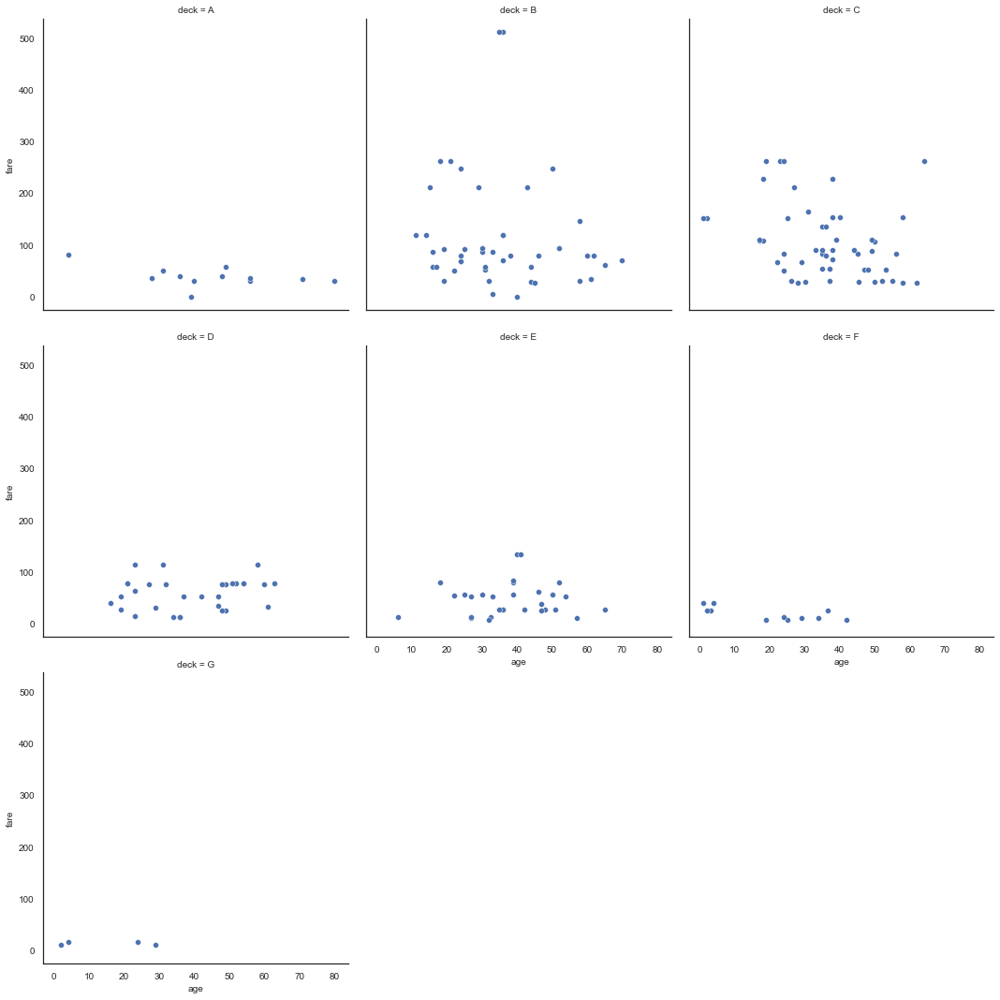

In [18]:
sns.relplot(x='age', y='fare',
            data=df,
            col='deck',
            col_wrap=3
           );

## Styling

In general, additional keyword arguments will be passed to the kind of plot selected.  

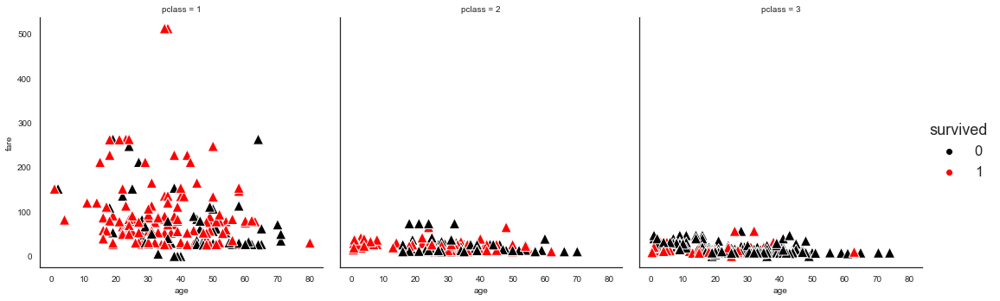

In [19]:
sns.relplot(x='age', y='fare', data=df,
            col='pclass',
            hue='survived',
            s=150,
            palette=['black', 'red'],
            marker='^'
           );

### `markers`, `sizes`

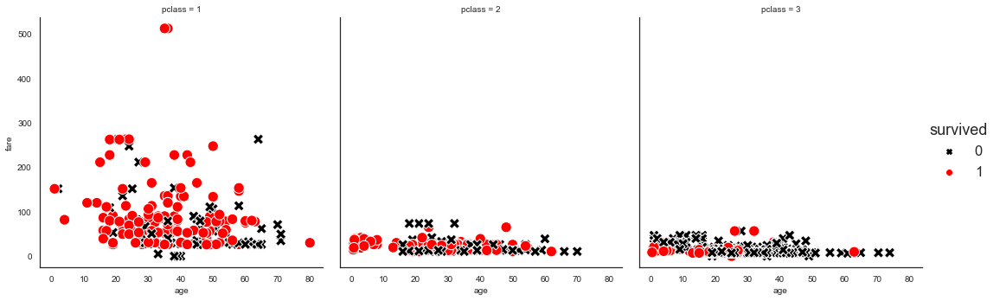

In [20]:
sns.relplot(x='age', y='fare', data=df,
            col='pclass',
            hue='survived',
            s = 150, 
            palette=['black', 'red'],
            style='survived',
            markers=['X', 'o']
           );

### FacetGrid Styling

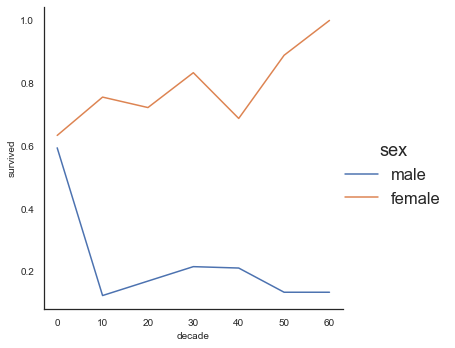

In [21]:
g = sns.relplot(x='decade', y='survived',
                data=df[df.age < 70],
                kind='line',
                hue='sex',
                ci=None
               );

In [22]:
type(g)

seaborn.axisgrid.FacetGrid

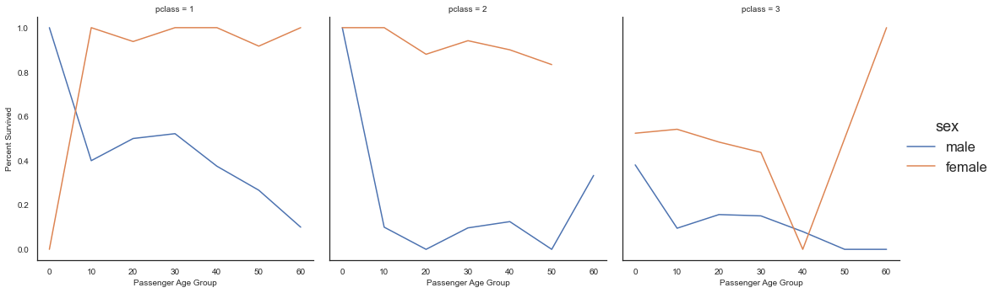

In [23]:
g = sns.relplot(x='decade', y='survived',
                data=df[df.age < 70],
                kind='line',
                hue='sex',
                ci=None,
                col='pclass'
               )

g.set_xlabels('Passenger Age Group')
g.set_ylabels("Percent Survived");

# Seaborn: displot

In [1]:
import seaborn as sns

In [2]:
cars = sns.load_dataset('mpg').dropna()

cars.head()

,mpg,cylinders,displacement,horsepower,weight,acceleration,model_year,origin,name
0,18.0,8,307.0,130.0,3504,12.0,70,usa,chevrolet chevelle malibu
1,15.0,8,350.0,165.0,3693,11.5,70,usa,buick skylark 320
2,18.0,8,318.0,150.0,3436,11.0,70,usa,plymouth satellite
3,16.0,8,304.0,150.0,3433,12.0,70,usa,amc rebel sst
4,17.0,8,302.0,140.0,3449,10.5,70,usa,ford torino


## Basics

In [3]:
sns.set_style('white')

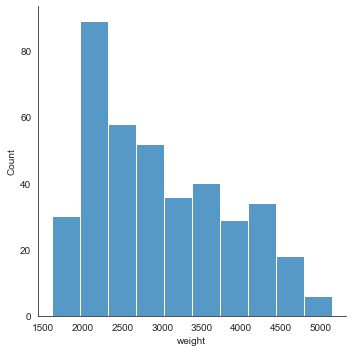

In [4]:
sns.displot(x='weight', data=cars);

### `kde`

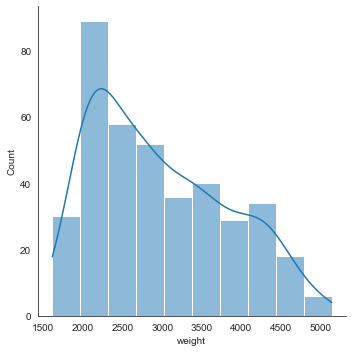

In [5]:
sns.displot(x='weight', data=cars, kde=True);

### `kind` - NEW!

#### Kernel Density Estimation Plot: `kind='kde'`

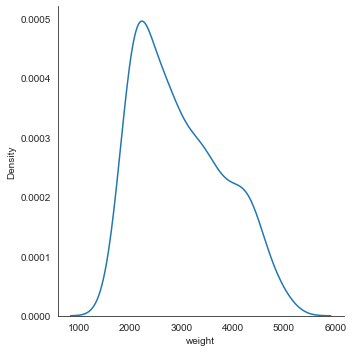

In [6]:
sns.displot(x='weight', data=cars, kind='kde');

#### Empirical Cumulative Distribution Function Plot: `kind='ecdf'`

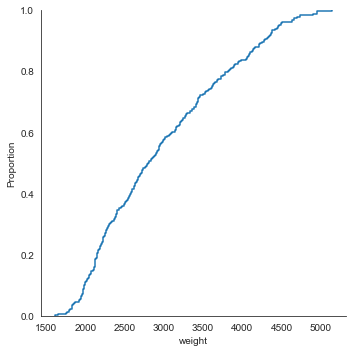

In [7]:
sns.displot(x='weight', data=cars, kind='ecdf');

### `rug`

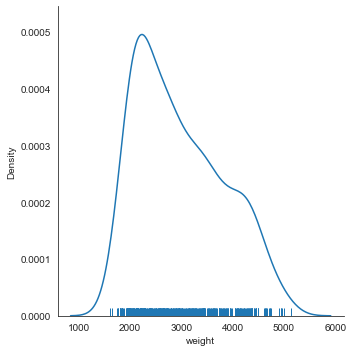

In [8]:
sns.displot(x='weight', data=cars, kind='kde', rug=True);

### Categorical Variables: `hue`

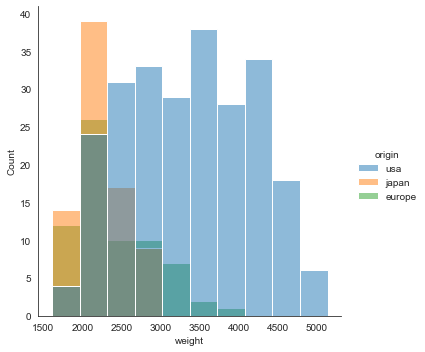

In [9]:
sns.displot(x='weight', data=cars, hue='origin');

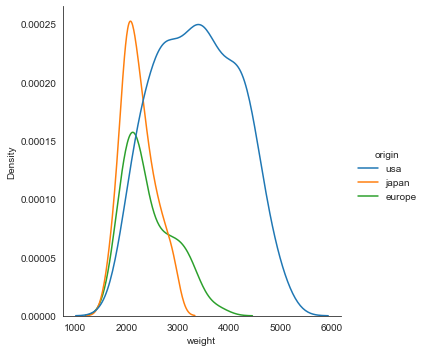

In [10]:
sns.displot(x='weight', data=cars, kind='kde', hue='origin');

## Bivariate (2D) Options - NEW!

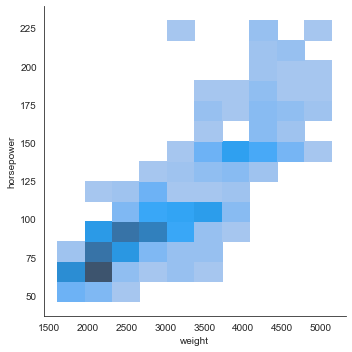

In [11]:
sns.displot(x='weight', y='horsepower', data=cars);

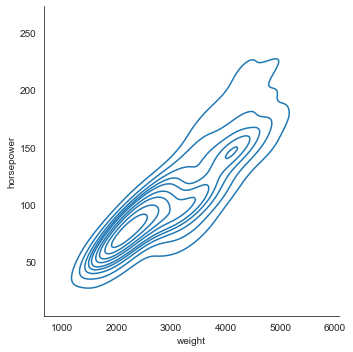

In [12]:
sns.displot(x='weight', y='horsepower', data=cars, kind='kde');

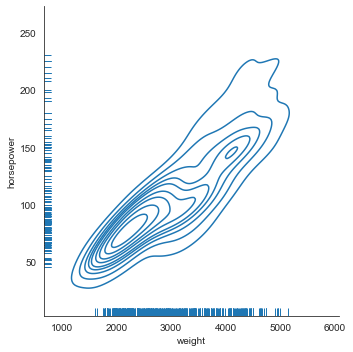

In [13]:
sns.displot(x='weight', y='horsepower', data=cars, kind='kde', rug=True);

## Small Multiples (FacetGrid) - NEW!

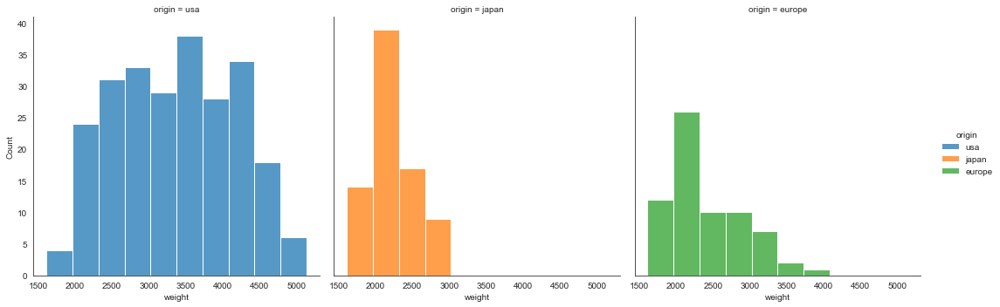

In [14]:
sns.displot(x='weight', data=cars, hue='origin', col='origin');

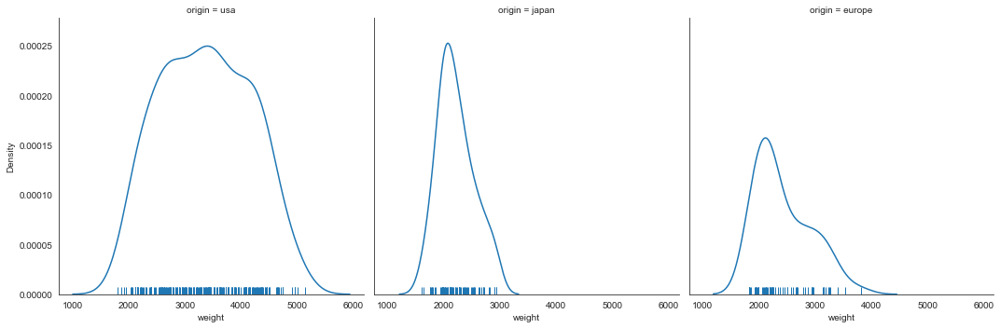

In [15]:
sns.displot(x='weight', data=cars, col='origin', kind='kde', rug=True);

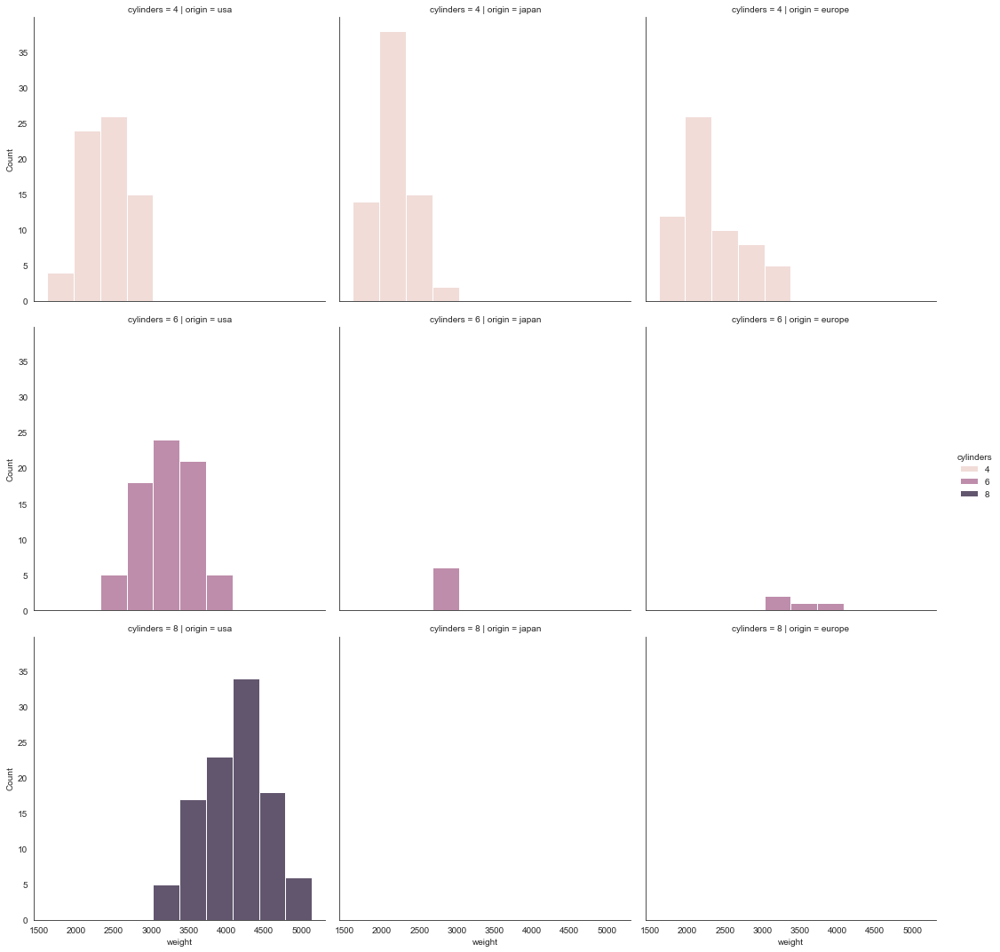

In [16]:
sns.displot(x='weight', data=cars[cars.cylinders.isin([4, 6, 8])], 
            col='origin', 
            row='cylinders', 
            hue='cylinders'
           );

## Styling

### `palette`

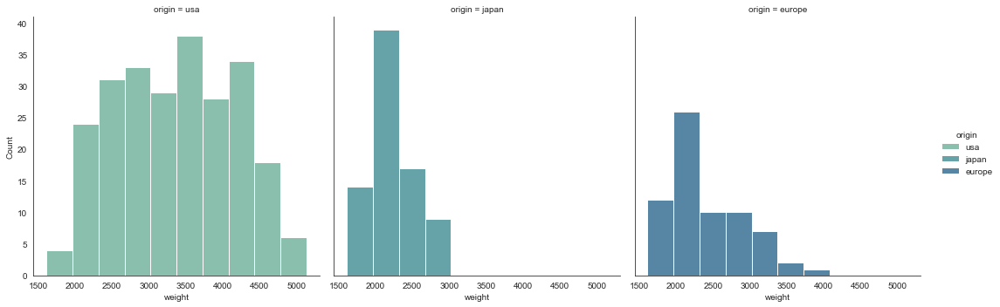

In [17]:
sns.displot(x='weight', data=cars, hue='origin', col='origin', palette='crest');

### `height`, `aspect`

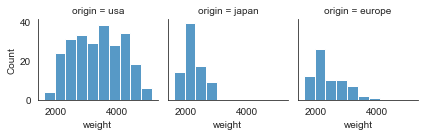

In [18]:
sns.displot(x='weight', data=cars, col='origin', height=2);

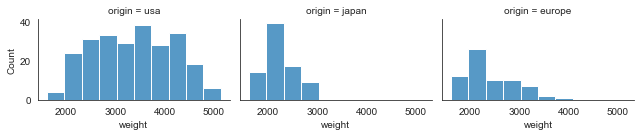

In [19]:
sns.displot(x='weight', data=cars, col='origin', height=2, aspect=1.5);

### Other Keywords: Plot Specific

In general, additional keyword arguments will be passed to the kind of plot selected.  

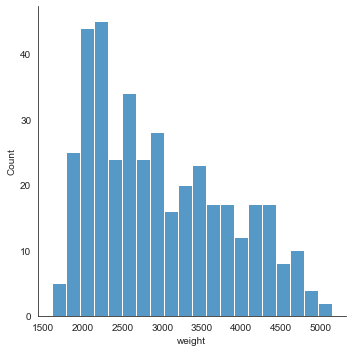

In [20]:
sns.displot(x='weight', data=cars, bins=20);

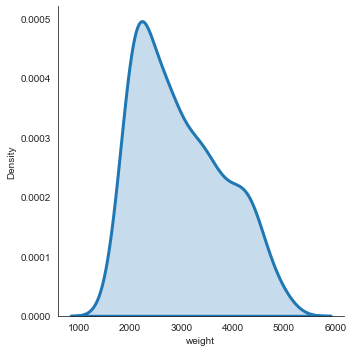

In [21]:
sns.displot(x='weight', data=cars, kind='kde', fill=True, lw=3);

### `rug_kws`

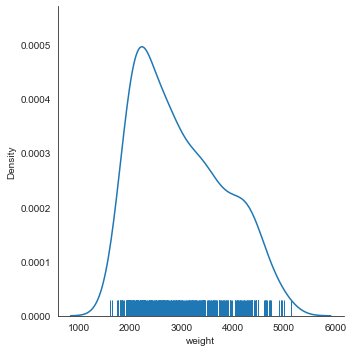

In [22]:
sns.displot(x='weight', data=cars, kind='kde', rug=True, rug_kws={'height': 0.05});

### FacetGrid Styling

#### `facet_kws`

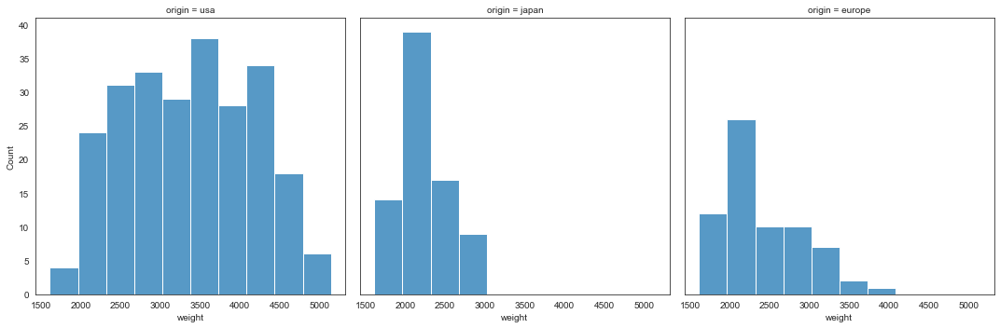

In [23]:
sns.displot(x='weight', data=cars, col='origin', facet_kws={'despine': False});

### FacetGrid Object

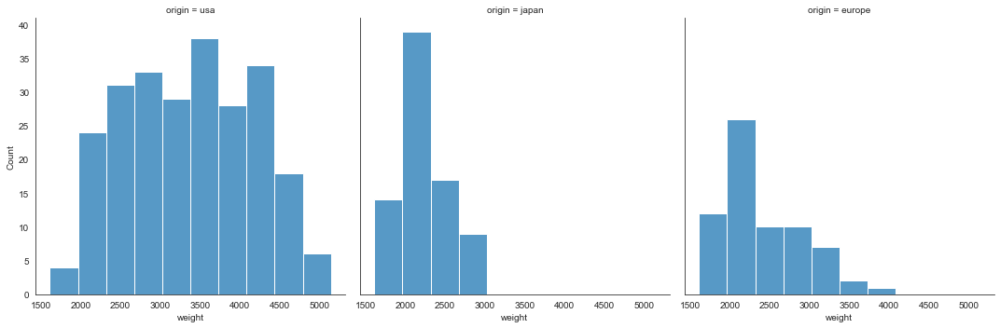

In [24]:
g = sns.displot(x='weight', data=cars, col='origin');

In [25]:
type(g)

seaborn.axisgrid.FacetGrid

In [26]:
g.axes_dict.items()

dict_items([('usa', <AxesSubplot:title={'center':'origin = usa'}, xlabel='weight', ylabel='Count'>), ('japan', <AxesSubplot:title={'center':'origin = japan'}, xlabel='weight'>), ('europe', <AxesSubplot:title={'center':'origin = europe'}, xlabel='weight'>)])

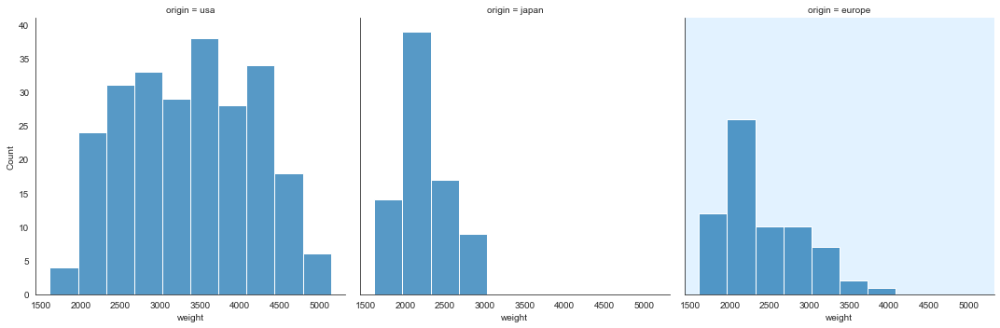

In [27]:
g = sns.displot(x='weight', data=cars, col='origin')

for col_val, ax in g.axes_dict.items():
    if col_val == "europe":
        ax.set_facecolor("#E2F2FF")

## Examples, Thumbnail

In [28]:
from matplotlib import pyplot as plt

plt.rcParams['font.size'] = 14

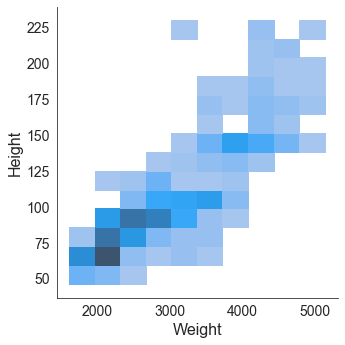

In [29]:
sns.displot(x='weight', y='horsepower', data=cars)
plt.xlabel('Weight', fontsize=16)
plt.ylabel('Height', fontsize=16);

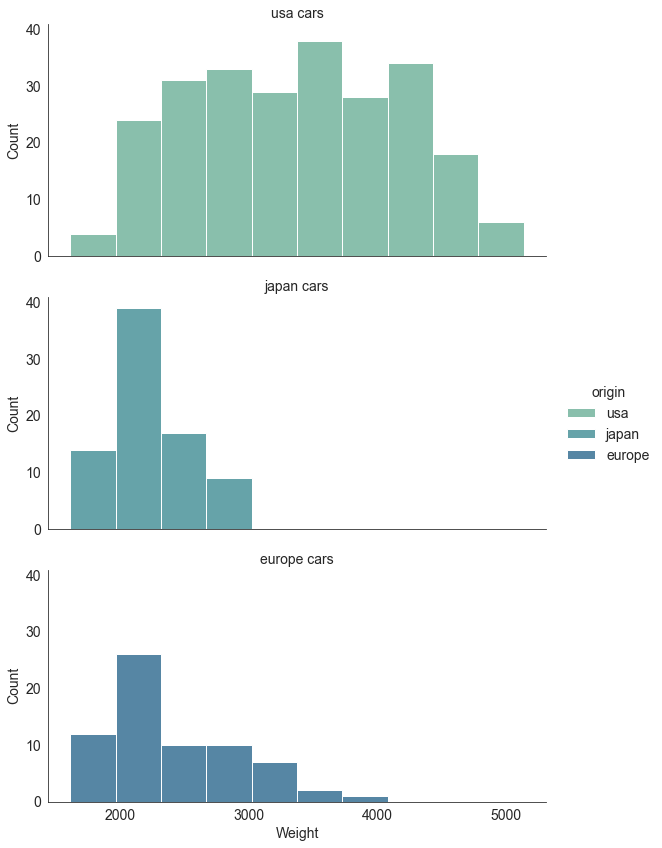

In [30]:
g = sns.displot(x='weight', row='origin', hue='origin', palette='crest', 
            data=cars, height=4, aspect=2)
g.set_titles(row_template='{row_name} cars')
plt.xlabel("Weight")
plt.xticks([2000, 3000, 4000, 5000]);

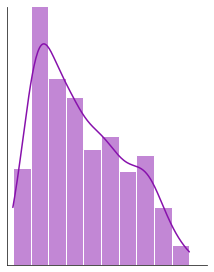

In [31]:
g = sns.displot(x='weight' ,
                color='#8711ac', 
                data=cars, height=4, aspect=0.8, kde=True)
g.set_titles(col_template='')
g.set_xlabels('')
g.set_ylabels('')
g.set_xticklabels([])
g.set_yticklabels([])
plt.xlim(1500, 5500)
plt.ylim(0, 80)
plt.tight_layout();

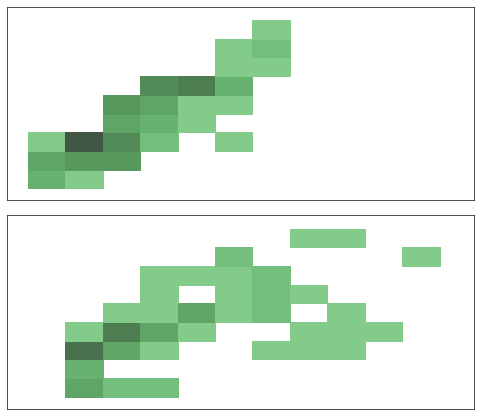

In [32]:
g = sns.displot(x='weight', y='horsepower', row='origin', color='#48804D',
                data=cars[cars.origin.isin(['europe','japan'])], 
                height=3, aspect=2.3, row_order=['europe', 'japan'],
                facet_kws={'despine': False})
g.set_titles(row_template='')
g.set_xlabels('')
g.set_ylabels('')
g.set_xticklabels([])
g.set_yticklabels([])
plt.tight_layout();

# Seaborn: lmplot

In [1]:
import seaborn as sns

In [2]:
df = sns.load_dataset('penguins').dropna()

df.head()

,species,island,culmen_length_mm,culmen_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female
5,Adelie,Torgersen,39.3,20.6,190.0,3650.0,Male


## Basics

In [3]:
sns.set_style('white')

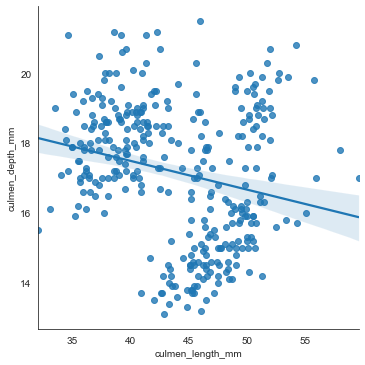

In [4]:
sns.lmplot(x='culmen_length_mm', y='culmen_depth_mm', data=df);

### `hue`

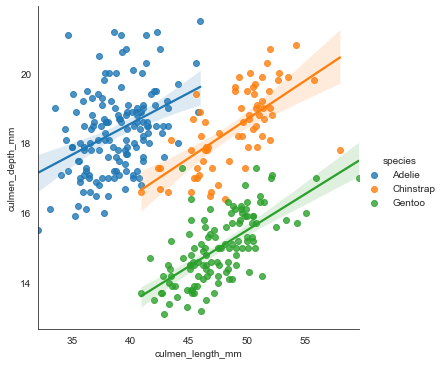

In [5]:
sns.lmplot(x='culmen_length_mm', y='culmen_depth_mm', 
           hue='species',
           data=df
          );

### `markers`

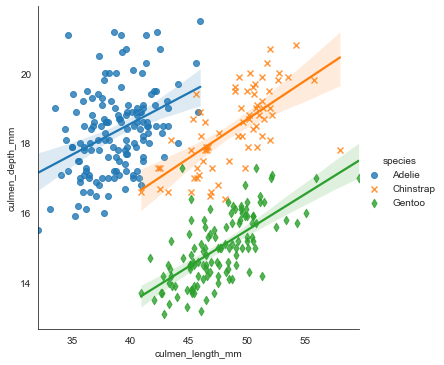

In [6]:
sns.lmplot(x='culmen_length_mm', y='culmen_depth_mm', 
           hue='species',
           markers=['o', 'x', 'd'],
           data=df
          );

## Small Multiples (FacetGrid)

### `col`

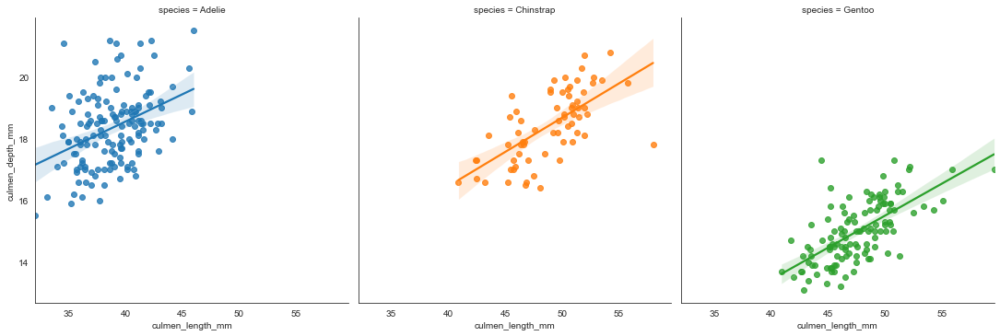

In [7]:
sns.lmplot(x='culmen_length_mm', y='culmen_depth_mm', 
           hue='species',
           col='species',
           data=df
          );

### `row`

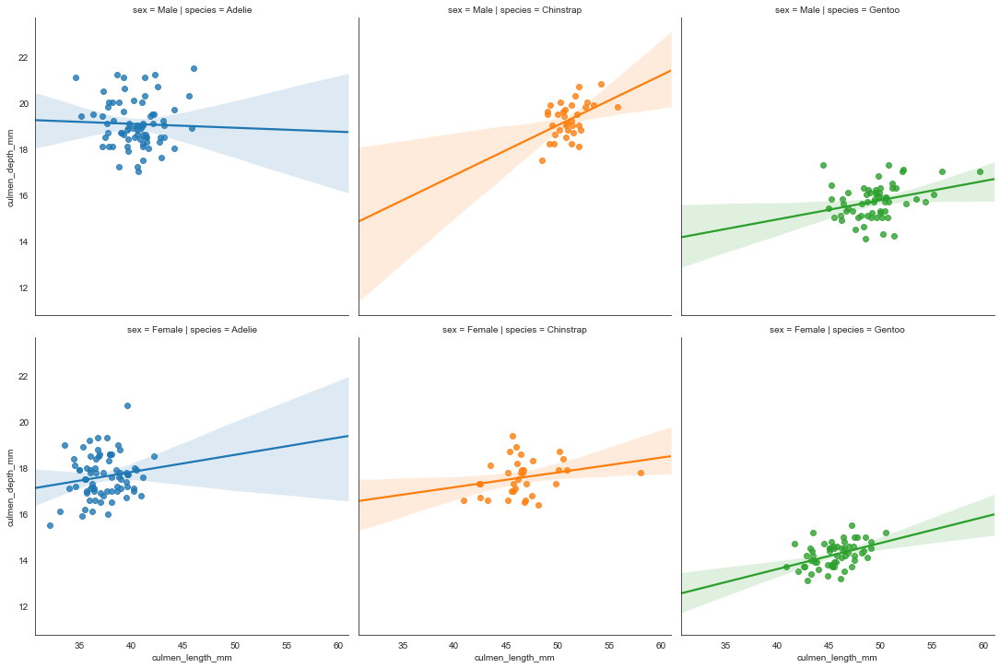

In [8]:
sns.lmplot(x='culmen_length_mm', y='culmen_depth_mm', 
           hue='species',
           col='species',
           row='sex',
           truncate=False,
           data=df
          );

## Extras

### `x_bins`

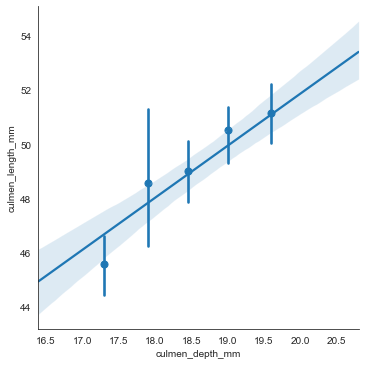

In [9]:
sns.lmplot(x='culmen_depth_mm', y='culmen_length_mm', 
           data=df[df.species=='Chinstrap'],
           x_bins=5
           );

### Other models: Logistic Regression, `logistic`

In [10]:
df['sex_binary'] = [(x == 'Male') for x in df.sex]

In [11]:
df.head()

,species,island,culmen_length_mm,culmen_depth_mm,flipper_length_mm,body_mass_g,sex,sex_binary
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male,True
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female,False
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female,False
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female,False
5,Adelie,Torgersen,39.3,20.6,190.0,3650.0,Male,True


/usr/local/lib/python3.7/site-packages/statsmodels/compat/pandas.py:49: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  data_klasses = (pandas.Series, pandas.DataFrame, pandas.Panel)


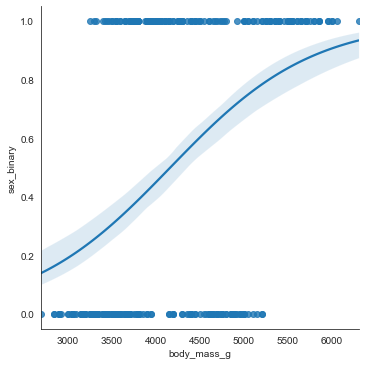

In [12]:
sns.lmplot(x='body_mass_g', y='sex_binary', data=df, logistic=True, n_boot=100);

/usr/local/lib/python3.7/site-packages/statsmodels/genmod/families/family.py:880: RuntimeWarning: invalid value encountered in true_divide
  n_endog_mu = self._clean((1. - endog) / (1. - mu))
/usr/local/lib/python3.7/site-packages/statsmodels/genmod/families/links.py:167: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)
/usr/local/lib/python3.7/site-packages/statsmodels/genmod/families/family.py:879: RuntimeWarning: invalid value encountered in true_divide
  endog_mu = self._clean(endog / mu)


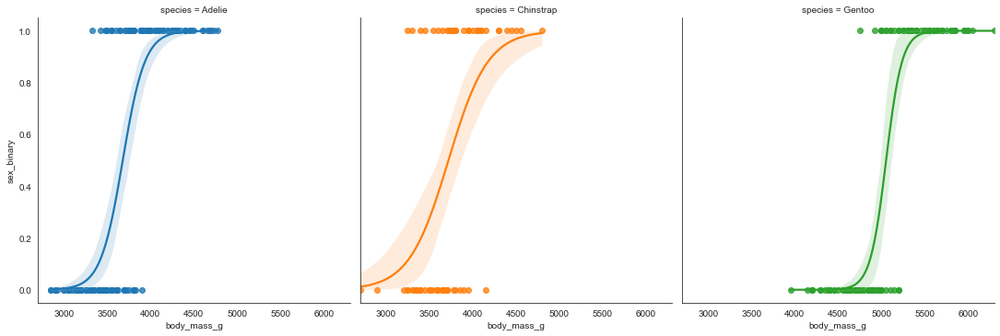

In [13]:
sns.lmplot(x='body_mass_g', y='sex_binary', data=df, logistic=True, n_boot=100,
          hue='species', col='species');

## Styling

### `scatter_kws`

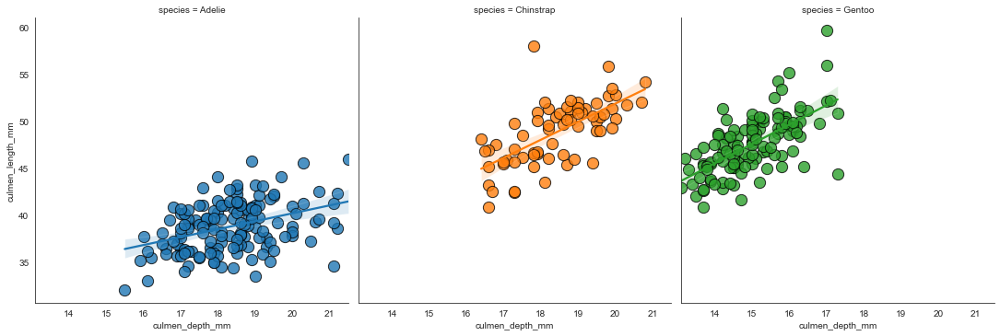

In [14]:
sns.lmplot(x='culmen_depth_mm', y='culmen_length_mm', 
           data=df, 
           hue='species',
           col='species',
           scatter_kws={'s': 150, 'edgecolor': 'black'}
           );

### `line_kws`

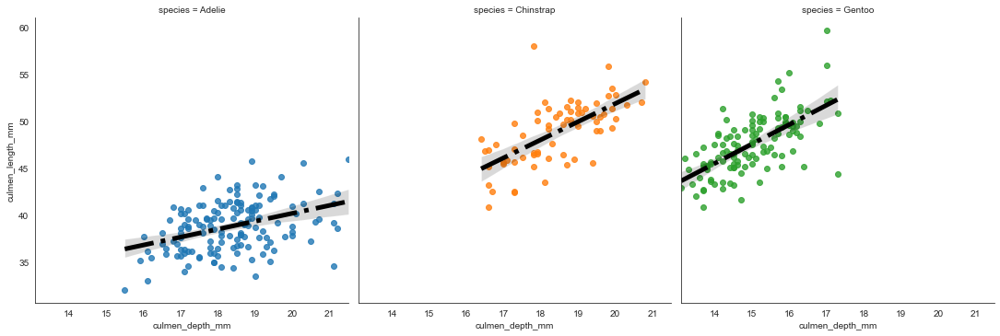

In [15]:
sns.lmplot(x='culmen_depth_mm', y='culmen_length_mm', 
           data=df, 
           hue='species',
           col='species',
           line_kws={'lw': 5, 'ls': '-.', 'color': 'black'}
           );

### FacetGrid Object

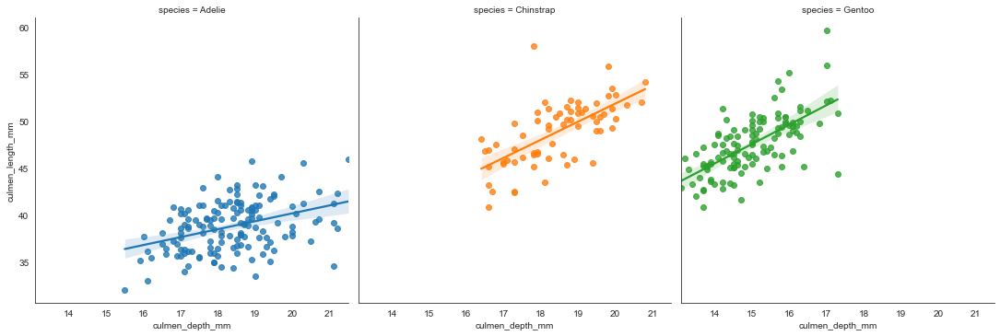

In [16]:
g = sns.lmplot(x='culmen_depth_mm', y='culmen_length_mm', 
               data=df, 
               hue='species', 
               col='species'
              );

In [17]:
type(g)

seaborn.axisgrid.FacetGrid

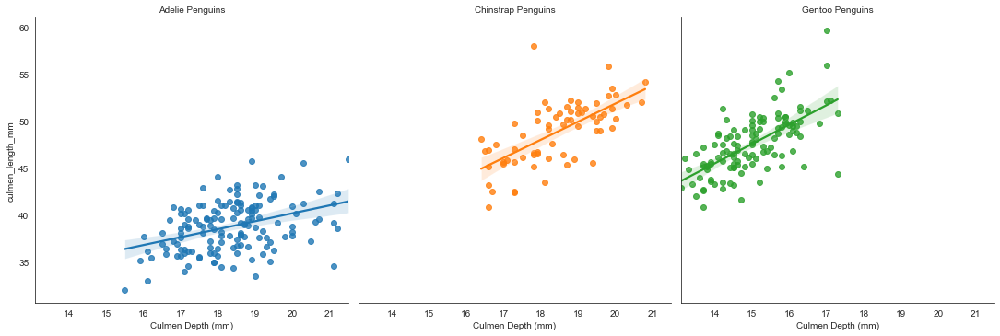

In [18]:
g = sns.lmplot(x='culmen_depth_mm', y='culmen_length_mm', 
               data=df, 
               hue='species', 
               col='species'
              )

g.set_titles(col_template='{col_name} Penguins')
g.set_xlabels('Culmen Depth (mm)');

## Examples, Thumbnail

In [19]:
from matplotlib import pyplot as plt

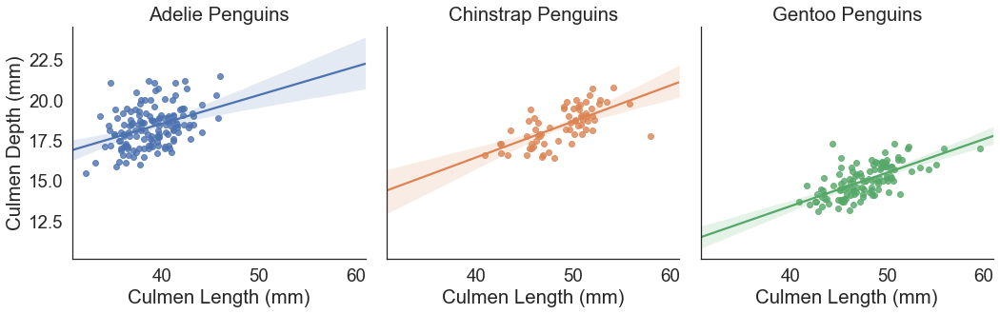

In [20]:
sns.set(style='white', font_scale=1.7)
g = sns.lmplot(x='culmen_length_mm', y='culmen_depth_mm', data=df, hue='species', col='species', truncate=False)

g.set_titles('{col_name} Penguins')
g.set_xlabels('Culmen Length (mm)')
g.set_ylabels('Culmen Depth (mm)')
plt.tight_layout()
#plt.savefig('20lmplot_image_facetGridExample.png', dpi=200);

In [21]:
diamonds = sns.load_dataset('diamonds').sample(1000)

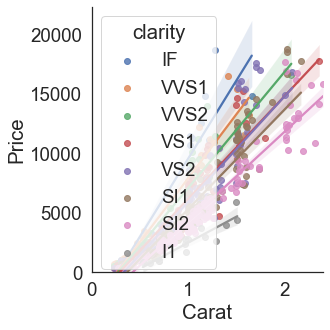

In [22]:
sns.lmplot(x='carat', y='price', data=diamonds, hue='clarity', legend=False)
plt.xlabel('Carat')
plt.ylabel('Price')
plt.ylim(0, None)
plt.xlim(0, None)
plt.legend(loc=2, title='clarity')
plt.tight_layout()
#plt.savefig('20lmplot_image_tooManyLines.png', dpi=200);

(0.0, 22450.49708643234)

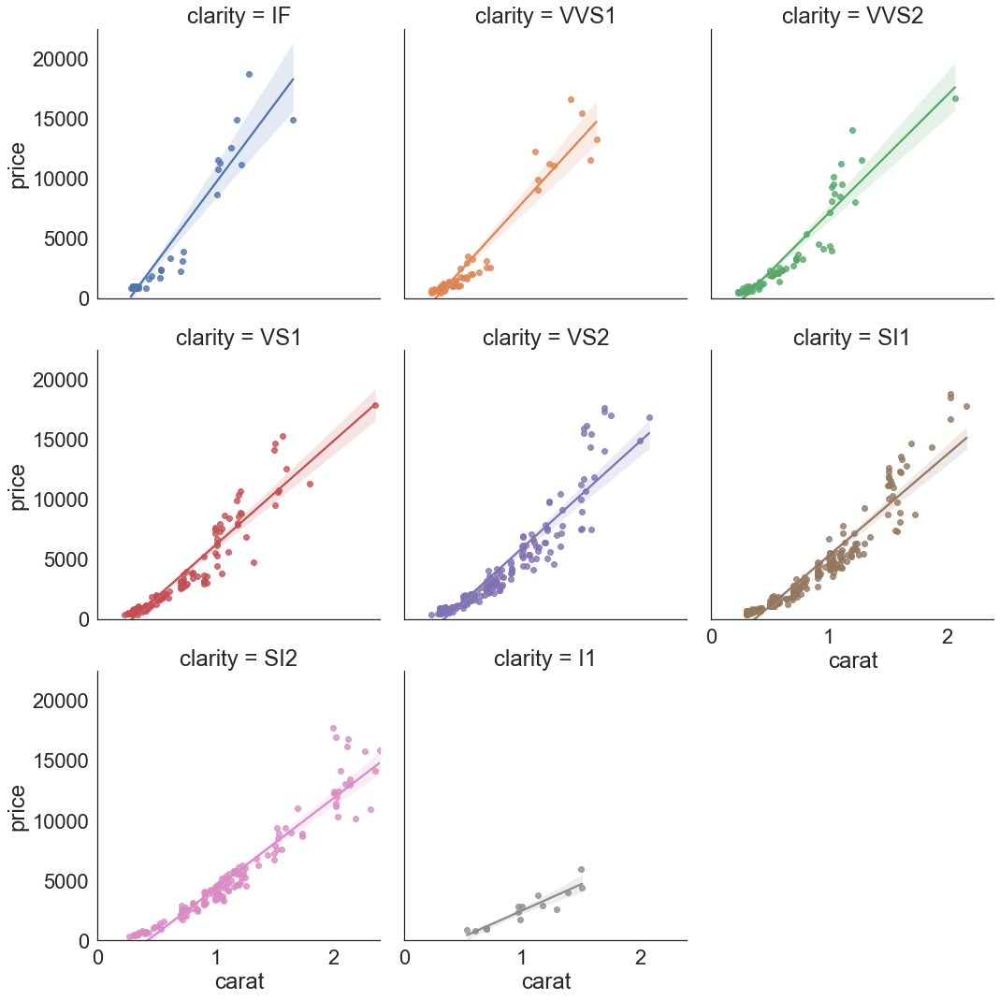

In [23]:
sns.set(style='white', font_scale=2)
sns.lmplot(x='carat', y='price', hue='clarity', data=diamonds, col='clarity', col_wrap=3)
plt.xlim(0, None)
plt.ylim(0, None)
#plt.savefig('20lmplot_image_tooManyLinesFacet.png', dpi=200);

### Thumb

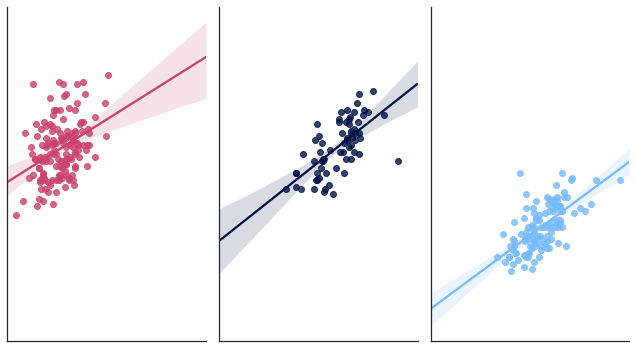

In [24]:
sns.set(style='white', font_scale=1)
g = sns.lmplot(x='culmen_length_mm', y='culmen_depth_mm', data=df, 
               hue='species', col='species', truncate=False, aspect=.6,
               palette=['#cb416b','#001146', '#75bbfd']
              )

g.set_titles('')
g.set_xlabels('')
g.set_ylabels('')
plt.xticks([])
plt.yticks([])
plt.tight_layout()
#plt.savefig('20lmplot_image_thumb.png', dpi=200);

# Seaborn: countplot

In [1]:
import seaborn as sns

In [2]:
diamonds = sns.load_dataset('diamonds')

diamonds.head()

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


In [3]:
diamonds = diamonds[diamonds.clarity.isin(['SI1', 'VS2'])]

In [4]:
diamonds.shape

(25323, 10)

## Basics

In [5]:
sns.set_style('darkgrid')

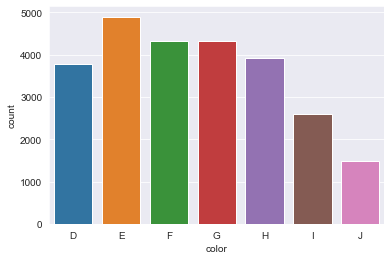

In [6]:
sns.countplot(x='color', data=diamonds);

In [7]:
diamonds.color.value_counts(sort=False)

D    3780
E    4896
F    4332
G    4323
H    3918
I    2593
J    1481
Name: color, dtype: int64

### Horizontal Countplot

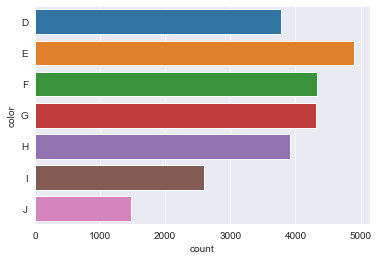

In [8]:
sns.countplot(y='color', data=diamonds);

## Options

### `order`

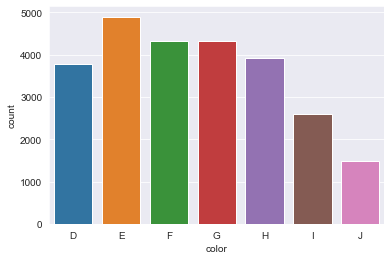

In [9]:
sns.countplot(x='color', data=diamonds);

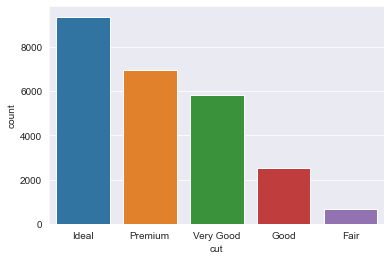

In [10]:
sns.countplot(x='cut', data=diamonds);

In [11]:
diamonds.dtypes

carat       float64
cut        category
color      category
clarity    category
depth       float64
table       float64
price         int64
x           float64
y           float64
z           float64
dtype: object

In [12]:
diamonds.color.cat.categories

Index(['D', 'E', 'F', 'G', 'H', 'I', 'J'], dtype='object')

In [13]:
diamonds.cut.cat.categories

Index(['Ideal', 'Premium', 'Very Good', 'Good', 'Fair'], dtype='object')

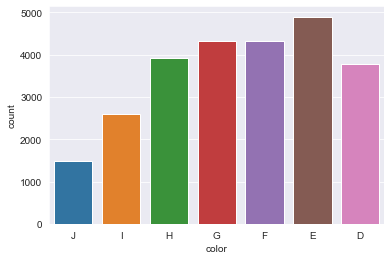

In [14]:
color_order=['J', 'I', 'H', 'G', 'F', 'E', 'D']

sns.countplot(x='color', data=diamonds, order=color_order);

### Order Ascending or Descending

In [15]:
diamonds.color.value_counts().index

CategoricalIndex(['E', 'F', 'G', 'H', 'D', 'I', 'J'], categories=['D', 'E', 'F', 'G', 'H', 'I', 'J'], ordered=False, dtype='category')

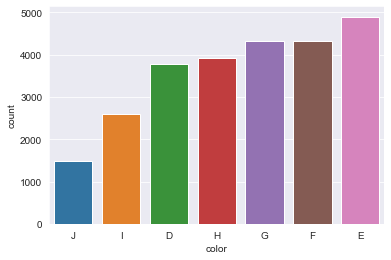

In [16]:
sns.countplot(x='color', data=diamonds,
              order=diamonds.color.value_counts().index[::-1]  #remove [::-1] for descending
             ); 

### `hue`, `hue_order`

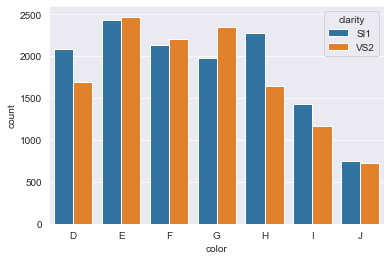

In [17]:
sns.countplot(x='color', data=diamonds, hue='clarity', hue_order=['SI1', 'VS2']);

## Styling

### `color` and `palette`

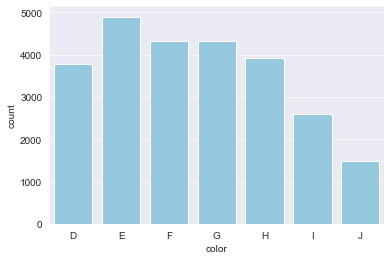

In [18]:
sns.countplot(x='color', data=diamonds, color='skyblue');

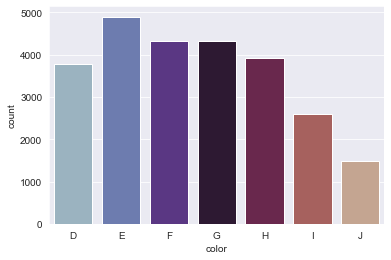

In [19]:
sns.countplot(x='color', data=diamonds, palette='twilight');

### Other Matplotlib Properties

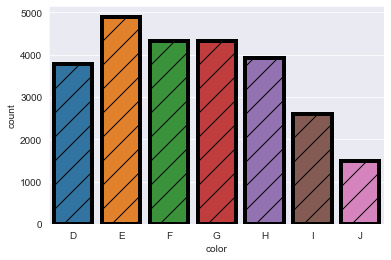

In [20]:
sns.countplot(x='color', data=diamonds,
              lw=4, ec='black', hatch='/'
             );

## Examples, Thumbnail

In [21]:
from matplotlib import pyplot as plt

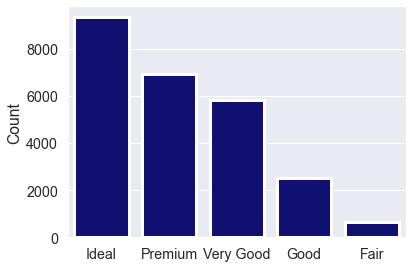

In [22]:
sns.set(style='darkgrid', font_scale=1.3)
sns.countplot(x='cut', data=diamonds, color='navy', lw=3)
plt.xlabel('')
plt.ylabel('Count')


plt.tight_layout()
#plt.savefig('20countplot_image_countplotExample.png', dpi=200);

In [23]:
sns.set_style('white')

import pandas as pd

df = pd.DataFrame({'Animal': ['dog', 'cat', 'cat', 'dog', 'dog', 'cat', 'dog'],
                   'Weight': [55, 8, 12, 25, 100, 10, 60]
                  })

In [24]:
df

,Animal,Weight
0,dog,55
1,cat,8
2,cat,12
3,dog,25
4,dog,100
5,cat,10
6,dog,60


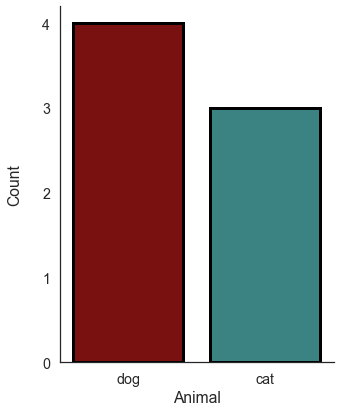

In [25]:
plt.figure(figsize=(5, 6))

sns.countplot(x='Animal', data=df, ec='black', lw=3, palette=['darkred', '#2F8F8F'])

plt.yticks([0, 1, 2, 3, 4])
plt.ylabel('Count', labelpad=20)

sns.despine()

plt.tight_layout()
#plt.savefig('21countplot_figure_dogsCats.svg');

In [26]:
df.groupby('Animal').Weight.mean()

Animal
cat    10
dog    60
Name: Weight, dtype: int64

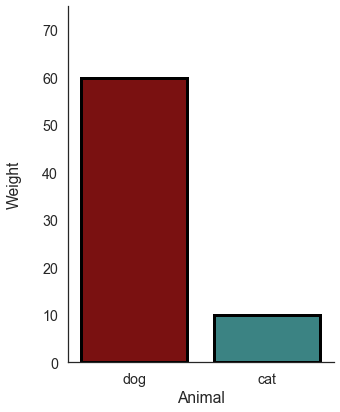

In [27]:
plt.figure(figsize=(5, 6))

sns.barplot(x='Animal', y='Weight', data=df, ec='black', lw=3, 
            palette=['darkred', '#2F8F8F'],
            ci=None
           )

plt.ylim(0, 75)
plt.ylabel('Weight', labelpad=20)

sns.despine()

plt.tight_layout()
#plt.savefig('21countplot_figure_dogsCats_bar_noCI.svg');

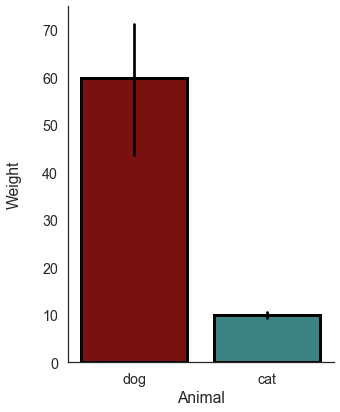

In [28]:
plt.figure(figsize=(5, 6))

sns.barplot(x='Animal', y='Weight', data=df, ec='black', lw=3, 
            palette=['darkred', '#2F8F8F'],
            ci=68, errcolor='black'
           )

plt.ylim(0, 75)
plt.ylabel('Weight', labelpad=20)

sns.despine()

plt.tight_layout()
#plt.savefig('21countplot_figure_dogsCats_bar_withCI.svg');

### Thumb

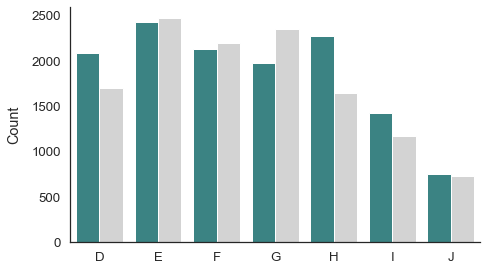

In [29]:
plt.figure(figsize=(7,4))
sns.set(style='white', font_scale=1.2)
ax = sns.countplot(x='color', data=diamonds, 
                   hue='clarity', hue_order=['SI1', 'VS2'], 
                   palette=['#2F8F8F', 'lightgray'])
ax.legend([], frameon=False)
sns.despine()

plt.xlabel('')
plt.ylabel('Count', labelpad=10)
plt.tight_layout()
#plt.savefig('21countplot_image_thumb.png', dpi=200);

# Seaborn: clustermap

In [1]:
import seaborn as sns

from matplotlib import pyplot as plt
import numpy as np
import pandas as pd

## Basics - Toy Example

In [2]:
toy_data_dict = {
    'Name': ['Andy', 'Ben', 'Claire', 'David'],
    'Hours_Studied': [10, 20, 12, 28],
    'Score': [15, 20, 16, 25],
    'Street_Address': [11, 24, 18, 9]
}

In [3]:
toy_data = pd.DataFrame(toy_data_dict)
toy_data.set_index('Name', inplace=True)

toy_data

,Hours_Studied,Score,Street_Address
Name,,,
Andy,10,15,11
Ben,20,20,24
Claire,12,16,18
David,28,25,9


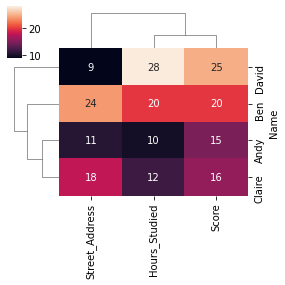

In [4]:
sns.clustermap(toy_data, figsize=(4, 4), annot=True);

## Basics - Penguins Dataset

#### Load the data

In [5]:
penguins = sns.load_dataset('penguins').dropna()

In [6]:
penguins.head()

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female
5,Adelie,Torgersen,39.3,20.6,190.0,3650.0,Male


In [7]:
penguins.shape

(333, 7)

#### Build clustermap

In [8]:
numerical_cols = penguins.columns[2:6]

numerical_cols

Index(['bill_length_mm', 'bill_depth_mm', 'flipper_length_mm', 'body_mass_g'], dtype='object')

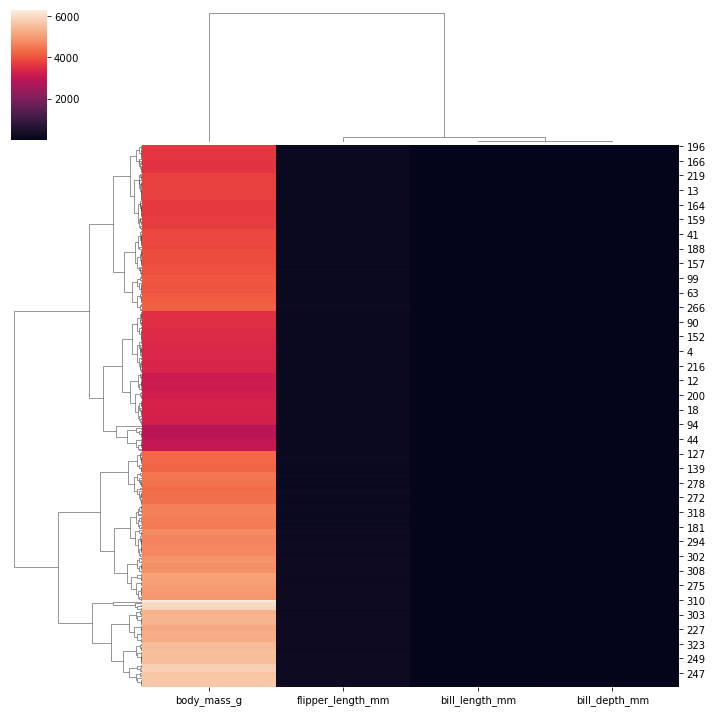

In [9]:
sns.clustermap(penguins[numerical_cols]);

#### `standard_scale`

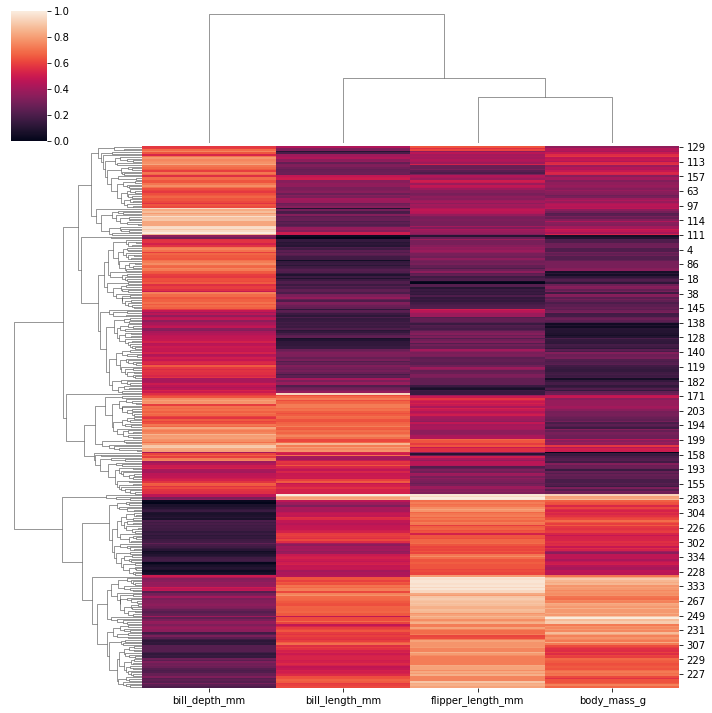

In [10]:
sns.clustermap(penguins[numerical_cols], standard_scale=1);

## Linkage and Metric

#### `method` = Linkage

Check out the `scipy` [documentation](https://docs.scipy.org/doc/scipy/reference/generated/scipy.cluster.hierarchy.linkage.html#scipy.cluster.hierarchy.linkage) to learn more about available linkage options.

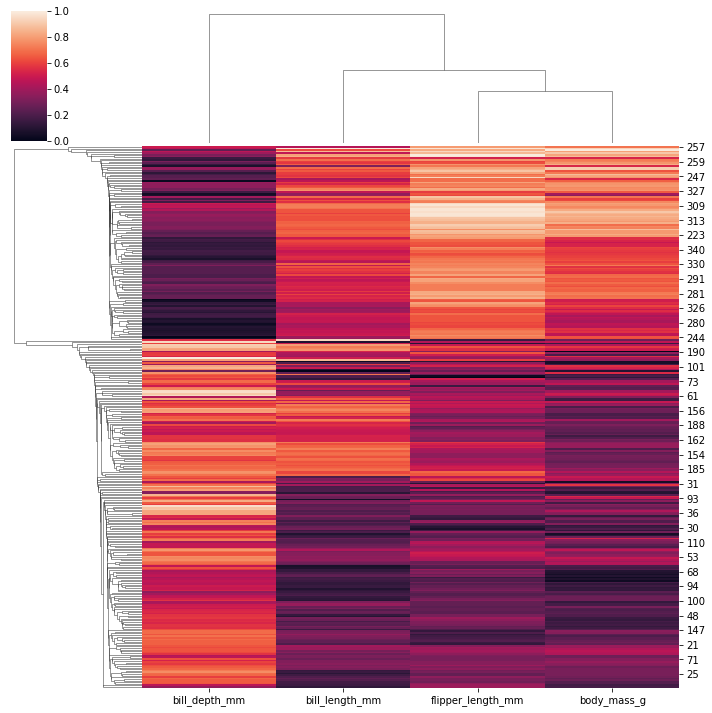

In [11]:
sns.clustermap(penguins[numerical_cols], standard_scale=1, method='single');

#### `metric`

See `scipy` [documentation](https://docs.scipy.org/doc/scipy/reference/generated/scipy.spatial.distance.pdist.html#scipy.spatial.distance.pdist) to learn about other available metrics.

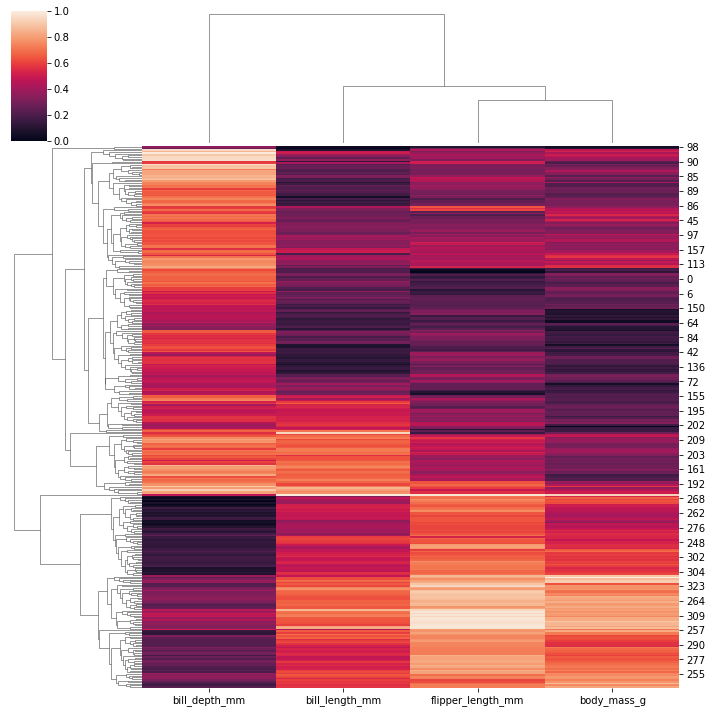

In [12]:
sns.clustermap(penguins[numerical_cols], standard_scale=1, metric='cityblock');

## Additional Options

### `row_colors`

In [13]:
species_colors=penguins.species.map({
    'Adelie': 'blue',
    'Chinstrap': 'red',
    'Gentoo': 'green'
})

In [14]:
len(species_colors)

333

In [15]:
species_colors[:5]

0    blue
1    blue
2    blue
4    blue
5    blue
Name: species, dtype: object

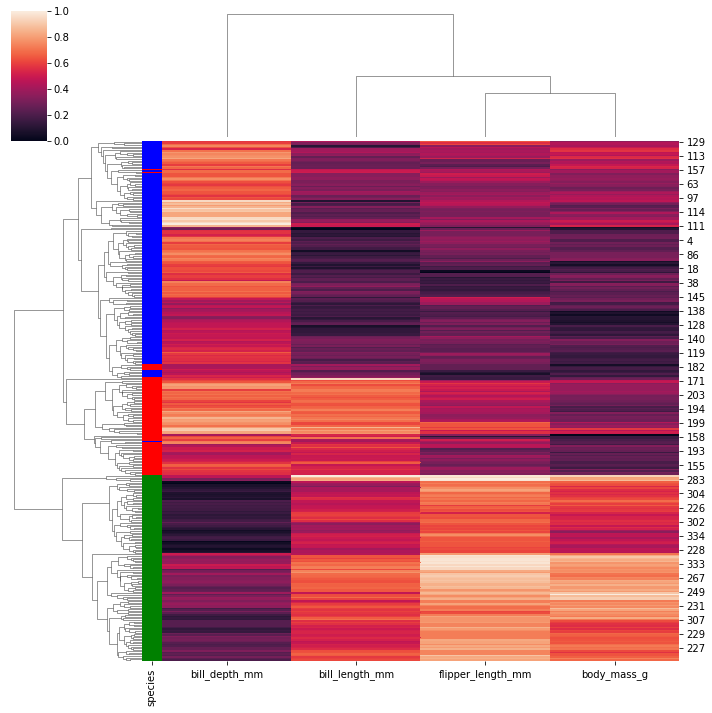

In [16]:
sns.clustermap(penguins[numerical_cols], standard_scale=1, row_colors=species_colors);

## BONUS: Styling

#### `cmap` and `vmin`

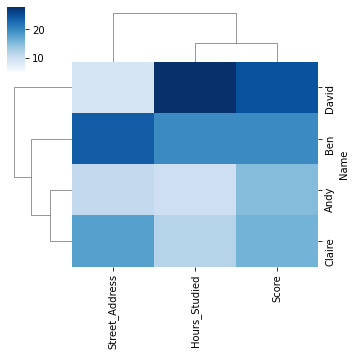

In [17]:
sns.clustermap(toy_data, figsize=(5, 5), cmap='Blues', vmin=5);

#### `row_cluster` and `cbar_pos`

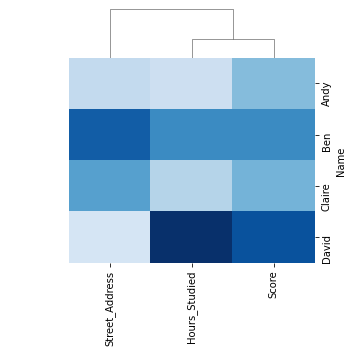

In [18]:
sns.clustermap(toy_data, figsize=(5, 5), cmap='Blues', vmin=5,
               row_cluster=False,
               cbar_pos=None #(0,.4,.05,.35)
              );

#### Annotations with `annot` and `fmt`

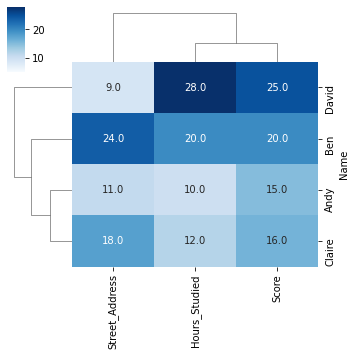

In [19]:
sns.clustermap(toy_data, figsize=(5, 5), cmap='Blues', vmin=5, annot=True, fmt='.1f');

## Overlays and Thumbnail

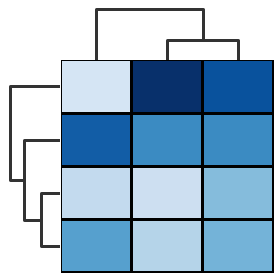

In [20]:
sns.clustermap(toy_data.reset_index().drop('Name', axis=1), 
               figsize=(4, 4), xticklabels=[], 
               yticklabels=[],
               cbar_pos=None,
               cmap='Blues',
               lw=2,
               linecolor='black',
               vmin=5,
               tree_kws={'lw': 3}
              );
#plt.savefig('22clustermap_image_whatIs.png', dpi=200)

### Thumbnail

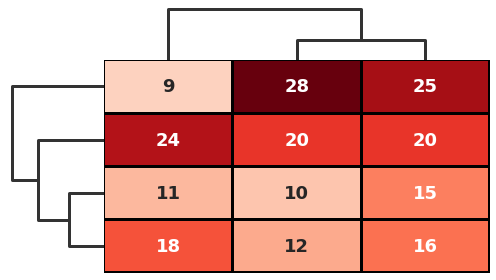

In [21]:
sns.clustermap(toy_data.reset_index().drop('Name', axis=1),
               figsize=(7,4), 
               xticklabels=[],
               yticklabels=[],
               cbar_pos=None,
               cmap='Reds',
               vmin=5,
               tree_kws={'lw': 3},
               lw=2,
               linecolor='black',
               annot=True,
               annot_kws={'fontsize': 18, 'fontweight': 'bold'}
              );
#plt.savefig('22clustermap_image_thumbnail.png', dpi=200)

# Seaborn: PairGrid

In [1]:
import seaborn as sns

from matplotlib import pyplot as plt

In [2]:
iris = sns.load_dataset('iris')

In [3]:
iris.head()

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa


## Basics

In [4]:
sns.set_style('darkgrid')

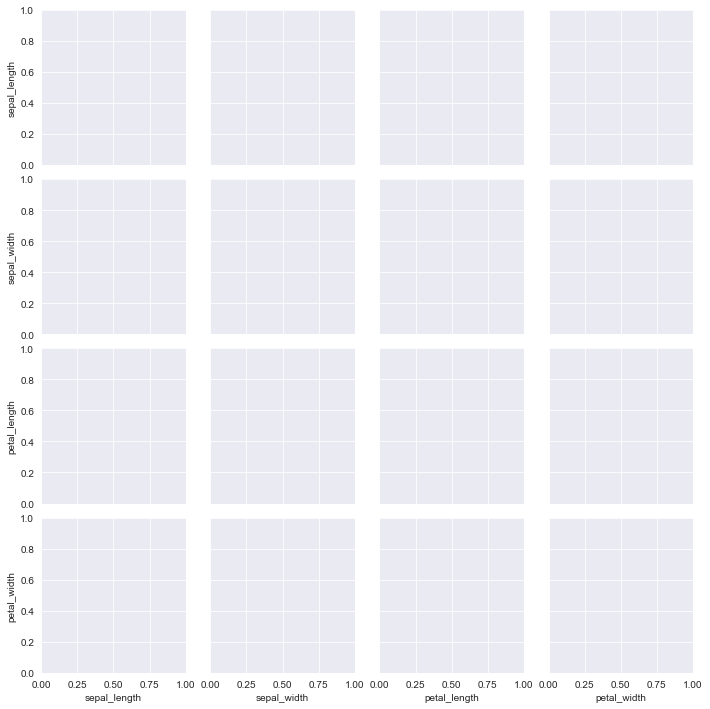

In [5]:
g = sns.PairGrid(iris);

In [6]:
type(g)

seaborn.axisgrid.PairGrid

### `.map()`

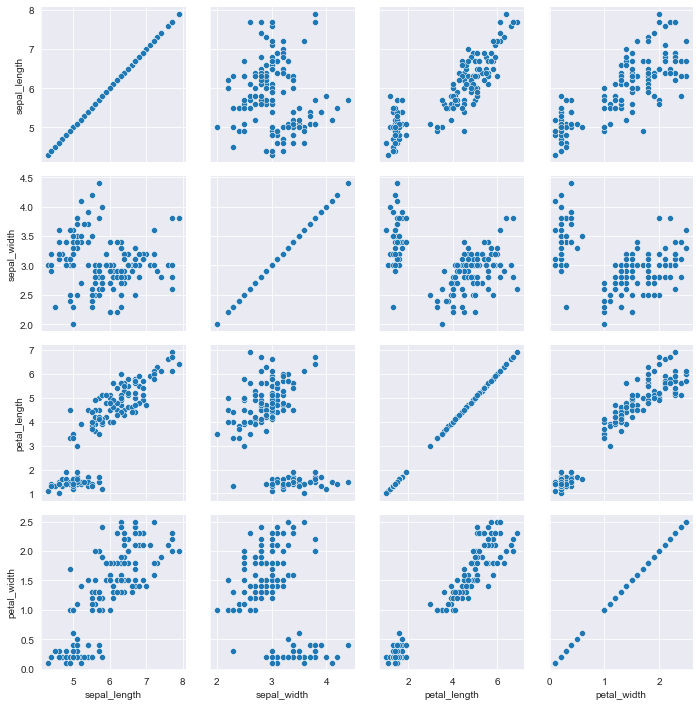

In [7]:
g = sns.PairGrid(iris)
g.map(sns.scatterplot);

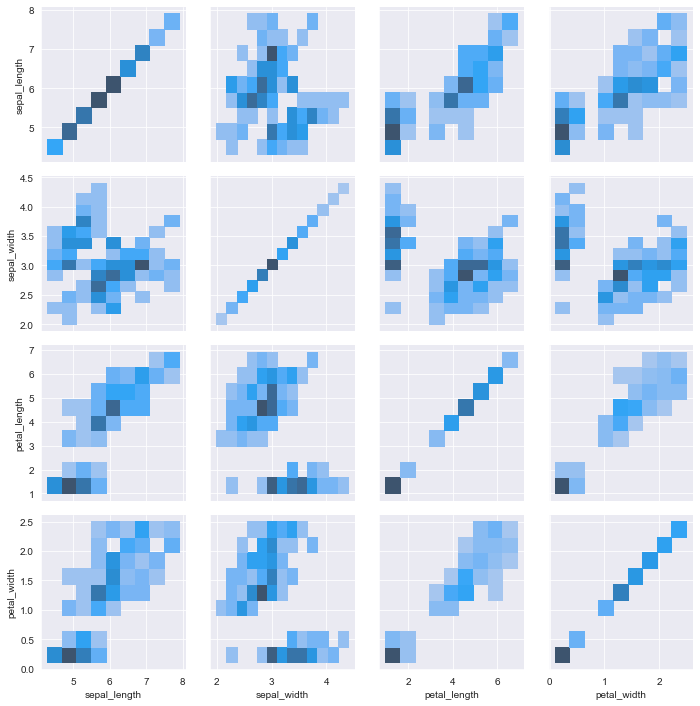

In [8]:
g = sns.PairGrid(iris)
g.map(sns.histplot);

### Matplotlib Functions

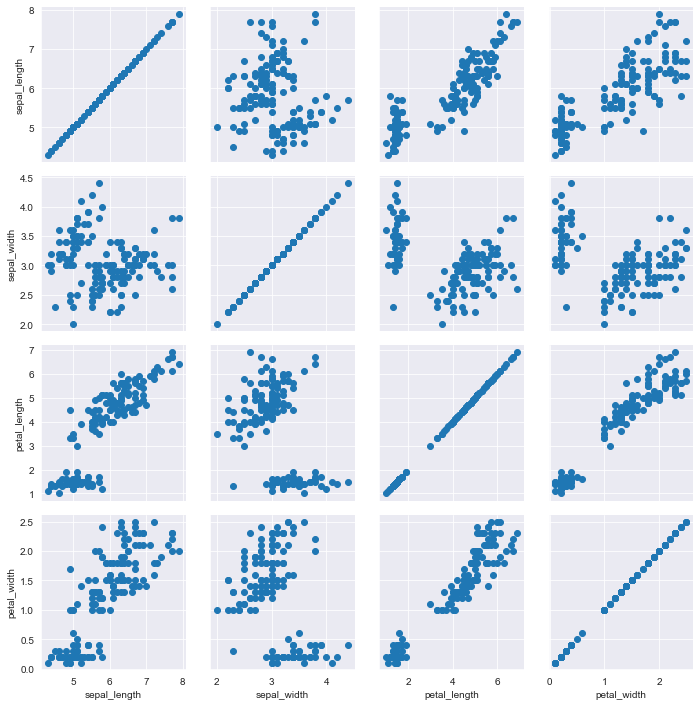

In [9]:
g = sns.PairGrid(iris)
g.map(plt.scatter);

## PairGrid Anatomy

### `.map_diag()` and `.map_offdiag()`

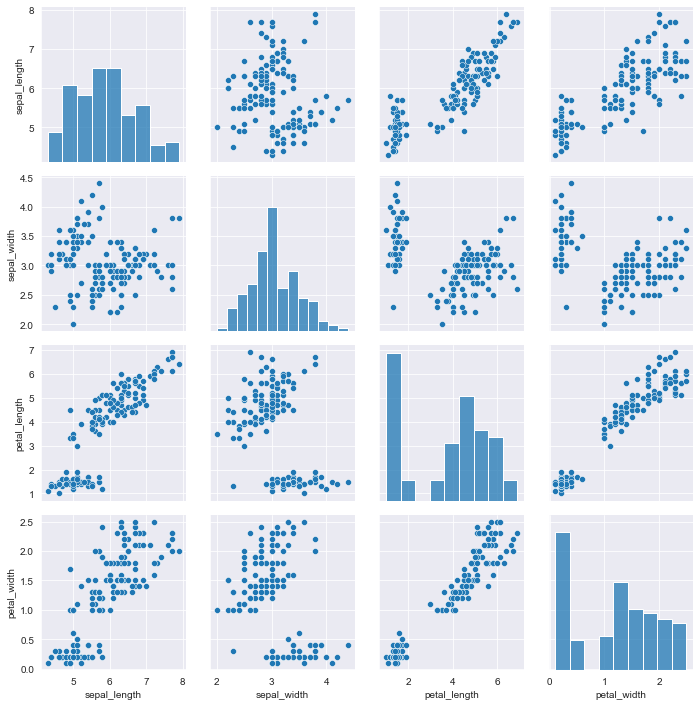

In [10]:
g = sns.PairGrid(iris)
g.map_offdiag(sns.scatterplot)
g.map_diag(sns.histplot);

### `.map_upper()` and `.map_lower()`

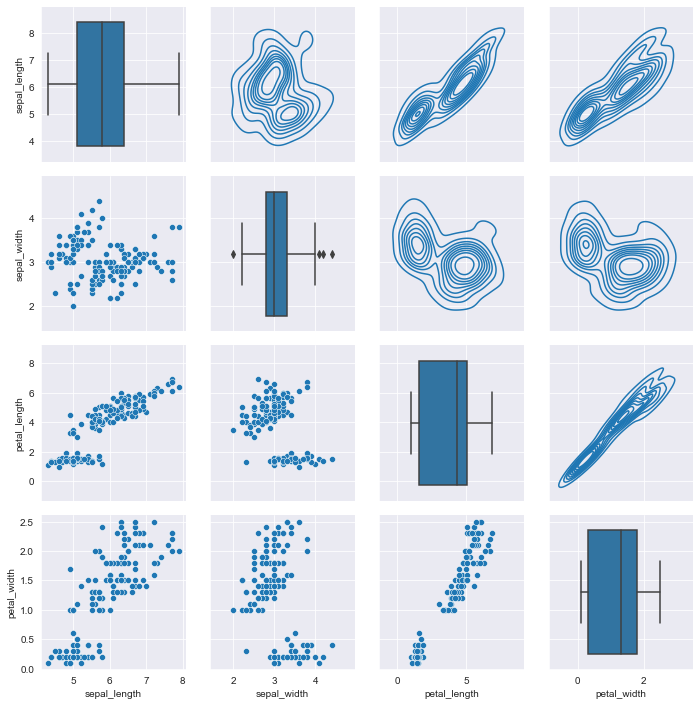

In [11]:
g = sns.PairGrid(iris)
g.map_lower(sns.scatterplot)
g.map_diag(sns.boxplot)
g.map_upper(sns.kdeplot);

### `corner`

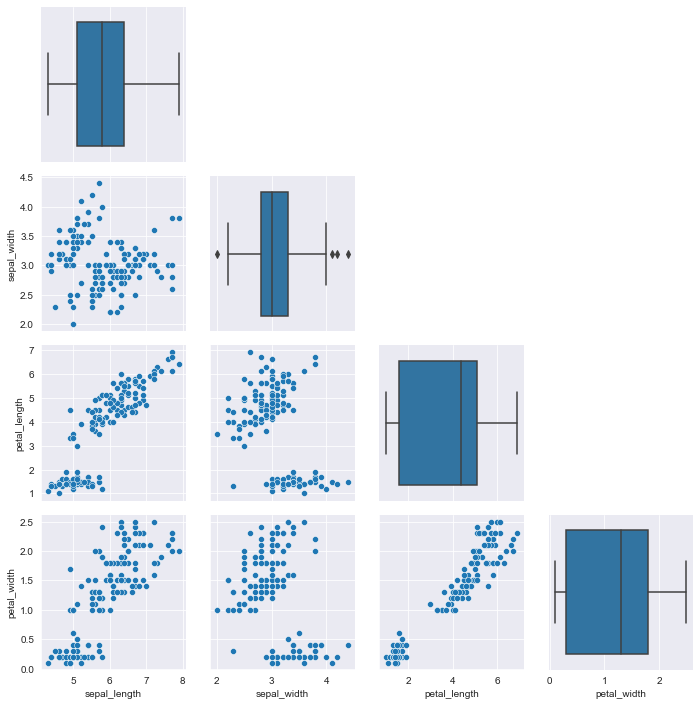

In [12]:
g = sns.PairGrid(iris, corner=True)
g.map_offdiag(sns.scatterplot)
g.map_diag(sns.boxplot);

## Additional Options

### `hue`

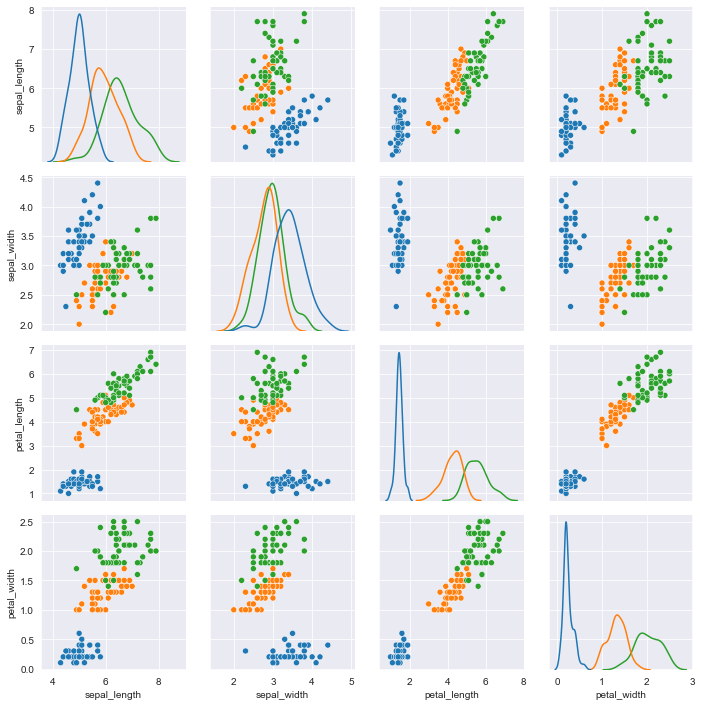

In [13]:
g = sns.PairGrid(iris, hue='species', diag_sharey=False)
g.map_diag(sns.kdeplot) 
g.map_offdiag(sns.scatterplot);

### `vars`

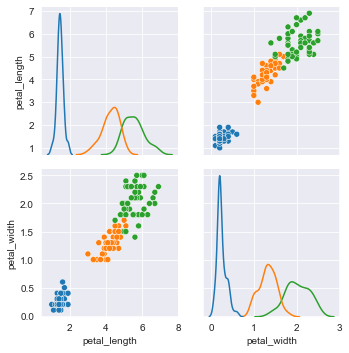

In [14]:
g = sns.PairGrid(iris, hue='species', diag_sharey=False, vars=['petal_length', 'petal_width'])
g.map_diag(sns.kdeplot)
g.map_offdiag(sns.scatterplot);

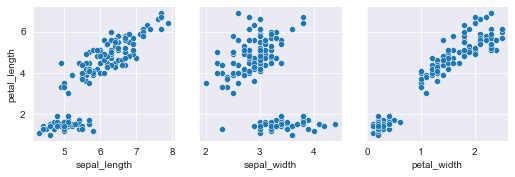

In [15]:
g = sns.PairGrid(iris,  
                 x_vars=['sepal_length', 'sepal_width', 'petal_width'],
                 y_vars=['petal_length']
                )
g.map(sns.scatterplot);

## Styling

### Plot-specific Keywords

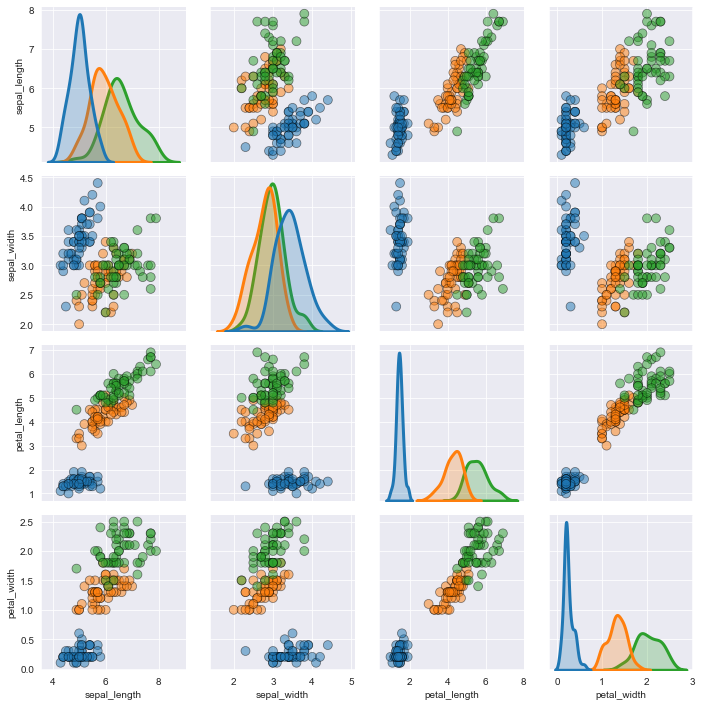

In [16]:
g = sns.PairGrid(iris, hue='species', diag_sharey=False)
g.map_diag(sns.kdeplot, fill=True, lw=3)
g.map_offdiag(sns.scatterplot, s=80, alpha=.5, ec='black');

### `height`, `aspect`

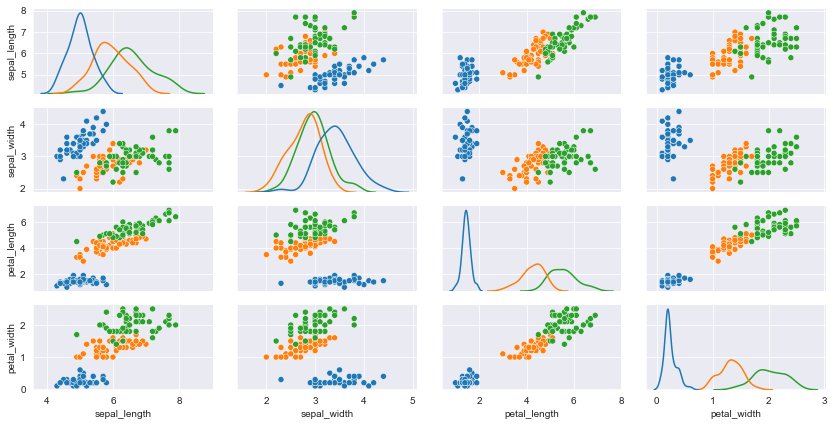

In [17]:
g = sns.PairGrid(iris, hue='species', diag_sharey=False, height=1.5, aspect=2)
g.map_diag(sns.kdeplot)
g.map_offdiag(sns.scatterplot);

### `palette`

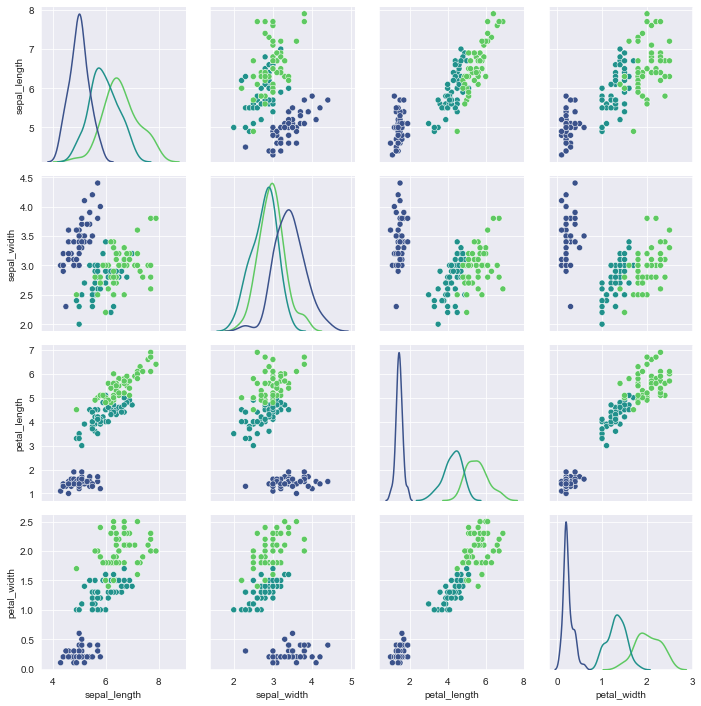

In [18]:
g = sns.PairGrid(iris, hue='species', diag_sharey=False, palette='viridis')
g.map_diag(sns.kdeplot)
g.map_offdiag(sns.scatterplot);

### `.add_legend()`

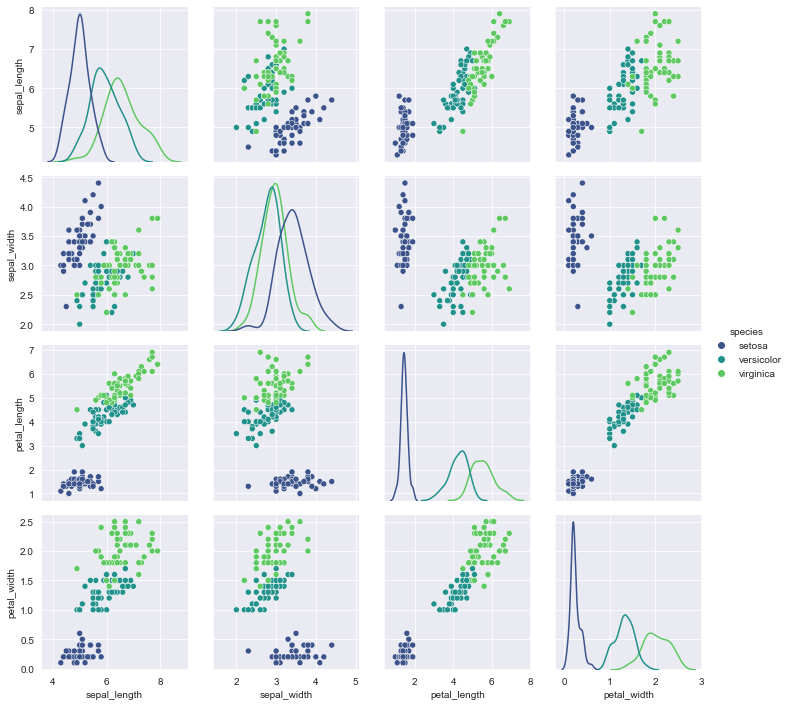

In [19]:
g = sns.PairGrid(iris, hue='species', diag_sharey=False, palette='viridis')
g.map_diag(sns.kdeplot)
g.map_offdiag(sns.scatterplot)
g.add_legend();

In [20]:
g.palette    #g. + TAB shows you methods and properties of the PairGrid

[(0.229739, 0.322361, 0.545706),
 (0.127568, 0.566949, 0.550556),
 (0.369214, 0.788888, 0.382914)]

## Thumbnail and Overlays

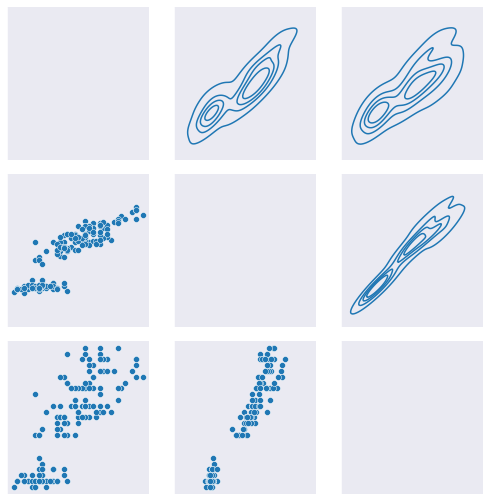

In [21]:
g = sns.PairGrid(iris, vars=['sepal_length','petal_length', 'petal_width'], diag_sharey=False)
#g.map_diag(sns.histplot)
#g.map_offdiag(sns.scatterplot)
g.map_lower(sns.scatterplot)
g.map_upper(sns.kdeplot, n_levels=5)
for var in g.axes:
    for ax in var:
        ax.set_xlabel('')
        ax.set_ylabel('')
        ax.set_xticks([])
        ax.set_yticks([])
#g.savefig('23pairgrid_image_blank.png', dpi=200)
#g.savefig('23pairgrid_image_maindiag.png', dpi=200)
#g.savefig('23pairgrid_image_offdiag.png', dpi=200)
#g.savefig('23pairgrid_image_differentdiag.png', dpi=200)

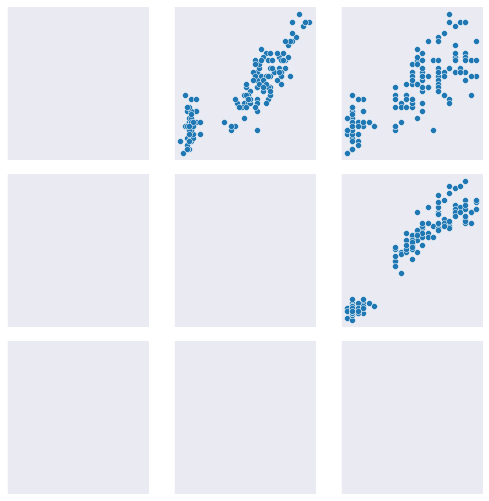

In [22]:
g = sns.PairGrid(iris, vars=['sepal_length','petal_length', 'petal_width'], diag_sharey=False)
#g.map_lower(sns.scatterplot)
g.map_upper(sns.scatterplot)
for var in g.axes:
    for ax in var:
        ax.set_xlabel('')
        ax.set_ylabel('')
        ax.set_xticks([])
        ax.set_yticks([])
#g.savefig('23pairgrid_image_lowertri.png', dpi=200)
#g.savefig('23pairgrid_image_uppertri.png', dpi=200)

### Thumbnail

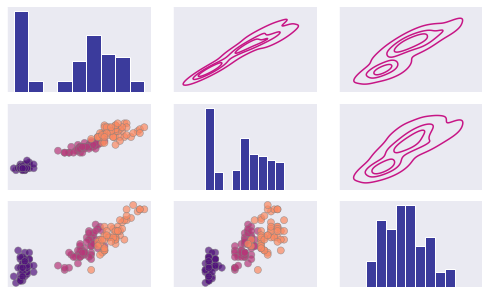

In [23]:
g = sns.PairGrid(iris, 
                 hue='species', 
                 palette='magma', 
                 vars=['petal_length', 'petal_width', 'sepal_length'], 
                 height=1.5, 
                 aspect=1.65, 
                 diag_sharey=False
                )
g.map_lower(sns.scatterplot, s=50, alpha=0.7, ec='gray')
g.map_diag(sns.histplot,hue=None, color='navy')
g.map_upper(sns.kdeplot, n_levels=4,hue=None, color='mediumvioletred')
for var in g.axes:
    for ax in var:
        ax.set_xlabel('')
        ax.set_ylabel('')
        ax.set_xticks([])
        ax.set_yticks([])
#g.savefig('23pairgrid_image_thumb.png', dpi=200);

# Seaborn: ecdfplot

In [1]:
import seaborn as sns

from matplotlib import pyplot as plt

In [2]:
tips = sns.load_dataset('tips')

In [3]:
tips.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


In [4]:
tips.shape

(244, 7)

## Basics

In [5]:
sns.set_style('darkgrid')

#### x-axis

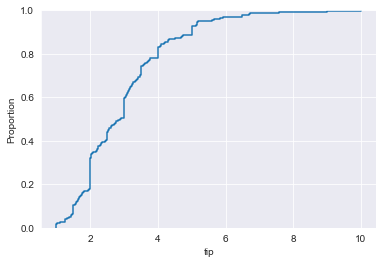

In [6]:
sns.ecdfplot(x='tip', data=tips);

In [7]:
tips.tip.min()

1.0

In [8]:
tips.tip.max()

10.0

In [9]:
tips.tip.value_counts().head()

2.0    33
3.0    23
4.0    12
5.0    10
2.5    10
Name: tip, dtype: int64

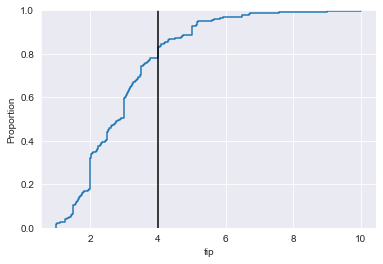

In [10]:
sns.ecdfplot(x='tip', data=tips)
plt.axvline(4, c='black');

#### y-axis

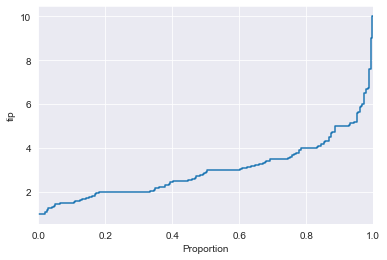

In [11]:
sns.ecdfplot(y='tip', data=tips);

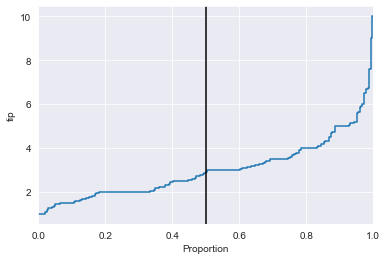

In [12]:
sns.ecdfplot(y='tip', data=tips)
plt.axvline(0.5, c='black');

In [13]:
tips.tip.median()

2.9

## Additional Options

### `hue`

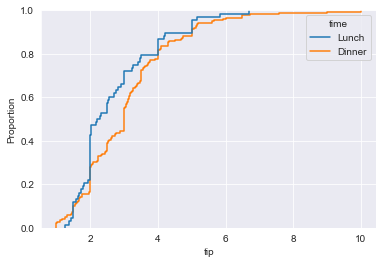

In [14]:
sns.ecdfplot(x='tip', data=tips, hue='time');

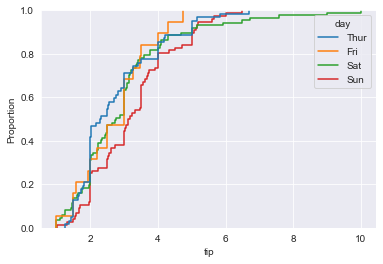

In [15]:
sns.ecdfplot(x='tip', data=tips, hue='day');

### `stat=count`

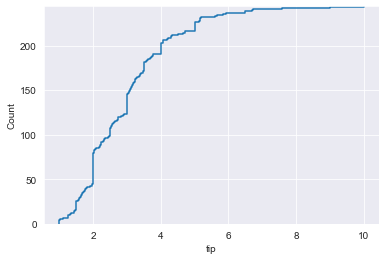

In [16]:
sns.ecdfplot(x='tip', data=tips, stat='count');

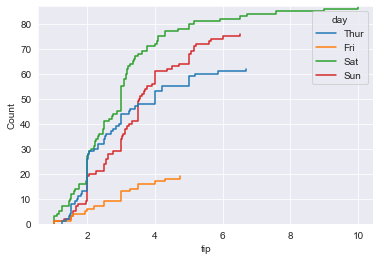

In [17]:
sns.ecdfplot(x='tip', data=tips, stat='count', hue='day');

### Ranking with `stat=count` and `complementary`

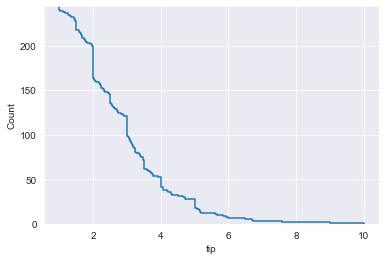

In [18]:
sns.ecdfplot(x='tip', data=tips, stat='count', complementary=True);

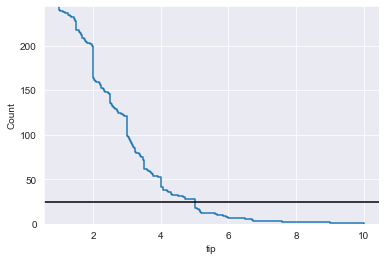

In [19]:
sns.ecdfplot(x='tip', data=tips, stat='count', complementary=True)
plt.axhline(25, c='black');

### `weights`

Use `weights` to weigh the proportion.  Here, 50% of the tip money made came from tips less than about $3.50.

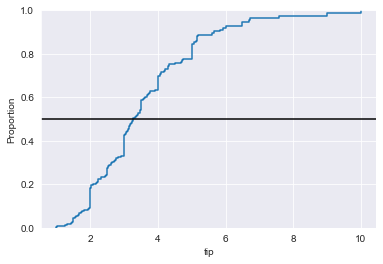

In [20]:
sns.ecdfplot(x='tip', data=tips, weights='tip')
plt.axhline(0.5, c='black');

## Styling

### `palette`

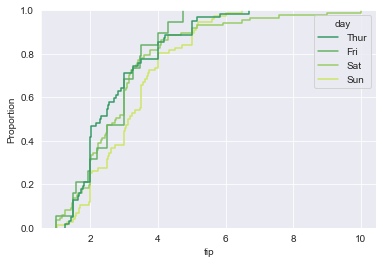

In [21]:
sns.ecdfplot(x='tip', data=tips, hue='day', palette='summer');

### Line Width, `lw`

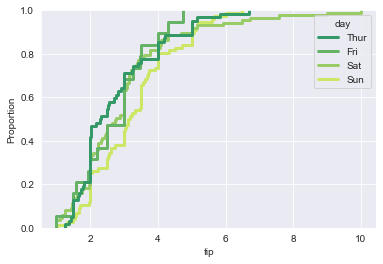

In [22]:
sns.ecdfplot(x='tip', data=tips, hue='day', palette='summer', lw=3);

### Adjust Legend

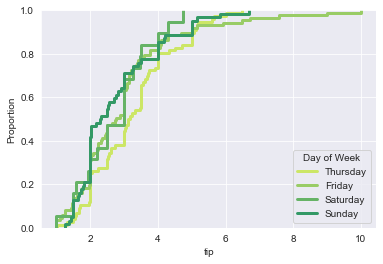

In [23]:
p = sns.ecdfplot(x='tip', data=tips, hue='day', palette='summer', lw=3)
p.legend(['Thursday', 'Friday', 'Saturday', 'Sunday'], title='Day of Week', loc=4);

In [24]:
type(p)

matplotlib.axes._subplots.AxesSubplot

## Thumbnail and Overlays

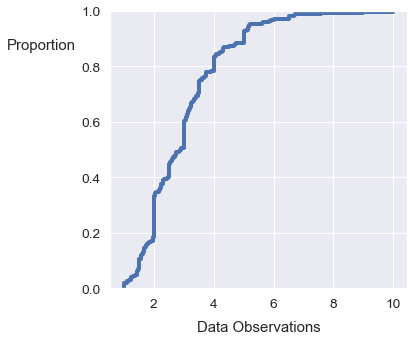

In [25]:
sns.set(font_scale=1.25)
plt.figure(figsize=(6, 5))
sns.ecdfplot(x='tip', data=tips, lw=4)
plt.xlabel('Data Observations', labelpad=10)
plt.ylabel('Proportion', rotation=0, position=(-0.1, .85), labelpad=40)
plt.tight_layout()
#plt.savefig('24ecdfplot_image_exampleEcdf.png', dpi=200);

### Thumbnail (and Overlay)

In [26]:
penguins = sns.load_dataset('penguins')

In [27]:
penguins.head()

,species,island,bill_length_mm,bill_depth_mm,flipper_length_mm,body_mass_g,sex
0,Adelie,Torgersen,39.1,18.7,181.0,3750.0,Male
1,Adelie,Torgersen,39.5,17.4,186.0,3800.0,Female
2,Adelie,Torgersen,40.3,18.0,195.0,3250.0,Female
3,Adelie,Torgersen,NaN,NaN,NaN,NaN,NaN
4,Adelie,Torgersen,36.7,19.3,193.0,3450.0,Female


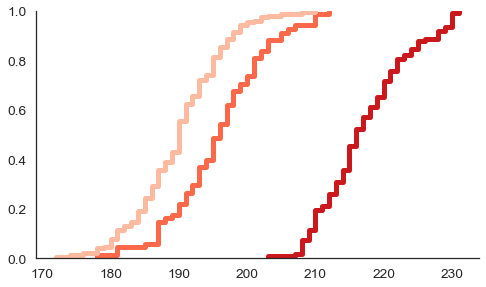

In [28]:
sns.set(font_scale=1.25, style='white')
plt.figure(figsize=(7, 4.25))
sns.ecdfplot(x='flipper_length_mm', data=penguins, lw=5, hue='species', palette='Reds')
plt.xlabel('')
plt.ylabel('')
plt.legend([], frameon=False)
sns.despine()
plt.tight_layout()
#plt.savefig('24ecdfplot_image_thumbnail.png', dpi=200)

# Seaborn: JointGrid

In [1]:
import seaborn as sns

In [2]:
cars = sns.load_dataset('mpg')

In [3]:
cars.head()

,mpg,cylinders,displacement,horsepower,weight,acceleration,model_year,origin,name
0,18.0,8,307.0,130.0,3504,12.0,70,usa,chevrolet chevelle malibu
1,15.0,8,350.0,165.0,3693,11.5,70,usa,buick skylark 320
2,18.0,8,318.0,150.0,3436,11.0,70,usa,plymouth satellite
3,16.0,8,304.0,150.0,3433,12.0,70,usa,amc rebel sst
4,17.0,8,302.0,140.0,3449,10.5,70,usa,ford torino


## Basics

In [4]:
sns.set_style('darkgrid')

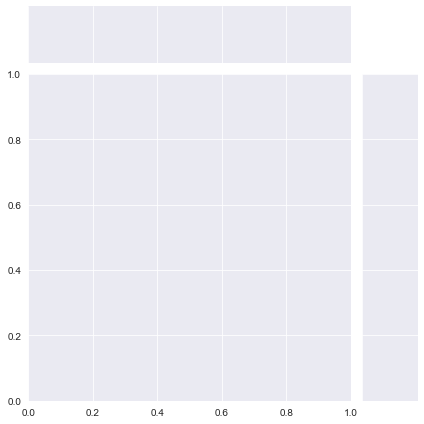

In [5]:
g = sns.JointGrid();

In [6]:
type(g)

seaborn.axisgrid.JointGrid

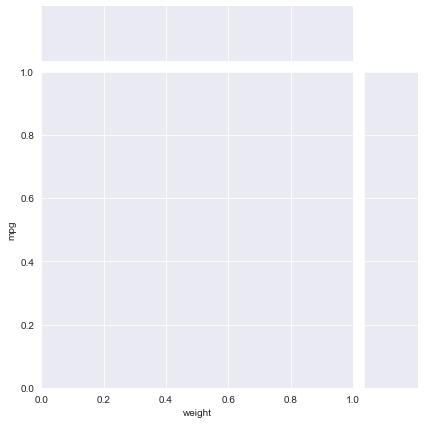

In [7]:
g = sns.JointGrid(data=cars, x='weight', y='mpg');

### `.plot()`

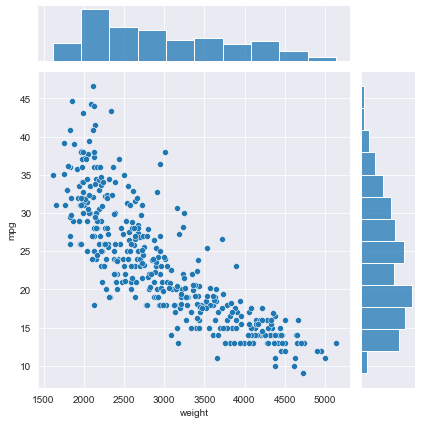

In [8]:
g = sns.JointGrid(data=cars, x='weight', y='mpg')
g.plot(sns.scatterplot, sns.histplot);

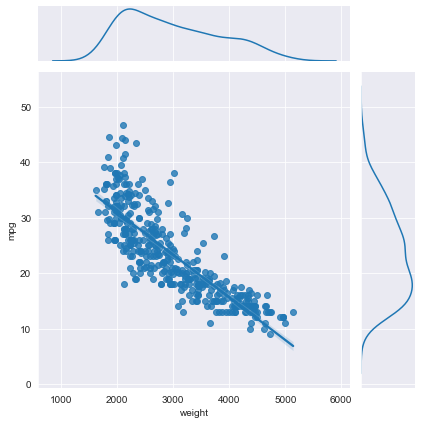

In [9]:
g = sns.JointGrid(data=cars, x='weight', y='mpg')
g.plot(sns.regplot, sns.kdeplot);

## Joint and Marginal Plots

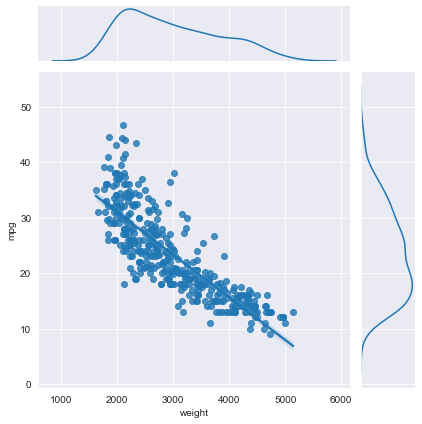

In [10]:
g = sns.JointGrid(data=cars, x='weight', y='mpg')
g.plot(sns.regplot, sns.kdeplot);

### `.plot_joint(), .plot_marginals()`

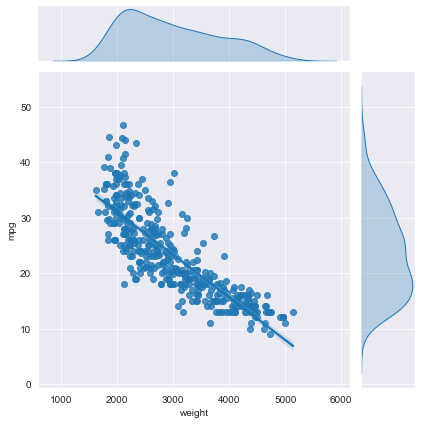

In [11]:
g = sns.JointGrid(data=cars, x='weight', y='mpg')
g.plot_joint(sns.regplot)
g.plot_marginals(sns.kdeplot, fill=True);  #syntax used to style plot types separately

### JointGrid Axes

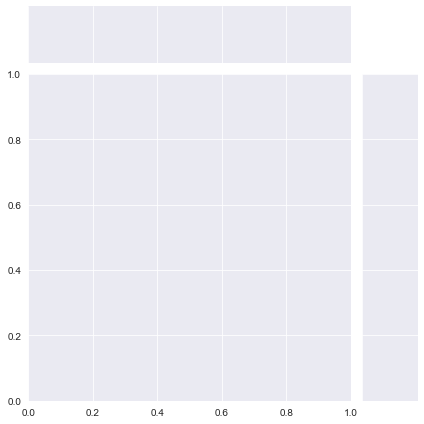

In [12]:
g = sns.JointGrid();

In [13]:
type(g.ax_marg_x)

matplotlib.axes._subplots.AxesSubplot

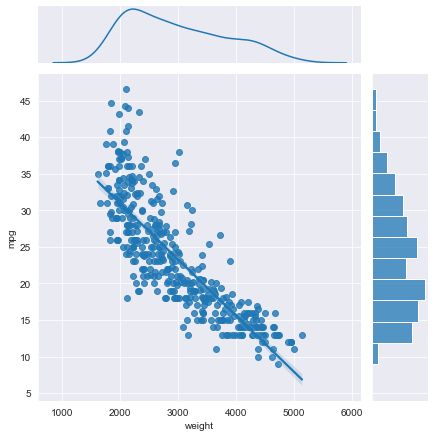

In [14]:
g = sns.JointGrid()
x, y = cars.weight, cars.mpg
sns.regplot(x=x, y=y, ax=g.ax_joint)
sns.kdeplot(x=x, ax=g.ax_marg_x)
sns.histplot(y=y, ax=g.ax_marg_y);

## Hue

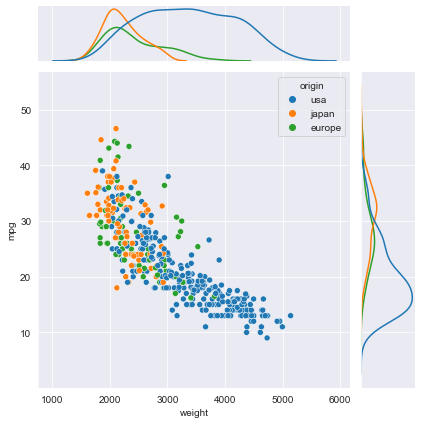

In [15]:
g = sns.JointGrid(data=cars, x='weight', y='mpg', hue='origin')
g.plot(sns.scatterplot, sns.kdeplot);

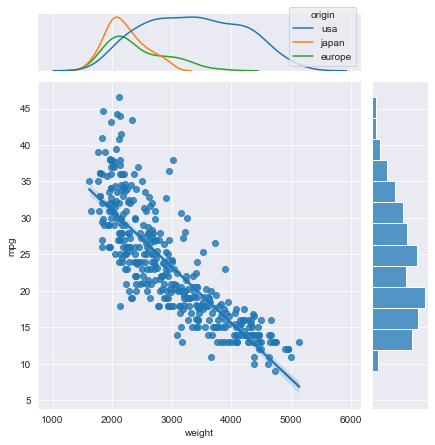

In [16]:
g = sns.JointGrid()
x, y = cars.weight, cars.mpg
sns.regplot(x=x, y=y, ax=g.ax_joint)
sns.kdeplot(x=x, ax=g.ax_marg_x, hue=cars.origin)  
sns.histplot(y=y, ax=g.ax_marg_y);

## Styling

### General Styling

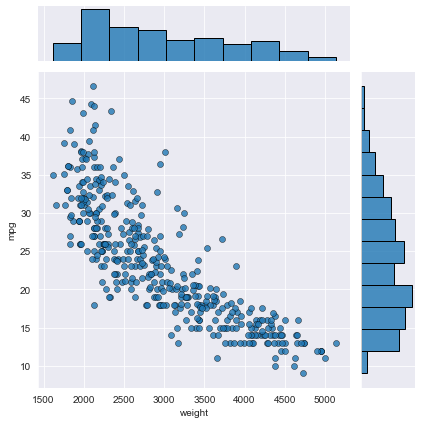

In [17]:
g = sns.JointGrid(data=cars, x='weight', y='mpg')
g.plot(sns.scatterplot, sns.histplot, alpha=0.8, edgecolor='black');

### Plot-specific Keywords

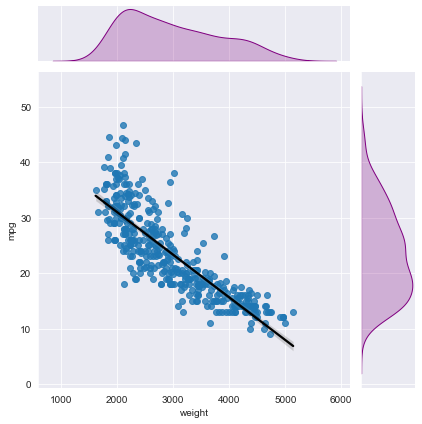

In [18]:
g = sns.JointGrid(data=cars, x='weight', y='mpg')
g.plot_joint(sns.regplot, line_kws={'color': 'black'})
g.plot_marginals(sns.kdeplot, fill=True, color='purple');

### Joint Grid Properties

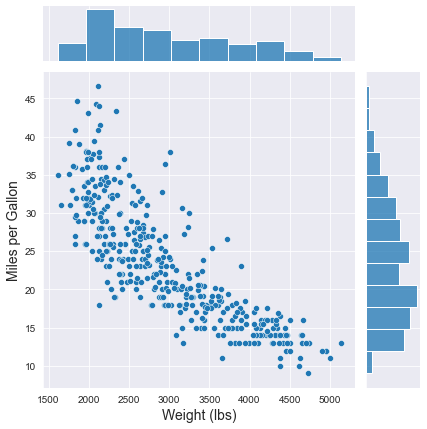

In [19]:
g = sns.JointGrid(data=cars, x='weight', y='mpg')
g.plot(sns.scatterplot, sns.histplot)
g.set_axis_labels(xlabel='Weight (lbs)', ylabel='Miles per Gallon', fontsize=14)
#g.savefig('Joint_Grid_Example.png');

In [20]:
#!ls J*

## Thumbnail and Overlays

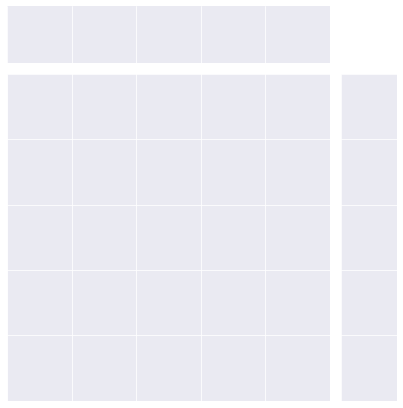

In [21]:
g = sns.JointGrid()
ax = g.ax_joint
ax.set_xticklabels([])
ax.set_yticklabels([]);
#g.savefig('25jointgrid_image_blank.png', dpi=200)

/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


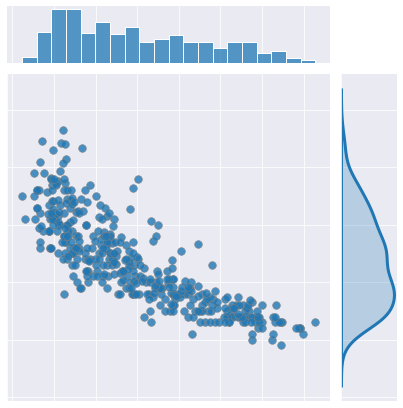

In [22]:
g = sns.JointGrid()
x,y = cars.weight, cars.mpg
sns.scatterplot(x, y, ax=g.ax_joint, s=60, alpha=0.8, ec='gray')
sns.histplot(x=x, ax=g.ax_marg_x, bins=20)
sns.kdeplot(y=y, ax=g.ax_marg_y, fill=True, lw=3)
g.set_axis_labels(xlabel='', ylabel='')

ax = g.ax_joint
ax.set_xticklabels([])
ax.set_yticklabels([]);
#g.savefig('25jointgrid_image_differentPlots.png', dpi=200);

### Thumbnail

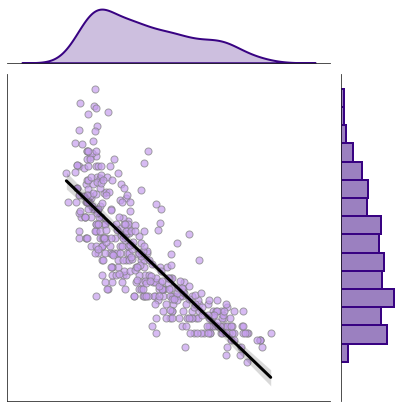

In [23]:
sns.set_style('white')

g = sns.JointGrid()
x,y = cars.weight, cars.mpg
sns.regplot(x=x, y=y, ax=g.ax_joint, ci=99, 
            scatter_kws={'color': 'xkcd:lavender', 'alpha': 0.7, 'ec': 'gray', 's': 50}, 
            line_kws={'color': 'black', 'lw': 3}
           )
sns.kdeplot(x=x, ax=g.ax_marg_x, fill=True, color='xkcd:indigo', lw=2 )
sns.histplot(y=y, bins=15, ax=g.ax_marg_y, lw=2, color='xkcd:indigo', alpha=0.5, ec='xkcd:indigo')
g.set_axis_labels(xlabel='', ylabel='')

ax = g.ax_joint
ax.set_xticklabels([])
ax.set_yticklabels([]);
#g.savefig('25jointgrid_image_thumb.png', dpi=200);

# Seaborn: Color Palettes

In [1]:
import seaborn as sns

In [2]:
tips = sns.load_dataset('tips')

In [3]:
tips.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


# Part One: Basics and Custom Palettes

## Basics

In [4]:
sns.set_style('whitegrid')

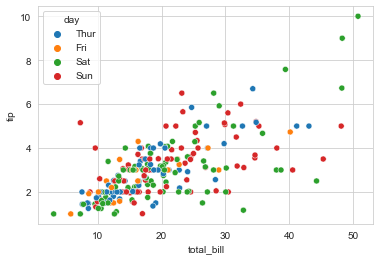

In [5]:
sns.scatterplot(x='total_bill', y='tip', data=tips, hue='day');

In [6]:
sns.color_palette()

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.7372549019607844, 0.7411764705882353, 0.13333333333333333),
 (0.09019607843137255, 0.7450980392156863, 0.8117647058823529)]

In [7]:
sns.color_palette('terrain')

[(0.011764705882352955, 0.5764705882352941, 0.9764705882352941),
 (0.1450980392156863, 0.8290196078431373, 0.42901960784313725),
 (0.7098039215686275, 0.9419607843137255, 0.5419607843137255),
 (0.8549019607843137, 0.8142745098039216, 0.5216470588235294),
 (0.5725490196078431, 0.45286274509803925, 0.36917647058823533),
 (0.7176470588235294, 0.6385882352941177, 0.6216470588235294)]

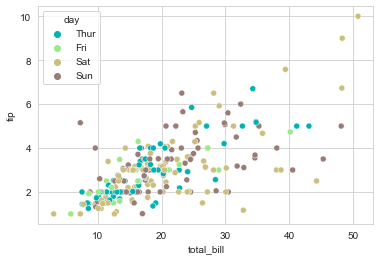

In [8]:
sns.scatterplot(x='total_bill', y='tip', data=tips, hue='day', palette='terrain');

### Available Palettes

You can check the palettes available in seaborn by deliberately passing a faulty palette name.  The error message lists all 170 named palettes.

You can also check out this [great post](https://medium.com/@morganjonesartist/color-guide-to-seaborn-palettes-da849406d44f) to see all 170.

In [9]:
sns.scatterplot(x='total_bill', y='tip', data=tips, hue='day', palette='k'); #error expected

ValueError: k is not a valid palette name

Palettes ending in "\_r" are the same palette but in reversed order.

In [10]:
sns.color_palette('terrain_r')

[(0.7176470588235294, 0.6385882352941177, 0.6216470588235294),
 (0.5725490196078431, 0.4528627450980392, 0.36917647058823533),
 (0.8549019607843138, 0.8142745098039216, 0.5216470588235294),
 (0.7098039215686274, 0.9419607843137255, 0.5419607843137255),
 (0.14509803921568631, 0.8290196078431373, 0.4290196078431373),
 (0.011764705882352941, 0.5764705882352941, 0.9764705882352941)]

### Extracting Colors as Variables

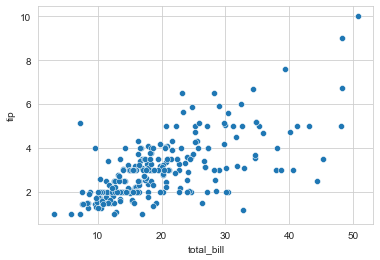

In [11]:
sns.scatterplot(x='total_bill', y='tip', data=tips);

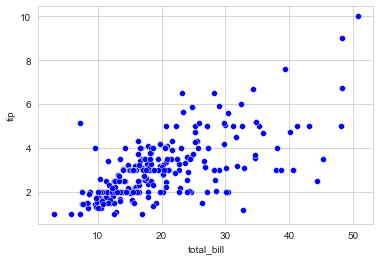

In [12]:
sns.scatterplot(x='total_bill', y='tip', data=tips, color='blue');

In [13]:
blue, orange = sns.color_palette()[:2]

In [14]:
blue

(0.12156862745098039, 0.4666666666666667, 0.7058823529411765)

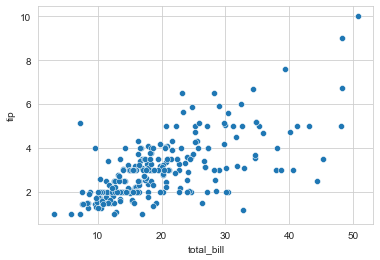

In [15]:
sns.scatterplot(x='total_bill', y='tip', data=tips, color=blue);

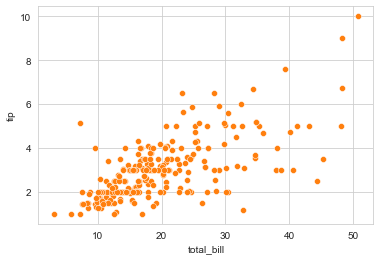

In [16]:
sns.scatterplot(x='total_bill', y='tip', data=tips, color=orange);

## Custom Palettes

### `color_palette()`

In [17]:
sns.color_palette('terrain', 10)

[(0.07973856209150328, 0.44052287581699345, 0.8405228758169935),
 (0.0, 0.6607843137254902, 0.8176470588235294),
 (0.08235294117647059, 0.8164705882352942, 0.41647058823529415),
 (0.4588235294117647, 0.891764705882353, 0.49176470588235294),
 (0.8196078431372549, 0.9639215686274509, 0.563921568627451),
 (0.9098039215686274, 0.8845490196078432, 0.5512941176470588),
 (0.7294117647058824, 0.6536470588235295, 0.4538823529411765),
 (0.5411764705882354, 0.41270588235294114, 0.3522352941176471),
 (0.6392156862745098, 0.5381960784313725, 0.5165490196078432),
 (0.8196078431372549, 0.7690980392156863, 0.7582745098039215)]

In [18]:
sns.color_palette('terrain', 4)

[(0.0, 0.7, 0.7),
 (0.6, 0.92, 0.52),
 (0.8, 0.744, 0.492),
 (0.6, 0.488, 0.46399999999999997)]

### `light_palette()` and `dark_palette()`

In [19]:
sns.light_palette('blue')

[(0.9427942677547513, 0.942825384792593, 0.9519953287278279),
 (0.754235414203801, 0.7542603078340744, 0.9615962629822623),
 (0.5656765606528508, 0.5656952308755558, 0.9711971972366967),
 (0.3771177071019005, 0.3771301539170372, 0.9807981314911312),
 (0.18855885355095026, 0.18856507695851854, 0.9903990657455656),
 (0.0, 0.0, 1.0)]

In [20]:
sns.dark_palette('crimson')

[(0.18827002942527166, 0.1342869812629642, 0.13772985866612683),
 (0.3231650431480605, 0.12311585952017529, 0.15724271046231322),
 (0.4580600568708493, 0.11194473777738637, 0.17675556225849964),
 (0.5929550705936381, 0.10077361603459745, 0.19626841405468604),
 (0.7278500843164268, 0.08960249429180853, 0.21578126585087243),
 (0.8627450980392157, 0.0784313725490196, 0.23529411764705882)]

### `blend_palette()`

In [21]:
sns.blend_palette(['blue', 'red'])

[(0.0, 0.0, 1.0),
 (0.2, 0.0, 0.8),
 (0.4, 0.0, 0.6),
 (0.6, 0.0, 0.4),
 (0.8, 0.0, 0.19999999999999996),
 (1.0, 0.0, 0.0)]

In [22]:
sns.blend_palette(['blue', 'red', 'yellow'], 10)

[(0.0, 0.0, 1.0),
 (0.2196078431372549, 0.0, 0.7803921568627451),
 (0.4392156862745098, 0.0, 0.5607843137254902),
 (0.6666666666666666, 0.0, 0.33333333333333337),
 (0.8862745098039215, 0.0, 0.11372549019607847),
 (1.0, 0.11372549019607843, 0.0),
 (1.0, 0.3333333333333333, 0.0),
 (1.0, 0.5607843137254902, 0.0),
 (1.0, 0.7803921568627451, 0.0),
 (1.0, 1.0, 0.0)]

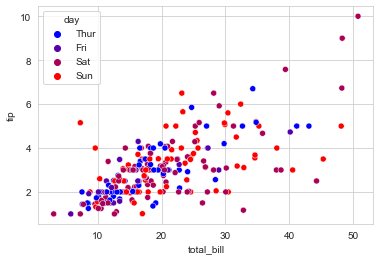

In [23]:
sns.scatterplot(x='total_bill', 
                y='tip', 
                data=tips, 
                hue='day',
                palette=sns.blend_palette(['blue', 'red'], 4)
               );

### Highlighting Palette

In [24]:
palette_dict = {x: 'gray' for x in tips.day.unique()}

In [25]:
palette_dict

{'Sun': 'gray', 'Sat': 'gray', 'Thur': 'gray', 'Fri': 'gray'}

In [26]:
palette_dict['Sat'] = 'crimson'

In [27]:
palette_dict

{'Sun': 'gray', 'Sat': 'crimson', 'Thur': 'gray', 'Fri': 'gray'}

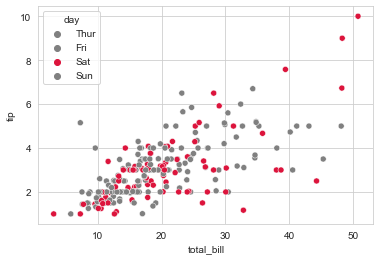

In [28]:
sns.scatterplot(x='total_bill', y='tip', data=tips, hue='day', palette=palette_dict);

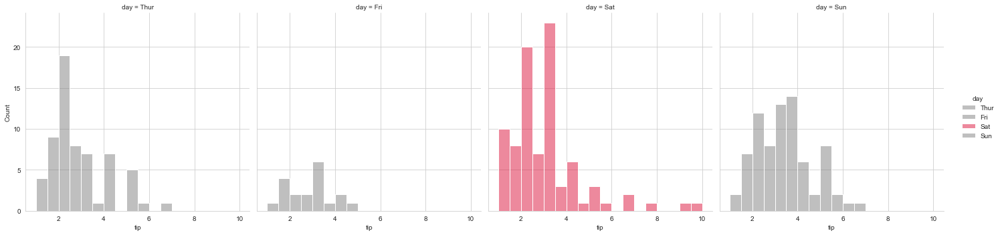

In [29]:
sns.displot(x='tip', data=tips, hue='day', col='day', palette=palette_dict);

# Part Two: Advanced Palettes and Palette Widgets

## Advanced Palettes

### `cubehelix_palette`

Based off of [cubehelix system created by Dave Green](https://ui.adsabs.harvard.edu/abs/2011BASI...39..289G/abstract).

This system creates a palette with linearly-increasing or -decreasing brightness, which means information can be preserved for both:
- black-and-white printers
- individuals experiencing colorblindness

In [30]:
sns.cubehelix_palette()

[[0.9312692223325372, 0.8201921796082118, 0.7971480974663592],
 [0.8559578605899612, 0.6418993116910497, 0.6754191211563135],
 [0.739734329496642, 0.4765280683170713, 0.5959617419736206],
 [0.57916573903086, 0.33934576125314425, 0.5219003947563425],
 [0.37894937987025, 0.2224702044652721, 0.41140014301575434],
 [0.1750865648952205, 0.11840023306916837, 0.24215989137836502]]

In [31]:
sns.cubehelix_palette(start=1)  

[[0.7742129266850253, 0.898618163798657, 0.8048335114656932],
 [0.6201831589020503, 0.7778209720909514, 0.5894038914248354],
 [0.5169654813082414, 0.6283863323666158, 0.38899728055126487],
 [0.43948012681696463, 0.46331587335022417, 0.23792755413957536],
 [0.3477339317010577, 0.28972843982521357, 0.13578256597646202],
 [0.21126132656158225, 0.13196527359152715, 0.07074286239714389]]

In [32]:
sns.cubehelix_palette(start=1, rot=1, light=0.75, dark=0.4, n_colors=10)  

[[0.8119066206230451, 0.699512742745189, 0.8786983192489379],
 [0.7445633058527953, 0.6692873261190314, 0.8679737025305014],
 [0.669187083999078, 0.6449528239346878, 0.8475601572978924],
 [0.5894295707954631, 0.6251849493967849, 0.8146017431816268],
 [0.5094733721889907, 0.6081170208220943, 0.7677035872449477],
 [0.433547561856402, 0.5915611213567767, 0.7070670847275126],
 [0.36544702214027847, 0.5732601451330271, 0.634448898575594],
 [0.30810543811750724, 0.5511441232205231, 0.5529506765229713],
 [0.2632658761794211, 0.5235640916826487, 0.4666630846787446],
 [0.2312828968499689, 0.48947916994159585, 0.3802020749133488]]

A shorthand string can also be passed to `color_palette()` to achieve the same effect.

In [33]:
sns.color_palette('ch:1,r=1,l=0.75,d=0.4', 10)  

[(0.8119066206230451, 0.699512742745189, 0.8786983192489379),
 (0.7445633058527953, 0.6692873261190314, 0.8679737025305014),
 (0.669187083999078, 0.6449528239346878, 0.8475601572978924),
 (0.5894295707954631, 0.6251849493967849, 0.8146017431816268),
 (0.5094733721889907, 0.6081170208220943, 0.7677035872449477),
 (0.433547561856402, 0.5915611213567767, 0.7070670847275126),
 (0.36544702214027847, 0.5732601451330271, 0.634448898575594),
 (0.30810543811750724, 0.5511441232205231, 0.5529506765229713),
 (0.2632658761794211, 0.5235640916826487, 0.4666630846787446),
 (0.2312828968499689, 0.48947916994159585, 0.3802020749133488)]

### `husl_palette()`

Based off of the HUSL color system (now re-named HSLuv), a human-friendly version of HSL color system.  

Retrieve evenly spaced colors from the HUSL color space.  Arguments include:
- `h`: first hue, starting color
- `s`: saturation (0 = grayer, 1 = more colorful)
- `l`: lightness (0 = dark, 1 = light)

In [34]:
sns.husl_palette()

[(0.9677975592919913, 0.44127456009157356, 0.5358103155058701),
 (0.7350228985632719, 0.5952719904750953, 0.1944419133847522),
 (0.3126890019504329, 0.6928754610296064, 0.1923704830330379),
 (0.21044753832183283, 0.6773105080456748, 0.6433941168468681),
 (0.23299120924703914, 0.639586552066035, 0.9260706093977744),
 (0.9082572436765556, 0.40195790729656516, 0.9576909250290225)]

In [35]:
sns.husl_palette(h=0.5, s=0.5, l=0.4) 

[(0.2614422400055648, 0.38989777382499674, 0.3725526856105877),
 (0.27419971520893205, 0.3767079524607375, 0.46734637038810706),
 (0.4934091292866091, 0.28717640912907444, 0.5357036674304584),
 (0.5830245350246458, 0.26152534428138224, 0.3382698281105889),
 (0.42070574434226643, 0.35724203999530835, 0.25099612366693136),
 (0.28754579420166254, 0.3942478759841695, 0.24952022598321888)]

### `xkcd_palette()`

Colors based off of the results of the [xkcd color survey](https://blog.xkcd.com/2010/05/03/color-survey-results/).

You can check out [this full table](https://xkcd.com/color/rgb/) of available xkcd colors.

In [36]:
sns.xkcd_palette(['neon pink', 'denim', 'bright violet', 'melon', 'fresh green'])

[(0.996078431372549, 0.00392156862745098, 0.6039215686274509),
 (0.23137254901960785, 0.38823529411764707, 0.5490196078431373),
 (0.6784313725490196, 0.0392156862745098, 0.9921568627450981),
 (1.0, 0.47058823529411764, 0.3333333333333333),
 (0.4117647058823529, 0.8470588235294118, 0.30980392156862746)]

### `crayon_palette()`

Color names from [standard Crayola crayons](https://en.wikipedia.org/wiki/List_of_Crayola_crayon_colors).

In [37]:
sns.crayon_palette(
    ['Jazzberry Jam', 'Macaroni and Cheese', 'Cerulean', "Purple Mountains' Majesty"]
)

[(0.792156862745098, 0.21568627450980393, 0.403921568627451),
 (1.0, 0.7411764705882353, 0.5333333333333333),
 (0.11372549019607843, 0.6745098039215687, 0.8392156862745098),
 (0.615686274509804, 0.5058823529411764, 0.7294117647058823)]

### `color_palette()`

You can also pass a list colors to seaborn's regular `color_palette()` function.  This accepts:
- [Matplotlib color names](https://matplotlib.org/stable/gallery/color/named_colors.html)
- [HTML hex colors](https://htmlcolorcodes.com/)

In [38]:
sns.color_palette(['red', '#33AAFF', '#FFDD33'])

[(1.0, 0.0, 0.0),
 (0.2, 0.6666666666666666, 1.0),
 (1.0, 0.8666666666666667, 0.2)]

## Color Palette Widgets

In [39]:
brew_palette = sns.choose_colorbrewer_palette('diverging');  

interactive(children=(Dropdown(description='name', options=('RdBu', 'RdGy', 'PRGn', 'PiYG', 'BrBG', 'RdYlBu', …

In [40]:
tips.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


You must pass a 4-color palette to the figure below since there are four categories in "day".

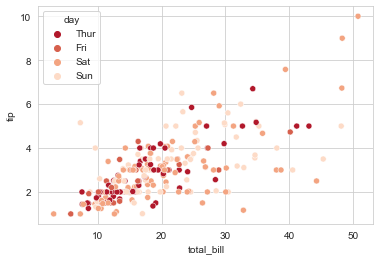

In [41]:
sns.scatterplot(data=tips, x='total_bill', y='tip', hue='day', palette=brew_palette[:4]);

In [42]:
ch_palette = sns.choose_cubehelix_palette()

interactive(children=(IntSlider(value=9, description='n_colors', max=16, min=2), FloatSlider(value=0.0, descri…

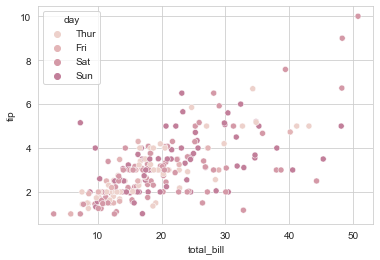

In [43]:
sns.scatterplot(data=tips, x='total_bill', y='tip', hue='day', palette=ch_palette[:4]);